<div style="display: flex; background-color: skyblue;" >
<h1 style="margin: auto; padding: 30px; "> P11 -NB1- Produisez une étude de marché avec R ou Python</h1></div>

In [1]:
!where python

D:\Programmes2\Anaconda3\python.exe
C:\Users\matth\AppData\Local\Programs\Python\Python310\python.exe
C:\Users\matth\AppData\Local\Microsoft\WindowsApps\python.exe


<u>**Remarque :**</u>  
Pour des raisons de lisibilité des parties ont été masquées.
Elles peuvent être démasquées directement sur le Notebook .ipynb

**CHOIX DE L'ANNEE d'ETUDE : 2022**  
C'est l'année la plus récente pour laquelle la plupart des donnnées son connues.  
Dans l'étude, nous chercherons à avoir des données cohérentes au niveau de l'année,  
surtout lorsqu'elle doivent être combinées, comme par exemple la population et le PIB par exemple etc...  

Cependant pour certains informations indépendantes, 
comme par exemple la stabilité du pays, nosu prendrons les données les plus récentes possible.

**MODIFICATION :**  
Sortie avec un libellé `Prox_geo_Commercial_Fra(km)` au lieu de `dist_Commerciale_Fra (km)`

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 1 - Import des librairies et chargement des fichiers</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.1 - Désactivation des Warnings déjà lus si nécessaire</h3>
</div>

##### <u>*DESACTIVATIONS DE WARNINGS déjà lu pour LISISBILITE :*</u>

Source :
https://saturncloud.io/blog/how-to-disable-warnings-in-jupyter-notebook/

https://docs.python.org/fr/3/library/warnings.html

default => Show all warnings (even those ignored by default)
ignore => Ignore all warnings
error => Convert all warnings to errors
error::ResourceWarning => Treat ResourceWarning messages as errors
default::DeprecationWarnig => Show DeprecationWarning messages
ignore,default:::mymodule => Only report warnings triggered by "mymodule"
error:::mymodule => Convert warnings to errors in "mymodule"

In [2]:
# import warnings

In [3]:
# Suppress all warnings

#warnings.filterwarnings('ignore')

In [4]:
# Restore the warning behaviour to default : Show all warnings (even those ignored by default)

#warnings.filterwarnings('ignore')

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.2 - Import des librairies</h3>
</div>

In [5]:
#Import de la librairie expression régulières
import re

In [6]:
#Import de la librairie Numpy
import numpy as np

In [7]:
#Import de la librairie Pandas
import pandas as pd

In [8]:
#Import de scipy.stats
import scipy.stats as st

In [9]:
#Test outil EDA #Ne marche pas,nécessite probabelement un téléchargement, voir si vraiment besoin avant
#from ydata_profiling import ProfileReport

##### **Fonction utile pour itérer avec 2 entrées :**  
utile pour le merge de 10 fichiers

In [10]:
#Fonction utile pour itérer une fonction prenant 2 variables sur une liste (ex suite de fibonacci) :
from functools import reduce

##### **Pour les Graphiques :**

In [11]:
#Import de la librairie matplotlib.pyplot
import matplotlib.pyplot as plt

In [12]:
#Import de seaborn 
import seaborn as sns

In [13]:
#Import de plotly.express
import plotly.express as px

In [14]:
#IMPORT matplotlib.dates (gestion des dates) si nécessaire
#import matplotlib.dates as mdates

In [15]:
#PARAMETRAGE GENERAL de SEABORN

sns.set_theme(style='dark', palette='muted')
#plt.rcParams.update({'font.size' : 14,'axes.labelcolor':'firebrick','axes.titlecolor':'firebrick','figure.titlesize':16})
plt.rcParams.update({'font.size' : 12,'figure.titlesize':14,'axes.labelcolor':'navy','axes.titlecolor':'navy'})

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.3 - Import de Fonctions personnelles </h3>
</div>

##### FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :

In [16]:
# FONCTION PERSONNELLE D'ANALYSE DE FICHIERS :

#import pandas as pd
#import numpy as np
#import re

def Description_Fichier_Tableau_avc_ValBlanches(Data):
    """
    fonction permettant d'analyser un Dataframe DF.
    Elle prend en entrée le dataframe DF.
    Elle nécessite d'avoir chargé la librairie des expressions regulières : import re
    Et renvoie en sortie un dataframe DF2 avec pour chacune des colonnes de DF, les informations suivantes :
    'Type': type de la colonne
    'Nb lignes' : nbre de lignes total de la colonne
    'Valeurs non-vides' : nbre de valeurs non-vides dans la colonne au sens de la fonction pandas.Series.notna()
    'Valeurs vides' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.isna()
    'Valeurs distinctes' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.unique()
    'Valeurs blanches' : nbre de valeurs blanches dans la colonne au sens de le regular expression r"\A[\s]*$"
    c'est à dire au sens de uniquement une nombres quelconque de caractères blancs y compris aucun ''

    """

    
    re2 = r"\A[\s]*$"
    FICHIER = pd.DataFrame(Data)
    #création d'un DataFrame qui va contenir les colonnes du Fichier en Index, 
    #et la description des lignes dans les colonnes
    Tab_Descriptif = pd.DataFrame(index = FICHIER.columns, 
                                  columns=['Type','Nb lignes',
                                           'Valeurs non-vides','Valeurs vides',
                                           'Valeurs distinctes','Valeurs blanches'])

    #remplissage des lignes
    for elt in FICHIER.columns :
        col_string = (FICHIER[elt]).astype('string')
        Tab_Descriptif.loc[elt,:] = [FICHIER[elt].dtypes, len(FICHIER[elt]) , 
                                     FICHIER[elt].notna().sum() ,FICHIER[elt].isna().sum(),
                                     len(FICHIER[elt].unique()),col_string.str.match(re2).sum() ]

    #print(Tab_Descriptif)
    return Tab_Descriptif
    

<>:8: SyntaxWarning: invalid escape sequence '\A'
<>:8: SyntaxWarning: invalid escape sequence '\A'
C:\Users\matth\AppData\Local\Temp\ipykernel_9704\511367401.py:8: SyntaxWarning: invalid escape sequence '\A'
  """


L'alerte ne vaut que pour le texte de la description de fonction!

##### FONCTION PERSONNELLE D'ANALYSE DE FICHIERS -TENTATIVE AMELIORATION EFFICACITE:

In [17]:
# FONCTION PERSONNELLE D'ANALYSE DE FICHIERS-TENTATIVE MAELIORATION :

#import pandas as pd
#import numpy as np
#import re

def Description_Fichier_Tableau_avc_ValBlanches_V2_1(data):
    """
    fonction permettant d'analyser un Dataframe DF.
    Elle prend en entrée le dataframe DF.
    Elle nécessite d'avoir chargé la librairie des expressions regulières : import re
    Et renvoie en sortie un dataframe DF2 avec pour chacune des colonnes de DF, les informations suivantes :
    'Type': type de la colonne
    'Nb lignes' : nbre de lignes total de la colonne
    'Valeurs non-vides' : nbre de valeurs non-vides dans la colonne au sens de la fonction pandas.Series.notna()
    'Valeurs vides' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.isna()
    'Valeurs distinctes' : nbre de valeurs vides dans la colonne au sens de la fonction pandas.Series.unique()
    'Valeurs blanches' : nbre de valeurs blanches dans la colonne au sens de le regular expression r"\A[\s]*$"
    c'est à dire au sens de uniquement une nombres quelconque de caractères blancs y compris aucun ''

    """
    # Normalisation d'entrée : Series -> DataFrame, ndarray -> DataFrame
    if isinstance(data, pd.Series):
        df = data.to_frame(name=data.name if data.name else "col_0")
    elif isinstance(data, np.ndarray):
        if data.ndim == 1:
            df = pd.DataFrame(data, columns=["col_0"])
        else:
            df = pd.DataFrame(data)
    elif isinstance(data, pd.DataFrame):
        df = data
    else:
        raise ValueError("Type de donnée non supporté. Utilisez un DataFrame, Series ou ndarray.")

    regex_blanc = re.compile(r"\A[\s]*$")
    results = []

    for col in df.columns:
        serie = df[col]
        col_type = serie.dtype
        nb_total = len(serie)
        nb_notna = serie.notna().sum()
        nb_na = serie.isna().sum()
        nb_unique = serie.nunique(dropna=True)
        
        # Vérification uniquement sur les chaînes de caractères
        if pd.api.types.is_string_dtype(serie) or pd.api.types.is_object_dtype(serie):
            nb_blancs = serie.apply(lambda x: bool(regex_blanc.match(str(x)))).sum()
        else:
            nb_blancs = np.nan

        results.append([
            col_type, nb_total, nb_notna, nb_na, nb_unique, nb_blancs
        ])

    Tab_Descriptif = pd.DataFrame(
        results,
        index=df.columns,
        columns=[
            "Type",
            "Nb lignes",
            "Valeurs non-vides",
            "Valeurs vides",
            "Valeurs distinctes",
            "Valeurs blanches"
        ]
    )

    return Tab_Descriptif


<>:8: SyntaxWarning: invalid escape sequence '\A'
<>:8: SyntaxWarning: invalid escape sequence '\A'
C:\Users\matth\AppData\Local\Temp\ipykernel_9704\28862795.py:8: SyntaxWarning: invalid escape sequence '\A'
  """


In [18]:
# FONCTION PERSONNELLE DE PREMIERE ANALYSE :

#import pandas as pd
#import numpy as np

def Premieres_Analyses(df_etude):
    """
    fonction regroupant les premières analyses.
    Elle prend en entrée le dataframe DF,
    et applique les instances et méthode intégrées : .shape  .info() .describe()
    et ma méthode personnelle Description_Fichier_Tableau_avc_ValBlanches_V2_1
    Il n'y a pas de sortie, que de l'affichage

    """
    print("\n----","SHAPE","----")
    display(df_etude.shape)
    print("\n----","INFO","----")
    df_etude.info()
    print("\n----","DESCRIBE","----")
    display(df_etude.describe())
    print("\n----","DESCRIPTION","----")
    display(Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_etude))

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.4 - Lexique des DataFrames </h3>
</div>

##### <font color='green'><u>**LEXIQUE DES PRINCIPAUX DATAFRAMES :**<u></font>

##### <font color='blue'><u>**DATAFRAME PRE-JOINTURE :**</u></font>  

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">1.5 - Chargement des fichiers fournis : 2017 non utilisés</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.5.1 - Import du Fichier DisponibiliteAlimentaire_2017.csv : df_Dispo_Alim </h4>
</div>

In [19]:
#Importation du fichier DisponibiliteAlimentaire_2017.csv A NETTOYER
df_Dispo_Alim = pd.read_csv(r"D:\BDD\OCR\P11\DisponibiliteAlimentaire_2017.csv", sep = ',')

In [20]:
df_Dispo_Alim.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5511,Production,2511,Blé et produits,2017,2017,Milliers de tonnes,4281.0,S,Données standardisées
1,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5611,Importations - Quantité,2511,Blé et produits,2017,2017,Milliers de tonnes,2302.0,S,Données standardisées
2,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5072,Variation de stock,2511,Blé et produits,2017,2017,Milliers de tonnes,-119.0,S,Données standardisées
3,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5911,Exportations - Quantité,2511,Blé et produits,2017,2017,Milliers de tonnes,0.0,S,Données standardisées
4,FBS,Nouveaux Bilans Alimentaire,2,Afghanistan,5301,Disponibilité intérieure,2511,Blé et produits,2017,2017,Milliers de tonnes,6701.0,S,Données standardisées


In [21]:
df_Dispo_Alim.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176600 entries, 0 to 176599
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Code Domaine            176600 non-null  object 
 1   Domaine                 176600 non-null  object 
 2   Code zone               176600 non-null  int64  
 3   Zone                    176600 non-null  object 
 4   Code Élément            176600 non-null  int64  
 5   Élément                 176600 non-null  object 
 6   Code Produit            176600 non-null  int64  
 7   Produit                 176600 non-null  object 
 8   Code année              176600 non-null  int64  
 9   Année                   176600 non-null  int64  
 10  Unité                   176600 non-null  object 
 11  Valeur                  176600 non-null  float64
 12  Symbole                 176600 non-null  object 
 13  Description du Symbole  176600 non-null  object 
dtypes: float64(1), int64

In [22]:
df_Dispo_Alim.describe()

,Code zone,Code Élément,Code Produit,Code année,Année,Valeur
count,176600.000000,176600.000000,176600.000000,176600.0,176600.0,176600.000000
mean,125.474740,3810.052894,2628.778545,2017.0,2017.0,210.554918
std,72.941699,2211.790089,91.993247,0.0,0.0,4762.047787
min,1.000000,645.000000,2511.000000,2017.0,2017.0,-10388.000000
25%,63.000000,684.000000,2556.000000,2017.0,2017.0,0.000000
50%,120.000000,5142.000000,2612.000000,2017.0,2017.0,0.120000
75%,188.000000,5301.000000,2732.000000,2017.0,2017.0,8.462500
max,276.000000,5911.000000,2899.000000,2017.0,2017.0,758548.000000


##### TEST FONCTIONS PERSONNELLES :

In [23]:
Description_Fichier_Tableau_avc_ValBlanches(df_Dispo_Alim)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,176600,176600,0,1,0
Domaine,object,176600,176600,0,1,0
Code zone,int64,176600,176600,0,174,0
Zone,object,176600,176600,0,174,0
Code Élément,int64,176600,176600,0,17,0
Élément,object,176600,176600,0,17,0
Code Produit,int64,176600,176600,0,98,0
Produit,object,176600,176600,0,98,0
Code année,int64,176600,176600,0,1,0
Année,int64,176600,176600,0,1,0


In [24]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Dispo_Alim)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,176600,176600,0,1,0.0
Domaine,object,176600,176600,0,1,0.0
Code zone,int64,176600,176600,0,174,NaN
Zone,object,176600,176600,0,174,0.0
Code Élément,int64,176600,176600,0,17,NaN
Élément,object,176600,176600,0,17,0.0
Code Produit,int64,176600,176600,0,98,NaN
Produit,object,176600,176600,0,98,0.0
Code année,int64,176600,176600,0,1,NaN
Année,int64,176600,176600,0,1,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 1.5.1 - Import du Fichier Population_2000_2018 : df_Population_2000_2018 </h4>
</div>

In [25]:
#Importation du fichier Population_2000_2018.csv A NETTOYER
df_Population_2000_2018 = pd.read_csv(r"D:\BDD\OCR\P11\Population_2000_2018.csv", sep = ',')

In [26]:
df_Population_2000_2018.head()

,Code Domaine,Domaine,Code zone,Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2000,2000,1000 personnes,20779.953,X,Sources internationales sûres,NaN
1,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2001,2001,1000 personnes,21606.988,X,Sources internationales sûres,NaN
2,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2002,2002,1000 personnes,22600.770,X,Sources internationales sûres,NaN
3,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2003,2003,1000 personnes,23680.871,X,Sources internationales sûres,NaN
4,OA,Séries temporelles annuelles,2,Afghanistan,511,Population totale,3010,Population-Estimations,2004,2004,1000 personnes,24726.684,X,Sources internationales sûres,NaN


In [27]:
df_Population_2000_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4411 entries, 0 to 4410
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            4411 non-null   object 
 1   Domaine                 4411 non-null   object 
 2   Code zone               4411 non-null   int64  
 3   Zone                    4411 non-null   object 
 4   Code Élément            4411 non-null   int64  
 5   Élément                 4411 non-null   object 
 6   Code Produit            4411 non-null   int64  
 7   Produit                 4411 non-null   object 
 8   Code année              4411 non-null   int64  
 9   Année                   4411 non-null   int64  
 10  Unité                   4411 non-null   object 
 11  Valeur                  4411 non-null   float64
 12  Symbole                 4411 non-null   object 
 13  Description du Symbole  4411 non-null   object 
 14  Note                    258 non-null    

In [28]:
df_Population_2000_2018.describe()

,Code zone,Code Élément,Code Produit,Code année,Année,Valeur
count,4411.000000,4411.0,4411.0,4411.000000,4411.000000,4.411000e+03
mean,132.202902,511.0,3010.0,2009.068238,2009.068238,2.963004e+04
std,75.854840,0.0,0.0,5.481539,5.481539,1.238029e+05
min,1.000000,511.0,3010.0,2000.000000,2000.000000,7.850000e-01
25%,68.000000,511.0,3010.0,2004.000000,2004.000000,3.921890e+02
50%,132.000000,511.0,3010.0,2009.000000,2009.000000,4.764741e+03
75%,195.000000,511.0,3010.0,2014.000000,2014.000000,1.821548e+04
max,299.000000,511.0,3010.0,2018.000000,2018.000000,1.427648e+06


<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 2 - Sélection/Chargement/Nettoyage des fichiers sources choisis (2022+)</h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.1 - Sélection de VARIABLES PESTEL et SOURCES :</h3>
</div>

##### **Séléction de VARIABLES PESTEL et SOURCES :**

In [29]:
#PRESENTATION DES VARIABLES CHOISISES ET SOURCES:

#cols_needed = ['Col1', 'Col2']
df_choix_variable = pd.read_excel(r"D:\BDD\OCR\P11\Choix_Variables_2.6.xlsx", 
                                  sheet_name='Selection_2'#, usecols=cols_needed
                                 )
display(df_choix_variable)

,DOMAINES INTERESSANTS,sous-domaine,Source,Domaine,Élément,Produit,Ref Pays,Année(s),Selection\npour étude,Nom du fichier local,Lien Site Source,Note
0,02 - Taille du Marché,A - Population,FAO,OA -Séries temporelles annuelles,511-Population totale,3010 - Population-Estimations,ISO3,2022.0,OUI,FAOSTAT_OA_2021_2022_2023.csv,https://www.fao.org/faostat/fr/#data/OA,Favoriser un marché avec un potentiel de conso...
1,03 - Saturation intérieur du marché du poulet,A - Importation Poulet,FAO,TCL-Cultures et produits animaux,5622-Importations - valeur,"21121-Viande, poulet, fraîche ou réfrigérée",ISO3,2022.0,OUI,FAOSTAT_TCL_2022.csv,https://www.fao.org/faostat/fr/#data/TCL,Favoriser un marché avec un défaut de producti...
2,03 - Saturation intérieur du marché du poulet,B - Exportation poulet,FAO,TCL-Cultures et produits animaux,5922-Exportations - valeur,"21121-Viande, poulet, fraîche ou réfrigérée",ISO3,2022.0,OUI,FAOSTAT_TCL_2022.csv,https://www.fao.org/faostat/fr/#data/TCL,Favoriser un marché avec un défaut de producti...
3,04 - Richesse du marché,PIB par habitant,FAO,MK - Indicateurs macro,6119 - Valeur US $ par habitant,22008 - Produit Intérieur Brut,ISO3,2022.0,OUI,FAOSTAT_MK_PIB_2022.csv,https://www.fao.org/faostat/fr/#data/MK,Favoriser un pays ou le consommateurs auront d...
4,04 - Richesse du marché,((croissance du PIB par habitant)),FAO,MK - Indicateurs macro,61290 - Croissance annuelle US$ par habitant,22008 - Produit Intérieur Brut,ISO3,2022.0,Probable,FAOSTAT_MK_PIB_2022.csv,https://www.fao.org/faostat/fr/#data/MK,Favoriser un pays ou le consommateurs auront d...
5,05 - Présence du poulet,A - Part de la consommation de poulet dans l’a...,FAO,FBS - Bilans Alimentaires (2010-),664-Disponibilité alimentaire (Kcal/personne/j...,S2734 - Viande de Volailles,ISO3,2022.0,OUI,FAOSTAT_FBS_Part_Poulet_2022.csv,https://www.fao.org/faostat/fr/#data/FBS,Pénétrer un marché qui consomme déjà un peu de...
6,05 - Présence du poulet,A - Part de la consommation de poulet dans l’a...,FAO,FBS - Bilans Alimentaires (2010-),664 - Disponibilité alimentaire (Kcal/personne...,S2901-Total General,ISO3,2022.0,OUI,FAOSTAT_FBS_Part_Poulet_2022.csv,https://www.fao.org/faostat/fr/#data/FBS,Pénétrer un marché qui consomme déjà un peu de...
7,09 - Positionnement bio,A - Part de personnes ayant accès à une alimen...,FAO,CAHD-Coût et abordabilité d’une alimentation s...,6121 - Valeur,"7005 - Prevalence of unaffordability (PUA), pe...",ISO3,2022.0,OUI,FAOSTAT_CAHD_Positionnement_bio_2022.csv,https://www.fao.org/faostat/fr/#data/CAHD,NaN
8,09 - Positionnement bio,B - Taille-Nombre de personnes ayant accès à u...,FAO,CAHD-Coût et abordabilité d’une alimentation s...,6132 - Valeur,7006 - Number of people unable to afford a hea...,ISO3,2022.0,OUI,FAOSTAT_CAHD_Positionnement_bio_2022.csv,https://www.fao.org/faostat/fr/#data/CAHD,NaN
9,10 - Facilité de Commerce francais\n+ Position...,A - Export provenant de la France -Quantité,FAO,TM - Matrices du commerce détaillées,5910 - Exportations - quantité,"21121 - Viande, poulet, fraîche ou réfrigérée",ISO3,2022.0,OUI,FAOSTAT_TM_CommFRA_PosPrix_2022.csv,https://www.fao.org/faostat/fr/#data/TM,utile pour connaitre les pays d'export majorit...


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.2 - Chargement/Nettoyage/Feature Engineering 1 des fichiers sources choisis (2022+)</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.1 - Donnees Generales sur un Pays -Source CEPII : CEPII_geo_cepii.xls</h4>
</div>

- Thème : Informations Générales Pays  
- Site : CEPII  
- Source :

https://www.cepii.fr/CEPII/fr/bdd_modele/bdd_modele_item.asp?id=6
Documentation de la source :
https://www.cepii.fr/PDF_PUB/wp/2011/wp2011-25.pdf

- Données :  
La base de données (geo_cepii) inclut des variables géographiques au niveau pays, pour 225 Etats. 
Parmi elles, les codes iso, les noms, les coordonnées géographiques de leur capitale, les langues parlées dans le pays, les liens coloniaux, et une variable indiquant si le pays est enclavé.   

- Fichier local : CEPII_geo_cepii.xls   

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [30]:
#CHARGEMENT de CEPII_geo_cepii.xls

#cols_needed = ['Col1', 'Col2']
df_geo_cepii = pd.read_excel(r"D:\BDD\OCR\P11\Selection_Sources\CEPII_geo_cepii.xlsx"#,#sheet_name='Selection_2'#, usecols=cols_needed
                                 )
df_geo_cepii.head(5)

,iso2,iso3,cnum,country,pays,area,dis_int,landlocked,continent,city_en,...,lang9_2,lang9_3,lang9_4,colonizer1,colonizer2,colonizer3,colonizer4,short_colonizer1,short_colonizer2,short_colonizer3
0,AW,ABW,533,Aruba,Aruba,193,5.225315,0,America,Oranjestad,...,.,.,.,NLD,.,.,.,.,.,.
1,AF,AFG,4,Afghanistan,Afghanistan,652225,303.761400,1,Asia,Kabul,...,Uzbek,.,.,.,.,.,.,GBR,.,.
2,AO,AGO,24,Angola,Angola,1246700,419.966600,0,Africa,Luanda,...,.,.,.,PRT,.,.,.,.,.,.
3,AI,AIA,660,Anguilla,Anguilla,102,3.798690,0,America,The Valley,...,.,.,.,GBR,.,.,.,.,.,.
4,AL,ALB,8,Albania,Albanie,28748,63.773110,0,Europe,Tirana,...,.,.,.,TUR,.,.,.,.,.,.


In [31]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,object,238,237,1,224,0.0
iso3,object,238,238,0,225,0.0
cnum,int64,238,238,0,225,NaN
country,object,238,238,0,225,0.0
pays,object,238,238,0,225,0.0
area,int64,238,238,0,224,NaN
dis_int,float64,238,238,0,224,NaN
landlocked,int64,238,238,0,2,NaN
continent,object,238,238,0,6,0.0
city_en,object,238,238,0,235,0.0


In [32]:
df_geo_cepii.columns

Index(['iso2', 'iso3', 'cnum', 'country', 'pays', 'area', 'dis_int',
       'landlocked', 'continent', 'city_en', 'city_fr', 'lat', 'lon', 'cap',
       'maincity', 'citynum', 'langoff_1', 'langoff_2', 'langoff_3',
       'lang20_1', 'lang20_2', 'lang20_3', 'lang20_4', 'lang9_1', 'lang9_2',
       'lang9_3', 'lang9_4', 'colonizer1', 'colonizer2', 'colonizer3',
       'colonizer4', 'short_colonizer1', 'short_colonizer2',
       'short_colonizer3'],
      dtype='object')

In [33]:
liste_col_temp = ['iso2', 'iso3', 'cnum', 'country', 'pays','area','continent', 
                  'city_en', 'city_fr','cap','maincity', 'langoff_1']
df_geo_cepii[liste_col_temp].head()

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [34]:
#CHOIX DE COLONNES :

liste_col_temp = ['iso2', 'iso3', 'cnum', 'country', 'pays','area','continent', 
                  'city_en', 'city_fr','cap','maincity', 'langoff_1']
df_geo_cepii_analyse_1_1 = df_geo_cepii[liste_col_temp].copy(deep=True)
df_geo_cepii_analyse_1_1.head()

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [35]:
df_geo_cepii_analyse_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238 entries, 0 to 237
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   iso2       237 non-null    object
 1   iso3       238 non-null    object
 2   cnum       238 non-null    int64 
 3   country    238 non-null    object
 4   pays       238 non-null    object
 5   area       238 non-null    int64 
 6   continent  238 non-null    object
 7   city_en    238 non-null    object
 8   city_fr    238 non-null    object
 9   cap        238 non-null    int64 
 10  maincity   238 non-null    int64 
 11  langoff_1  238 non-null    object
dtypes: int64(4), object(8)
memory usage: 22.4+ KB


In [36]:
df_geo_cepii_analyse_1_1.describe()

,cnum,area,cap,maincity
count,238.000000,2.380000e+02,238.000000,238.000000
mean,436.298319,7.581392e+05,0.995798,0.945378
std,256.734227,2.056226e+06,0.234168,0.227720
min,4.000000,7.000000e+00,0.000000,0.000000
25%,212.500000,9.551250e+03,1.000000,1.000000
50%,432.000000,1.058540e+05,1.000000,1.000000
75%,657.750000,5.385482e+05,1.000000,1.000000
max,931.000000,1.707540e+07,2.000000,1.000000


In [37]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,object,238,237,1,224,0.0
iso3,object,238,238,0,225,0.0
cnum,int64,238,238,0,225,NaN
country,object,238,238,0,225,0.0
pays,object,238,238,0,225,0.0
area,int64,238,238,0,224,NaN
continent,object,238,238,0,6,0.0
city_en,object,238,238,0,235,0.0
city_fr,object,238,238,0,235,0.0
cap,int64,238,238,0,3,NaN


ATTENTION :  
- 1 valeur vide en ISO2 à étudier;  
- des valeurs doublons même en ISO3/cnum (Grands pays avec 2 villes); il faudra que je ne garde que les capitales
  Dans la colonne cap on a 0 : si la ville n'est pas capitale ; 1 : capitale ; 2 : capitale secondaire
- cnum et en int64 alors que c'est un identifiant, donc il serait mieux de l'avoir en string

Doc:   
- Those cases where the economic center differs from the capital are: South Africa (The Cap), Germany (Essen), Australia (Sydney), Benin (Cotonou), Bolivia (La Paz), Brazil (São Paulo), Canada (Toronto), Côte d’Ivoire (Abidjan), United States (New York), Kazakstan (Almaty), Nigeria (Lagos), Tanzania (Dar Es Salam) and Turkey (Istambul).

- cap: Variable equals to 1 if the city is the capital of the country, to 0 if the city is the most
 populated city (maincity equals to 1) but not the capital, and to 2 in the cases of two
 capitals, if the city is the most populated but the “second” capital or the previous capital10.  

- maincity: Variable coded as 1 when the city is the most populated of the country and as
 2 otherwise11.
  
- citynum: Number of cities for each country used to calculate our weighted distances de
scribed in the next section.

In [38]:
df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['iso2'].isna(),:]

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
149,NaN,NAM,516,Namibia,Namibie,825518,Africa,Windhoek,Windhoeck,1,1,English


En fait c'est le iso2 'NA' qui a été transformé en null

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

##### **RECHARGEONS LES FICHIERS**

In [39]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
import gc

del df_geo_cepii  # supprime la référence à l'ancien DataFrame
del df_geo_cepii_analyse_1_1
gc.collect()  # force le nettoyage de la mémoire

2720

In [40]:
#CHARGEMENT de CEPII_geo_cepii.xls

liste_col_temp = ['iso2', 'iso3', 'cnum', 'country', 'pays','area','continent', 
                  'city_en', 'city_fr','cap','maincity', 'langoff_1']

df_geo_cepii = pd.read_excel(r"D:\BDD\OCR\P11\Selection_Sources\CEPII_geo_cepii.xlsx",
                             usecols=liste_col_temp,
                             dtype={'iso2': "string", 
                                    'iso3': "string", 
                                    'cnum': "string", 
                                    'country': "string", 
                                    'pays': "string",
                                    'continent': "string",
                                    'area':"Int64",
                                    'city_en': "string", 
                                    'city_fr': "string",
                                    'cap': "Int64",
                                    'maincity': "Int64", 
                                    'langoff_1': "string"
                                   }
                                 )

df_geo_cepii.head(5)

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [41]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],238,237,1,224,0.0
iso3,string[python],238,238,0,225,0.0
cnum,string[python],238,238,0,225,0.0
country,string[python],238,238,0,225,0.0
pays,string[python],238,238,0,225,0.0
area,Int64,238,238,0,224,NaN
continent,string[python],238,238,0,6,0.0
city_en,string[python],238,238,0,235,0.0
city_fr,string[python],238,238,0,235,0.0
cap,Int64,238,238,0,3,NaN


In [42]:
df_geo_cepii.loc[df_geo_cepii['iso2'].isna(),:]

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
149,<NA>,NAM,516,Namibia,Namibie,825518,Africa,Windhoek,Windhoeck,1,1,English


##### <font color='green'>**REAFFECTONS LE iso2 de la Namibie**</font>

In [43]:
#remplir iso2 de Namibie avec 'NA'
df_geo_cepii.loc[df_geo_cepii['iso3']=='NAM',['iso2']]='NA'
df_geo_cepii.loc[df_geo_cepii['iso3']=='NAM',:]

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
149,NA,NAM,516,Namibia,Namibie,825518,Africa,Windhoek,Windhoeck,1,1,English


In [44]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],238,238,0,225,0.0
iso3,string[python],238,238,0,225,0.0
cnum,string[python],238,238,0,225,0.0
country,string[python],238,238,0,225,0.0
pays,string[python],238,238,0,225,0.0
area,Int64,238,238,0,224,NaN
continent,string[python],238,238,0,6,0.0
city_en,string[python],238,238,0,235,0.0
city_fr,string[python],238,238,0,235,0.0
cap,Int64,238,238,0,3,NaN


##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [45]:
#CREONS UN FICHIER D'ANALYSE A UTILISER

#CHOIX DE COLONNES :

liste_col_temp = ['iso2', 'iso3', 'cnum', 'country', 'pays','area','continent', 
                  'city_en', 'city_fr','cap','maincity', 'langoff_1']
df_geo_cepii_analyse_1_1 = df_geo_cepii[liste_col_temp].copy(deep=True)
df_geo_cepii_analyse_1_1.head()

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [46]:
df_geo_cepii_analyse_1_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 238 entries, 0 to 237
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   iso2       238 non-null    string
 1   iso3       238 non-null    string
 2   cnum       238 non-null    string
 3   country    238 non-null    string
 4   pays       238 non-null    string
 5   area       238 non-null    Int64 
 6   continent  238 non-null    string
 7   city_en    238 non-null    string
 8   city_fr    238 non-null    string
 9   cap        238 non-null    Int64 
 10  maincity   238 non-null    Int64 
 11  langoff_1  238 non-null    string
dtypes: Int64(3), string(9)
memory usage: 23.1 KB


In [47]:
df_geo_cepii_analyse_1_1.describe()

,area,cap,maincity
count,238.0,238.0,238.0
mean,758139.180672,0.995798,0.945378
std,2056226.436179,0.234168,0.22772
min,7.0,0.0,0.0
25%,9551.25,1.0,1.0
50%,105854.0,1.0,1.0
75%,538548.25,1.0,1.0
max,17075400.0,2.0,1.0


In [48]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],238,238,0,225,0.0
iso3,string[python],238,238,0,225,0.0
cnum,string[python],238,238,0,225,0.0
country,string[python],238,238,0,225,0.0
pays,string[python],238,238,0,225,0.0
area,Int64,238,238,0,224,NaN
continent,string[python],238,238,0,6,0.0
city_en,string[python],238,238,0,235,0.0
city_fr,string[python],238,238,0,235,0.0
cap,Int64,238,238,0,3,NaN


##### <font color='green'>**NE GARDONS QUE LES CAPITALES**</font>

Rappel de la doc :  
- cap: Variable equals to 1 if the city is the capital of the country, to 0 if the city is the most
 populated city (maincity equals to 1) but not the capital, and to 2 in the cases of two
 capitals, if the city is the most populated but the “second” capital or the previous capital10.  

In [49]:
df_geo_cepii_analyse_1_1 = df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['cap']==1,:]
df_geo_cepii_analyse_1_1.head(2)

,iso2,iso3,cnum,country,pays,area,continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian


In [50]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],225,225,0,225,0.0
iso3,string[python],225,225,0,225,0.0
cnum,string[python],225,225,0,225,0.0
country,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
area,Int64,225,225,0,224,NaN
continent,string[python],225,225,0,6,0.0
city_en,string[python],225,225,0,223,0.0
city_fr,string[python],225,225,0,223,0.0
cap,Int64,225,225,0,1,NaN


###### <u>**RENOMMONS DES COLONNES :**</u>

In [51]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_geo_cepii_analyse_1_1  .rename(
    columns={'area': 'Surface(km2)'},
    inplace=True)
df_geo_cepii_analyse_1_1  .head(2)

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian


In [52]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_geo_cepii_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],225,225,0,225,0.0
iso3,string[python],225,225,0,225,0.0
cnum,string[python],225,225,0,225,0.0
country,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
Surface(km2),Int64,225,225,0,224,NaN
continent,string[python],225,225,0,6,0.0
city_en,string[python],225,225,0,223,0.0
city_fr,string[python],225,225,0,223,0.0
cap,Int64,225,225,0,1,NaN


###### <u>**VERIFIONS les DOUBLONS de iso2 ou iso3 :**</u>

In [53]:
df_geo_cepii_analyse_1_1['iso3'].duplicated(keep=False).value_counts()

iso3
False    225
Name: count, dtype: int64

In [54]:
nb_doublons = df_geo_cepii_analyse_1_1['iso3'].duplicated(keep=False).sum()

print("il y a :",
      nb_doublons,
      "doublon(s)")

il y a : 0 doublon(s)


**Pas de doublons sur la colonne iso3.  
=>il ne peut pas y avoir de doublons de lignes complètes.**

In [55]:
df_geo_cepii_analyse_1_1['iso2'].duplicated(keep=False).value_counts()

iso2
False    225
Name: count, dtype: int64

In [56]:
nb_doublons = df_geo_cepii_analyse_1_1['iso2'].duplicated(keep=False).sum()

print("il y a :",
      nb_doublons,
      "doublon(s)")

il y a : 0 doublon(s)


**=>PAS DE DOUBLONS SUR LA COLONNE iso2 non plus !**

##### <font color='blue'><u>**d1. POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES : :**</u></font>

In [57]:
for el in ( (df_geo_cepii_analyse_1_1['pays']).unique() ) :
    print(el)

Aruba
Afghanistan
Angola
Anguilla
Albanie
Andorre
Antilles néerlandaises
Emirats arabes unis
Argentine
Arménie
Terres australes françaises
Antigua-et-Barbuda
Australie
Autriche
Azerbaïdjan
Burundi
Belgique et Luxembourg
Bénin
Burkina Faso
Bangladesh
Bulgarie
Bahreïn
Bahamas
Bosnie-Herzégovine
Biélorussie
Belize
Bermudes
Bolivie
Brésil
Barbade
Brunéi Darussalam
Bhoutan
Botswana
Centrafricaine (la République)
Canada
Îles Cocos (Keeling)
Suisse
Chili
Chine
Côte d'Ivoire
Cameroun
Congo
Îles Cook
Colombie
Comores
Cap-Vert
Costa Rica
Cuba
Île Christmas
Îles Caïmans
Chypre
Tchèque (la République)
Allemagne
Djibouti
Dominique
Danemark
Dominicaine (la République)
Algérie
Equateur
Egypte
Erythrée
Sahara occidental
Espagne
Estonie
Ethiopie
Finlande
Fidji
Îles Falkland
France
Îles Féroé
Micronésie (Etats fédérés de)
Gabon
Royaume-Uni
Géorgie
Ghana
Gibraltar
Guinée
Guadeloupe
Gambie
Guinée-Bissau
Guinée équatoriale
Grèce
Grenade
Groenland
Guatemala
Guyane française
Guyana
Hong-Kong
Honduras
Croatie

<u>**OBSERVATIONS :**</u>  
Dans cette base qui va être essentiellement pour avoir des données informatives, 2 éléments semblent mériter une correction :  
- la belgique (BEL) est appelée Belgique et Luxembourg, alors que le Luxembourg a son propre iso3 (LUX) présent ici.
- De même la Serbie et le Montenegro forment maintenant 2 pays distincts.

In [58]:
liste_temp = ['Belgique et Luxembourg','Luxembourg','Serbie et Monténégro (ex-Yougoslavie)']

mask_temp = df_geo_cepii_analyse_1_1['pays'].isin(liste_temp)

df_geo_cepii_analyse_1_1.loc[mask_temp,:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
17,BE,BEL,58,Belgium and Luxembourg,Belgique et Luxembourg,33114,Europe,Brussels,Bruxelles,1,1,Dutch
127,LU,LUX,442,Luxembourg,Luxembourg,2586,Europe,Luxembourg,Luxembourg,1,1,French
232,YU,YUG,891,Serbia and Montenegro,Serbie et Monténégro (ex-Yougoslavie),102173,Europe,Belgrade,Belgrade,1,1,Serbo-Croatian


###### <font color='orange'><u>**Corrigeons les informations (BEL et SRB):**</u></font>   
Source :  
https://www.iso.org/obp/ui/#home  
https://fr.wikipedia.org/wiki/Belgique  



In [59]:
#Maj Belgique :
mask_temp = df_geo_cepii_analyse_1_1['iso3']=='BEL'
df_geo_cepii_analyse_1_1.loc[mask_temp,['cnum','country','pays','Surface(km2)']]=['56','Belgium','Belgique',30688]
df_geo_cepii_analyse_1_1.loc[mask_temp,:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
17,BE,BEL,56,Belgium,Belgique,30688,Europe,Brussels,Bruxelles,1,1,Dutch


In [60]:
#Maj Serbie et MOntenegro :
#remplaçons le pays YU  qui n'existe plus par la Serbie qui est le plus gros des 2 pays et dont la capitale est bien Belgrade

mask_temp = df_geo_cepii_analyse_1_1['iso3']=='YUG'
df_geo_cepii_analyse_1_1.loc[mask_temp,['iso2','iso3','cnum','country','pays','Surface(km2)']]=(
    ['RS','SRB','688','Serbia','Serbie',	77474] )
df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['iso3']=='SRB',:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
232,RS,SRB,688,Serbia,Serbie,77474,Europe,Belgrade,Belgrade,1,1,Serbo-Croatian


<u>**OBSERVATIONS :**</u>  
Suite au merge, en constatant quelques pays dont la population n'était pas présente,  
j'ai constaté également la nécessité de mettre à jour les informations iso3 pour les pays suivants :  
- Roumanie ROM => ROU
- Palestine PAL => PSE
- Timor oriental TMP => TLS
- Congo (République démocratique) ZAR => COD

afin d'être homogène avec les bases des FAO et BM.

Source :  
https://www.iso.org/obp/ui/#home

In [61]:
#visualisation des pays à corriger
#liste_pays_correctif_2 = ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du'] #en nom
liste_iso3_correctif_2 = ['PAL','ROM','TMP','ZAR']

# mask iso3 à modifier
mask_temp = df_geo_cepii_analyse_1_1['iso3'].isin(liste_iso3_correctif_2)
#récupération liste 
liste_pays_correctif_2 = df_geo_cepii_analyse_1_1.loc[mask_temp,'pays'].unique()

#Affichage des pays 
df_geo_cepii_analyse_1_1.loc[mask_temp,:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
164,PS,PAL,931,Palestine,Palestine,6256,Asia,Gaza,Gaza,1,1,Arabic
179,RO,ROM,642,Romania,Roumanie,238391,Europe,Bucharest,Bucarest,1,1,Romanian
208,TP,TMP,626,East Timor,Timor Oriental,14874,Asia,Dili,Dili,1,1,Tetum
235,ZR,ZAR,180,Congo (Democratic Republic of the),"Congo, Rép. dém. du",2345410,Africa,Kinshasa,Kinshasa,1,1,French


###### <font color='orange'><u>**Corrigeons les informations ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du']:**</u></font>   
Source :  
https://www.iso.org/obp/ui/#home  

In [62]:
#MAJ ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du']
#liste_pays_correctif_2 = ['PAL','ROM','TMP','ZAR']

mask_temp_2 = df_geo_cepii_analyse_1_1['iso3']=='PAL'
df_geo_cepii_analyse_1_1.loc[mask_temp_2,['iso2','iso3','cnum']]=(
    ['PS','PSE','275'] )

mask_temp_2 = df_geo_cepii_analyse_1_1['iso3']=='ROM'
df_geo_cepii_analyse_1_1.loc[mask_temp_2,['iso2','iso3','cnum']]=(
    ['RO','ROU','642'] )

mask_temp_2 = df_geo_cepii_analyse_1_1['iso3']=='TMP'
df_geo_cepii_analyse_1_1.loc[mask_temp_2,['iso2','iso3','cnum']]=(
    ['TL','TLS','626'] )

mask_temp_2 = df_geo_cepii_analyse_1_1['iso3']=='ZAR'
df_geo_cepii_analyse_1_1.loc[mask_temp_2,['iso2','iso3','cnum']]=(
    ['CD','COD','180'] )


df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['pays'].isin(liste_pays_correctif_2),:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
164,PS,PSE,275,Palestine,Palestine,6256,Asia,Gaza,Gaza,1,1,Arabic
179,RO,ROU,642,Romania,Roumanie,238391,Europe,Bucharest,Bucarest,1,1,Romanian
208,TL,TLS,626,East Timor,Timor Oriental,14874,Asia,Dili,Dili,1,1,Tetum
235,CD,COD,180,Congo (Democratic Republic of the),"Congo, Rép. dém. du",2345410,Africa,Kinshasa,Kinshasa,1,1,French


Remarques sur les continents présents :

In [63]:
df_geo_cepii_analyse_1_1['continent'].unique()

<StringArray>
['America', 'Asia', 'Africa', 'Europe', 'No', 'Pacific']
Length: 6, dtype: string

**OBSERVATIONS :**  
On observe un continent No.

In [64]:
#Mask des pays ayant un continent No :
mask_temp = df_geo_cepii_analyse_1_1['continent']=='No'

df_geo_cepii_analyse_1_1.loc[mask_temp,:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
10,TF,ATF,260,French Southern Antartic territories,Terres australes françaises,7829,No,Dumont d'Urville (Terre Adélie),Dumont d'Urville (Terre Adélie),1,1,French


###### <font color='orange'><u>**Corrigeons les informations (pour ATF)/Ajout du continent:**</u></font>   
Source :  https://www.iso.org/obp/ui/#home  
Ce territoire français fait partie du continent Antartic.

In [65]:
df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['iso3']=='ATF','continent']='Antartic'

df_geo_cepii_analyse_1_1.loc[df_geo_cepii_analyse_1_1['iso3']=='ATF',:]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
10,TF,ATF,260,French Southern Antartic territories,Terres australes françaises,7829,Antartic,Dumont d'Urville (Terre Adélie),Dumont d'Urville (Terre Adélie),1,1,French


##### <font color='blue'><u>**d2. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [66]:
df_prejointure_geo_cepii = df_geo_cepii_analyse_1_1.copy(deep=True)

In [67]:
df_prejointure_geo_cepii .head(5)

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [68]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_geo_cepii )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],225,225,0,225,0.0
iso3,string[python],225,225,0,225,0.0
cnum,string[python],225,225,0,225,0.0
country,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
Surface(km2),Int64,225,225,0,224,NaN
continent,string[python],225,225,0,6,0.0
city_en,string[python],225,225,0,223,0.0
city_fr,string[python],225,225,0,223,0.0
cap,Int64,225,225,0,1,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.2 - Distance -Source CEPII : CEPII_dist_cepii.xlsx</h4>
</div>

- Thème : Environnemental/distance du pays   
- Site : CEPII  
- Source :

https://www.cepii.fr/distance/dist_cepii.zip  
Documentation de la source :
https://www.cepii.fr/PDF_PUB/wp/2011/wp2011-25.pdf

- Données :  
GeoDist - distance géographique ente binôme de pays  	
avec iso_o = FRA (pays d'origine)  
iso_d = pays d'Export  
distwces en km (distance tenant compte des distances internes des pays, des répartitions de population, pour représenter les principaux flux)  
+autres données (contiguites, langue commune etc...)  
  
- Distance choisie :  
distwces en km
(prend en compte les distances internes des pays, avec des pondérations selon la population des villes, afin de mieux représenter les principaux flux)
Documentation : https://www.cepii.fr/PDF_PUB/wp/2011/wp2011-25.pdf

- Fichier local : CEPII_dist_cepii.xls  

Remarque de documentation sur distw et distwces (distance weighted) :  

The basic idea, inspired by Head and Mayer (2002), is to calculate
distance between two countries based on bilateral distances between the biggest cities of those
two countries, those inter-city distances being weighted by the share of the city in the overall
country’s population.

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [69]:
#CHARGEMENT de CEPII_geo_cepii.xls

#cols_needed = ['Col1', 'Col2']
df_dist_cepii = pd.read_excel(r"D:\BDD\OCR\P11\Selection_Sources\CEPII_dist_cepii.xlsx"#,#sheet_name='Selection_2'#, usecols=cols_needed
                                 )
df_dist_cepii.head(5)

,iso_o,iso_d,contig,comlang_off,comlang_ethno,colony,comcol,curcol,col45,smctry,dist,distcap,distw,distwces
0,ABW,ABW,0,0,0,0,0,0,0,0,5.225315,5.225315,25.09354,23.04723
1,ABW,AFG,0,0,0,0,0,0,0,0,13257.810000,13257.810000,13168.22,13166.37
2,ABW,AGO,0,0,0,0,0,0,0,0,9516.913000,9516.913000,9587.316,9584.193
3,ABW,AIA,0,0,1,0,0,0,0,0,983.268200,983.268200,976.8974,976.8916
4,ABW,ALB,0,0,0,0,0,0,0,0,9091.742000,9091.742000,9091.576,9091.466


In [70]:
df_dist_cepii.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50176 entries, 0 to 50175
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   iso_o          50176 non-null  object 
 1   iso_d          50176 non-null  object 
 2   contig         50176 non-null  int64  
 3   comlang_off    50176 non-null  int64  
 4   comlang_ethno  50176 non-null  int64  
 5   colony         50176 non-null  int64  
 6   comcol         50176 non-null  int64  
 7   curcol         50176 non-null  int64  
 8   col45          50176 non-null  int64  
 9   smctry         50176 non-null  int64  
 10  dist           50176 non-null  float64
 11  distcap        50176 non-null  float64
 12  distw          50176 non-null  object 
 13  distwces       50176 non-null  object 
dtypes: float64(2), int64(8), object(4)
memory usage: 5.4+ MB


In [71]:
df_dist_cepii.describe()

,contig,comlang_off,comlang_ethno,colony,comcol,curcol,col45,smctry,dist,distcap
count,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000,50176.000000
mean,0.012277,0.174386,0.169165,0.009606,0.117307,0.001276,0.006218,0.007992,8481.799404,8471.597042
std,0.110120,0.379445,0.374901,0.097540,0.321789,0.035692,0.078610,0.089040,4703.571509,4704.894938
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.995137,0.995137
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4783.383250,4768.617750
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8084.515500,8080.471000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12030.087500,12004.520000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,19951.160000,19951.160000


In [72]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_dist_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso_o,object,50176,50176,0,224,0.0
iso_d,object,50176,50176,0,224,0.0
contig,int64,50176,50176,0,2,NaN
comlang_off,int64,50176,50176,0,2,NaN
comlang_ethno,int64,50176,50176,0,2,NaN
colony,int64,50176,50176,0,2,NaN
comcol,int64,50176,50176,0,2,NaN
curcol,int64,50176,50176,0,2,NaN
col45,int64,50176,50176,0,2,NaN
smctry,int64,50176,50176,0,2,NaN


In [73]:
df_dist_cepii.columns

Index(['iso_o', 'iso_d', 'contig', 'comlang_off', 'comlang_ethno', 'colony',
       'comcol', 'curcol', 'col45', 'smctry', 'dist', 'distcap', 'distw',
       'distwces'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [74]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_dist_cepii  # supprime la référence à l'ancien DataFrame
gc.collect()  # force le nettoyage de la mémoire

110

In [75]:
#MSG ERREUR : TypeError: cannot safely cast non-equivalent object to int64

#CHARGEMENT de CEPII_dist_cepii.xls
#Avec uniquementles colonnes d'intérêts et leur type

liste_col_temp = ['iso_o', 'iso_d', 'contig', 'comlang_off', 'comlang_ethno', 'distwces']

df_dist_cepii = pd.read_excel(r"D:\BDD\OCR\P11\Selection_Sources\CEPII_dist_cepii.xlsx",
                             usecols=liste_col_temp,
                             dtype={'iso_o': "string", 
                                    'iso_d': "string", 
                                    'contig': "Int64", 
                                    'comlang_off': "Int64", 
                                    'comlang_ethno': "Int64"#,
                                    #'distwces': "Float64"
                                   }
                            )

#Conversion en 2 temps pour distwces à cause du pb de point
df_dist_cepii["distwces"] = pd.to_numeric(df_dist_cepii["distwces"], errors="coerce").astype("Float64")

df_dist_cepii.head(5)

,iso_o,iso_d,contig,comlang_off,comlang_ethno,distwces
0,ABW,ABW,0,0,0,23.04723
1,ABW,AFG,0,0,0,13166.37
2,ABW,AGO,0,0,0,9584.193
3,ABW,AIA,0,0,1,976.8916
4,ABW,ALB,0,0,0,9091.466


In [76]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_dist_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso_o,string[python],50176,50176,0,224,0.0
iso_d,string[python],50176,50176,0,224,0.0
contig,Int64,50176,50176,0,2,NaN
comlang_off,Int64,50176,50176,0,2,NaN
comlang_ethno,Int64,50176,50176,0,2,NaN
distwces,Float64,50176,47961,2215,25605,NaN


##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

###### <u>**CREONS un DF Avec les distances depuis la France :**</u>

In [77]:
#Ce qui nous intéresse ce sont les distance entre la france et un autre pays :

df_dist_cepii_analyse_1_1 = df_dist_cepii.loc[ df_dist_cepii['iso_o']=='FRA', : ]

df_dist_cepii_analyse_1_1.head(5)

,iso_o,iso_d,contig,comlang_off,comlang_ethno,distwces
15008,FRA,ABW,0,0,0,7711.83
15009,FRA,AFG,0,0,0,5489.888
15010,FRA,AGO,0,0,0,6363.6
15011,FRA,AIA,0,0,0,6737.844
15012,FRA,ALB,0,0,0,1461.321


In [78]:
df_dist_cepii_analyse_1_1.shape

(224, 6)

In [79]:
df_dist_cepii_analyse_1_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 224 entries, 15008 to 15231
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   iso_o          224 non-null    string 
 1   iso_d          224 non-null    string 
 2   contig         224 non-null    Int64  
 3   comlang_off    224 non-null    Int64  
 4   comlang_ethno  224 non-null    Int64  
 5   distwces       219 non-null    Float64
dtypes: Float64(1), Int64(3), string(2)
memory usage: 13.1 KB


In [80]:
df_dist_cepii_analyse_1_1.describe()

,contig,comlang_off,comlang_ethno,distwces
count,224.0,224.0,224.0,219.0
mean,0.03125,0.183036,0.15625,6525.979667
std,0.174382,0.387562,0.363905,4277.808087
min,0.0,0.0,0.0,161.4058
25%,0.0,0.0,0.0,3239.554
50%,0.0,0.0,0.0,6280.708
75%,0.0,0.0,0.0,8781.6195
max,1.0,1.0,1.0,18890.98


In [81]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_dist_cepii_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso_o,string[python],224,224,0,1,0.0
iso_d,string[python],224,224,0,224,0.0
contig,Int64,224,224,0,2,NaN
comlang_off,Int64,224,224,0,2,NaN
comlang_ethno,Int64,224,224,0,2,NaN
distwces,Float64,224,219,5,219,NaN


**OBSERVATIONS :**  
5 valeurs vides de distwces

###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [82]:
#les lignes ou distwces n'a pas de valeur
df_dist_cepii_analyse_1_1.loc[df_dist_cepii_analyse_1_1['distwces'].isna(),:]

,iso_o,iso_d,contig,comlang_off,comlang_ethno,distwces
15042,FRA,CCK,0,0,0,<NA>
15055,FRA,CXR,0,0,0,<NA>
15128,FRA,MAC,0,0,0,<NA>
15143,FRA,MSR,0,0,0,<NA>
15164,FRA,PCN,0,0,0,<NA>


In [83]:
df_geo_cepii_analyse_1_1.head()

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English
4,AL,ALB,8,Albania,Albanie,28748,Europe,Tirana,Tirana,1,1,Albanian


In [84]:
#Caractéristiques des pays dont nous n'avons pas la distances commerciale avec la France
df_temp = df_dist_cepii_analyse_1_1.loc[df_dist_cepii_analyse_1_1['distwces'].isna(),:] #df des lignes ou distwces n'a pas de valeur
liste_pays_etude = df_temp['iso_d'].unique()

mask = df_geo_cepii_analyse_1_1['iso3'].isin(liste_pays_etude)
df_geo_cepii_analyse_1_1.loc[mask , :]

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
40,CC,CCK,166,Cocos (Keeling) Islands,Îles Cocos (Keeling),14,Pacific,West Island,West Island,1,1,Malay
54,CX,CXR,162,Christmas Island,Île Christmas,135,Pacific,The Settlement,The Settlement,1,1,English
129,MO,MAC,446,Macau (Aomen),Macao (Aomen),25,Asia,Aomen,Aomen,1,1,Portuguese
144,MS,MSR,500,Montserrat,Montserrat,102,America,Plymouth,Plymouth,1,1,English
166,PN,PCN,612,Pitcairn,Pitcairn,47,Pacific,Adamstown,Adamstown,1,1,English


**OBSERVATIONS :**  
Les pays dont nous n'avons pas la distwces (distance pondéré) sont des petits pays (faible area).

###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [85]:
df_dist_cepii_analyse_1_1.head(2)

,iso_o,iso_d,contig,comlang_off,comlang_ethno,distwces
15008,FRA,ABW,0,0,0,7711.83
15009,FRA,AFG,0,0,0,5489.888


In [86]:
#Rappel nous avons gardé que les distances avec origine France
df_dist_cepii_analyse_1_1['iso_o'].unique()

<StringArray>
['FRA']
Length: 1, dtype: string

In [87]:
df_dist_cepii_analyse_1_1.columns

Index(['iso_o', 'iso_d', 'contig', 'comlang_off', 'comlang_ethno', 'distwces'], dtype='object')

In [88]:
#Créons notre df 

# Choix de lignes : 
#mask_temp = (df_XXX_analyse_1_2_pivoted ["AAA"]==???) & (Conditions2)

#Choix des colonnes :
liste_col_temp = ['iso_d', 'contig', 'comlang_off', 'comlang_ethno', 'distwces']

df_dist_cepii_analyse_1_2 = ( df_dist_cepii_analyse_1_1 .loc[:,liste_col_temp] ).copy(deep=True)
df_dist_cepii_analyse_1_2 .head()

,iso_d,contig,comlang_off,comlang_ethno,distwces
15008,ABW,0,0,0,7711.83
15009,AFG,0,0,0,5489.888
15010,AGO,0,0,0,6363.6
15011,AIA,0,0,0,6737.844
15012,ALB,0,0,0,1461.321


###### <u>**RENOMMONS DES COLONNES :**</u>

In [89]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_dist_cepii_analyse_1_2  .rename(
    columns={'iso_d': 'iso3', 
    'contig':'contiguité',
    'comlang_off':'langoff_commune',
    'comlang_ethno':'langue_commune', 
    'distwces' :'dist_Commerciale_Fra (km)'
             
                                               },
                                     inplace=True)
df_dist_cepii_analyse_1_2  .head(2)

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15008,ABW,0,0,0,7711.83
15009,AFG,0,0,0,5489.888


##### **ANALYSE DES DOUBLONS :**

In [90]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_dist_cepii_analyse_1_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],224,224,0,224,0.0
contiguité,Int64,224,224,0,2,NaN
langoff_commune,Int64,224,224,0,2,NaN
langue_commune,Int64,224,224,0,2,NaN
dist_Commerciale_Fra (km),Float64,224,219,5,219,NaN


In [91]:
df_dist_cepii_analyse_1_2['iso3'].duplicated(keep=False).value_counts()

iso3
False    224
Name: count, dtype: int64

In [92]:
nb_doublons = df_dist_cepii_analyse_1_2['iso3'].duplicated(keep=False).sum()

print("il y a :",
      nb_doublons,
      "doublon(s)")

il y a : 0 doublon(s)


##### <font color='blue'><u>**d1. POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES : :**</u></font>

###### <u>**OBSERVATION DES PAYS PRESENTS :**</u>

<u>Y a-t-il des pays présent dans df_geo_cepii_analyse_1_1  non présent dans df_dist_cepii_analyse_1_2 ?</u>

In [93]:
#le plsu simple est de faire une jointure :

df_merge_geo_test = pd.merge(left = df_geo_cepii_analyse_1_1,right =df_dist_cepii_analyse_1_2,on='iso3',how='outer',indicator=True)
df_merge_geo_test.head(4)

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch,0,0,0,7711.83,both
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian,0,0,0,5489.888,both
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese,0,0,0,6363.6,both
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English,0,0,0,6737.844,both


In [94]:
df_merge_geo_test['_merge'].value_counts()

_merge
both          219
left_only       6
right_only      5
Name: count, dtype: int64

In [95]:
df_temp = df_merge_geo_test['_merge'].value_counts()
print(f"Nbre de pays présents dans les 2 fichiers : {df_temp['both']}")
print(f"Nbre de pays présents dans geo et pas dans dist : {df_temp['left_only']}")
print(f"Nbre de pays présents dans dist et pas dans geo : {df_temp['right_only']}")

Nbre de pays présents dans les 2 fichiers : 219
Nbre de pays présents dans geo et pas dans dist : 6
Nbre de pays présents dans dist et pas dans geo : 5


In [96]:
#Les pays présent dans geo uniquement :
mask_temp = df_merge_geo_test['_merge']=='left_only'

print(f"Les pays présents dans geo et pas dans dist sont :")
display(df_merge_geo_test.loc[mask_temp,:])

Les pays présents dans geo et pas dans dist sont :


,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge
10,TF,ATF,260,French Southern Antartic territories,Terres australes françaises,7829,Antartic,Dumont d'Urville (Terre Adélie),Dumont d'Urville (Terre Adélie),1,1,French,<NA>,<NA>,<NA>,<NA>,left_only
41,CD,COD,180,Congo (Democratic Republic of the),"Congo, Rép. dém. du",2345410,Africa,Kinshasa,Kinshasa,1,1,French,<NA>,<NA>,<NA>,<NA>,left_only
168,PS,PSE,275,Palestine,Palestine,6256,Asia,Gaza,Gaza,1,1,Arabic,<NA>,<NA>,<NA>,<NA>,left_only
173,RO,ROU,642,Romania,Roumanie,238391,Europe,Bucharest,Bucarest,1,1,Romanian,<NA>,<NA>,<NA>,<NA>,left_only
187,RS,SRB,688,Serbia,Serbie,77474,Europe,Belgrade,Belgrade,1,1,Serbo-Croatian,<NA>,<NA>,<NA>,<NA>,left_only
203,TL,TLS,626,East Timor,Timor Oriental,14874,Asia,Dili,Dili,1,1,Tetum,<NA>,<NA>,<NA>,<NA>,left_only


In [97]:
#Les pays présent dans dist uniquement :
mask_temp = df_merge_geo_test['_merge']=='right_only'

print(f"Les pays présents dans dist et pas dans geo sont :")
display(df_merge_geo_test.loc[mask_temp,:])

Les pays présents dans dist et pas dans geo sont :


,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge
156,<NA>,PAL,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,0,0,3168.216,right_only
172,<NA>,ROM,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,0,0,1723.568,right_only
204,<NA>,TMP,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,0,0,13172.92,right_only
225,<NA>,YUG,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,0,0,1397.047,right_only
227,<NA>,ZAR,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,0,1,1,5995.903,right_only


<u>**POINT sur PAYS MIS A JOUR DANS df_geo_cepii_analyse_1_1**</u>  
Les données étant issues du CEPII, comme df_geo_cepii_analyse_1_1 .  
Nous devons FAIRE LE POINT sur les PAYS MODIFIES dans df_geo_cepii_analyse_1_1 : BEL , LUX et YUG.  

In [98]:
mask_temp = df_dist_cepii_analyse_1_2['iso3'].isin(['BEL','LUX','YUG'])

display( df_dist_cepii_analyse_1_2.loc[mask_temp,:] )

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15023,BEL,1,1,1,378.6808
15126,LUX,1,1,0,384.4114
15227,YUG,0,0,0,1397.047


Les données étant issues du CEPII, comme df_geo_cepii_analyse_1_1 .  
Nous devons FAIRE LE POINT sur les PAYS MODIFIES dans df_geo_cepii_analyse_1_1 : BEL , LUX et YUG.  

LUX était à jour, seul BEL et YUG ont fait l'objet de mise à jour.  
Au vu des données géographiques utilisées dans df_dist_cepii_analyse_1_2,  
la Belgique étant la partie la plus importante de (Belgique et Luxembourg),  
la Serbie étant la partie la plus importante de la Serbie et MOntenegro,
nous pouvons conserver la "dist_Commerciale_Fra (km)" inchangée.  
Il s'agit d'une légère approximation, mais cela restera représentatif par rapport à des pays plus lointain.  

Cependant nous devons corriger le iso3 de YUG en SRB pour être cohérent.

<font color='orange'><u>**MAJ de YUG en SRB :**</u></font>

In [99]:
df_dist_cepii_analyse_1_2.loc[df_dist_cepii_analyse_1_2['iso3']=='YUG','iso3'] ='SRB'

In [100]:
mask_temp = df_dist_cepii_analyse_1_2['iso3'].isin(['BEL','LUX','SRB'])

display( df_dist_cepii_analyse_1_2.loc[mask_temp,:] )

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15023,BEL,1,1,1,378.6808
15126,LUX,1,1,0,384.4114
15227,SRB,0,0,0,1397.047


<font color='orange'><u>**MAJ de 'PAL','ROM','TMP','ZAR' :**</u></font>  

Suite au merge, en constatant quelques pays dont la population n'était pas présente, j'ai constaté également la nécessité de mettre à jour les informations iso3 pour les pays suivants :  
- Roumanie ROM => ROU
- Palestine PAL => PSE
- Timor oriental TMP => TLS
- Congo (République démocratique) ZAR => COD

afin d'être homogène avec les bases des FAO et BM.

Source :  
https://www.iso.org/obp/ui/#home

In [101]:
#visualisation des pays à corriger
#liste_pays_correctif_2 = ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du'] #en nom
liste_iso3_correctif_2 = ['PAL','ROM','TMP','ZAR']

# mask iso3 à modifier
mask_temp = df_dist_cepii_analyse_1_2['iso3'].isin(liste_iso3_correctif_2)
#récupération liste 
liste_index_corrige_2 = df_dist_cepii_analyse_1_2.loc[mask_temp,:].index

#Affichage des pays 
df_dist_cepii_analyse_1_2.loc[mask_temp,:]

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15162,PAL,0,0,0,3168.216
15177,ROM,0,0,0,1723.568
15206,TMP,0,0,0,13172.92
15229,ZAR,0,1,1,5995.903


###### <font color='green'><u>**Corrigeons les informations :**</u></font>   
Source :  
https://www.iso.org/obp/ui/#home  

In [102]:
#MAJ ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du']
#liste_pays_correctif_2 = ['PAL','ROM','TMP','ZAR']

mask_temp_2 = df_dist_cepii_analyse_1_2['iso3']=='PAL'
df_dist_cepii_analyse_1_2.loc[mask_temp_2,'iso3']='PSE'

mask_temp_2 = df_dist_cepii_analyse_1_2['iso3']=='ROM'
df_dist_cepii_analyse_1_2.loc[mask_temp_2,'iso3']='ROU'

mask_temp_2 = df_dist_cepii_analyse_1_2['iso3']=='TMP'
df_dist_cepii_analyse_1_2.loc[mask_temp_2,'iso3']='TLS'

mask_temp_2 = df_dist_cepii_analyse_1_2['iso3']=='ZAR'
df_dist_cepii_analyse_1_2.loc[mask_temp_2,'iso3']='COD'


df_dist_cepii_analyse_1_2.loc[liste_index_corrige_2,:]

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15162,PSE,0,0,0,3168.216
15177,ROU,0,0,0,1723.568
15206,TLS,0,0,0,13172.92
15229,COD,0,1,1,5995.903


###### <u>**OBSERVATION DES PAYS PRESENTS SUITE MISE A JOUR:**</u>

<u>Y a-t-il des pays présent dans df_geo_cepii_analyse_1_1  non présent dans df_dist_cepii_analyse_1_2 ?</u>

In [103]:
#le plsu simple est de faire une jointure :

df_merge_geo_test = pd.merge(left = df_geo_cepii_analyse_1_1,right =df_dist_cepii_analyse_1_2,on='iso3',how='outer',indicator=True)
df_merge_geo_test.head(4)

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch,0,0,0,7711.83,both
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian,0,0,0,5489.888,both
2,AO,AGO,24,Angola,Angola,1246700,Africa,Luanda,Luanda,1,1,Portuguese,0,0,0,6363.6,both
3,AI,AIA,660,Anguilla,Anguilla,102,America,The Valley,The Valley,1,1,English,0,0,0,6737.844,both


In [104]:
df_merge_geo_test['_merge'].value_counts()

_merge
both          224
left_only       1
right_only      0
Name: count, dtype: int64

In [105]:
df_temp = df_merge_geo_test['_merge'].value_counts()
print(f"Nbre de pays présents dans les 2 fichiers : {df_temp['both']}")
print(f"Nbre de pays présents dans geo et pas dans dist : {df_temp['left_only']}")
print(f"Nbre de pays présents dans dist et pas dans geo : {df_temp['right_only']}")

Nbre de pays présents dans les 2 fichiers : 224
Nbre de pays présents dans geo et pas dans dist : 1
Nbre de pays présents dans dist et pas dans geo : 0


In [106]:
#Les pays présent dans geo uniquement :
mask_temp = df_merge_geo_test['_merge']=='left_only'

print(f"Les pays présents dans geo et pas dans dist sont :")
display(df_merge_geo_test.loc[mask_temp,:])

Les pays présents dans geo et pas dans dist sont :


,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge
10,TF,ATF,260,French Southern Antartic territories,Terres australes françaises,7829,Antartic,Dumont d'Urville (Terre Adélie),Dumont d'Urville (Terre Adélie),1,1,French,<NA>,<NA>,<NA>,<NA>,left_only


In [107]:
#Les pays présent dans dist uniquement :
mask_temp = df_merge_geo_test['_merge']=='right_only'

print(f"Les pays présents dans dist et pas dans geo sont :")
display(df_merge_geo_test.loc[mask_temp,:])

Les pays présents dans dist et pas dans geo sont :


,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km),_merge


##### <font color='blue'><u>**d2. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [108]:
df_prejointure_dist_cepii = df_dist_cepii_analyse_1_2.copy(deep=True)

In [109]:
df_prejointure_dist_cepii .head(5)

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15008,ABW,0,0,0,7711.83
15009,AFG,0,0,0,5489.888
15010,AGO,0,0,0,6363.6
15011,AIA,0,0,0,6737.844
15012,ALB,0,0,0,1461.321


In [110]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_dist_cepii )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],224,224,0,224,0.0
contiguité,Int64,224,224,0,2,NaN
langoff_commune,Int64,224,224,0,2,NaN
langue_commune,Int64,224,224,0,2,NaN
dist_Commerciale_Fra (km),Float64,224,219,5,219,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.3 - Population_2022 - source FAO : df_Population </h4>
</div>

Choix de l'année : 2022 (pris dans le fichier 2021 et 2023 ) pour les pays dont on ne connaitrait pas la pop en 2022

- Thème : 02 - Taille du Marché - Population
- Site : FAO  
- Source : https://www.fao.org/faostat/fr/#data/OA
- Données : 

1. FAO - OA -Séries temporelles annuelles
   
511-Population total
   
3010 - Population-Estimatio
   Années : 2022 (+2021 et 2023 si nécessaire de compléter)
     
- Fichier local FAOSTAT_OA_2021_2022_2023.csvsv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [111]:
#CHARGEMENT de FAOSTAT_OA_Pop_2021_2022_2023.xls

df_Population = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_OA_Pop_2021_2022_2023.csv",
                         sep = ',')

df_Population.head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,40000.412,X,Ciffre de sources internationales,NaN
1,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,40578.842,X,Ciffre de sources internationales,NaN
2,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2023,2023,1000 No,41454.761,X,Ciffre de sources internationales,NaN
3,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,61502.603,X,Ciffre de sources internationales,NaN
4,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,62378.410,X,Ciffre de sources internationales,NaN


In [112]:
Premieres_Analyses( df_Population )


---- SHAPE ----


(744, 15)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 744 entries, 0 to 743
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            744 non-null    object 
 1   Domaine                 744 non-null    object 
 2   Code zone (ISO3)        744 non-null    object 
 3   Zone                    744 non-null    object 
 4   Code Élément            744 non-null    int64  
 5   Élément                 744 non-null    object 
 6   Code Produit            744 non-null    int64  
 7   Produit                 744 non-null    object 
 8   Code année              744 non-null    int64  
 9   Année                   744 non-null    int64  
 10  Unité                   702 non-null    object 
 11  Valeur                  702 non-null    float64
 12  Symbole                 702 non-null    object 
 13  Description du Symbole  702 non-null    object 
 14  Note                    0 

,Code Élément,Code Produit,Code année,Année,Valeur,Note
count,744.0,744.0,744.000000,744.000000,7.020000e+02,0.0
mean,511.0,3010.0,2022.000000,2022.000000,4.049990e+04,NaN
std,0.0,0.0,0.817046,0.817046,1.654982e+05,NaN
min,511.0,3010.0,2021.000000,2021.000000,1.813000e+00,NaN
25%,511.0,3010.0,2021.000000,2021.000000,4.562647e+02,NaN
50%,511.0,3010.0,2022.000000,2022.000000,5.585242e+03,NaN
75%,511.0,3010.0,2023.000000,2023.000000,2.325602e+04,NaN
max,511.0,3010.0,2023.000000,2023.000000,1.458175e+06,NaN



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,744,744,0,1,0.0
Domaine,object,744,744,0,1,0.0
Code zone (ISO3),object,744,744,0,248,0.0
Zone,object,744,744,0,248,0.0
Code Élément,int64,744,744,0,1,NaN
Élément,object,744,744,0,1,0.0
Code Produit,int64,744,744,0,1,NaN
Produit,object,744,744,0,1,0.0
Code année,int64,744,744,0,3,NaN
Année,int64,744,744,0,3,NaN


In [113]:
df_Population.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit', 'Produit', 'Code année', 'Année', 'Unité',
       'Valeur', 'Symbole', 'Description du Symbole', 'Note'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [114]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Population  # supprime la référence à l'ancien DataFrame

gc.collect()  # force le nettoyage de la mémoire

110

In [115]:
#CHARGEMENT de FAOSTAT_OA_Pop_2021_2022_2023.xls


liste_col_temp = ['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
                  'Élément', 'Code Produit', 'Produit', 'Code année', 'Année', 'Unité',
                  'Valeur']

df_Population = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_OA_Pop_2021_2022_2023.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code Domaine': "string",
                                   'Domaine' : "string",
                                   'Code zone (ISO3)' : "string", 
                                   'Zone' : "string",
                                   'Code Élément' : "string",
                                   'Élément' : "string",
                                   'Code Produit' : "string",
                                   'Produit' : "string",
                                   'Code année' : "string",
                                   'Année' : "Int64",
                                   'Unité' : "string",
                                   'Valeur' : "Float64"
                                   }
                                 )

df_Population.head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur
0,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,40000.412
1,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,40578.842
2,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2023,2023,1000 No,41454.761
3,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,61502.603
4,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,62378.41


In [116]:
Premieres_Analyses(df_Population)


---- SHAPE ----


(744, 12)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 744 entries, 0 to 743
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Code Domaine      744 non-null    string 
 1   Domaine           744 non-null    string 
 2   Code zone (ISO3)  744 non-null    string 
 3   Zone              744 non-null    string 
 4   Code Élément      744 non-null    string 
 5   Élément           744 non-null    string 
 6   Code Produit      744 non-null    string 
 7   Produit           744 non-null    string 
 8   Code année        744 non-null    string 
 9   Année             744 non-null    Int64  
 10  Unité             702 non-null    string 
 11  Valeur            702 non-null    Float64
dtypes: Float64(1), Int64(1), string(10)
memory usage: 71.3 KB

---- DESCRIBE ----


,Année,Valeur
count,744.0,702.0
mean,2022.0,40499.902
std,0.817046,165498.226497
min,2021.0,1.813
25%,2021.0,456.26475
50%,2022.0,5585.242
75%,2023.0,23256.01875
max,2023.0,1458174.603



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,string[python],744,744,0,1,0.0
Domaine,string[python],744,744,0,1,0.0
Code zone (ISO3),string[python],744,744,0,248,0.0
Zone,string[python],744,744,0,248,0.0
Code Élément,string[python],744,744,0,1,0.0
Élément,string[python],744,744,0,1,0.0
Code Produit,string[python],744,744,0,1,0.0
Produit,string[python],744,744,0,1,0.0
Code année,string[python],744,744,0,3,0.0
Année,Int64,744,744,0,3,NaN


##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [117]:
df_Population_analyse_1_1 = df_Population.copy(deep=True)

In [118]:
df_Population_analyse_1_1.head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur
0,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,40000.412
1,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,40578.842
2,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2023,2023,1000 No,41454.761
3,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,61502.603
4,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,62378.41


A PRIORI, seule l'année 2022 m'intéresse.  
Regardons si elle est complète car il y a des valeurs vides dans la colonne Valeur.

In [119]:
mask_temp = df_Population_analyse_1_1["Année"]==2022
#df_Population_analyse_1_1.loc[mask_temp,:]
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Population_analyse_1_1.loc[mask_temp,:])

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,string[python],248,248,0,1,0.0
Domaine,string[python],248,248,0,1,0.0
Code zone (ISO3),string[python],248,248,0,248,0.0
Zone,string[python],248,248,0,248,0.0
Code Élément,string[python],248,248,0,1,0.0
Élément,string[python],248,248,0,1,0.0
Code Produit,string[python],248,248,0,1,0.0
Produit,string[python],248,248,0,1,0.0
Code année,string[python],248,248,0,1,0.0
Année,Int64,248,248,0,1,NaN


Il reste 14 valeurs vides, regardons si nous avons les données sur les autres années proches.

###### **ANALYSONS LES VALEURS MANQUANTES :**

In [120]:
#mask année 2022 et pas de valeur en 2022
mask_temp = (df_Population_analyse_1_1["Année"]==2022) & (df_Population_analyse_1_1["Valeur"].isna() )
#df_Population_analyse_1_1.loc[mask_temp,:] 
#liste des pays qui n'ont pas de valeur en 2022
liste_pays_no_pop_2022 = (df_Population_analyse_1_1.loc[mask_temp,:] )["Code zone (ISO3)"].unique()
liste_pays_no_pop_2022

<StringArray>
[ 'ANT',  'F15',  'F62',  'NFK',  'CHA',  'SJM',  'PCN', 'F248',  'VAT',
  'SCG', 'F206',  'F51', 'F164', 'F228']
Length: 14, dtype: string

In [121]:
#mask pour afficher ces pays :
mask_temp = df_Population_analyse_1_1["Code zone (ISO3)"].isin(liste_pays_no_pop_2022)

#Affichage
df_Population_analyse_1_1.loc[mask_temp,:]

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur
27,OA,Séries temporelles annuelles,ANT,Antilles néerlandaises (ex),511,Population totale,3010,Population-Estimations,2021,2021,<NA>,<NA>
28,OA,Séries temporelles annuelles,ANT,Antilles néerlandaises (ex),511,Population totale,3010,Population-Estimations,2022,2022,<NA>,<NA>
29,OA,Séries temporelles annuelles,ANT,Antilles néerlandaises (ex),511,Population totale,3010,Population-Estimations,2023,2023,<NA>,<NA>
69,OA,Séries temporelles annuelles,F15,Belgique-Luxembourg,511,Population totale,3010,Population-Estimations,2021,2021,<NA>,<NA>
70,OA,Séries temporelles annuelles,F15,Belgique-Luxembourg,511,Population totale,3010,Population-Estimations,2022,2022,<NA>,<NA>
71,OA,Séries temporelles annuelles,F15,Belgique-Luxembourg,511,Population totale,3010,Population-Estimations,2023,2023,<NA>,<NA>
207,OA,Séries temporelles annuelles,F62,Éthiopie RDP,511,Population totale,3010,Population-Estimations,2021,2021,<NA>,<NA>
208,OA,Séries temporelles annuelles,F62,Éthiopie RDP,511,Population totale,3010,Population-Estimations,2022,2022,<NA>,<NA>
209,OA,Séries temporelles annuelles,F62,Éthiopie RDP,511,Population totale,3010,Population-Estimations,2023,2023,<NA>,<NA>
282,OA,Séries temporelles annuelles,NFK,Île Norfolk,511,Population totale,3010,Population-Estimations,2021,2021,<NA>,<NA>


**OBSERVATIONS :**  
Pour l'essentiel, il s'agit de :  
- groupements de pays (Belgique- Luxembourg...)  
- groupements de pays n'existant plus (URSS...)  
- pays n'existant plus sous cette forme (Tchécoslovaq...)  
- pays n'existant plus (Soudan (ex)	...)  
- petit territoire ou iles (Saint-Siège, Îles Anglo-Normandes...)

**=>Ce ne sont pas des données essentielles à notre étude d'exportation,**  
en effet, nosu envisageons par la suite de se restreindre aux pays d'une certaines taille (population, et taille)    
(et nous ne pourrions peut être de toute façon pas récupérer ces données)

##### CREONS UNE COLONNE Population (en unité) au lieu d'etre en milliers d'unités :

In [122]:
df_Population_analyse_1_1["Population"] = df_Population_analyse_1_1["Valeur"] * 1_000
df_Population_analyse_1_1["Population"] = df_Population_analyse_1_1["Population"].astype("Int64")
df_Population_analyse_1_1.head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Population
0,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,40000.412,40000412
1,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,40578.842,40578842
2,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2023,2023,1000 No,41454.761,41454761
3,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,61502.603,61502603
4,OA,Séries temporelles annuelles,ZAF,Afrique du Sud,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,62378.41,62378410


In [123]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Population_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,string[python],744,744,0,1,0.0
Domaine,string[python],744,744,0,1,0.0
Code zone (ISO3),string[python],744,744,0,248,0.0
Zone,string[python],744,744,0,248,0.0
Code Élément,string[python],744,744,0,1,0.0
Élément,string[python],744,744,0,1,0.0
Code Produit,string[python],744,744,0,1,0.0
Produit,string[python],744,744,0,1,0.0
Code année,string[python],744,744,0,3,0.0
Année,Int64,744,744,0,3,NaN


##### REDUISIONS NOTRE FICHIER à l'année 2022 et aux colonnes qui nous intéressent  :

In [124]:
df_Population_analyse_1_1.head(2)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Population
0,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2021,2021,1000 No,40000.412,40000412
1,OA,Séries temporelles annuelles,AFG,Afghanistan,511,Population totale,3010,Population-Estimations,2022,2022,1000 No,40578.842,40578842


In [125]:
df_Population_analyse_1_1.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit', 'Produit', 'Code année', 'Année', 'Unité',
       'Valeur', 'Population'],
      dtype='object')

In [126]:
#Créons notre df pour l'année 2022 avec les colonne utiles :

#Mask 2022
mask_temp = (df_Population_analyse_1_1["Année"]==2022) 

#colonnes utiles
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Population']

df_Population_2022_analyse_1_1 = (df_Population_analyse_1_1.loc[mask_temp,liste_col_temp] ).copy(deep=True)
df_Population_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Population
1,AFG,Afghanistan,40578842
4,ZAF,Afrique du Sud,62378410
7,ALB,Albanie,2827608
10,DZA,Algérie,45477389
13,DEU,Allemagne,84086227


In [127]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Population_2022_analyse_1_1.rename(columns={"Code zone (ISO3)" : 'iso3',
                                               'Population':'Population_2022'},
                                     inplace=True)
df_Population_2022_analyse_1_1.head(2)

,iso3,Zone,Population_2022
1,AFG,Afghanistan,40578842
4,ZAF,Afrique du Sud,62378410


**POINT Sur le DF créé :**

In [128]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Population_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],248,248,0,248,0.0
Zone,string[python],248,248,0,248,0.0
Population_2022,Int64,248,234,14,234,NaN


Vérification des doublons de iso3:

In [129]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Population_2022_analyse_1_1['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    248
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


**=> PAS DE DOUBLONS DE ISO3 :**

###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [130]:
df_Population_2022_analyse_1_1.head()

,iso3,Zone,Population_2022
1,AFG,Afghanistan,40578842
4,ZAF,Afrique du Sud,62378410
7,ALB,Albanie,2827608
10,DZA,Algérie,45477389
13,DEU,Allemagne,84086227


In [131]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Population_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],248,248,0,248,0.0
Zone,string[python],248,248,0,248,0.0
Population_2022,Int64,248,234,14,234,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [132]:
df_prejointure_Population_2022 = df_Population_2022_analyse_1_1.copy(deep=True)

In [133]:
df_prejointure_Population_2022 .head(5)

,iso3,Zone,Population_2022
1,AFG,Afghanistan,40578842
4,ZAF,Afrique du Sud,62378410
7,ALB,Albanie,2827608
10,DZA,Algérie,45477389
13,DEU,Allemagne,84086227


In [134]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Population_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],248,248,0,248,0.0
Zone,string[python],248,248,0,248,0.0
Population_2022,Int64,248,234,14,234,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.4 -Import/Export local Poulet - source FAO : df_ImpExpGlobal_2022</h4>
</div>

- Thème : Saturation intérieur du marché du poulet  
- Site : FAO  
- Source : https://www.fao.org/faostat/fr/#data/TCL  
- Données :
1. FAO	TCL-Cultures et produits animaux
   5610 - Importations - quantité
   21121-Viande, poulet, fraîche ou réfrigérée2.  FAO	TCL-Cultures et produits animaux  
   5622-Importations - valeur  
   21121-Viande, poulet, fraîche ou réfrigérée  3. FAO	TCL-Cultures et produits animaux
   5910 - Exportations - quantité
   21121-Viande, poulet, fraîche ou réfrigérée
442. FAO	TCL-Cultures et produits animaux  
   5922-Exportations - valeur  
   21121-Viande, poulet, fraîche ou réfrigéré 
   
- Fichier local : FAOSTAT_TCL_ImpExpGlobal_2022.csv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [135]:
#CHARGEMENT de FAOSTAT_OA_Pop_2021_2022_2023_Pivot.xls

df_ImpExpGlobal_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_TCL_ImpExpGlobal_2022.csv",
                         sep = ',')

df_ImpExpGlobal_2022 .head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,TCL,Cultures et produits animaux,AFG,Afghanistan,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,tonnes,6902.31,X,Ciffre de sources internationales,Données estimées en utilisant les données des ...
1,TCL,Cultures et produits animaux,AFG,Afghanistan,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,1000 USD,11649.00,X,Ciffre de sources internationales,Données estimées en utilisant les données des ...
2,TCL,Cultures et produits animaux,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,tonnes,56.04,X,Ciffre de sources internationales,Données estimées en utilisant les données des ...
3,TCL,Cultures et produits animaux,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,1000 USD,75.00,X,Ciffre de sources internationales,Données estimées en utilisant les données des ...
4,TCL,Cultures et produits animaux,ZAF,Afrique du Sud,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,tonnes,290742.62,A,Chiffre officiel,NaN


In [136]:
Premieres_Analyses( df_ImpExpGlobal_2022 )


---- SHAPE ----


(828, 15)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            828 non-null    object 
 1   Domaine                 828 non-null    object 
 2   Code zone (ISO3)        828 non-null    object 
 3   Zone                    828 non-null    object 
 4   Code Élément            828 non-null    int64  
 5   Élément                 828 non-null    object 
 6   Code Produit (CPC)      828 non-null    int64  
 7   Produit                 828 non-null    object 
 8   Code année              828 non-null    int64  
 9   Année                   828 non-null    int64  
 10  Unité                   648 non-null    object 
 11  Valeur                  648 non-null    float64
 12  Symbole                 648 non-null    object 
 13  Description du Symbole  648 non-null    object 
 14  Note                    13

,Code Élément,Code Produit (CPC),Code année,Année,Valeur
count,828.000000,828.0,828.0,828.0,6.480000e+02
mean,5766.000000,21121.0,2022.0,2022.0,1.534276e+05
std,150.210686,0.0,0.0,0.0,5.825178e+05
min,5610.000000,21121.0,2022.0,2022.0,0.000000e+00
25%,5619.000000,21121.0,2022.0,2022.0,7.841400e+02
50%,5766.000000,21121.0,2022.0,2022.0,1.143007e+04
75%,5913.000000,21121.0,2022.0,2022.0,7.487245e+04
max,5922.000000,21121.0,2022.0,2022.0,8.686206e+06



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,828,828,0,1,0.0
Domaine,object,828,828,0,1,0.0
Code zone (ISO3),object,828,828,0,207,0.0
Zone,object,828,828,0,207,0.0
Code Élément,int64,828,828,0,4,NaN
Élément,object,828,828,0,4,0.0
Code Produit (CPC),int64,828,828,0,1,NaN
Produit,object,828,828,0,1,0.0
Code année,int64,828,828,0,1,NaN
Année,int64,828,828,0,1,NaN


In [137]:
df_ImpExpGlobal_2022.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit (CPC)', 'Produit', 'Code année', 'Année',
       'Unité', 'Valeur', 'Symbole', 'Description du Symbole', 'Note'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [138]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_ImpExpGlobal_2022 # supprime la référence à l'ancien DataFrame
#del df_ImpExpGlobal_2022_Pivot 
gc.collect()  # force le nettoyage de la mémoire

0

In [139]:
liste_col_temp = ['Code zone (ISO3)', 'Zone',
                  'Code Élément','Élément', 'Code Produit (CPC)', 'Produit',
                  'Année','Unité', 'Valeur']

df_ImpExpGlobal_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_TCL_ImpExpGlobal_2022.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code zone (ISO3)': "string", 
                                   'Zone' : "string",
                                   'Code Élément' : "string",
                                   'Élément' : "string",
                                   'Code Produit (CPC)' : "string",
                                   'Produit' : "string",
                                   'Année' : "Int64",
                                   'Unité' : "string", 
                                   "Valeur" : "Float64"
                                  }
                                 )

df_ImpExpGlobal_2022.head(5)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,6902.31
1,AFG,Afghanistan,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,11649.0
2,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,56.04
3,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,75.0
4,ZAF,Afrique du Sud,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,290742.62


In [140]:
Premieres_Analyses( df_ImpExpGlobal_2022 )


---- SHAPE ----


(828, 9)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Code zone (ISO3)    828 non-null    string 
 1   Zone                828 non-null    string 
 2   Code Élément        828 non-null    string 
 3   Élément             828 non-null    string 
 4   Code Produit (CPC)  828 non-null    string 
 5   Produit             828 non-null    string 
 6   Année               828 non-null    Int64  
 7   Unité               648 non-null    string 
 8   Valeur              648 non-null    Float64
dtypes: Float64(1), Int64(1), string(7)
memory usage: 60.0 KB

---- DESCRIBE ----


,Année,Valeur
count,828.0,648.0
mean,2022.0,153427.59571
std,0.0,582517.753491
min,2022.0,0.0
25%,2022.0,784.14
50%,2022.0,11430.07
75%,2022.0,74872.445
max,2022.0,8686206.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],828,828,0,207,0.0
Zone,string[python],828,828,0,207,0.0
Code Élément,string[python],828,828,0,4,0.0
Élément,string[python],828,828,0,4,0.0
Code Produit (CPC),string[python],828,828,0,1,0.0
Produit,string[python],828,828,0,1,0.0
Année,Int64,828,828,0,1,NaN
Unité,string[python],828,648,180,2,0.0
Valeur,Float64,828,648,180,630,NaN


##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [141]:
df_ImpExpGlobal_2022_analyse_1_1 = df_ImpExpGlobal_2022.copy(deep=True)

In [142]:
df_ImpExpGlobal_2022_analyse_1_1 .head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,6902.31
1,AFG,Afghanistan,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,11649.0
2,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,56.04
3,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,75.0


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [143]:
#mask pour 'Valeur' manquantes
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
[                                   'Albanie',
                                    'Algérie',
                                    'Bahamas',
                        'Belgique-Luxembourg',
                                     'Belize',
                          'Brunéi Darussalam',
                               'Burkina Faso',
                                    'Burundi',
                                 'Cabo Verde',
                                   'Cambodge',
                       'Chine - RAS de Macao',
                                   'Colombie',
                                    'Comores',
                                       'Cuba',
                                  'Dominique',
                                   'Équateur',
                                   'Érythrée',
                                   'Éthiopie',
                               'Éthiopie RDP',
                                     'Gambie',
                                 'Guadeloupe',

In [144]:
#mask pour 'Valeur' manquantes
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
#liste_pays_Valeur_manquante = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_manquante

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
10,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
11,ALB,Albanie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
12,DZA,Algérie,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
13,DZA,Algérie,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
54,BHS,Bahamas,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...
811,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
818,YEM,Yémen,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
819,YEM,Yémen,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
826,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


<u>question :</u>  
Est-ce que ces valeurs NA sont équivalente à une absence de données ou à une valeur à zéro ?

In [145]:
#Existe-t-il des valeurs ==0 ?
#mask pour 'Valeur'==0
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur']==0

#Df avec 'Valeur' manquantes
print(df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:].shape)
display(df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:])

#liste pays avec 'Valeur' manquantes
#liste_pays_Valeur_manquante = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_manquante

(4, 9)


,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
223,ECU,Équateur,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
368,ISR,Israël,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
523,NGA,Nigéria,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
667,VCT,Saint-Vincent-et-les Grenadines,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0


S'agit-il de véritable valeur nulle ou de valeurs faibles ?

In [146]:
#Affichons les données des pays possédant des valeurs nulles :

#mask pour 'Valeur'==0
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur']==0

#liste pays avec 'Valeur' nulle
liste_pays_Valeur_nulle = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Code zone (ISO3)'] ).unique()

#mask des pays ayant eu une de leur valeur nulle :
mask_temp_2 = df_ImpExpGlobal_2022_analyse_1_1['Code zone (ISO3)'].isin(liste_pays_Valeur_nulle)

#Df des pays ayant au moins une de leur valeur nulle :
display(df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp_2,:])

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
220,ECU,Équateur,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
221,ECU,Équateur,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
222,ECU,Équateur,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.01
223,ECU,Équateur,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
368,ISR,Israël,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
369,ISR,Israël,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,2.0
370,ISR,Israël,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,188.48
371,ISR,Israël,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,183.0
520,NGA,Nigéria,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,162.0
521,NGA,Nigéria,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,399.0


<u>**OBSERVATIONS :**</u>  
On observe que les valeurs nulles sont associées à une faible valeur(USD) ou une faible quantité en tonnes associées.  
Il semble donc que les valeurs nulles dans les données correspondent en réalité à des valeurs faibles.  

Avec cet élément, et le fait que dans le fichier FAO, les null ont été téléchargés.  
On peut associer les NA à des valeurs nulles. 

https://www.fao.org/faostat/fr/#data/TCL  
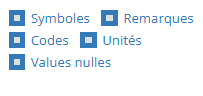

<font color='green'><u>**REMPLACONS les NA par des Valeurs nulles**</u></font>

In [147]:
#mask pour 'Valeur' manquantes
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
10,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
11,ALB,Albanie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
12,DZA,Algérie,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
13,DZA,Algérie,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
54,BHS,Bahamas,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...
811,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
818,YEM,Yémen,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
819,YEM,Yémen,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
826,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


In [148]:
#REMPLACEMENT DES VALEURS NA par 0

#mask pour 'Valeur' manquantes
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Valeur'].isna()

#Remplaçons les valeurs manquantes par des zéros :
df_ImpExpGlobal_2022_analyse_1_1.fillna({'Valeur': 0}, inplace=True)

#Df avec 'Valeur' anciennement manquantes
df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
#liste_pays_Valeur_manquante = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_manquante

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
10,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
11,ALB,Albanie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
12,DZA,Algérie,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
13,DZA,Algérie,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
54,BHS,Bahamas,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
...,...,...,...,...,...,...,...,...,...
811,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
818,YEM,Yémen,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
819,YEM,Yémen,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
826,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0


<u>Problématique technique :</u>  
Un de mes problèmes est que pour les lignes ou il y a des NA j'ai aussi des NA dans Unité.  
Ce qui pose problème pour la création de la colonne 'Élément-Unité'

##### A. option CHOISIE: je peux compléter les données 'Unité' même là ou il ya des Unités et valeur NA :

In [149]:
#mask pour 'Unité' manquantes
mask_temp = df_ImpExpGlobal_2022_analyse_1_1['Unité'].isna()

#Df avec 'Unité' manquantes
(df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]).head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
10,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
11,ALB,Albanie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
12,DZA,Algérie,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
13,DZA,Algérie,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
54,BHS,Bahamas,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0


In [150]:
#Ecriture de l'UNité pour les NA :
mask = (df_ImpExpGlobal_2022_analyse_1_1['Code Élément']=='5910')|(df_ImpExpGlobal_2022_analyse_1_1['Code Élément']=='5610')
df_ImpExpGlobal_2022_analyse_1_1.loc[mask,'Unité']='tonnes'

mask = (df_ImpExpGlobal_2022_analyse_1_1['Code Élément']=='5922')|(df_ImpExpGlobal_2022_analyse_1_1['Code Élément']=='5622')
df_ImpExpGlobal_2022_analyse_1_1.loc[mask,'Unité']='1000 USD'

In [151]:
#Df avec 'Unité' manquantes
(df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,:]).head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
10,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
11,ALB,Albanie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
12,DZA,Algérie,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
13,DZA,Algérie,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
54,BHS,Bahamas,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0


##### B. option B NON CHOISIE : supprimer les lignes avec des Unités et valeur NA dans le cas ou on ne remplace pas les valeurs par zéro

Uniquement si un NA était considéré comme une absence de données .  
Ce qui ne semblent pas être le cas au vu des données de la FAO considérées comme nulles, différentes d'une absence de données ne figurant pas.

Pas de perte d'information utile. (un NA signifie une absence de données et pas une valeur nulle).  
Les valeurs NA réapparaitront au besoin lors de la jointure.

##### C. BILAN suite modification

In [152]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_ImpExpGlobal_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],828,828,0,207,0.0
Zone,string[python],828,828,0,207,0.0
Code Élément,string[python],828,828,0,4,0.0
Élément,string[python],828,828,0,4,0.0
Code Produit (CPC),string[python],828,828,0,1,0.0
Produit,string[python],828,828,0,1,0.0
Année,Int64,828,828,0,1,NaN
Unité,string[python],828,828,0,2,0.0
Valeur,Float64,828,828,0,630,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [153]:
df_ImpExpGlobal_2022_analyse_1_1.head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,6902.31
1,AFG,Afghanistan,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,11649.0
2,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,56.04
3,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,75.0


In [154]:
#Creation d'une colonne Pivot avec contenu explicite
df_ImpExpGlobal_2022_analyse_1_1['Élément-Unité']=(df_ImpExpGlobal_2022_analyse_1_1['Élément']+" - "
                                                   +df_ImpExpGlobal_2022_analyse_1_1['Unité'])
df_ImpExpGlobal_2022_analyse_1_1.head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur,Élément-Unité
0,AFG,Afghanistan,5610,Importations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,6902.31,Importations - quantité - tonnes
1,AFG,Afghanistan,5622,Importations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,11649.0,Importations - valeur - 1000 USD
2,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,56.04,Exportations - quantité - tonnes
3,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,75.0,Exportations - valeur - 1000 USD


In [155]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_ImpExpGlobal_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],828,828,0,207,0.0
Zone,string[python],828,828,0,207,0.0
Code Élément,string[python],828,828,0,4,0.0
Élément,string[python],828,828,0,4,0.0
Code Produit (CPC),string[python],828,828,0,1,0.0
Produit,string[python],828,828,0,1,0.0
Année,Int64,828,828,0,1,NaN
Unité,string[python],828,828,0,2,0.0
Valeur,Float64,828,828,0,630,NaN
Élément-Unité,string[python],828,828,0,4,0.0


In [156]:
#PIVOT
df_ImpExpGlobal_2022_analyse_1_2_pivoted = df_ImpExpGlobal_2022_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone'], 
                                                                                  columns='Élément-Unité', 
                                                                                  values='Valeur')

df_ImpExpGlobal_2022_analyse_1_2_pivoted.head(4)

,Élément-Unité,Exportations - quantité - tonnes,Exportations - valeur - 1000 USD,Importations - quantité - tonnes,Importations - valeur - 1000 USD
Code zone (ISO3),Zone,,,,
AFG,Afghanistan,56.04,75.0,6902.31,11649.0
AGO,Angola,10.87,100.0,308122.71,405405.0
ALB,Albanie,0.0,0.0,43124.46,73384.0
ARE,Émirats arabes unis,94007.43,229433.0,615447.94,1252796.0


In [157]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_ImpExpGlobal_2022_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_ImpExpGlobal_2022_analyse_1_2_pivoted = df_ImpExpGlobal_2022_analyse_1_2_pivoted.reset_index()
df_ImpExpGlobal_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Exportations - quantité - tonnes,Exportations - valeur - 1000 USD,Importations - quantité - tonnes,Importations - valeur - 1000 USD
0,AFG,Afghanistan,56.04,75.0,6902.31,11649.0
1,AGO,Angola,10.87,100.0,308122.71,405405.0
2,ALB,Albanie,0.0,0.0,43124.46,73384.0
3,ARE,Émirats arabes unis,94007.43,229433.0,615447.94,1252796.0
4,ARG,Argentine,179621.83,298838.0,10218.32,21216.0


In [158]:
df_ImpExpGlobal_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Exportations - quantité - tonnes,Exportations - valeur - 1000 USD,Importations - quantité - tonnes,Importations - valeur - 1000 USD
0,AFG,Afghanistan,56.04,75.0,6902.31,11649.0
1,AGO,Angola,10.87,100.0,308122.71,405405.0
2,ALB,Albanie,0.0,0.0,43124.46,73384.0
3,ARE,Émirats arabes unis,94007.43,229433.0,615447.94,1252796.0
4,ARG,Argentine,179621.83,298838.0,10218.32,21216.0


In [159]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_ImpExpGlobal_2022_analyse_1_2_pivoted)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],207,207,0,207,0.0
Zone,string[python],207,207,0,207,0.0
Exportations - quantité - tonnes,Float64,207,207,0,135,NaN
Exportations - valeur - 1000 USD,Float64,207,207,0,126,NaN
Importations - quantité - tonnes,Float64,207,207,0,189,NaN
Importations - valeur - 1000 USD,Float64,207,207,0,188,NaN


In [160]:
df_ImpExpGlobal_2022_analyse_1_2_pivoted.columns

Index(['Code zone (ISO3)', 'Zone', 'Exportations - quantité - tonnes',
       'Exportations - valeur - 1000 USD', 'Importations - quantité - tonnes',
       'Importations - valeur - 1000 USD'],
      dtype='string')

###### <u>**HARMONISONS LES UNITES :**</u>

In [161]:
#Créons les colonnes en kg et USD

df_temp = df_ImpExpGlobal_2022_analyse_1_2_pivoted[['Exportations - quantité - tonnes',
                                                    'Exportations - valeur - 1000 USD', 
                                                    'Importations - quantité - tonnes',
                                                    'Importations - valeur - 1000 USD']]


df_ImpExpGlobal_2022_analyse_1_2_pivoted[['Export_Poulet_kg',
                                          'Export_Poulet_USD', 
                                          'Import_Poulet_kg',
                                          'Import_Poulet_USD']] = df_temp*1_000

#Supprimons les colonnes en tonnes et 1000 USD
df_ImpExpGlobal_2022_analyse_1_2_pivoted.drop(inplace=True,
                                              columns=['Exportations - quantité - tonnes',
                                                       'Exportations - valeur - 1000 USD', 
                                                       'Importations - quantité - tonnes',
                                                       'Importations - valeur - 1000 USD'])

df_ImpExpGlobal_2022_analyse_1_2_pivoted.head(5)

,Code zone (ISO3),Zone,Export_Poulet_kg,Export_Poulet_USD,Import_Poulet_kg,Import_Poulet_USD
0,AFG,Afghanistan,56040.0,75000.0,6902310.0,11649000.0
1,AGO,Angola,10870.0,100000.0,308122710.0,405405000.0
2,ALB,Albanie,0.0,0.0,43124460.0,73384000.0
3,ARE,Émirats arabes unis,94007430.0,229433000.0,615447940.0,1252796000.0
4,ARG,Argentine,179621830.0,298838000.0,10218320.0,21216000.0


In [162]:
#df_ImpExpGlobal_2022_analyse_1_2_pivoted.head(5)

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

In [163]:
df_ImpExpGlobal_2022_analyse_1_2_pivoted['Balance_IMP-EXP_Poulet_kg']=(
    df_ImpExpGlobal_2022_analyse_1_2_pivoted['Import_Poulet_kg'] - df_ImpExpGlobal_2022_analyse_1_2_pivoted['Export_Poulet_kg'] )

df_ImpExpGlobal_2022_analyse_1_2_pivoted['Balance_IMP-EXP_Poulet_USD']=(
    df_ImpExpGlobal_2022_analyse_1_2_pivoted['Import_Poulet_USD'] - df_ImpExpGlobal_2022_analyse_1_2_pivoted['Export_Poulet_USD'] )

df_ImpExpGlobal_2022_analyse_1_2_pivoted.head(5)

,Code zone (ISO3),Zone,Export_Poulet_kg,Export_Poulet_USD,Import_Poulet_kg,Import_Poulet_USD,Balance_IMP-EXP_Poulet_kg,Balance_IMP-EXP_Poulet_USD
0,AFG,Afghanistan,56040.0,75000.0,6902310.0,11649000.0,6846270.0,11574000.0
1,AGO,Angola,10870.0,100000.0,308122710.0,405405000.0,308111840.0,405305000.0
2,ALB,Albanie,0.0,0.0,43124460.0,73384000.0,43124460.0,73384000.0
3,ARE,Émirats arabes unis,94007430.0,229433000.0,615447940.0,1252796000.0,521440510.0,1023363000.0
4,ARG,Argentine,179621830.0,298838000.0,10218320.0,21216000.0,-169403510.0,-277622000.0


###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [164]:
df_ImpExpGlobal_2022_analyse_1_2_pivoted .head(2)

,Code zone (ISO3),Zone,Export_Poulet_kg,Export_Poulet_USD,Import_Poulet_kg,Import_Poulet_USD,Balance_IMP-EXP_Poulet_kg,Balance_IMP-EXP_Poulet_USD
0,AFG,Afghanistan,56040.0,75000.0,6902310.0,11649000.0,6846270.0,11574000.0
1,AGO,Angola,10870.0,100000.0,308122710.0,405405000.0,308111840.0,405305000.0


In [165]:
df_ImpExpGlobal_2022_analyse_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone', 'Export_Poulet_kg', 'Export_Poulet_USD',
       'Import_Poulet_kg', 'Import_Poulet_USD', 'Balance_IMP-EXP_Poulet_kg',
       'Balance_IMP-EXP_Poulet_USD'],
      dtype='string')

In [166]:
#Créons notre df 

# Choix de lignes : 
#mask_temp = (df_XXX_analyse_1_1 ["AAA"]==???) & (Conditions2)

#Choix des colonnes :
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Export_Poulet_kg','Import_Poulet_kg','Balance_IMP-EXP_Poulet_kg']

df_ImpExpGlobal_2022_analyse_1_3_pivoted = ( df_ImpExpGlobal_2022_analyse_1_2_pivoted .loc[:,liste_col_temp] ).copy(deep=True)
df_ImpExpGlobal_2022_analyse_1_3_pivoted .head()

,Code zone (ISO3),Zone,Export_Poulet_kg,Import_Poulet_kg,Balance_IMP-EXP_Poulet_kg
0,AFG,Afghanistan,56040.0,6902310.0,6846270.0
1,AGO,Angola,10870.0,308122710.0,308111840.0
2,ALB,Albanie,0.0,43124460.0,43124460.0
3,ARE,Émirats arabes unis,94007430.0,615447940.0,521440510.0
4,ARG,Argentine,179621830.0,10218320.0,-169403510.0


###### <u>**RENOMMONS DES COLONNES :**</u>

In [167]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_ImpExpGlobal_2022_analyse_1_3_pivoted  .rename(columns={"Code zone (ISO3)" : 'iso3'},
                                                  inplace=True)

df_ImpExpGlobal_2022_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Export_Poulet_kg,Import_Poulet_kg,Balance_IMP-EXP_Poulet_kg
0,AFG,Afghanistan,56040.0,6902310.0,6846270.0
1,AGO,Angola,10870.0,308122710.0,308111840.0


In [168]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_ImpExpGlobal_2022_analyse_1_3_pivoted)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],207,207,0,207,0.0
Zone,string[python],207,207,0,207,0.0
Export_Poulet_kg,Float64,207,207,0,135,NaN
Import_Poulet_kg,Float64,207,207,0,189,NaN
Balance_IMP-EXP_Poulet_kg,Float64,207,207,0,193,NaN


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [169]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_ImpExpGlobal_2022_analyse_1_3_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    207
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [170]:
df_ImpExpGlobal_2022_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Export_Poulet_kg,Import_Poulet_kg,Balance_IMP-EXP_Poulet_kg
0,AFG,Afghanistan,56040.0,6902310.0,6846270.0
1,AGO,Angola,10870.0,308122710.0,308111840.0


In [171]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_ImpExpGlobal_2022_analyse_1_3_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],207,207,0,207,0.0
Zone,string[python],207,207,0,207,0.0
Export_Poulet_kg,Float64,207,207,0,135,NaN
Import_Poulet_kg,Float64,207,207,0,189,NaN
Balance_IMP-EXP_Poulet_kg,Float64,207,207,0,193,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [172]:
df_prejointure_ImpExpGlobal_2022 = df_ImpExpGlobal_2022_analyse_1_3_pivoted.copy(deep=True)

In [173]:
df_prejointure_ImpExpGlobal_2022 .head(5)

,iso3,Zone,Export_Poulet_kg,Import_Poulet_kg,Balance_IMP-EXP_Poulet_kg
0,AFG,Afghanistan,56040.0,6902310.0,6846270.0
1,AGO,Angola,10870.0,308122710.0,308111840.0
2,ALB,Albanie,0.0,43124460.0,43124460.0
3,ARE,Émirats arabes unis,94007430.0,615447940.0,521440510.0
4,ARG,Argentine,179621830.0,10218320.0,-169403510.0


In [174]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_ImpExpGlobal_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],207,207,0,207,0.0
Zone,string[python],207,207,0,207,0.0
Export_Poulet_kg,Float64,207,207,0,135,NaN
Import_Poulet_kg,Float64,207,207,0,189,NaN
Balance_IMP-EXP_Poulet_kg,Float64,207,207,0,193,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.5 - Richesse du marché-PIB - source FAO : df_PIB_2022 </h4>
</div>

- Thème : Richesse du marché-PIB
- Site : FAO  
- Source : https://www.fao.org/faostat/fr/#data/MK
- Données : 

1. FAO	MK - Indicateurs macro  
   6119 - Valeur USD par habitant  	
   22008 - Produit Intérieur Brut  
2. FAO	MK - Indicateurs macro
   	61290 - Croissance annuelle USD par habitant  
   	22008 - Produit Intérieur Brut 
- Fichier local : FAOSTAT_MK_PIB_2022.csv.csv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [175]:
#CHARGEMENT de FAOSTAT_MK_PIB_2022.xls

df_PIB_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_MK_PIB_2022.csv",
                         sep = ',')

df_PIB_2022 .head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,MK,Indicateurs macro,AFG,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,2022,USD,344.649112,X,Ciffre de sources internationales,NaN
1,MK,Indicateurs macro,AFG,Afghanistan,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,2022,%,-8.842977,X,Ciffre de sources internationales,NaN
2,MK,Indicateurs macro,ZAF,Afrique du Sud,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,2022,USD,6766.481054,X,Ciffre de sources internationales,NaN
3,MK,Indicateurs macro,ZAF,Afrique du Sud,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,2022,%,-4.341935,X,Ciffre de sources internationales,NaN
4,MK,Indicateurs macro,ALB,Albanie,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,2022,USD,6655.258391,X,Ciffre de sources internationales,NaN


In [176]:
Premieres_Analyses( df_PIB_2022 )


---- SHAPE ----


(438, 15)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438 entries, 0 to 437
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            438 non-null    object 
 1   Domaine                 438 non-null    object 
 2   Code zone (ISO3)        438 non-null    object 
 3   Zone                    438 non-null    object 
 4   Code Élément            438 non-null    int64  
 5   Élément                 438 non-null    object 
 6   Code Produit            438 non-null    int64  
 7   Produit                 438 non-null    object 
 8   Code année              438 non-null    int64  
 9   Année                   438 non-null    int64  
 10  Unité                   422 non-null    object 
 11  Valeur                  422 non-null    float64
 12  Symbole                 422 non-null    object 
 13  Description du Symbole  422 non-null    object 
 14  Note                    0 

,Code Élément,Code Produit,Code année,Année,Valeur,Note
count,438.000000,438.0,438.0,438.0,422.000000,0.0
mean,33704.500000,22008.0,2022.0,2022.0,9819.324897,NaN
std,27617.044321,0.0,0.0,0.0,23846.145571,NaN
min,6119.000000,22008.0,2022.0,2022.0,-23.323489,NaN
25%,6119.000000,22008.0,2022.0,2022.0,4.797087,NaN
50%,33704.500000,22008.0,2022.0,2022.0,197.483311,NaN
75%,61290.000000,22008.0,2022.0,2022.0,7100.794364,NaN
max,61290.000000,22008.0,2022.0,2022.0,240535.043309,NaN



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,438,438,0,1,0.0
Domaine,object,438,438,0,1,0.0
Code zone (ISO3),object,438,438,0,219,0.0
Zone,object,438,438,0,219,0.0
Code Élément,int64,438,438,0,2,NaN
Élément,object,438,438,0,2,0.0
Code Produit,int64,438,438,0,1,NaN
Produit,object,438,438,0,1,0.0
Code année,int64,438,438,0,1,NaN
Année,int64,438,438,0,1,NaN


In [177]:
df_PIB_2022.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit', 'Produit', 'Code année', 'Année', 'Unité',
       'Valeur', 'Symbole', 'Description du Symbole', 'Note'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [178]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_PIB_2022 # supprime la référence à l'ancien DataFrame
#del df_XXXX 
gc.collect()  # force le nettoyage de la mémoire

0

In [179]:

liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Code Élément','Élément', 'Code Produit', 'Produit', 
                  'Année', 'Unité','Valeur']

df_PIB_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_MK_PIB_2022.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code zone (ISO3)' : "string",
                                   'Zone' : "string",
                                   'Code Élément' : "string",
                                   'Élément' : "string",
                                   'Code Produit' : "string",
                                   'Produit' : "string",
                                   'Année' : "Int64",
                                   'Unité' : "string",
                                   'Valeur' : "Float64"}
                                 )

df_PIB_2022.head(5)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,344.649112
1,AFG,Afghanistan,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-8.842977
2,ZAF,Afrique du Sud,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,6766.481054
3,ZAF,Afrique du Sud,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-4.341935
4,ALB,Albanie,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,6655.258391


In [180]:
Premieres_Analyses( df_PIB_2022 )


---- SHAPE ----


(438, 9)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438 entries, 0 to 437
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Code zone (ISO3)  438 non-null    string 
 1   Zone              438 non-null    string 
 2   Code Élément      438 non-null    string 
 3   Élément           438 non-null    string 
 4   Code Produit      438 non-null    string 
 5   Produit           438 non-null    string 
 6   Année             438 non-null    Int64  
 7   Unité             422 non-null    string 
 8   Valeur            422 non-null    Float64
dtypes: Float64(1), Int64(1), string(7)
memory usage: 31.8 KB

---- DESCRIBE ----


,Année,Valeur
count,438.0,422.0
mean,2022.0,9819.324897
std,0.0,23846.145571
min,2022.0,-23.323489
25%,2022.0,4.797087
50%,2022.0,197.483311
75%,2022.0,7100.794364
max,2022.0,240535.043309



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],438,438,0,219,0.0
Zone,string[python],438,438,0,219,0.0
Code Élément,string[python],438,438,0,2,0.0
Élément,string[python],438,438,0,2,0.0
Code Produit,string[python],438,438,0,1,0.0
Produit,string[python],438,438,0,1,0.0
Année,Int64,438,438,0,1,NaN
Unité,string[python],438,422,16,2,0.0
Valeur,Float64,438,422,16,422,NaN


In [181]:
df_PIB_2022.columns

Index(['Code zone (ISO3)', 'Zone', 'Code Élément', 'Élément', 'Code Produit',
       'Produit', 'Année', 'Unité', 'Valeur'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [182]:
df_PIB_2022_analyse_1_1 = df_PIB_2022.copy(deep=True)

In [183]:
df_PIB_2022_analyse_1_1 .head(2)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,344.649112
1,AFG,Afghanistan,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-8.842977


In [184]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_PIB_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],438,438,0,219,0.0
Zone,string[python],438,438,0,219,0.0
Code Élément,string[python],438,438,0,2,0.0
Élément,string[python],438,438,0,2,0.0
Code Produit,string[python],438,438,0,1,0.0
Produit,string[python],438,438,0,1,0.0
Année,Int64,438,438,0,1,NaN
Unité,string[python],438,422,16,2,0.0
Valeur,Float64,438,422,16,422,NaN


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [185]:
#mask pour 'Valeur' manquantes
mask_temp = df_PIB_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_PIB_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
['Antilles néerlandaises (ex)',                'Éthiopie RDP',
          'RFS de Yougoslavie',                 'Soudan (ex)',
                'Tchécoslovaq',                        'URSS',
                   'Yemen Dém',                 'Yémen Rép A']
Length: 8, dtype: string

In [186]:
#Suppression des lignes avec NA sur la colonne Valeur
df_PIB_2022_analyse_1_1.dropna(axis=0,
                          subset=['Valeur'],
                          how ='any',
                          inplace=True)


In [187]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_PIB_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],422,422,0,211,0.0
Zone,string[python],422,422,0,211,0.0
Code Élément,string[python],422,422,0,2,0.0
Élément,string[python],422,422,0,2,0.0
Code Produit,string[python],422,422,0,1,0.0
Produit,string[python],422,422,0,1,0.0
Année,Int64,422,422,0,1,NaN
Unité,string[python],422,422,0,2,0.0
Valeur,Float64,422,422,0,422,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [188]:
df_PIB_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,344.649112
1,AFG,Afghanistan,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-8.842977
2,ZAF,Afrique du Sud,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,6766.481054
3,ZAF,Afrique du Sud,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-4.341935
4,ALB,Albanie,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,6655.258391


In [189]:
#Creation d'une colonne Pivot avec contenu explicite
df_PIB_2022_analyse_1_1['Élément-Unité']=("PIB - "
                                          +df_PIB_2022_analyse_1_1['Élément']+"("
                                          +df_PIB_2022_analyse_1_1['Unité']+")")
df_PIB_2022_analyse_1_1.head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur,Élément-Unité
0,AFG,Afghanistan,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,344.649112,PIB - Valeur US $ par habitant(USD)
1,AFG,Afghanistan,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-8.842977,PIB - Croissance annuelle US$ par habitant(%)
2,ZAF,Afrique du Sud,6119,Valeur US $ par habitant,22008,Produit Intérieur Brut,2022,USD,6766.481054,PIB - Valeur US $ par habitant(USD)
3,ZAF,Afrique du Sud,61290,Croissance annuelle US$ par habitant,22008,Produit Intérieur Brut,2022,%,-4.341935,PIB - Croissance annuelle US$ par habitant(%)


In [190]:
#PIVOT
df_PIB_2022_analyse_1_2_pivoted = df_PIB_2022_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone'],
                                                                columns='Élément-Unité',
                                                                values='Valeur')

df_PIB_2022_analyse_1_2_pivoted.head(4)

,Élément-Unité,PIB - Croissance annuelle US$ par habitant(%),PIB - Valeur US $ par habitant(USD)
Code zone (ISO3),Zone,,
ABW,Aruba,14.326812,33300.838821
AFG,Afghanistan,-8.842977,344.649112
AGO,Angola,57.139741,3183.699796
AIA,Anguilla,49.488087,28561.285003


In [191]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_PIB_2022_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_PIB_2022_analyse_1_2_pivoted = df_PIB_2022_analyse_1_2_pivoted.reset_index()
df_PIB_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,PIB - Croissance annuelle US$ par habitant(%),PIB - Valeur US $ par habitant(USD)
0,ABW,Aruba,14.326812,33300.838821
1,AFG,Afghanistan,-8.842977,344.649112
2,AGO,Angola,57.139741,3183.699796
3,AIA,Anguilla,49.488087,28561.285003
4,ALB,Albanie,5.95779,6655.258391


In [192]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_PIB_2022_analyse_1_2_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],211,211,0,211,0.0
Zone,string[python],211,211,0,211,0.0
PIB - Croissance annuelle US$ par habitant(%),Float64,211,211,0,211,NaN
PIB - Valeur US $ par habitant(USD),Float64,211,211,0,211,NaN


###### <u>**HARMONISONS LES UNITES :**</u>

Déjà en Unité

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

Pas besoin de plus de colonnes

###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

PAS DE COLONNES/LIGNES INUTILES

###### <u>**RENOMMONS DES COLONNES :**</u>

In [193]:
df_PIB_2022_analyse_1_2_pivoted.columns

Index(['Code zone (ISO3)', 'Zone',
       'PIB - Croissance annuelle US$ par habitant(%)',
       'PIB - Valeur US $ par habitant(USD)'],
      dtype='string')

In [194]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_PIB_2022_analyse_1_2_pivoted  .rename(columns={'Code zone (ISO3)' : 'iso3',
                                                  'PIB - Croissance annuelle US$ par habitant(%)' : "PIB-Croissance annuelle par habitant(%)",
                                                  'PIB - Valeur US $ par habitant(USD)':"PIB-Valeur par habitant(USD)"},
                                     inplace=True)
df_PIB_2022_analyse_1_2_pivoted  .head(2)

,iso3,Zone,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD)
0,ABW,Aruba,14.326812,33300.838821
1,AFG,Afghanistan,-8.842977,344.649112


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [195]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_PIB_2022_analyse_1_2_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    211
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [196]:
df_PIB_2022_analyse_1_2_pivoted  .head(2)

,iso3,Zone,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD)
0,ABW,Aruba,14.326812,33300.838821
1,AFG,Afghanistan,-8.842977,344.649112


In [197]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_PIB_2022_analyse_1_2_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],211,211,0,211,0.0
Zone,string[python],211,211,0,211,0.0
PIB-Croissance annuelle par habitant(%),Float64,211,211,0,211,NaN
PIB-Valeur par habitant(USD),Float64,211,211,0,211,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [198]:
df_prejointure_PIB_2022 = df_PIB_2022_analyse_1_2_pivoted.copy(deep=True)

In [199]:
df_prejointure_PIB_2022 .head(5)

,iso3,Zone,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD)
0,ABW,Aruba,14.326812,33300.838821
1,AFG,Afghanistan,-8.842977,344.649112
2,AGO,Angola,57.139741,3183.699796
3,AIA,Anguilla,49.488087,28561.285003
4,ALB,Albanie,5.95779,6655.258391


In [200]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_PIB_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],211,211,0,211,0.0
Zone,string[python],211,211,0,211,0.0
PIB-Croissance annuelle par habitant(%),Float64,211,211,0,211,NaN
PIB-Valeur par habitant(USD),Float64,211,211,0,211,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.6 - Part de la Volaille dans l’alimentation - source FAO : df_Part_Volaille_2022</h4>
</div>

- Thème : Part de la consommation de Volailles dans l’alimentation  
- Site :   FAO  
- Source :   https://www.fao.org/faostat/fr/#data/FBS
- Données : 
1. FAO	FBS - Bilans Alimentaires (2010-)  
   664-Disponibilité alimentaire (Kcal/personne/jour)  
   S2734 - Viande de Volailles  
  
2. FAO	FBS - Bilans Alimentaires (2010-)  
   664 - Disponibilité alimentaire (Kcal/personne/jour)  
   S2901-Total General
   
- Année : 2022  
- Fichier local : FAOSTAT_FBS_Part_Poulet_2022.csv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [201]:
#CHARGEMENT de FAOSTAT_FBS_Part_Poulet_2022.csv

df_Part_Volaille_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_FBS_Part_Poulet_2022.csv",
                         sep = ',')

df_Part_Volaille_2022 .head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole,Note
0,FBS,Bilans Alimentaires (2010-),AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,2022,kcal/personne/jour,2243.00,E,Valeur estimée,NaN
1,FBS,Bilans Alimentaires (2010-),AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,2022,kcal/personne/jour,3.29,E,Valeur estimée,NaN
2,FBS,Bilans Alimentaires (2010-),ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,2022,kcal/personne/jour,2761.00,E,Valeur estimée,NaN
3,FBS,Bilans Alimentaires (2010-),ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,2022,kcal/personne/jour,149.24,E,Valeur estimée,NaN
4,FBS,Bilans Alimentaires (2010-),ALB,Albanie,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,2022,kcal/personne/jour,3390.00,E,Valeur estimée,NaN


In [202]:
Premieres_Analyses( df_Part_Volaille_2022 )


---- SHAPE ----


(382, 15)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382 entries, 0 to 381
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Code Domaine            382 non-null    object 
 1   Domaine                 382 non-null    object 
 2   Code zone (ISO3)        382 non-null    object 
 3   Zone                    382 non-null    object 
 4   Code Élément            382 non-null    int64  
 5   Élément                 382 non-null    object 
 6   Code Produit (FBS)      382 non-null    object 
 7   Produit                 382 non-null    object 
 8   Code année              382 non-null    int64  
 9   Année                   382 non-null    int64  
 10  Unité                   378 non-null    object 
 11  Valeur                  378 non-null    float64
 12  Symbole                 378 non-null    object 
 13  Description du Symbole  378 non-null    object 
 14  Note                    0 

,Code Élément,Code année,Année,Valeur,Note
count,382.0,382.0,382.0,378.000000,0.0
mean,664.0,2022.0,2022.0,1518.166667,NaN
std,0.0,0.0,0.0,1467.158834,NaN
min,664.0,2022.0,2022.0,1.490000,NaN
25%,664.0,2022.0,2022.0,81.245000,NaN
50%,664.0,2022.0,2022.0,1053.355000,NaN
75%,664.0,2022.0,2022.0,2955.250000,NaN
max,664.0,2022.0,2022.0,3923.000000,NaN



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,382,382,0,1,0.0
Domaine,object,382,382,0,1,0.0
Code zone (ISO3),object,382,382,0,191,0.0
Zone,object,382,382,0,191,0.0
Code Élément,int64,382,382,0,1,NaN
Élément,object,382,382,0,1,0.0
Code Produit (FBS),object,382,382,0,2,0.0
Produit,object,382,382,0,2,0.0
Code année,int64,382,382,0,1,NaN
Année,int64,382,382,0,1,NaN


In [203]:
df_Part_Volaille_2022.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit (FBS)', 'Produit', 'Code année', 'Année',
       'Unité', 'Valeur', 'Symbole', 'Description du Symbole', 'Note'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [204]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Part_Volaille_2022 # supprime la référence à l'ancien DataFrame

gc.collect()  # force le nettoyage de la mémoire

0

In [205]:
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Code Élément','Élément', 
                  'Code Produit (FBS)', 'Produit', 'Année','Unité', 'Valeur']

df_Part_Volaille_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_FBS_Part_Poulet_2022.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code zone (ISO3)': "string",
                                   'Zone': "string",
                                   'Code Élément': "string",
                                   'Élément': "string",
                                   'Code Produit (FBS)': "string",
                                   'Produit': "string",
                                   'Année' : "Int64",
                                   'Unité': "string",
                                   'Valeur' : "Float64"
                                   }
                                 )

df_Part_Volaille_2022.head(5)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2243.0
1,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,3.29
2,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2761.0
3,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,149.24
4,ALB,Albanie,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,3390.0


In [206]:
Premieres_Analyses( df_Part_Volaille_2022 )


---- SHAPE ----


(382, 9)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382 entries, 0 to 381
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Code zone (ISO3)    382 non-null    string 
 1   Zone                382 non-null    string 
 2   Code Élément        382 non-null    string 
 3   Élément             382 non-null    string 
 4   Code Produit (FBS)  382 non-null    string 
 5   Produit             382 non-null    string 
 6   Année               382 non-null    Int64  
 7   Unité               378 non-null    string 
 8   Valeur              378 non-null    Float64
dtypes: Float64(1), Int64(1), string(7)
memory usage: 27.7 KB

---- DESCRIBE ----


,Année,Valeur
count,382.0,378.0
mean,2022.0,1518.166667
std,0.0,1467.158834
min,2022.0,1.49
25%,2022.0,81.245
50%,2022.0,1053.355
75%,2022.0,2955.25
max,2022.0,3923.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],382,382,0,191,0.0
Zone,string[python],382,382,0,191,0.0
Code Élément,string[python],382,382,0,1,0.0
Élément,string[python],382,382,0,1,0.0
Code Produit (FBS),string[python],382,382,0,2,0.0
Produit,string[python],382,382,0,2,0.0
Année,Int64,382,382,0,1,NaN
Unité,string[python],382,378,4,1,0.0
Valeur,Float64,382,378,4,370,NaN


In [207]:
df_Part_Volaille_2022.columns

Index(['Code zone (ISO3)', 'Zone', 'Code Élément', 'Élément',
       'Code Produit (FBS)', 'Produit', 'Année', 'Unité', 'Valeur'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [208]:
df_Part_Volaille_2022_analyse_1_1 = df_Part_Volaille_2022.copy(deep=True)

In [209]:
df_Part_Volaille_2022_analyse_1_1 .head(2)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2243.0
1,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,3.29


In [210]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Part_Volaille_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],382,382,0,191,0.0
Zone,string[python],382,382,0,191,0.0
Code Élément,string[python],382,382,0,1,0.0
Élément,string[python],382,382,0,1,0.0
Code Produit (FBS),string[python],382,382,0,2,0.0
Produit,string[python],382,382,0,2,0.0
Année,Int64,382,382,0,1,NaN
Unité,string[python],382,378,4,1,0.0
Valeur,Float64,382,378,4,370,NaN


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [211]:
#mask pour 'Valeur' manquantes
mask_temp = df_Part_Volaille_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_Part_Volaille_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
['Antilles néerlandaises (ex)', 'République populaire démocratique de Corée']
Length: 2, dtype: string

In [212]:
#Suppression des lignes avec NA sur la colonne Valeur
df_Part_Volaille_2022_analyse_1_1.dropna(axis=0,
                                         subset=['Valeur'],
                                         how ='any',
                                         inplace=True)


In [213]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Part_Volaille_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],378,378,0,189,0.0
Zone,string[python],378,378,0,189,0.0
Code Élément,string[python],378,378,0,1,0.0
Élément,string[python],378,378,0,1,0.0
Code Produit (FBS),string[python],378,378,0,2,0.0
Produit,string[python],378,378,0,2,0.0
Année,Int64,378,378,0,1,NaN
Unité,string[python],378,378,0,1,0.0
Valeur,Float64,378,378,0,370,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [214]:
df_Part_Volaille_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2243.0
1,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,3.29
2,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2761.0
3,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,149.24
4,ALB,Albanie,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,3390.0


In [215]:
#Creation d'une colonne Pivot avec contenu explicite
df_Part_Volaille_2022_analyse_1_1['Élément-Produit']=(df_Part_Volaille_2022_analyse_1_1['Élément']+" - "
                                                      +df_Part_Volaille_2022_analyse_1_1['Produit'])
df_Part_Volaille_2022_analyse_1_1.head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Année,Unité,Valeur,Élément-Produit
0,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2243.0,Disponibilité alimentaire (Kcal/personne/jour)...
1,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,3.29,Disponibilité alimentaire (Kcal/personne/jour)...
2,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2761.0,Disponibilité alimentaire (Kcal/personne/jour)...
3,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,149.24,Disponibilité alimentaire (Kcal/personne/jour)...


In [216]:
df_Part_Volaille_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (FBS),Produit,Année,Unité,Valeur,Élément-Produit
0,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2243.0,Disponibilité alimentaire (Kcal/personne/jour)...
1,AFG,Afghanistan,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,3.29,Disponibilité alimentaire (Kcal/personne/jour)...
2,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,2761.0,Disponibilité alimentaire (Kcal/personne/jour)...
3,ZAF,Afrique du Sud,664,Disponibilité alimentaire (Kcal/personne/jour),S2734,Viande de Volailles,2022,kcal/personne/jour,149.24,Disponibilité alimentaire (Kcal/personne/jour)...
4,ALB,Albanie,664,Disponibilité alimentaire (Kcal/personne/jour),S2901,Total General,2022,kcal/personne/jour,3390.0,Disponibilité alimentaire (Kcal/personne/jour)...


In [217]:
#PIVOT
df_Part_Volaille_2022_analyse_1_2_pivoted = df_Part_Volaille_2022_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone'],
                                                                            columns='Élément-Produit',
                                                                            values='Valeur')

df_Part_Volaille_2022_analyse_1_2_pivoted.head(4)

,Élément-Produit,Disponibilité alimentaire (Kcal/personne/jour) - Total General,Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles
Code zone (ISO3),Zone,,
AFG,Afghanistan,2243.0,3.29
AGO,Angola,2435.0,39.62
ALB,Albanie,3390.0,85.67
ARE,Émirats arabes unis,3321.0,208.4


In [218]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_Part_Volaille_2022_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_Part_Volaille_2022_analyse_1_2_pivoted = df_Part_Volaille_2022_analyse_1_2_pivoted.reset_index()
df_Part_Volaille_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Disponibilité alimentaire (Kcal/personne/jour) - Total General,Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles
0,AFG,Afghanistan,2243.0,3.29
1,AGO,Angola,2435.0,39.62
2,ALB,Albanie,3390.0,85.67
3,ARE,Émirats arabes unis,3321.0,208.4
4,ARG,Argentine,3347.0,181.84


###### <u>**HARMONISONS LES UNITES :**</u>

PAS NECESSAIRE

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

In [219]:
df_Part_Volaille_2022_analyse_1_2_pivoted['Part de Volaille dans Alimentation(%)'] = (
    df_Part_Volaille_2022_analyse_1_2_pivoted['Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles']*100/
    df_Part_Volaille_2022_analyse_1_2_pivoted['Disponibilité alimentaire (Kcal/personne/jour) - Total General']
)

df_Part_Volaille_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Disponibilité alimentaire (Kcal/personne/jour) - Total General,Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,2243.0,3.29,0.146679
1,AGO,Angola,2435.0,39.62,1.627105
2,ALB,Albanie,3390.0,85.67,2.527139
3,ARE,Émirats arabes unis,3321.0,208.4,6.275218
4,ARG,Argentine,3347.0,181.84,5.432925


In [220]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Part_Volaille_2022_analyse_1_2_pivoted)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],189,189,0,189,0.0
Zone,string[python],189,189,0,189,0.0
Disponibilité alimentaire (Kcal/personne/jour) - Total General,Float64,189,189,0,182,NaN
Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles,Float64,189,189,0,188,NaN
Part de Volaille dans Alimentation(%),Float64,189,189,0,189,NaN


###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [221]:
df_Part_Volaille_2022_analyse_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone',
       'Disponibilité alimentaire (Kcal/personne/jour) - Total General',
       'Disponibilité alimentaire (Kcal/personne/jour) - Viande de Volailles',
       'Part de Volaille dans Alimentation(%)'],
      dtype='string')

In [222]:
#Créons notre df 

# Choix de lignes : 
#mask_temp = (df_XXX_analyse_1_2_pivoted ["AAA"]==???) & (Conditions2)

#Choix des colonnes :
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Part de Volaille dans Alimentation(%)']

df_Part_Volaille_2022_analyse_1_2_pivoted = ( df_Part_Volaille_2022_analyse_1_2_pivoted .loc[:,liste_col_temp] ).copy(deep=True)
df_Part_Volaille_2022_analyse_1_2_pivoted .head()

,Code zone (ISO3),Zone,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,0.146679
1,AGO,Angola,1.627105
2,ALB,Albanie,2.527139
3,ARE,Émirats arabes unis,6.275218
4,ARG,Argentine,5.432925


###### <u>**RENOMMONS DES COLONNES :**</u>

In [223]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Part_Volaille_2022_analyse_1_2_pivoted  .rename(columns={"Code zone (ISO3)" : 'iso3'},
                                                   inplace=True)
df_Part_Volaille_2022_analyse_1_2_pivoted  .head(2)

,iso3,Zone,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,0.146679
1,AGO,Angola,1.627105


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [224]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Part_Volaille_2022_analyse_1_2_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    189
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [225]:
df_Part_Volaille_2022_analyse_1_2_pivoted  .head(2)

,iso3,Zone,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,0.146679
1,AGO,Angola,1.627105


In [226]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Part_Volaille_2022_analyse_1_2_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],189,189,0,189,0.0
Zone,string[python],189,189,0,189,0.0
Part de Volaille dans Alimentation(%),Float64,189,189,0,189,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [227]:
df_prejointure_Part_Volaille_2022 = df_Part_Volaille_2022_analyse_1_2_pivoted.copy(deep=True)

In [228]:
df_prejointure_Part_Volaille_2022 .head(5)

,iso3,Zone,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,0.146679
1,AGO,Angola,1.627105
2,ALB,Albanie,2.527139
3,ARE,Émirats arabes unis,6.275218
4,ARG,Argentine,5.432925


In [229]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Part_Volaille_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],189,189,0,189,0.0
Zone,string[python],189,189,0,189,0.0
Part de Volaille dans Alimentation(%),Float64,189,189,0,189,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.7 - Positionnement bio  - source FAO : df_Positionnement_bio_2022</h4>
</div>

- Thème : Positionnement bio   
- Site : FAO
- Source : https://www.fao.org/faostat/fr/#data/CAHD  
- Données :  

Part de personnes ayant accès à une alimentation Saine  
1. FAO CAHD-Coût et abordabilité d’une alimentation saine (CoAHD)"  
   6121 - Valeur  
   7005 - Prevalence of unaffordability (PUA), percent

   Taille-Nombre de personnes ayant accès à une alimentation saine  
2.  FAO "CAHD-Coût et abordabilité d’une alimentation saine (CoAHD)"  
   6132 - Valeur  
   7006 - Number of people unable to afford a healthy diet (NUA), million  

-Année : 2022  
- Fichier local : FAOSTAT_CAHD_Positionnement_bio_2022.csv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [230]:
#CHARGEMENT de FAOSTAT_CAHD_Positionnement_bio_2022.csv

df_Positionnement_bio_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_CAHD_Positionnement_bio_2022.csv",
                                         sep = ',')

df_Positionnement_bio_2022 .head(5)

,Code Domaine,Domaine,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Code année,Année,Édition,Unité,Valeur,Symbole,Description du Symbole
0,CAHD,Coût et abordabilité d’une alimentation saine\...,AFG,Afghanistan,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,2022,Décembre 2024 (Mise à jour),%,NaN,O,Valeur manquante
1,CAHD,Coût et abordabilité d’une alimentation saine\...,AFG,Afghanistan,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,2022,Décembre 2024 (Mise à jour),millions de No,NaN,O,Valeur manquante
2,CAHD,Coût et abordabilité d’une alimentation saine\...,ZAF,Afrique du Sud,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,2022,Décembre 2024 (Mise à jour),%,61.2,E,Valeur estimée
3,CAHD,Coût et abordabilité d’une alimentation saine\...,ZAF,Afrique du Sud,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,2022,Décembre 2024 (Mise à jour),millions de No,38.2,E,Valeur estimée
4,CAHD,Coût et abordabilité d’une alimentation saine\...,ALB,Albanie,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,2022,Décembre 2024 (Mise à jour),%,12.2,E,Valeur estimée


In [231]:
Premieres_Analyses( df_Positionnement_bio_2022 )


---- SHAPE ----


(422, 15)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 422 entries, 0 to 421
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Code Domaine            422 non-null    object
 1   Domaine                 422 non-null    object
 2   Code zone (ISO3)        422 non-null    object
 3   Zone                    422 non-null    object
 4   Code Élément            422 non-null    int64 
 5   Élément                 422 non-null    object
 6   Code Produit            422 non-null    int64 
 7   Produit                 422 non-null    object
 8   Code année              422 non-null    int64 
 9   Année                   422 non-null    int64 
 10  Édition                 422 non-null    object
 11  Unité                   406 non-null    object
 12  Valeur                  292 non-null    object
 13  Symbole                 406 non-null    object
 14  Description du Symbole  406 non-null    ob

,Code Élément,Code Produit,Code année,Année
count,422.000000,422.000000,422.0,422.0
mean,6126.500000,7005.500000,2022.0,2022.0
std,5.506528,0.500593,0.0,0.0
min,6121.000000,7005.000000,2022.0,2022.0
25%,6121.000000,7005.000000,2022.0,2022.0
50%,6126.500000,7005.500000,2022.0,2022.0
75%,6132.000000,7006.000000,2022.0,2022.0
max,6132.000000,7006.000000,2022.0,2022.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,422,422,0,1,0.0
Domaine,object,422,422,0,1,0.0
Code zone (ISO3),object,422,422,0,211,0.0
Zone,object,422,422,0,211,0.0
Code Élément,int64,422,422,0,2,NaN
Élément,object,422,422,0,1,0.0
Code Produit,int64,422,422,0,2,NaN
Produit,object,422,422,0,2,0.0
Code année,int64,422,422,0,1,NaN
Année,int64,422,422,0,1,NaN


In [232]:
df_Positionnement_bio_2022.columns

Index(['Code Domaine', 'Domaine', 'Code zone (ISO3)', 'Zone', 'Code Élément',
       'Élément', 'Code Produit', 'Produit', 'Code année', 'Année', 'Édition',
       'Unité', 'Valeur', 'Symbole', 'Description du Symbole'],
      dtype='object')

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [233]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Positionnement_bio_2022 # supprime la référence à l'ancien DataFrame
#del df_XXXX 
gc.collect()  # force le nettoyage de la mémoire

0

In [234]:
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Code Élément','Élément', 'Code Produit', 'Produit',
                  'Année','Unité', 'Valeur']

df_Positionnement_bio_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_CAHD_Positionnement_bio_2022.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code zone (ISO3)': "string",
                                   'Zone': "string",
                                   'Code Élément': "string",
                                   'Élément': "string",
                                   'Code Produit': "string",
                                   'Produit': "string",
                                   'Année': "Int64",
                                   'Unité': "string",
                                   'Valeur': "string"
                                   }
                                 )

df_Positionnement_bio_2022.head(5)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,<NA>
1,AFG,Afghanistan,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,<NA>
2,ZAF,Afrique du Sud,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,61.2
3,ZAF,Afrique du Sud,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,38.2
4,ALB,Albanie,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,12.2


Je ne peux pas passer valeur en Float64 à cause de valeur du type "<0.1".  
Il faut donc que je passe transforme d'abord ces valeurs en 0, voir que j'étudie l'ensemble des valeurs non numérique avant de pouvoir convertir en numérique

In [235]:
Premieres_Analyses( df_Positionnement_bio_2022 )


---- SHAPE ----


(422, 9)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 422 entries, 0 to 421
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Code zone (ISO3)  422 non-null    string
 1   Zone              422 non-null    string
 2   Code Élément      422 non-null    string
 3   Élément           422 non-null    string
 4   Code Produit      422 non-null    string
 5   Produit           422 non-null    string
 6   Année             422 non-null    Int64 
 7   Unité             406 non-null    string
 8   Valeur            292 non-null    string
dtypes: Int64(1), string(8)
memory usage: 30.2 KB

---- DESCRIBE ----


,Année
count,422.0
mean,2022.0
std,0.0
min,2022.0
25%,2022.0
50%,2022.0
75%,2022.0
max,2022.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],422,422,0,211,0.0
Zone,string[python],422,422,0,211,0.0
Code Élément,string[python],422,422,0,2,0.0
Élément,string[python],422,422,0,1,0.0
Code Produit,string[python],422,422,0,2,0.0
Produit,string[python],422,422,0,2,0.0
Année,Int64,422,422,0,1,NaN
Unité,string[python],422,406,16,2,0.0
Valeur,string[python],422,292,130,191,0.0


In [236]:
df_Positionnement_bio_2022.columns

Index(['Code zone (ISO3)', 'Zone', 'Code Élément', 'Élément', 'Code Produit',
       'Produit', 'Année', 'Unité', 'Valeur'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [237]:
df_Positionnement_bio_2022_analyse_1_1 = df_Positionnement_bio_2022.copy(deep=True)

In [238]:
df_Positionnement_bio_2022_analyse_1_1 .head(2)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,<NA>
1,AFG,Afghanistan,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,<NA>


In [239]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Positionnement_bio_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],422,422,0,211,0.0
Zone,string[python],422,422,0,211,0.0
Code Élément,string[python],422,422,0,2,0.0
Élément,string[python],422,422,0,1,0.0
Code Produit,string[python],422,422,0,2,0.0
Produit,string[python],422,422,0,2,0.0
Année,Int64,422,422,0,1,NaN
Unité,string[python],422,406,16,2,0.0
Valeur,string[python],422,292,130,191,0.0


###### <u>**ETUDIONS LES VALEURS NON NUMERIQUES DE la colonne valeur pour pouvoir la passer en Float64 après :**</u>

In [240]:
# Création d'une nouvelle colonne temporaire pour détecter les valeurs convertibles
valeurs_converties = pd.to_numeric(df_Positionnement_bio_2022_analyse_1_1['Valeur'], errors='coerce')

# Filtrer les lignes dont la valeur est non numérique (NaN après tentative de conversion)
df_non_numeriques = df_Positionnement_bio_2022_analyse_1_1[valeurs_converties.isna()]


In [241]:
# Afficher les valeurs non numériques uniques
print(df_non_numeriques['Valeur'].unique())


<StringArray>
[<NA>, '<0.1']
Length: 2, dtype: string


=> il semble que endehors des NA la seule valeur non numérique est '<0.1' que nous remplacerons par zéro.

###### <font color ='green'> **REMPLACONS LES VALEURS de type '<0.1' par 0** </font>

In [242]:
#mask valeur '<0.1'
mask_temp = df_Positionnement_bio_2022_analyse_1_1['Valeur']=='<0.1'

df_Positionnement_bio_2022_analyse_1_1.loc[mask_temp,'Valeur']='0.0'
df_Positionnement_bio_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
0,AFG,Afghanistan,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,<NA>
1,AFG,Afghanistan,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,<NA>
2,ZAF,Afrique du Sud,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,61.2
3,ZAF,Afrique du Sud,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,38.2
4,ALB,Albanie,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,12.2


###### <font color ='green'> **RETYPAGE de 'Valeur' en Float64** </font>

In [243]:
df_Positionnement_bio_2022_analyse_1_1["Valeur"] = df_Positionnement_bio_2022_analyse_1_1["Valeur"].astype("Float64")

In [244]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_Positionnement_bio_2022_analyse_1_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],422,422,0,211,0.0
Zone,string[python],422,422,0,211,0.0
Code Élément,string[python],422,422,0,2,0.0
Élément,string[python],422,422,0,1,0.0
Code Produit,string[python],422,422,0,2,0.0
Produit,string[python],422,422,0,2,0.0
Année,Int64,422,422,0,1,NaN
Unité,string[python],422,406,16,2,0.0
Valeur,Float64,422,292,130,191,NaN


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [245]:
#mask pour 'Valeur' manquantes
mask_temp = df_Positionnement_bio_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_Positionnement_bio_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
[                               'Afghanistan',
                                    'Andorre',
                                   'Anguilla',
                         'Antigua-et-Barbuda',
                            'Arabie saoudite',
                                  'Argentine',
                                      'Aruba',
                                    'Bahamas',
                                    'Bahreïn',
                                    'Barbade',
                                   'Bermudes',
                          'Brunéi Darussalam',
                                   'Cambodge',
                   'Chine - RAS de Hong-Kong',
                       'Chine - RAS de Macao',
                  'Chine, Taiwan Province de',
                                    'Comores',
                                       'Cuba',
                                    'Curaçao',
                                  'Dominique',
                                'El Salvador',

In [246]:
#Suppression des lignes avec NA sur la colonne Valeur
df_Positionnement_bio_2022_analyse_1_1.dropna(axis=0,
                                              subset=['Valeur'],
                                              how ='any',
                                              inplace=True)


In [247]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Positionnement_bio_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],292,292,0,146,0.0
Zone,string[python],292,292,0,146,0.0
Code Élément,string[python],292,292,0,2,0.0
Élément,string[python],292,292,0,1,0.0
Code Produit,string[python],292,292,0,2,0.0
Produit,string[python],292,292,0,2,0.0
Année,Int64,292,292,0,1,NaN
Unité,string[python],292,292,0,2,0.0
Valeur,Float64,292,292,0,191,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [248]:
df_Positionnement_bio_2022_analyse_1_1.head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit,Produit,Année,Unité,Valeur
2,ZAF,Afrique du Sud,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,61.2
3,ZAF,Afrique du Sud,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,38.2
4,ALB,Albanie,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,12.2
5,ALB,Albanie,6132,Valeur,7006,Number of people unable to afford a healthy di...,2022,millions de No,0.3
6,DZA,Algérie,6121,Valeur,7005,"Prevalence of unaffordability (PUA), percent",2022,%,20.2


In [249]:
### PIVOT
df_Positionnement_bio_2022_analyse_1_2_pivoted = df_Positionnement_bio_2022_analyse_1_1.pivot(
    index=['Code zone (ISO3)','Zone'],
    columns='Produit',
    values='Valeur')

df_Positionnement_bio_2022_analyse_1_2_pivoted.head(4)

,Produit,"Number of people unable to afford a healthy diet (NUA), million","Prevalence of unaffordability (PUA), percent"
Code zone (ISO3),Zone,,
AGO,Angola,25.7,72.2
ALB,Albanie,0.3,12.2
ARE,Émirats arabes unis,0.2,2.3
ARM,Arménie,1.6,54.9


In [250]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_Positionnement_bio_2022_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_Positionnement_bio_2022_analyse_1_2_pivoted = df_Positionnement_bio_2022_analyse_1_2_pivoted.reset_index()
df_Positionnement_bio_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,"Number of people unable to afford a healthy diet (NUA), million","Prevalence of unaffordability (PUA), percent"
0,AGO,Angola,25.7,72.2
1,ALB,Albanie,0.3,12.2
2,ARE,Émirats arabes unis,0.2,2.3
3,ARM,Arménie,1.6,54.9
4,AUS,Australie,0.8,3.2


In [251]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Positionnement_bio_2022_analyse_1_2_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],146,146,0,146,0.0
Zone,string[python],146,146,0,146,0.0
"Number of people unable to afford a healthy diet (NUA), million",Float64,146,146,0,83,NaN
"Prevalence of unaffordability (PUA), percent",Float64,146,146,0,133,NaN


###### <u>**HARMONISONS LES UNITES :**</u>

In [252]:
#Repassons le Nbre de personne de millions à unité
df_Positionnement_bio_2022_analyse_1_2_pivoted['Number of people unable to afford a healthy diet (NUA), million']*=1_000_000

#Harmonisons le nom
df_Positionnement_bio_2022_analyse_1_2_pivoted.rename(
    columns={"Number of people unable to afford a healthy diet (NUA), million" : 'Number of people unable to afford a healthy diet (NUA)'},
    inplace=True)

#Retypons la colonne en entier :
df_Positionnement_bio_2022_analyse_1_2_pivoted['Number of people unable to afford a healthy diet (NUA)'] =(
    df_Positionnement_bio_2022_analyse_1_2_pivoted['Number of people unable to afford a healthy diet (NUA)'].astype("Int64")
)

df_Positionnement_bio_2022_analyse_1_2_pivoted  .head(2)

,Code zone (ISO3),Zone,Number of people unable to afford a healthy diet (NUA),"Prevalence of unaffordability (PUA), percent"
0,AGO,Angola,25700000,72.2
1,ALB,Albanie,300000,12.2


###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

In [253]:
# AYONS PLUTOT Les variables de sorte que une valeur plus élevée soit plus positive

df_Positionnement_bio_2022_analyse_1_2_pivoted["Part d'accès à Alimentation saine(%)"] = (
    100.0 - df_Positionnement_bio_2022_analyse_1_2_pivoted['Prevalence of unaffordability (PUA), percent'])

#Règle de porportionnalité pour obtenir le nomnbre de Personne avec accès
df_Positionnement_bio_2022_analyse_1_2_pivoted["Personnes accédant à Alimentation saine(Nbr)"] = (
    df_Positionnement_bio_2022_analyse_1_2_pivoted["Part d'accès à Alimentation saine(%)"]
    *df_Positionnement_bio_2022_analyse_1_2_pivoted["Number of people unable to afford a healthy diet (NUA)"]
    /df_Positionnement_bio_2022_analyse_1_2_pivoted['Prevalence of unaffordability (PUA), percent'])

#Arrondi poru avoir des personnes entières !
df_Positionnement_bio_2022_analyse_1_2_pivoted["Personnes accédant à Alimentation saine(Nbr)"] =(
    df_Positionnement_bio_2022_analyse_1_2_pivoted["Personnes accédant à Alimentation saine(Nbr)"].round() )

#Retypons la colonne en entier :
df_Positionnement_bio_2022_analyse_1_2_pivoted['Personnes accédant à Alimentation saine(Nbr)'] =(
    df_Positionnement_bio_2022_analyse_1_2_pivoted['Personnes accédant à Alimentation saine(Nbr)'].astype("Int64") )


df_Positionnement_bio_2022_analyse_1_2_pivoted.head(2)

,Code zone (ISO3),Zone,Number of people unable to afford a healthy diet (NUA),"Prevalence of unaffordability (PUA), percent",Part d'accès à Alimentation saine(%),Personnes accédant à Alimentation saine(Nbr)
0,AGO,Angola,25700000,72.2,27.8,9895568
1,ALB,Albanie,300000,12.2,87.8,2159016


###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [254]:
df_Positionnement_bio_2022_analyse_1_2_pivoted .head(2)

,Code zone (ISO3),Zone,Number of people unable to afford a healthy diet (NUA),"Prevalence of unaffordability (PUA), percent",Part d'accès à Alimentation saine(%),Personnes accédant à Alimentation saine(Nbr)
0,AGO,Angola,25700000,72.2,27.8,9895568
1,ALB,Albanie,300000,12.2,87.8,2159016


In [255]:
df_Positionnement_bio_2022_analyse_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone',
       'Number of people unable to afford a healthy diet (NUA)',
       'Prevalence of unaffordability (PUA), percent',
       'Part d'accès à Alimentation saine(%)',
       'Personnes accédant à Alimentation saine(Nbr)'],
      dtype='object')

In [256]:
#Créons notre df 

# Choix de lignes : 
#mask_temp = (df_XXX_analyse_1_2_pivoted ["AAA"]==???) & (Conditions2)

#Choix des colonnes :
liste_col_temp = ['Code zone (ISO3)', 'Zone',
                  "Personnes accédant à Alimentation saine(Nbr)",
                  "Part d'accès à Alimentation saine(%)"]

df_Positionnement_bio_2022_analyse_1_3_pivoted = ( df_Positionnement_bio_2022_analyse_1_2_pivoted .loc[:,liste_col_temp] ).copy(deep=True)
df_Positionnement_bio_2022_analyse_1_3_pivoted .head()

,Code zone (ISO3),Zone,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%)
0,AGO,Angola,9895568,27.8
1,ALB,Albanie,2159016,87.8
2,ARE,Émirats arabes unis,8495652,97.7
3,ARM,Arménie,1314390,45.1
4,AUS,Australie,24200000,96.8


###### <u>**RENOMMONS DES COLONNES :**</u>

In [257]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Positionnement_bio_2022_analyse_1_3_pivoted .rename(columns={"Code zone (ISO3)" : 'iso3'},
                                                       inplace=True)
df_Positionnement_bio_2022_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%)
0,AGO,Angola,9895568,27.8
1,ALB,Albanie,2159016,87.8


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [258]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Positionnement_bio_2022_analyse_1_3_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    146
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [259]:
df_Positionnement_bio_2022_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%)
0,AGO,Angola,9895568,27.8
1,ALB,Albanie,2159016,87.8


In [260]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Positionnement_bio_2022_analyse_1_3_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],146,146,0,146,0.0
Zone,string[python],146,146,0,146,0.0
Personnes accédant à Alimentation saine(Nbr),Int64,146,146,0,135,NaN
Part d'accès à Alimentation saine(%),Float64,146,146,0,133,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [261]:
df_prejointure_Positionnement_bio_2022 = df_Positionnement_bio_2022_analyse_1_3_pivoted.copy(deep=True)

In [262]:
df_prejointure_Positionnement_bio_2022 .head(5)

,iso3,Zone,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%)
0,AGO,Angola,9895568,27.8
1,ALB,Albanie,2159016,87.8
2,ARE,Émirats arabes unis,8495652,97.7
3,ARM,Arménie,1314390,45.1
4,AUS,Australie,24200000,96.8


In [263]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Positionnement_bio_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],146,146,0,146,0.0
Zone,string[python],146,146,0,146,0.0
Personnes accédant à Alimentation saine(Nbr),Int64,146,146,0,135,NaN
Part d'accès à Alimentation saine(%),Float64,146,146,0,133,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.8 - Facilité de Commerce francais - source FAO : df_Commerce_Fra_2022</h4>
</div>

- Thème : Facilité de Commerce francais (+Prix)  
- Site : FAO  
- Source : https://www.fao.org/faostat/fr/#data/TM   
- Données : 

1. FAO TM - Matrices du commerce détaillées  
   5910 - Exportations - quantité  
   21121 - Viande, poulet, fraîche ou réfrigérée  

2. FAO TM - Matrices du commerce détaillées  
   5922 - Exportations - valeur  
   21121 - Viande, poulet, fraîche ou réfrigérée   

- Année : 2022
- Fichier local : FAOSTAT_TM_CommFRA_PosPrix_2022.csv

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [264]:
#CHARGEMENT de ZZZ.xls

df_Commerce_Fra_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_TM_CommFRA_PosPrix_2022.csv",
                         sep = ',')

df_Commerce_Fra_2022 .head(5)

,Code Domaine,Domaine,Code pays déclarant (ISO3),Pays déclarants,Code pays partenaire (ISO3),Pays partenaires,Code Élément,Élément,Code Produit (CPC),Produit,Code année,Année,Unité,Valeur,Symbole,Description du Symbole
0,TM,Matrices du commerce détaillées,FRA,France,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,NaN,NaN,NaN,NaN
1,TM,Matrices du commerce détaillées,FRA,France,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,NaN,NaN,NaN,NaN
2,TM,Matrices du commerce détaillées,FRA,France,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,NaN,NaN,NaN,NaN
3,TM,Matrices du commerce détaillées,FRA,France,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,NaN,NaN,NaN,NaN
4,TM,Matrices du commerce détaillées,FRA,France,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,2022,tonnes,491.3,A,Chiffre officiel


In [265]:
Premieres_Analyses( df_Commerce_Fra_2022 )


---- SHAPE ----


(440, 16)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Code Domaine                 440 non-null    object 
 1   Domaine                      440 non-null    object 
 2   Code pays déclarant (ISO3)   440 non-null    object 
 3   Pays déclarants              440 non-null    object 
 4   Code pays partenaire (ISO3)  440 non-null    object 
 5   Pays partenaires             440 non-null    object 
 6   Code Élément                 440 non-null    int64  
 7   Élément                      440 non-null    object 
 8   Code Produit (CPC)           440 non-null    int64  
 9   Produit                      440 non-null    object 
 10  Code année                   440 non-null    int64  
 11  Année                        440 non-null    int64  
 12  Unité                        188 non-null    object 
 13  Vale

,Code Élément,Code Produit (CPC),Code année,Année,Valeur
count,440.00000,440.0,440.0,440.0,188.000000
mean,5916.00000,21121.0,2022.0,2022.0,4181.700957
std,6.00683,0.0,0.0,0.0,14295.720621
min,5910.00000,21121.0,2022.0,2022.0,0.000000
25%,5910.00000,21121.0,2022.0,2022.0,46.942500
50%,5916.00000,21121.0,2022.0,2022.0,231.000000
75%,5922.00000,21121.0,2022.0,2022.0,1562.727500
max,5922.00000,21121.0,2022.0,2022.0,130852.000000



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code Domaine,object,440,440,0,1,0.0
Domaine,object,440,440,0,1,0.0
Code pays déclarant (ISO3),object,440,440,0,1,0.0
Pays déclarants,object,440,440,0,1,0.0
Code pays partenaire (ISO3),object,440,440,0,220,0.0
Pays partenaires,object,440,440,0,220,0.0
Code Élément,int64,440,440,0,2,NaN
Élément,object,440,440,0,2,0.0
Code Produit (CPC),int64,440,440,0,1,NaN
Produit,object,440,440,0,1,0.0


In [266]:
df_Commerce_Fra_2022.columns

Index(['Code Domaine', 'Domaine', 'Code pays déclarant (ISO3)',
       'Pays déclarants', 'Code pays partenaire (ISO3)', 'Pays partenaires',
       'Code Élément', 'Élément', 'Code Produit (CPC)', 'Produit',
       'Code année', 'Année', 'Unité', 'Valeur', 'Symbole',
       'Description du Symbole'],
      dtype='object')

Vérification que l'on a bien importé uniquement les données du commerce avec origine France

In [267]:
df_Commerce_Fra_2022['Code pays déclarant (ISO3)'].unique()

array(['FRA'], dtype=object)

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [268]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Commerce_Fra_2022 # supprime la référence à l'ancien DataFrame

gc.collect()  # force le nettoyage de la mémoire

0

In [269]:
liste_col_temp = ['Code pays partenaire (ISO3)', 'Pays partenaires',
                  'Code Élément', 'Élément', 'Code Produit (CPC)', 'Produit',
                  'Année', 'Unité', 'Valeur']

df_Commerce_Fra_2022 = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\FAOSTAT_TM_CommFRA_PosPrix_2022.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'Code pays partenaire (ISO3)' : "string",
                                   'Pays partenaires' : "string",
                                   'Code Élément' : "string",
                                   'Élément' : "string",
                                   'Code Produit (CPC)' : "string",
                                   'Produit' : "string",
                                   'Année' : "Int64",
                                   'Unité' : "string",
                                   'Valeur' : "Float64"}
                                 )

df_Commerce_Fra_2022.head(5)

,Code pays partenaire (ISO3),Pays partenaires,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
4,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,491.3


In [270]:
Premieres_Analyses( df_Commerce_Fra_2022 )


---- SHAPE ----


(440, 9)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Code pays partenaire (ISO3)  440 non-null    string 
 1   Pays partenaires             440 non-null    string 
 2   Code Élément                 440 non-null    string 
 3   Élément                      440 non-null    string 
 4   Code Produit (CPC)           440 non-null    string 
 5   Produit                      440 non-null    string 
 6   Année                        440 non-null    Int64  
 7   Unité                        188 non-null    string 
 8   Valeur                       188 non-null    Float64
dtypes: Float64(1), Int64(1), string(7)
memory usage: 31.9 KB

---- DESCRIBE ----


,Année,Valeur
count,440.0,188.0
mean,2022.0,4181.700957
std,0.0,14295.720621
min,2022.0,0.0
25%,2022.0,46.9425
50%,2022.0,231.0
75%,2022.0,1562.7275
max,2022.0,130852.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code pays partenaire (ISO3),string[python],440,440,0,220,0.0
Pays partenaires,string[python],440,440,0,220,0.0
Code Élément,string[python],440,440,0,2,0.0
Élément,string[python],440,440,0,2,0.0
Code Produit (CPC),string[python],440,440,0,1,0.0
Produit,string[python],440,440,0,1,0.0
Année,Int64,440,440,0,1,NaN
Unité,string[python],440,188,252,2,0.0
Valeur,Float64,440,188,252,185,NaN


In [271]:
df_Commerce_Fra_2022.columns

Index(['Code pays partenaire (ISO3)', 'Pays partenaires', 'Code Élément',
       'Élément', 'Code Produit (CPC)', 'Produit', 'Année', 'Unité', 'Valeur'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [272]:
df_Commerce_Fra_2022_analyse_1_1 = df_Commerce_Fra_2022.copy(deep=True)

In [273]:
df_Commerce_Fra_2022_analyse_1_1 .head(2)

,Code pays partenaire (ISO3),Pays partenaires,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


In [274]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Commerce_Fra_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code pays partenaire (ISO3),string[python],440,440,0,220,0.0
Pays partenaires,string[python],440,440,0,220,0.0
Code Élément,string[python],440,440,0,2,0.0
Élément,string[python],440,440,0,2,0.0
Code Produit (CPC),string[python],440,440,0,1,0.0
Produit,string[python],440,440,0,1,0.0
Année,Int64,440,440,0,1,NaN
Unité,string[python],440,188,252,2,0.0
Valeur,Float64,440,188,252,185,NaN


###### <font color='green'>**RENOMMONS LES COLONNES PAYS**</font>  
Afin d'être homogène, avec le traitement des autres DataFrame,  
et maintenant que nous n'avons plus que les pays partenaires,  
Renommons les colonnes pays à l'identique des autres fichiers.

In [275]:
#Afin de travailler avec les mêmes termes que sur les autres fichiers et après avori supprimé la colonne pays d'origine :
df_Commerce_Fra_2022_analyse_1_1  .rename(columns={"Code pays partenaire (ISO3)" : 'Code zone (ISO3)',
                                             "Pays partenaires" : "Zone"},
                                     inplace=True)
df_Commerce_Fra_2022_analyse_1_1  .head(2)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [276]:
#mask pour 'Valeur' manquantes
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
[                           'Afghanistan',
                         'Afrique du Sud',
                                'Algérie',
                     'Antigua-et-Barbuda',
                              'Argentine',
                              'Australie',
                            'Azerbaïdjan',
                                'Bahamas',
                             'Bangladesh',
                                'Barbade',
 ...
                                'Tunisie',
                           'Turkménistan',
                                'Türkiye',
                                 'Tuvalu',
                                   'URSS',
                                'Uruguay',
                                'Vanuatu',
 'Venezuela (République bolivarienne du)',
                                 'Zambie',
                               'Zimbabwe']
Length: 126, dtype: string

In [277]:
#mask pour 'Valeur' manquantes
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
#liste_pays_Valeur_manquante = (df_ImpExpGlobal_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_manquante

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
6,DZA,Algérie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...
431,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
436,ZMB,Zambie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
437,ZMB,Zambie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
438,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


<u>question :</u>  
Est-ce que ces valeurs NA sont équivalente à une absence de données ou à une valeur à zéro ?

In [278]:
#Existe-t-il des valeurs ==0 ?
#mask pour 'Valeur'==0
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Valeur']==0

#Df avec 'Valeur' nulle
print(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:].shape)
display(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:])

#liste pays avec 'Valeur' nulle
#liste_pays_Valeur_nulle = (df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_nulle

(1, 9)


,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
251,MAR,Maroc,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0


S'agit-il de véritable valeur nulle ou de valeurs faibles ?

In [279]:
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Code zone (ISO3)']=='MAR'

#Df avec 'Valeur' nulle
print(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:].shape)
display(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:])

(2, 9)


,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
250,MAR,Maroc,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.05
251,MAR,Maroc,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0


<u>**OBSERVATIONS :**</u>  
On observe que les valeurs nulles sont associées à une faible valeur(USD) ou une faible quantité en tonnes associées.  
Il semble donc que les valeurs nulles dans les données correspondent en réalité à des valeurs faibles.  

Avec cet élément, et le fait que dans le fichier FAO, les null ont été téléchargés.  
On peut associer les NA à des valeurs nulles. 

https://www.fao.org/faostat/fr/#data/TM  
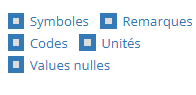

<font color='green'><u>**REMPLACONS les NA par des Valeurs nulles**</u></font>

In [280]:
#mask pour 'Valeur' manquantes
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:]

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
6,DZA,Algérie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...
431,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
436,ZMB,Zambie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
437,ZMB,Zambie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>
438,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,<NA>


In [281]:
#REMPLACEMENT DES VALEURS NA par 0

#mask pour 'Valeur' manquantes
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Valeur'].isna()

#Remplaçons les valeurs manquantes par des zéros :
df_Commerce_Fra_2022_analyse_1_1.fillna({'Valeur': 0}, inplace=True)

#Df avec 'Valeur' anciennement manquantes
df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
#liste_pays_Valeur_manquante = (df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
#liste_pays_Valeur_manquante

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
6,DZA,Algérie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
...,...,...,...,...,...,...,...,...,...
431,VEN,Venezuela (République bolivarienne du),5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
436,ZMB,Zambie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
437,ZMB,Zambie,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
438,ZWE,Zimbabwe,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0


<u>Problématique technique :</u>  
Un de mes problèmes est que pour les lignes ou il y a des NA j'ai aussi des NA dans Unité.  
Ce qui pose problème pour la création de la colonne 'Élément-Unité'

##### A. option CHOISIE: je peux compléter les données 'Unité' même là ou il ya des Unités et valeur NA :

In [282]:
#mask pour 'Unité' manquantes
mask_temp = df_Commerce_Fra_2022_analyse_1_1['Unité'].isna()

#Df avec 'Unité' manquantes
(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:]).head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0
6,DZA,Algérie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,<NA>,0.0


In [283]:
#Ecriture de l'UNité pour les NA :
mask = (df_Commerce_Fra_2022_analyse_1_1['Code Élément']=='5910')|(df_Commerce_Fra_2022_analyse_1_1['Code Élément']=='5610')
df_Commerce_Fra_2022_analyse_1_1.loc[mask,'Unité']='tonnes'

mask = (df_Commerce_Fra_2022_analyse_1_1['Code Élément']=='5922')|(df_Commerce_Fra_2022_analyse_1_1['Code Élément']=='5622')
df_Commerce_Fra_2022_analyse_1_1.loc[mask,'Unité']='1000 USD'

In [284]:
#Df avec 'Unité' manquantes
(df_Commerce_Fra_2022_analyse_1_1.loc[mask_temp,:]).head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
6,DZA,Algérie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0


##### B. option B NON CHOISIE : supprimer les lignes avec des Unités et valeur NA dans le cas ou on ne remplace pas les valeurs par zéro

Uniquement si un NA était considéré comme une absence de données .  
Ce qui ne semblent pas être le cas au vu des données de la FAO considérées comme nulles, différentes d'une absence de données ne figurant pas.

Pas de perte d'information utile. (un NA signifie une absence de données et pas une valeur nulle).  
Les valeurs NA réapparaitront au besoin lors de la jointure.

##### C. BILAN suite modification

In [285]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Commerce_Fra_2022_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],440,440,0,220,0.0
Zone,string[python],440,440,0,220,0.0
Code Élément,string[python],440,440,0,2,0.0
Élément,string[python],440,440,0,2,0.0
Code Produit (CPC),string[python],440,440,0,1,0.0
Produit,string[python],440,440,0,1,0.0
Année,Int64,440,440,0,1,NaN
Unité,string[python],440,440,0,2,0.0
Valeur,Float64,440,440,0,185,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [286]:
df_Commerce_Fra_2022_analyse_1_1 .head()

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0
4,ALB,Albanie,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,491.3


In [287]:
#Creation d'une colonne Pivot avec contenu explicite
df_Commerce_Fra_2022_analyse_1_1['Élément-Unité']=(df_Commerce_Fra_2022_analyse_1_1['Élément']+" - Poulet - "
                                                   +df_Commerce_Fra_2022_analyse_1_1['Unité'])
df_Commerce_Fra_2022_analyse_1_1.head(4)

,Code zone (ISO3),Zone,Code Élément,Élément,Code Produit (CPC),Produit,Année,Unité,Valeur,Élément-Unité
0,AFG,Afghanistan,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0,Exportations - quantité - Poulet - tonnes
1,AFG,Afghanistan,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0,Exportations - valeur - Poulet - 1000 USD
2,ZAF,Afrique du Sud,5910,Exportations - quantité,21121,"Viande, poulet, fraîche ou réfrigérée",2022,tonnes,0.0,Exportations - quantité - Poulet - tonnes
3,ZAF,Afrique du Sud,5922,Exportations - valeur,21121,"Viande, poulet, fraîche ou réfrigérée",2022,1000 USD,0.0,Exportations - valeur - Poulet - 1000 USD


In [288]:
#PIVOT
df_Commerce_Fra_2022_analyse_1_2_pivoted = df_Commerce_Fra_2022_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone'],
                                                                        columns='Élément-Unité',
                                                                        values='Valeur')

df_Commerce_Fra_2022_analyse_1_2_pivoted.head(4)

,Élément-Unité,Exportations - quantité - Poulet - tonnes,Exportations - valeur - Poulet - 1000 USD
Code zone (ISO3),Zone,,
34,Iles Canton et Enderbury,0.0,0.0
AFG,Afghanistan,0.0,0.0
AGO,Angola,248.37,220.0
ALB,Albanie,491.3,574.0


In [289]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_Commerce_Fra_2022_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_Commerce_Fra_2022_analyse_1_2_pivoted = df_Commerce_Fra_2022_analyse_1_2_pivoted.reset_index()
df_Commerce_Fra_2022_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Exportations - quantité - Poulet - tonnes,Exportations - valeur - Poulet - 1000 USD
0,34,Iles Canton et Enderbury,0.0,0.0
1,AFG,Afghanistan,0.0,0.0
2,AGO,Angola,248.37,220.0
3,ALB,Albanie,491.3,574.0
4,ARE,Émirats arabes unis,6097.0,12840.0


In [290]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Commerce_Fra_2022_analyse_1_2_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],220,220,0,220,0.0
Zone,string[python],220,220,0,220,0.0
Exportations - quantité - Poulet - tonnes,Float64,220,220,0,95,NaN
Exportations - valeur - Poulet - 1000 USD,Float64,220,220,0,92,NaN


###### <u>**HARMONISONS LES UNITES :**</u>

In [291]:
#Passons de tonnes à kg
df_Commerce_Fra_2022_analyse_1_2_pivoted["Exportations - quantité - Poulet - tonnes"]*=1_000

#Passons de 1000 USD à USD :
df_Commerce_Fra_2022_analyse_1_2_pivoted["Exportations - valeur - Poulet - 1000 USD"]*=1_000

#Mettons à jour le nom des colonnes
df_Commerce_Fra_2022_analyse_1_2_pivoted  .rename(
    columns={"Exportations - quantité - Poulet - tonnes" : 'Exportations Poulet Fr Qté (kg)',
             "Exportations - valeur - Poulet - 1000 USD" : "Exportations Poulet Val (USD)"},
    inplace=True)

df_Commerce_Fra_2022_analyse_1_2_pivoted  .head(2)

,Code zone (ISO3),Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Val (USD)
0,34,Iles Canton et Enderbury,0.0,0.0
1,AFG,Afghanistan,0.0,0.0


###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

Remarque lors de la division par des zéros :  
Pandas renverra :
NaN si l’un des deux opérandes est NaN
inf ou -inf si le numérateur est non nul et le dénominateur est zéro
NaN si le numérateur et le dénominateur sont tous les deux zéro.

In [292]:
#Pour gérer le risque de division par zéro, qui peut donner des Nan , des -inf ou des +inf; 
#remplaçons les 0 par des nan avant division ce qui forcera le résultat
denominateur = df_Commerce_Fra_2022_analyse_1_2_pivoted['Exportations Poulet Fr Qté (kg)'].replace(0, np.nan)

df_Commerce_Fra_2022_analyse_1_2_pivoted['Exportations Poulet Fr Prix (USD/kg)'] = (
    df_Commerce_Fra_2022_analyse_1_2_pivoted['Exportations Poulet Val (USD)']/
    denominateur)

#par sécurité évitons les inf et -inf
df_Commerce_Fra_2022_analyse_1_2_pivoted['Exportations Poulet Fr Prix (USD/kg)']=(
    df_Commerce_Fra_2022_analyse_1_2_pivoted['Exportations Poulet Fr Prix (USD/kg)']).replace([np.inf, -np.inf], np.nan)

df_Commerce_Fra_2022_analyse_1_2_pivoted.head(2)

,Code zone (ISO3),Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Val (USD),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,0.0,<NA>
1,AFG,Afghanistan,0.0,0.0,<NA>


###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [293]:
df_Commerce_Fra_2022_analyse_1_2_pivoted .head(2)

,Code zone (ISO3),Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Val (USD),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,0.0,<NA>
1,AFG,Afghanistan,0.0,0.0,<NA>


In [294]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Commerce_Fra_2022_analyse_1_2_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],220,220,0,220,0.0
Zone,string[python],220,220,0,220,0.0
Exportations Poulet Fr Qté (kg),Float64,220,220,0,95,NaN
Exportations Poulet Val (USD),Float64,220,220,0,92,NaN
Exportations Poulet Fr Prix (USD/kg),Float64,220,94,126,94,NaN


In [295]:
df_Commerce_Fra_2022_analyse_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone', 'Exportations Poulet Fr Qté (kg)',
       'Exportations Poulet Val (USD)',
       'Exportations Poulet Fr Prix (USD/kg)'],
      dtype='object')

In [296]:
#Créons notre df 

# Choix de lignes : 
#mask_temp = (df_XXX_analyse_1_2_pivoted ["AAA"]==???) & (Conditions2)

#Choix des colonnes :
liste_col_temp = ['Code zone (ISO3)', 'Zone',
                  'Exportations Poulet Fr Qté (kg)','Exportations Poulet Fr Prix (USD/kg)']

df_Commerce_Fra_2022_analyse_1_3_pivoted = ( df_Commerce_Fra_2022_analyse_1_2_pivoted .loc[:,liste_col_temp] ).copy(deep=True)
df_Commerce_Fra_2022_analyse_1_3_pivoted .head()

,Code zone (ISO3),Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,<NA>
1,AFG,Afghanistan,0.0,<NA>
2,AGO,Angola,248370.0,0.885775
3,ALB,Albanie,491300.0,1.168329
4,ARE,Émirats arabes unis,6097000.0,2.105954


###### <u>**RENOMMONS DES COLONNES :**</u>

In [297]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Commerce_Fra_2022_analyse_1_3_pivoted  .rename(columns={"Code zone (ISO3)" : 'iso3'#,
                                               },
                                     inplace=True)
df_Commerce_Fra_2022_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,<NA>
1,AFG,Afghanistan,0.0,<NA>


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [298]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Commerce_Fra_2022_analyse_1_3_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    220
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [299]:
df_Commerce_Fra_2022_analyse_1_3_pivoted  .head(5)

,iso3,Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,<NA>
1,AFG,Afghanistan,0.0,<NA>
2,AGO,Angola,248370.0,0.885775
3,ALB,Albanie,491300.0,1.168329
4,ARE,Émirats arabes unis,6097000.0,2.105954


In [300]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Commerce_Fra_2022_analyse_1_3_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],220,220,0,220,0.0
Zone,string[python],220,220,0,220,0.0
Exportations Poulet Fr Qté (kg),Float64,220,220,0,95,NaN
Exportations Poulet Fr Prix (USD/kg),Float64,220,94,126,94,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [301]:
df_prejointure_Commerce_Fra_2022 = df_Commerce_Fra_2022_analyse_1_3_pivoted.copy(deep=True)

In [302]:
df_prejointure_Commerce_Fra_2022 .head(5)

,iso3,Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,<NA>
1,AFG,Afghanistan,0.0,<NA>
2,AGO,Angola,248370.0,0.885775
3,ALB,Albanie,491300.0,1.168329
4,ARE,Émirats arabes unis,6097000.0,2.105954


In [303]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Commerce_Fra_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],220,220,0,220,0.0
Zone,string[python],220,220,0,220,0.0
Exportations Poulet Fr Qté (kg),Float64,220,220,0,95,NaN
Exportations Poulet Fr Prix (USD/kg),Float64,220,94,126,94,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.9 - Transport-Infrastructure logistiques - source BM : df_Transport</h4>
</div>

- Thème : Transport-Infrastructure logistiques  
- Site : BM-Banque MOndiale  
- Source :

https://data360.worldbank.org/en/dataset/WB_LPI

https://data360.worldbank.org/en/indicator/WB_LPI_LP_LPI_INFR_X   
- Données 
 1. BM WB-WorldBank-Logistics Performance Index  
   Quality of trade- and transport-related infrastructure, score (1=low to 5=high)  
   TIME PERIODE-2023-OBS_VALUE     
- Année choisie : 2023 (Choix des données les plus récentes possibles, pas d'opération avec les autres données)  
- (Années dispo : 2007, 2010, 2012, 2014, 2016, 2018, 2023)  

- Fichier local : WB_LPI_LP_LPI_INFR_XQ_Transport_2023.csv  


##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [304]:
#CHARGEMENT de ZZZ.xls

df_Transport = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\WB_LPI_LP_LPI_INFR_XQ_Transport_2023.csv",
                         sep = ',')

df_Transport .head(5)

,STRUCTURE,STRUCTURE_ID,ACTION,FREQ,FREQ_LABEL,REF_AREA,REF_AREA_LABEL,INDICATOR,INDICATOR_LABEL,SEX,...,UNIT_MULT,UNIT_MULT_LABEL,UNIT_TYPE,UNIT_TYPE_LABEL,TIME_FORMAT,TIME_FORMAT_LABEL,OBS_STATUS,OBS_STATUS_LABEL,OBS_CONF,OBS_CONF_LABEL
0,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_LPI_LP_LPI_INFR_XQ,Quality of trade- and transport-related infras...,_T,...,0,Units,NUMBER,Number (real number),602,CCYY,A,Normal value,PU,Public
1,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_LPI_LP_LPI_INFR_XQ,Quality of trade- and transport-related infras...,_T,...,0,Units,NUMBER,Number (real number),602,CCYY,A,Normal value,PU,Public
2,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_LPI_LP_LPI_INFR_XQ,Quality of trade- and transport-related infras...,_T,...,0,Units,NUMBER,Number (real number),602,CCYY,A,Normal value,PU,Public
3,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_LPI_LP_LPI_INFR_XQ,Quality of trade- and transport-related infras...,_T,...,0,Units,NUMBER,Number (real number),602,CCYY,A,Normal value,PU,Public
4,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_LPI_LP_LPI_INFR_XQ,Quality of trade- and transport-related infras...,_T,...,0,Units,NUMBER,Number (real number),602,CCYY,A,Normal value,PU,Public


In [305]:
Premieres_Analyses( df_Transport )


---- SHAPE ----


(1190, 37)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 37 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   STRUCTURE               1190 non-null   object 
 1   STRUCTURE_ID            1190 non-null   object 
 2   ACTION                  1190 non-null   object 
 3   FREQ                    1190 non-null   object 
 4   FREQ_LABEL              1190 non-null   object 
 5   REF_AREA                1190 non-null   object 
 6   REF_AREA_LABEL          1190 non-null   object 
 7   INDICATOR               1190 non-null   object 
 8   INDICATOR_LABEL         1190 non-null   object 
 9   SEX                     1190 non-null   object 
 10  SEX_LABEL               1190 non-null   object 
 11  AGE                     1190 non-null   object 
 12  AGE_LABEL               1190 non-null   object 
 13  URBANISATION            1190 non-null   object 
 14  URBANISATION_LABEL      

,TIME_PERIOD,OBS_VALUE,UNIT_MULT,TIME_FORMAT
count,1190.000000,1079.000000,1190.0,1190.0
mean,2014.285714,2.733536,0.0,602.0
std,4.921833,0.704424,0.0,0.0
min,2007.000000,1.100000,0.0,602.0
25%,2010.000000,2.216720,0.0,602.0
50%,2014.000000,2.540816,0.0,602.0
75%,2018.000000,3.183053,0.0,602.0
max,2023.000000,4.600000,0.0,602.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
STRUCTURE,object,1190,1190,0,1,0.0
STRUCTURE_ID,object,1190,1190,0,1,0.0
ACTION,object,1190,1190,0,1,0.0
FREQ,object,1190,1190,0,1,0.0
FREQ_LABEL,object,1190,1190,0,1,0.0
REF_AREA,object,1190,1190,0,170,0.0
REF_AREA_LABEL,object,1190,1190,0,170,0.0
INDICATOR,object,1190,1190,0,1,0.0
INDICATOR_LABEL,object,1190,1190,0,1,0.0
SEX,object,1190,1190,0,1,0.0


In [306]:
df_Transport.columns

Index(['STRUCTURE', 'STRUCTURE_ID', 'ACTION', 'FREQ', 'FREQ_LABEL', 'REF_AREA',
       'REF_AREA_LABEL', 'INDICATOR', 'INDICATOR_LABEL', 'SEX', 'SEX_LABEL',
       'AGE', 'AGE_LABEL', 'URBANISATION', 'URBANISATION_LABEL',
       'UNIT_MEASURE', 'UNIT_MEASURE_LABEL', 'COMP_BREAKDOWN_1',
       'COMP_BREAKDOWN_1_LABEL', 'COMP_BREAKDOWN_2', 'COMP_BREAKDOWN_2_LABEL',
       'COMP_BREAKDOWN_3', 'COMP_BREAKDOWN_3_LABEL', 'TIME_PERIOD',
       'OBS_VALUE', 'DATABASE_ID', 'DATABASE_ID_LABEL', 'UNIT_MULT',
       'UNIT_MULT_LABEL', 'UNIT_TYPE', 'UNIT_TYPE_LABEL', 'TIME_FORMAT',
       'TIME_FORMAT_LABEL', 'OBS_STATUS', 'OBS_STATUS_LABEL', 'OBS_CONF',
       'OBS_CONF_LABEL'],
      dtype='object')

In [307]:
print("Quelques données :",
      "\n-------------------------\n\n")

liste_col_temp = ['INDICATOR_LABEL','TIME_PERIOD','OBS_VALUE']

for col in liste_col_temp :
    print("valeurs de la colonne ",col," :")
    print("-------------------------")
    print(df_Transport[col].unique())
    print("\n","*"*10)

Quelques données : 
-------------------------


valeurs de la colonne  INDICATOR_LABEL  :
-------------------------
['Quality of trade- and transport-related infrastructure, score (1=low to 5=high)']

 **********
valeurs de la colonne  TIME_PERIOD  :
-------------------------
[2023 2018 2016 2014 2012 2010 2007]

 **********
valeurs de la colonne  OBS_VALUE  :
-------------------------
[1.7      1.807143 1.835473 1.818951 2.003611 1.873596 1.1      2.7
 2.293674 1.980952      nan 2.426877 2.144558 2.33333  2.1      2.421383
 2.577318 2.540816 2.016162 2.059659 1.83333  1.857143 2.133789 2.105263
 2.482869 1.6875   2.25     2.8      2.773509 2.856412 2.831158 2.943176
 2.750209 2.80556  2.6      2.484109 2.216773 2.375    2.37602  2.323333
 1.77778  4.1      3.968431 3.816468 3.99996  3.827374 3.783343 3.64706
 3.9      4.181584 4.07841  3.63611  4.054348 3.679825 4.06061  2.714286
 2.417233 2.229257 2.       2.5      2.408433 2.721296 2.740867 2.769957
 2.396078 3.6      2.72488  3.095

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [308]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Transport # supprime la référence à l'ancien DataFrame

gc.collect()  # force le nettoyage de la mémoire

0

In [309]:
liste_col_temp = ['REF_AREA','REF_AREA_LABEL',
                  'INDICATOR_LABEL','TIME_PERIOD','OBS_VALUE']

df_Transport = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\WB_LPI_LP_LPI_INFR_XQ_Transport_2023.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'REF_AREA': "string",
                                   'REF_AREA_LABEL': "string",
                                   'INDICATOR_LABEL': "string",
                                   'TIME_PERIOD' : "Int64",
                                   'OBS_VALUE' : "Float64"}
                                 )

df_Transport.head(5)

,REF_AREA,REF_AREA_LABEL,INDICATOR_LABEL,TIME_PERIOD,OBS_VALUE
0,AFG,Afghanistan,Quality of trade- and transport-related infras...,2023,1.7
1,AFG,Afghanistan,Quality of trade- and transport-related infras...,2018,1.807143
2,AFG,Afghanistan,Quality of trade- and transport-related infras...,2016,1.835473
3,AFG,Afghanistan,Quality of trade- and transport-related infras...,2014,1.818951
4,AFG,Afghanistan,Quality of trade- and transport-related infras...,2012,2.003611


In [310]:
Premieres_Analyses( df_Transport )


---- SHAPE ----


(1190, 5)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   REF_AREA         1190 non-null   string 
 1   REF_AREA_LABEL   1190 non-null   string 
 2   INDICATOR_LABEL  1190 non-null   string 
 3   TIME_PERIOD      1190 non-null   Int64  
 4   OBS_VALUE        1079 non-null   Float64
dtypes: Float64(1), Int64(1), string(3)
memory usage: 48.9 KB

---- DESCRIBE ----


,TIME_PERIOD,OBS_VALUE
count,1190.0,1079.0
mean,2014.285714,2.733536
std,4.921833,0.704424
min,2007.0,1.1
25%,2010.0,2.21672
50%,2014.0,2.540816
75%,2018.0,3.183053
max,2023.0,4.6



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
REF_AREA,string[python],1190,1190,0,170,0.0
REF_AREA_LABEL,string[python],1190,1190,0,170,0.0
INDICATOR_LABEL,string[python],1190,1190,0,1,0.0
TIME_PERIOD,Int64,1190,1190,0,7,NaN
OBS_VALUE,Float64,1190,1079,111,874,NaN


In [311]:
df_Transport.columns

Index(['REF_AREA', 'REF_AREA_LABEL', 'INDICATOR_LABEL', 'TIME_PERIOD',
       'OBS_VALUE'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [312]:
df_Transport_analyse_1_1 = df_Transport.copy(deep=True)

In [313]:
df_Transport_analyse_1_1 .head(2)

,REF_AREA,REF_AREA_LABEL,INDICATOR_LABEL,TIME_PERIOD,OBS_VALUE
0,AFG,Afghanistan,Quality of trade- and transport-related infras...,2023,1.7
1,AFG,Afghanistan,Quality of trade- and transport-related infras...,2018,1.807143


In [314]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Transport_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
REF_AREA,string[python],1190,1190,0,170,0.0
REF_AREA_LABEL,string[python],1190,1190,0,170,0.0
INDICATOR_LABEL,string[python],1190,1190,0,1,0.0
TIME_PERIOD,Int64,1190,1190,0,7,NaN
OBS_VALUE,Float64,1190,1079,111,874,NaN


###### <font color='green'>**RENOMMONS DES COLONNES**</font>  
Afin d'être homogène, avec le traitement des autres DataFrame,  
Renommons les colonnes à l'identique des fichiers FAO

In [315]:
#Afin de travailler avec les mêmes termes que sur les autres fichiers et après avori supprimé la colonne pays d'origine :
df_Transport_analyse_1_1  .rename(columns={"REF_AREA" : 'Code zone (ISO3)',
                                           "REF_AREA_LABEL" : "Zone",
                                           "INDICATOR_LABEL":"Élément-Unité",
                                           "TIME_PERIOD" : "Année",
                                           "OBS_VALUE" : "Valeur"
                                           },
                                     inplace=True)
df_Transport_analyse_1_1  .head(2)

,Code zone (ISO3),Zone,Élément-Unité,Année,Valeur
0,AFG,Afghanistan,Quality of trade- and transport-related infras...,2023,1.7
1,AFG,Afghanistan,Quality of trade- and transport-related infras...,2018,1.807143


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [316]:
#mask pour 'Valeur' manquantes
mask_temp = df_Transport_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_Transport_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
[                 'Albania',      'Antigua and Barbuda',
               'Azerbaijan',             'Bahamas, The',
               'Bangladesh',                  'Belarus',
                 'Botswana',        'Brunei Darussalam',
                  'Burundi', 'Central African Republic',
                     'Chad',                  'Comoros',
         'Congo, Dem. Rep.',              'Congo, Rep.',
            "Cote d'Ivoire",                     'Cuba',
                  'Ecuador',        'Equatorial Guinea',
                  'Eritrea',                 'Ethiopia',
                     'Fiji',              'Gambia, The',
                  'Georgia',                  'Grenada',
                  'Iceland',       'Iran, Islamic Rep.',
                     'Iraq',                   'Israel',
                   'Jordan',                    'Kenya',
                  'Lebanon',                  'Lesotho',
                    'Libya',                   'Malawi',
                 

In [317]:
#Suppression des lignes avec NA sur la colonne Valeur
df_Transport_analyse_1_1.dropna(axis=0,
                                subset=['Valeur'],
                                how ='any',
                                inplace=True)


In [318]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Transport_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],1079,1079,0,170,0.0
Zone,string[python],1079,1079,0,170,0.0
Élément-Unité,string[python],1079,1079,0,1,0.0
Année,Int64,1079,1079,0,7,NaN
Valeur,Float64,1079,1079,0,874,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [319]:
df_Transport_analyse_1_1.head()

,Code zone (ISO3),Zone,Élément-Unité,Année,Valeur
0,AFG,Afghanistan,Quality of trade- and transport-related infras...,2023,1.7
1,AFG,Afghanistan,Quality of trade- and transport-related infras...,2018,1.807143
2,AFG,Afghanistan,Quality of trade- and transport-related infras...,2016,1.835473
3,AFG,Afghanistan,Quality of trade- and transport-related infras...,2014,1.818951
4,AFG,Afghanistan,Quality of trade- and transport-related infras...,2012,2.003611


In [320]:
#PIVOT
df_Transport_analyse_1_2_pivoted = df_Transport_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone','Année'],#nécessité de rajouter l'Année
                                                                  columns='Élément-Unité',
                                                                  values='Valeur')

df_Transport_analyse_1_2_pivoted.head(4)

Élément-Unité                       Quality of trade- and transport-related infrastructure, score (1=low to 5=high)
Code zone (ISO3) Zone        Année                                                                                 
AFG              Afghanistan 2007                                                 1.1                              
                             2010                                            1.873596                              
                             2012                                            2.003611                              
                             2014                                            1.818951

In [321]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_Transport_analyse_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_Transport_analyse_1_2_pivoted = df_Transport_analyse_1_2_pivoted.reset_index()
df_Transport_analyse_1_2_pivoted.head()

,Code zone (ISO3),Zone,Année,"Quality of trade- and transport-related infrastructure, score (1=low to 5=high)"
0,AFG,Afghanistan,2007,1.1
1,AFG,Afghanistan,2010,1.873596
2,AFG,Afghanistan,2012,2.003611
3,AFG,Afghanistan,2014,1.818951
4,AFG,Afghanistan,2016,1.835473


In [322]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Transport_analyse_1_2_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],1079,1079,0,170,0.0
Zone,string[python],1079,1079,0,170,0.0
Année,Int64,1079,1079,0,7,NaN
"Quality of trade- and transport-related infrastructure, score (1=low to 5=high)",Float64,1079,1079,0,874,NaN


###### <u>**HARMONISONS LES UNITES :**</u>

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [323]:
df_Transport_analyse_1_2_pivoted .head(8)

,Code zone (ISO3),Zone,Année,"Quality of trade- and transport-related infrastructure, score (1=low to 5=high)"
0,AFG,Afghanistan,2007,1.1
1,AFG,Afghanistan,2010,1.873596
2,AFG,Afghanistan,2012,2.003611
3,AFG,Afghanistan,2014,1.818951
4,AFG,Afghanistan,2016,1.835473
5,AFG,Afghanistan,2018,1.807143
6,AFG,Afghanistan,2023,1.7
7,AGO,Angola,2007,2.25


In [324]:
df_Transport_analyse_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone', 'Année',
       'Quality of trade- and transport-related infrastructure, score (1=low to 5=high)'],
      dtype='string')

In [325]:
#Créons notre df 

# Choix de lignes : ANNEE 2023
mask_temp = (df_Transport_analyse_1_2_pivoted ["Année"]==2023)

#Choix des colonnes : PAS DE COLONNES INUTILES
#liste_col_temp = ['Code zone (ISO3)', 'Zone', ...]

df_Transport_analyse_1_3_pivoted = ( df_Transport_analyse_1_2_pivoted .loc[mask_temp,:] ).copy(deep=True)
df_Transport_analyse_1_3_pivoted .head(8)

,Code zone (ISO3),Zone,Année,"Quality of trade- and transport-related infrastructure, score (1=low to 5=high)"
6,AFG,Afghanistan,2023,1.7
13,AGO,Angola,2023,2.1
19,ALB,Albania,2023,2.7
26,ARE,United Arab Emirates,2023,4.1
33,ARG,Argentina,2023,2.8
40,ARM,Armenia,2023,2.6
41,ATG,Antigua and Barbuda,2023,2.7
48,AUS,Australia,2023,4.1


###### <u>**RENOMMONS DES COLONNES :**</u>

In [326]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Transport_analyse_1_3_pivoted  .rename(
    columns={"Code zone (ISO3)" : 'iso3',
             "Quality of trade- and transport-related infrastructure, score (1=low to 5=high)" :"Score Qualité Transport 2023 (1 à 5)"
             },
    inplace=True)

df_Transport_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Année,Score Qualité Transport 2023 (1 à 5)
6,AFG,Afghanistan,2023,1.7
13,AGO,Angola,2023,2.1


In [327]:
#Suppression de la colonne Année devenue inutile :

del df_Transport_analyse_1_3_pivoted["Année"]

df_Transport_analyse_1_3_pivoted.head()

,iso3,Zone,Score Qualité Transport 2023 (1 à 5)
6,AFG,Afghanistan,1.7
13,AGO,Angola,2.1
19,ALB,Albania,2.7
26,ARE,United Arab Emirates,4.1
33,ARG,Argentina,2.8


In [328]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Transport_analyse_1_3_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],139,139,0,139,0.0
Zone,string[python],139,139,0,139,0.0
Score Qualité Transport 2023 (1 à 5),Float64,139,139,0,29,NaN


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [329]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Transport_analyse_1_3_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    139
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [330]:
df_Transport_analyse_1_3_pivoted  .head(2)

,iso3,Zone,Score Qualité Transport 2023 (1 à 5)
6,AFG,Afghanistan,1.7
13,AGO,Angola,2.1


In [331]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Transport_analyse_1_3_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],139,139,0,139,0.0
Zone,string[python],139,139,0,139,0.0
Score Qualité Transport 2023 (1 à 5),Float64,139,139,0,29,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [332]:
df_prejointure_Transport = df_Transport_analyse_1_3_pivoted.copy(deep=True)

In [333]:
df_prejointure_Transport .head(5)

,iso3,Zone,Score Qualité Transport 2023 (1 à 5)
6,AFG,Afghanistan,1.7
13,AGO,Angola,2.1
19,ALB,Albania,2.7
26,ARE,United Arab Emirates,4.1
33,ARG,Argentina,2.8


In [334]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Transport )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],139,139,0,139,0.0
Zone,string[python],139,139,0,139,0.0
Score Qualité Transport 2023 (1 à 5),Float64,139,139,0,29,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.10 - Stabilité politique    - source FAO : </h4>
</div>

- Thème : Stabilité politique   
- Site : BM-Banque Mondiale  
- Source :

https://data360.worldbank.org/en/dataset/WB_WGI  
https://data360.worldbank.org/en/indicator/WB_WGI_PV_PER_RN  
 
- Données   1. BM WB-WorldBank-WGI-Worldwide Governance Indicators (WGI)  
Political Stability and Absence of Violence/Terrorism: Estimat  e
TIME PERIODE-2023-OBS_VAL  
  
- Année choisie : 2023 (Choix des données les plus récentes possibles, pasopérationion avec les autres données)  
- (Années dispo1996 à 8, 2023)  

- Fichier localWB_WGI_PV_PER_RNK_Stab_Politiq_2023.csvcs  


##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

In [335]:
#CHARGEMENT de WB_WGI_PV_PER_RNK_Stab_Politiq_2023.csv

df_Stabilite_Politique = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\WB_WGI_PV_PER_RNK_Stab_Politiq_2023.csv",
                         sep = ',')

df_Stabilite_Politique .head(5)

,STRUCTURE,STRUCTURE_ID,ACTION,FREQ,FREQ_LABEL,REF_AREA,REF_AREA_LABEL,INDICATOR,INDICATOR_LABEL,SEX,...,DATABASE_ID,DATABASE_ID_LABEL,UNIT_MULT,UNIT_MULT_LABEL,UNIT_TYPE,UNIT_TYPE_LABEL,OBS_STATUS,OBS_STATUS_LABEL,OBS_CONF,OBS_CONF_LABEL
0,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,ABW,Aruba,WB_WGI_PV_PER_RNK,Political Stability and Absence of Violence/Te...,_T,...,WB_WGI,Worldwide Governance Indicators (WGI),0,Units,NUMBER,Number (real number),O,Missing value,PU,Public
1,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AFG,Afghanistan,WB_WGI_PV_PER_RNK,Political Stability and Absence of Violence/Te...,_T,...,WB_WGI,Worldwide Governance Indicators (WGI),0,Units,NUMBER,Number (real number),A,Normal value,PU,Public
2,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AGO,Angola,WB_WGI_PV_PER_RNK,Political Stability and Absence of Violence/Te...,_T,...,WB_WGI,Worldwide Governance Indicators (WGI),0,Units,NUMBER,Number (real number),A,Normal value,PU,Public
3,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,AIA,Anguilla,WB_WGI_PV_PER_RNK,Political Stability and Absence of Violence/Te...,_T,...,WB_WGI,Worldwide Governance Indicators (WGI),0,Units,NUMBER,Number (real number),O,Missing value,PU,Public
4,datastructure,WB.DATA360:DS_DATA360(1.2),I,A,Annual,ALB,Albania,WB_WGI_PV_PER_RNK,Political Stability and Absence of Violence/Te...,_T,...,WB_WGI,Worldwide Governance Indicators (WGI),0,Units,NUMBER,Number (real number),A,Normal value,PU,Public


In [336]:
Premieres_Analyses( df_Stabilite_Politique )


---- SHAPE ----


(5350, 35)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5350 entries, 0 to 5349
Data columns (total 35 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   STRUCTURE               5350 non-null   object 
 1   STRUCTURE_ID            5350 non-null   object 
 2   ACTION                  5350 non-null   object 
 3   FREQ                    5350 non-null   object 
 4   FREQ_LABEL              5350 non-null   object 
 5   REF_AREA                5350 non-null   object 
 6   REF_AREA_LABEL          5350 non-null   object 
 7   INDICATOR               5350 non-null   object 
 8   INDICATOR_LABEL         5350 non-null   object 
 9   SEX                     5350 non-null   object 
 10  SEX_LABEL               5350 non-null   object 
 11  AGE                     5350 non-null   object 
 12  AGE_LABEL               5350 non-null   object 
 13  URBANISATION            5350 non-null   object 
 14  URBANISATION_LABEL      

,TIME_PERIOD,OBS_VALUE,UNIT_MULT
count,5350.000000,5178.000000,5350.0
mean,2010.760000,50.031752,0.0
std,7.612702,29.047940,0.0
min,1996.000000,0.000000,0.0
25%,2005.000000,24.900794,0.0
50%,2011.000000,50.000000,0.0
75%,2017.000000,75.132278,0.0
max,2023.000000,100.000000,0.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
STRUCTURE,object,5350,5350,0,1,0.0
STRUCTURE_ID,object,5350,5350,0,1,0.0
ACTION,object,5350,5350,0,1,0.0
FREQ,object,5350,5350,0,1,0.0
FREQ_LABEL,object,5350,5350,0,1,0.0
REF_AREA,object,5350,5350,0,214,0.0
REF_AREA_LABEL,object,5350,5350,0,214,0.0
INDICATOR,object,5350,5350,0,1,0.0
INDICATOR_LABEL,object,5350,5350,0,1,0.0
SEX,object,5350,5350,0,1,0.0


In [337]:
df_Stabilite_Politique.columns

Index(['STRUCTURE', 'STRUCTURE_ID', 'ACTION', 'FREQ', 'FREQ_LABEL', 'REF_AREA',
       'REF_AREA_LABEL', 'INDICATOR', 'INDICATOR_LABEL', 'SEX', 'SEX_LABEL',
       'AGE', 'AGE_LABEL', 'URBANISATION', 'URBANISATION_LABEL',
       'UNIT_MEASURE', 'UNIT_MEASURE_LABEL', 'COMP_BREAKDOWN_1',
       'COMP_BREAKDOWN_1_LABEL', 'COMP_BREAKDOWN_2', 'COMP_BREAKDOWN_2_LABEL',
       'COMP_BREAKDOWN_3', 'COMP_BREAKDOWN_3_LABEL', 'TIME_PERIOD',
       'OBS_VALUE', 'DATABASE_ID', 'DATABASE_ID_LABEL', 'UNIT_MULT',
       'UNIT_MULT_LABEL', 'UNIT_TYPE', 'UNIT_TYPE_LABEL', 'OBS_STATUS',
       'OBS_STATUS_LABEL', 'OBS_CONF', 'OBS_CONF_LABEL'],
      dtype='object')

In [338]:
print("Quelques données :",
      "\n-------------------------\n\n")

liste_col_temp = ['INDICATOR_LABEL','TIME_PERIOD','OBS_VALUE']

for col in liste_col_temp :
    print("valeurs de la colonne ",col," :")
    print("-------------------------")
    print(df_Stabilite_Politique[col].unique())
    print("\n","*"*10)

Quelques données : 
-------------------------


valeurs de la colonne  INDICATOR_LABEL  :
-------------------------
['Political Stability and Absence of Violence/Terrorism: Percentile Rank']

 **********
valeurs de la colonne  TIME_PERIOD  :
-------------------------
[1996 1998 2000 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012
 2013 2014 2015 2016 2017 2018 2019 2020 2021 2022 2023]

 **********
valeurs de la colonne  OBS_VALUE  :
-------------------------
[        nan  2.12765956  3.72340417 ... 81.13207245 72.64151001
 96.22641754]

 **********


##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

In [339]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

del df_Stabilite_Politique # supprime la référence à l'ancien DataFrame

gc.collect()  # force le nettoyage de la mémoire

0

In [340]:
liste_col_temp = ['REF_AREA','REF_AREA_LABEL',
                  'INDICATOR_LABEL','TIME_PERIOD','OBS_VALUE']

df_Stabilite_Politique = pd.read_csv(r"D:\BDD\OCR\P11\Selection_Sources\WB_WGI_PV_PER_RNK_Stab_Politiq_2023.csv",
                            sep = ',',
                            usecols=liste_col_temp,
                            dtype={'REF_AREA': "string",
                                   'REF_AREA_LABEL': "string",
                                   'INDICATOR_LABEL': "string",
                                   'TIME_PERIOD' : "Int64",
                                   'OBS_VALUE' : "Float64"}
                                 )

df_Stabilite_Politique.head(5)

,REF_AREA,REF_AREA_LABEL,INDICATOR_LABEL,TIME_PERIOD,OBS_VALUE
0,ABW,Aruba,Political Stability and Absence of Violence/Te...,1996,<NA>
1,AFG,Afghanistan,Political Stability and Absence of Violence/Te...,1996,2.12766
2,AGO,Angola,Political Stability and Absence of Violence/Te...,1996,3.723404
3,AIA,Anguilla,Political Stability and Absence of Violence/Te...,1996,<NA>
4,ALB,Albania,Political Stability and Absence of Violence/Te...,1996,35.638298


In [341]:
Premieres_Analyses( df_Stabilite_Politique )


---- SHAPE ----


(5350, 5)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5350 entries, 0 to 5349
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   REF_AREA         5350 non-null   string 
 1   REF_AREA_LABEL   5350 non-null   string 
 2   INDICATOR_LABEL  5350 non-null   string 
 3   TIME_PERIOD      5350 non-null   Int64  
 4   OBS_VALUE        5178 non-null   Float64
dtypes: Float64(1), Int64(1), string(3)
memory usage: 219.6 KB

---- DESCRIBE ----


,TIME_PERIOD,OBS_VALUE
count,5350.0,5178.0
mean,2010.76,50.031752
std,7.612702,29.04794
min,1996.0,0.0
25%,2005.0,24.900794
50%,2011.0,50.0
75%,2017.0,75.132278
max,2023.0,100.0



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
REF_AREA,string[python],5350,5350,0,214,0.0
REF_AREA_LABEL,string[python],5350,5350,0,214,0.0
INDICATOR_LABEL,string[python],5350,5350,0,1,0.0
TIME_PERIOD,Int64,5350,5350,0,25,NaN
OBS_VALUE,Float64,5350,5178,172,1749,NaN


In [342]:
df_Stabilite_Politique.columns

Index(['REF_AREA', 'REF_AREA_LABEL', 'INDICATOR_LABEL', 'TIME_PERIOD',
       'OBS_VALUE'],
      dtype='object')

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

In [343]:
df_Stabilite_Politique_analyse_1_1 = df_Stabilite_Politique.copy(deep=True)

In [344]:
df_Stabilite_Politique_analyse_1_1 .head(2)

,REF_AREA,REF_AREA_LABEL,INDICATOR_LABEL,TIME_PERIOD,OBS_VALUE
0,ABW,Aruba,Political Stability and Absence of Violence/Te...,1996,<NA>
1,AFG,Afghanistan,Political Stability and Absence of Violence/Te...,1996,2.12766


In [345]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Stabilite_Politique_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
REF_AREA,string[python],5350,5350,0,214,0.0
REF_AREA_LABEL,string[python],5350,5350,0,214,0.0
INDICATOR_LABEL,string[python],5350,5350,0,1,0.0
TIME_PERIOD,Int64,5350,5350,0,25,NaN
OBS_VALUE,Float64,5350,5178,172,1749,NaN


###### <font color='green'>**RENOMMONS DES COLONNES**</font>  
Afin d'être homogène, avec le traitement des autres DataFrame,  
Renommons les colonnes à l'identique des fichiers FAO

In [346]:
#Afin de travailler avec les mêmes termes que sur les autres fichiers et après avori supprimé la colonne pays d'origine :
df_Stabilite_Politique_analyse_1_1  .rename(columns={"REF_AREA" : 'Code zone (ISO3)',
                                                     "REF_AREA_LABEL" : "Zone",
                                                     "INDICATOR_LABEL":"Élément-Unité",
                                                     "TIME_PERIOD" : "Année",
                                                     "OBS_VALUE" : "Valeur"},
                                            inplace=True)
df_Stabilite_Politique_analyse_1_1  .head(2)

,Code zone (ISO3),Zone,Élément-Unité,Année,Valeur
0,ABW,Aruba,Political Stability and Absence of Violence/Te...,1996,<NA>
1,AFG,Afghanistan,Political Stability and Absence of Violence/Te...,1996,2.12766


###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

In [347]:
#mask pour 'Valeur' manquantes
mask_temp = df_Stabilite_Politique_analyse_1_1['Valeur'].isna()

#Df avec 'Valeur' manquantes
#df_XXX_analyse_1_1.loc[mask_temp,:]

#liste pays avec 'Valeur' manquantes
liste_pays_Valeur_manquante = (df_Stabilite_Politique_analyse_1_1.loc[mask_temp,: ]['Zone'] ).unique()
liste_pays_Valeur_manquante

<StringArray>
[                'Aruba',              'Anguilla',  'Netherlands Antilles',
        'American Samoa',          'Cook Islands', 'Micronesia, Fed. Sts.',
             'Greenland',                  'Guam',                'Jersey',
              'Kiribati',   'St. Kitts and Nevis',                'Monaco',
      'Marshall Islands',            'Montenegro',                  'Niue',
                 'Nauru',                 'Palau',               'Reunion',
            'San Marino',           'South Sudan',           'Timor-Leste',
                 'Tonga',                'Tuvalu', 'Virgin Islands (U.S.)',
                'Kosovo']
Length: 25, dtype: string

In [348]:
#Suppression des lignes avec NA sur la colonne Valeur
df_Stabilite_Politique_analyse_1_1.dropna(axis=0,
                                          subset=['Valeur'],
                                          how ='any',
                                          inplace=True)


In [349]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Stabilite_Politique_analyse_1_1 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],5178,5178,0,214,0.0
Zone,string[python],5178,5178,0,214,0.0
Élément-Unité,string[python],5178,5178,0,1,0.0
Année,Int64,5178,5178,0,25,NaN
Valeur,Float64,5178,5178,0,1749,NaN


###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

In [350]:
df_Stabilite_Politique_analyse_1_1.head()

,Code zone (ISO3),Zone,Élément-Unité,Année,Valeur
1,AFG,Afghanistan,Political Stability and Absence of Violence/Te...,1996,2.12766
2,AGO,Angola,Political Stability and Absence of Violence/Te...,1996,3.723404
4,ALB,Albania,Political Stability and Absence of Violence/Te...,1996,35.638298
5,AND,Andorra,Political Stability and Absence of Violence/Te...,1996,89.361702
7,ARE,United Arab Emirates,Political Stability and Absence of Violence/Te...,1996,78.19149


In [351]:
#PIVOT
df_Stabilite_Politique_1_2_pivoted = df_Stabilite_Politique_analyse_1_1.pivot(index=['Code zone (ISO3)','Zone','Année'],#nécessité de rajouter l'Année
                                                                              columns='Élément-Unité',
                                                                              values='Valeur')

df_Stabilite_Politique_1_2_pivoted.head(4)

Élément-Unité                 Political Stability and Absence of Violence/Terrorism: Percentile Rank
Code zone (ISO3) Zone  Année                                                                        
ABW              Aruba 2004                                           80.582527                     
                       2005                                           96.116508                     
                       2006                                           96.135269                     
                       2007                                           96.618355

In [352]:
# Supprimer le nom de la colonne (évite qu'elle devienne un index ou multiindex)
df_Stabilite_Politique_1_2_pivoted.columns.name = None

# Remettre à plat l'index pour que 'Code zone (ISO3)' et 'Zone' redeviennent des colonnes
df_Stabilite_Politique_1_2_pivoted = df_Stabilite_Politique_1_2_pivoted.reset_index()
df_Stabilite_Politique_1_2_pivoted.head()

,Code zone (ISO3),Zone,Année,Political Stability and Absence of Violence/Terrorism: Percentile Rank
0,ABW,Aruba,2004,80.582527
1,ABW,Aruba,2005,96.116508
2,ABW,Aruba,2006,96.135269
3,ABW,Aruba,2007,96.618355
4,ABW,Aruba,2008,96.153847


In [353]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Stabilite_Politique_1_2_pivoted )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Code zone (ISO3),string[python],5178,5178,0,214,0.0
Zone,string[python],5178,5178,0,214,0.0
Année,Int64,5178,5178,0,25,NaN
Political Stability and Absence of Violence/Terrorism: Percentile Rank,Float64,5178,5178,0,1749,NaN


###### <u>**HARMONISONS LES UNITES :**</u>

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

In [354]:
df_Stabilite_Politique_1_2_pivoted .head(2)

,Code zone (ISO3),Zone,Année,Political Stability and Absence of Violence/Terrorism: Percentile Rank
0,ABW,Aruba,2004,80.582527
1,ABW,Aruba,2005,96.116508


In [355]:
df_Stabilite_Politique_1_2_pivoted.columns 

Index(['Code zone (ISO3)', 'Zone', 'Année',
       'Political Stability and Absence of Violence/Terrorism: Percentile Rank'],
      dtype='string')

In [356]:
#Prévisualisons le résultat :
# Choix de lignes : ANNEE 2023
mask_temp = (df_Stabilite_Politique_1_2_pivoted ["Année"]==2023)

(df_Stabilite_Politique_1_2_pivoted .loc[mask_temp,:] ).head(5)

,Code zone (ISO3),Zone,Année,Political Stability and Absence of Violence/Terrorism: Percentile Rank
19,ABW,Aruba,2023,97.630333
44,AFG,Afghanistan,2023,1.421801
69,AGO,Angola,2023,32.227489
89,AIA,Anguilla,2023,91.94313
114,ALB,Albania,2023,51.658768


In [357]:
#Créons notre df 

# Choix de lignes : ANNEE 2023
mask_temp = (df_Stabilite_Politique_1_2_pivoted ["Année"]==2023)

#Choix des colonnes : Plus besoin de la colonne Année
liste_col_temp = ['Code zone (ISO3)', 'Zone', 'Political Stability and Absence of Violence/Terrorism: Percentile Rank']

df_Stabilite_Politique_1_3_pivoted = ( df_Stabilite_Politique_1_2_pivoted .loc[mask_temp,liste_col_temp] ).copy(deep=True)
df_Stabilite_Politique_1_3_pivoted .head(8)

,Code zone (ISO3),Zone,Political Stability and Absence of Violence/Terrorism: Percentile Rank
19,ABW,Aruba,97.630333
44,AFG,Afghanistan,1.421801
69,AGO,Angola,32.227489
89,AIA,Anguilla,91.94313
114,ALB,Albania,51.658768
139,AND,Andorra,98.578201
174,ARE,United Arab Emirates,70.142181
199,ARG,Argentina,41.706161


###### <u>**RENOMMONS DES COLONNES :**</u>

In [358]:
#Afin d'améliorer la compréhension et lisibilité , renommons quelques colonnes
df_Stabilite_Politique_1_3_pivoted  .rename(
    columns={"Code zone (ISO3)" : 'iso3',
             "Political Stability and Absence of Violence/Terrorism: Percentile Rank" : 'Score Stabilité Politique 2023 (1 à 100)'
             },
                                     inplace=True)
df_Stabilite_Politique_1_3_pivoted  .head(2)

,iso3,Zone,Score Stabilité Politique 2023 (1 à 100)
19,ABW,Aruba,97.630333
44,AFG,Afghanistan,1.421801


###### <u>**VERIFIONS LES DOUBLONS :**</u>

In [359]:
#VERIFICATION DES DOUBLONS :

#dataframe ou Series concernées
df_temp = df_Stabilite_Politique_1_3_pivoted ['iso3']

#Afficher Tableau des valeurs
print("\n---","VALUE_COUNTS","---")
display(df_temp.duplicated(keep=False).value_counts() )

#Affihcage visuel du nombre de doublons
print("\n---","NB_DOUBLONS","---")
nb_doublons = df_temp.duplicated(keep=False).sum()
print("il y a :",
      nb_doublons,
      "doublon(s)")


--- VALUE_COUNTS ---


iso3
False    212
Name: count, dtype: int64


--- NB_DOUBLONS ---
il y a : 0 doublon(s)


###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

In [360]:
df_Stabilite_Politique_1_3_pivoted  .head(2)

,iso3,Zone,Score Stabilité Politique 2023 (1 à 100)
19,ABW,Aruba,97.630333
44,AFG,Afghanistan,1.421801


In [361]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_Stabilite_Politique_1_3_pivoted  )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],212,212,0,212,0.0
Zone,string[python],212,212,0,212,0.0
Score Stabilité Politique 2023 (1 à 100),Float64,212,212,0,205,NaN


##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

In [362]:
df_prejointure_Stabilite_Politique = df_Stabilite_Politique_1_3_pivoted.copy(deep=True)

In [363]:
df_prejointure_Stabilite_Politique .head(5)

,iso3,Zone,Score Stabilité Politique 2023 (1 à 100)
19,ABW,Aruba,97.630333
44,AFG,Afghanistan,1.421801
69,AGO,Angola,32.227489
89,AIA,Anguilla,91.94313
114,ALB,Albania,51.658768


In [364]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Stabilite_Politique )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],212,212,0,212,0.0
Zone,string[python],212,212,0,212,0.0
Score Stabilité Politique 2023 (1 à 100),Float64,212,212,0,205,NaN


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 2.2.X - TRAME - source FAO : </h4>
</div>

- Thème :   
- Site :   
- Source :   
- Données : 
1. 

- Fichier local : 

##### <font color='blue'><u>**a. PREMIERS CHARGEMENTS**</u></font>

##### <font color='blue'><u>**b.FAISONS UNE PREMIERE SELECTION DE COLONNES ET de TYPAGE au chargement :**</u></font>

##### <font color='blue'><u>**c. CREONS UN DF de travail**</u></font>

###### <u>**ANALYSONS LES VALEURS MANQUANTES :**</u>

###### <u>**TRANSFORMONS LE DATAFRAME :**</u>

###### <u>**HARMONISONS LES UNITES :**</u>

###### <u>**CREONS DES COLONNES UTILES/CALCULEES - FEATURE ENGINEERING :**</u>

###### <u>**REDUISONS AUX COLONNES/LIGNES UTILES**</u>

###### <u>**RENOMMONS DES COLONNES :**</u>

###### <u>**VERIFIONS LES DOUBLONS :**</u>

###### <u>**POINT sur le DATAFRAME CREE/AUTRES PRE-NETTOYAGES :**</u>

##### <font color='blue'><u>**d. DATAFRAME PREPARE POUR ETUDE :**</u></font>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">2.3 - Point sur les Objets DataFrame Créés et Nettoyage Mémoire Python</h3>
</div>

##### CHECK DES DATAFRAME

In [365]:
%whos DataFrame

Variable                                         Type         Data/Info
-----------------------------------------------------------------------
df_Commerce_Fra_2022                             DataFrame        Code pays partenaire <...>n\n[440 rows x 9 columns]
df_Commerce_Fra_2022_analyse_1_1                 DataFrame        Code zone (ISO3)     <...>\n[440 rows x 10 columns]
df_Commerce_Fra_2022_analyse_1_2_pivoted         DataFrame        Code zone (ISO3)     <...>n\n[220 rows x 5 columns]
df_Commerce_Fra_2022_analyse_1_3_pivoted         DataFrame        iso3                 <...>n\n[220 rows x 4 columns]
df_Dispo_Alim                                    DataFrame           Code Domaine      <...>176600 rows x 14 columns]
df_ImpExpGlobal_2022                             DataFrame        Code zone (ISO3)     <...>n\n[828 rows x 9 columns]
df_ImpExpGlobal_2022_analyse_1_1                 DataFrame        Code zone (ISO3)     <...>\n[828 rows x 10 columns]
df_ImpExpGlobal_2022_analyse_1

In [366]:
#import pandas as pd

# Copie "sûre" du dictionnaire des variables globales
global_vars = list(globals().items())

# Itérer sur la copie pour éviter les modifications pendant l’itération
for var_name, var_val in global_vars:
    if isinstance(var_val, pd.DataFrame):
        print(f"🔹 {var_name} : shape = {var_val.shape}")


🔹 _ : shape = (3, 6)
🔹 __ : shape = (5, 3)
🔹 ___ : shape = (3, 6)
🔹 df_Dispo_Alim : shape = (176600, 14)
🔹 _20 : shape = (5, 14)
🔹 _22 : shape = (8, 6)
🔹 _23 : shape = (14, 6)
🔹 _24 : shape = (14, 6)
🔹 df_Population_2000_2018 : shape = (4411, 15)
🔹 _26 : shape = (5, 15)
🔹 _28 : shape = (8, 6)
🔹 df_choix_variable : shape = (15, 12)
🔹 _30 : shape = (5, 34)
🔹 _31 : shape = (34, 6)
🔹 _33 : shape = (5, 12)
🔹 _34 : shape = (5, 12)
🔹 _36 : shape = (8, 4)
🔹 _37 : shape = (12, 6)
🔹 _38 : shape = (1, 12)
🔹 df_geo_cepii : shape = (238, 12)
🔹 _40 : shape = (5, 12)
🔹 _41 : shape = (12, 6)
🔹 _42 : shape = (1, 12)
🔹 _43 : shape = (1, 12)
🔹 _44 : shape = (12, 6)
🔹 df_geo_cepii_analyse_1_1 : shape = (225, 12)
🔹 _45 : shape = (5, 12)
🔹 _47 : shape = (8, 3)
🔹 _48 : shape = (12, 6)
🔹 _49 : shape = (2, 12)
🔹 _50 : shape = (12, 6)
🔹 _51 : shape = (2, 12)
🔹 _52 : shape = (12, 6)
🔹 _58 : shape = (3, 12)
🔹 _59 : shape = (1, 12)
🔹 _60 : shape = (1, 12)
🔹 _61 : shape = (4, 12)
🔹 _62 : shape = (4, 12)
🔹 _64 : sha

In [367]:
#import pandas as pd

# Crée une liste de tous les objets DataFrame
dfs = [(name, obj) for name, obj in list(globals().items()) if isinstance(obj, pd.DataFrame)]

# Compare chaque paire de DataFrame pour voir s'ils pointent sur le même objet
for i in range(len(dfs)):
    for j in range(i+1, len(dfs)):
        name_i, obj_i = dfs[i]
        name_j, obj_j = dfs[j]
        if obj_i is obj_j:
            print(f"⚠️ Les DataFrames '{name_i}' et '{name_j}' pointent sur le même objet en mémoire.")


⚠️ Les DataFrames '_' et '_364' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__' et '_363' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '___' et '_361' pointent sur le même objet en mémoire.


##### CHECK GLOBAL POUR TOUTES LES VARIABLES

In [368]:
#import pandas as pd

# Copie "sûre" du dictionnaire des variables globales
global_vars = list(globals().items())

# Itérer sur la copie pour éviter les modifications pendant l’itération
for var_name, var_val in global_vars:
    print(f"🔹 {var_name} ")


🔹 __name__ 
🔹 __doc__ 
🔹 __package__ 
🔹 __loader__ 
🔹 __spec__ 
🔹 __builtin__ 
🔹 __builtins__ 
🔹 _ih 
🔹 _oh 
🔹 _dh 
🔹 In 
🔹 Out 
🔹 get_ipython 
🔹 exit 
🔹 quit 
🔹 open 
🔹 _ 
🔹 __ 
🔹 ___ 
🔹 __session__ 
🔹 _i 
🔹 _ii 
🔹 _iii 
🔹 _i1 
🔹 _exit_code 
🔹 _i2 
🔹 _i3 
🔹 _i4 
🔹 _i5 
🔹 re 
🔹 _i6 
🔹 np 
🔹 _i7 
🔹 pd 
🔹 _i8 
🔹 st 
🔹 _i9 
🔹 _i10 
🔹 reduce 
🔹 _i11 
🔹 plt 
🔹 _i12 
🔹 sns 
🔹 _i13 
🔹 px 
🔹 _i14 
🔹 _i15 
🔹 _i16 
🔹 Description_Fichier_Tableau_avc_ValBlanches 
🔹 _i17 
🔹 Description_Fichier_Tableau_avc_ValBlanches_V2_1 
🔹 _i18 
🔹 Premieres_Analyses 
🔹 _i19 
🔹 df_Dispo_Alim 
🔹 _i20 
🔹 _20 
🔹 _i21 
🔹 _i22 
🔹 _22 
🔹 _i23 
🔹 _23 
🔹 _i24 
🔹 _24 
🔹 _i25 
🔹 df_Population_2000_2018 
🔹 _i26 
🔹 _26 
🔹 _i27 
🔹 _i28 
🔹 _28 
🔹 _i29 
🔹 df_choix_variable 
🔹 _i30 
🔹 _30 
🔹 _i31 
🔹 _31 
🔹 _i32 
🔹 _32 
🔹 _i33 
🔹 liste_col_temp 
🔹 _33 
🔹 _i34 
🔹 _34 
🔹 _i35 
🔹 _i36 
🔹 _36 
🔹 _i37 
🔹 _37 
🔹 _i38 
🔹 _38 
🔹 _i39 
🔹 gc 
🔹 _39 
🔹 _i40 
🔹 df_geo_cepii 
🔹 _40 
🔹 _i41 
🔹 _41 
🔹 _i42 
🔹 _42 
🔹 _i43 
🔹 _43 
🔹 _i44 
🔹 _44 
🔹

In [369]:
#import pandas as pd

# Crée une liste de tous les objets DataFrame
dfs = [(name, obj) for name, obj in list(globals().items()) ]

# Compare chaque paire de DataFrame pour voir s'ils pointent sur le même objet
for i in range(len(dfs)):
    for j in range(i+1, len(dfs)):
        name_i, obj_i = dfs[i]
        name_j, obj_j = dfs[j]
        if obj_i is obj_j:
            print(f"⚠️ Les DataFrames '{name_i}' et '{name_j}' pointent sur le même objet en mémoire.")


⚠️ Les DataFrames '__package__' et '__loader__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__package__' et '__spec__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__loader__' et '__spec__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__builtin__' et '__builtins__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_ih' et 'In' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_oh' et 'Out' pointent sur le même objet en mémoire.
⚠️ Les DataFrames 'exit' et 'quit' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_364' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et 'obj_j' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__' et '_363' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__' et 'obj_i' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '___' et '_361' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_i' et 'var_val' pointent sur le même objet en mémoire.
⚠️

##### NETTOYAGE DE MEMOIRE

In [370]:
#SUPPRIMONS LES FICHIERS ET RECHARGEONS LES
#import gc

gc.collect()  # force le nettoyage de la mémoire

0

##### CHECK GLOBAL

In [371]:
#import pandas as pd

# Copie "sûre" du dictionnaire des variables globales
global_vars = list(globals().items())

# Itérer sur la copie pour éviter les modifications pendant l’itération
for var_name, var_val in global_vars:
    print(f"🔹 {var_name} ")


🔹 __name__ 
🔹 __doc__ 
🔹 __package__ 
🔹 __loader__ 
🔹 __spec__ 
🔹 __builtin__ 
🔹 __builtins__ 
🔹 _ih 
🔹 _oh 
🔹 _dh 
🔹 In 
🔹 Out 
🔹 get_ipython 
🔹 exit 
🔹 quit 
🔹 open 
🔹 _ 
🔹 __ 
🔹 ___ 
🔹 __session__ 
🔹 _i 
🔹 _ii 
🔹 _iii 
🔹 _i1 
🔹 _exit_code 
🔹 _i2 
🔹 _i3 
🔹 _i4 
🔹 _i5 
🔹 re 
🔹 _i6 
🔹 np 
🔹 _i7 
🔹 pd 
🔹 _i8 
🔹 st 
🔹 _i9 
🔹 _i10 
🔹 reduce 
🔹 _i11 
🔹 plt 
🔹 _i12 
🔹 sns 
🔹 _i13 
🔹 px 
🔹 _i14 
🔹 _i15 
🔹 _i16 
🔹 Description_Fichier_Tableau_avc_ValBlanches 
🔹 _i17 
🔹 Description_Fichier_Tableau_avc_ValBlanches_V2_1 
🔹 _i18 
🔹 Premieres_Analyses 
🔹 _i19 
🔹 df_Dispo_Alim 
🔹 _i20 
🔹 _20 
🔹 _i21 
🔹 _i22 
🔹 _22 
🔹 _i23 
🔹 _23 
🔹 _i24 
🔹 _24 
🔹 _i25 
🔹 df_Population_2000_2018 
🔹 _i26 
🔹 _26 
🔹 _i27 
🔹 _i28 
🔹 _28 
🔹 _i29 
🔹 df_choix_variable 
🔹 _i30 
🔹 _30 
🔹 _i31 
🔹 _31 
🔹 _i32 
🔹 _32 
🔹 _i33 
🔹 liste_col_temp 
🔹 _33 
🔹 _i34 
🔹 _34 
🔹 _i35 
🔹 _i36 
🔹 _36 
🔹 _i37 
🔹 _37 
🔹 _i38 
🔹 _38 
🔹 _i39 
🔹 gc 
🔹 _39 
🔹 _i40 
🔹 df_geo_cepii 
🔹 _40 
🔹 _i41 
🔹 _41 
🔹 _i42 
🔹 _42 
🔹 _i43 
🔹 _43 
🔹 _i44 
🔹 _44 
🔹

In [372]:
#import pandas as pd

# Crée une liste de tous les objets DataFrame
dfs = [(name, obj) for name, obj in list(globals().items()) ]

# Compare chaque paire de DataFrame pour voir s'ils pointent sur le même objet
for i in range(len(dfs)):
    for j in range(i+1, len(dfs)):
        name_i, obj_i = dfs[i]
        name_j, obj_j = dfs[j]
        if obj_i is obj_j:
            print(f"⚠️ Les DataFrames '{name_i}' et '{name_j}' pointent sur le même objet en mémoire.")

⚠️ Les DataFrames '__package__' et '__loader__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__package__' et '__spec__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__loader__' et '__spec__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '__builtin__' et '__builtins__' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_ih' et 'In' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_oh' et 'Out' pointent sur le même objet en mémoire.
⚠️ Les DataFrames 'exit' et 'quit' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_exit_code' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_138' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_178' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_204' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_233' pointent sur le même objet en mémoire.
⚠️ Les DataFrames '_' et '_268' pointent sur le même objet en mémoire.
⚠️ Les

##### 

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 3 - JOINTURE  </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.1 - POINT SUR LES FICHIERS A JOINDRE </h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.1.1 - Liste des fichiers</h4>
</div>

##### <u>**Liste des DataFrame préparés pour la jointure**</u>  

1. df_prejointure_geo_cepii
2. df_prejointure_dist_cepii
3. df_prejointure_Population_2022
4. df_prejointure_ImpExpGlobal_2022
5. df_prejointure_PIB_2022
6. df_prejointure_Part_Volaille_2022
7. df_prejointure_Positionnement_bio_2022
8. df_prejointure_Commerce_Fra_2022
9. df_prejointure_Transport
10. df_prejointure_Stabilite_Politique

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.1.2 visualisation du type de données- df.head()</h4>
</div>

In [373]:
df_prejointure_geo_cepii.head(2)

,iso2,iso3,cnum,country,pays,Surface(km2),continent,city_en,city_fr,cap,maincity,langoff_1
0,AW,ABW,533,Aruba,Aruba,193,America,Oranjestad,Oranjestad,1,1,Dutch
1,AF,AFG,4,Afghanistan,Afghanistan,652225,Asia,Kabul,Kaboul,1,1,Persian


In [374]:
df_prejointure_dist_cepii.head(2)

,iso3,contiguité,langoff_commune,langue_commune,dist_Commerciale_Fra (km)
15008,ABW,0,0,0,7711.83
15009,AFG,0,0,0,5489.888


In [375]:
df_prejointure_Population_2022.head(2)

,iso3,Zone,Population_2022
1,AFG,Afghanistan,40578842
4,ZAF,Afrique du Sud,62378410


In [376]:
df_prejointure_ImpExpGlobal_2022.head(2)

,iso3,Zone,Export_Poulet_kg,Import_Poulet_kg,Balance_IMP-EXP_Poulet_kg
0,AFG,Afghanistan,56040.0,6902310.0,6846270.0
1,AGO,Angola,10870.0,308122710.0,308111840.0


In [377]:
df_prejointure_PIB_2022.head(2)

,iso3,Zone,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD)
0,ABW,Aruba,14.326812,33300.838821
1,AFG,Afghanistan,-8.842977,344.649112


In [378]:
df_prejointure_Part_Volaille_2022.head(2)

,iso3,Zone,Part de Volaille dans Alimentation(%)
0,AFG,Afghanistan,0.146679
1,AGO,Angola,1.627105


In [379]:
df_prejointure_Positionnement_bio_2022.head(2)

,iso3,Zone,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%)
0,AGO,Angola,9895568,27.8
1,ALB,Albanie,2159016,87.8


In [380]:
df_prejointure_Commerce_Fra_2022.head(2)

,iso3,Zone,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg)
0,34,Iles Canton et Enderbury,0.0,<NA>
1,AFG,Afghanistan,0.0,<NA>


In [381]:
df_prejointure_Transport.head(2)

,iso3,Zone,Score Qualité Transport 2023 (1 à 5)
6,AFG,Afghanistan,1.7
13,AGO,Angola,2.1


In [382]:
df_prejointure_Stabilite_Politique.head(2)

,iso3,Zone,Score Stabilité Politique 2023 (1 à 100)
19,ABW,Aruba,97.630333
44,AFG,Afghanistan,1.421801


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.1.3 Caractérisitques des fichiers- </h4>
</div>

In [383]:
#1. df_prejointure_geo_cepii
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_prejointure_geo_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso2,string[python],225,225,0,225,0.0
iso3,string[python],225,225,0,225,0.0
cnum,string[python],225,225,0,225,0.0
country,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
Surface(km2),Int64,225,225,0,224,NaN
continent,string[python],225,225,0,6,0.0
city_en,string[python],225,225,0,223,0.0
city_fr,string[python],225,225,0,223,0.0
cap,Int64,225,225,0,1,NaN


In [384]:
#2. df_prejointure_dist_cepii
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_prejointure_dist_cepii)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],224,224,0,224,0.0
contiguité,Int64,224,224,0,2,NaN
langoff_commune,Int64,224,224,0,2,NaN
langue_commune,Int64,224,224,0,2,NaN
dist_Commerciale_Fra (km),Float64,224,219,5,219,NaN


In [385]:
#3. df_prejointure_Population_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_prejointure_Population_2022)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],248,248,0,248,0.0
Zone,string[python],248,248,0,248,0.0
Population_2022,Int64,248,234,14,234,NaN


In [386]:
#4. df_prejointure_ImpExpGlobal_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_prejointure_ImpExpGlobal_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],207,207,0,207,0.0
Zone,string[python],207,207,0,207,0.0
Export_Poulet_kg,Float64,207,207,0,135,NaN
Import_Poulet_kg,Float64,207,207,0,189,NaN
Balance_IMP-EXP_Poulet_kg,Float64,207,207,0,193,NaN


In [387]:
#5. df_prejointure_PIB_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_PIB_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],211,211,0,211,0.0
Zone,string[python],211,211,0,211,0.0
PIB-Croissance annuelle par habitant(%),Float64,211,211,0,211,NaN
PIB-Valeur par habitant(USD),Float64,211,211,0,211,NaN


In [388]:
#6. df_prejointure_Part_Volaille_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Part_Volaille_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],189,189,0,189,0.0
Zone,string[python],189,189,0,189,0.0
Part de Volaille dans Alimentation(%),Float64,189,189,0,189,NaN


In [389]:
#7. df_prejointure_Positionnement_bio_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Positionnement_bio_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],146,146,0,146,0.0
Zone,string[python],146,146,0,146,0.0
Personnes accédant à Alimentation saine(Nbr),Int64,146,146,0,135,NaN
Part d'accès à Alimentation saine(%),Float64,146,146,0,133,NaN


In [390]:
#8. df_prejointure_Commerce_Fra_2022
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Commerce_Fra_2022 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],220,220,0,220,0.0
Zone,string[python],220,220,0,220,0.0
Exportations Poulet Fr Qté (kg),Float64,220,220,0,95,NaN
Exportations Poulet Fr Prix (USD/kg),Float64,220,94,126,94,NaN


In [391]:
#9. df_prejointure_Transport
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Transport )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],139,139,0,139,0.0
Zone,string[python],139,139,0,139,0.0
Score Qualité Transport 2023 (1 à 5),Float64,139,139,0,29,NaN


In [392]:
#10. df_prejointure_Stabilite_Politique
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_prejointure_Stabilite_Politique )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],212,212,0,212,0.0
Zone,string[python],212,212,0,212,0.0
Score Stabilité Politique 2023 (1 à 100),Float64,212,212,0,205,NaN


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.2 JOINTURES </h3>
</div>

##### UNE FONCTION POUR NE GARDER QUE CERTAINES COLONNES :

In [393]:
#FONCTION POUR NE GARDER QUE CERTAINES COLONNES :

def select_columns(df, cols_to_keep):
    return df[cols_to_keep].copy()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.1 -LES FICHIERS ET LEURS VARIABLES : </h4>
</div>

##### LES FICHIERS ET LEURS VARIABLES : 

In [394]:
df_prejointure_geo_cepii.columns

Index(['iso2', 'iso3', 'cnum', 'country', 'pays', 'Surface(km2)', 'continent',
       'city_en', 'city_fr', 'cap', 'maincity', 'langoff_1'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_geo_cepii**  
<u>Thème :</u> **données générales du pays**  
<u>Variable conservées :</u> **['iso3', 'pays', 'continent']**  

<u>Variables intéressantes :</u>  ['iso3', 'pays', 'continent','Surface(km2)']  
<u>Discussion sur la variable 'Surface(km2)':</u>  
je ne conserve pas 'Surface(km2)',  
car la notion de distance est intégrée dans la variable 'dist_Commerciale_Fra (km)' de df_prejointure_dist_cepii

In [395]:
df_prejointure_dist_cepii.columns

Index(['iso3', 'contiguité', 'langoff_commune', 'langue_commune',
       'dist_Commerciale_Fra (km)'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_dist_cepii**  
<u>Thème :</u> **Distance**  
<u>Variable conservées :</u> **['iso3','dist_Commerciale_Fra (km)']**  
<u>Variables intéressantes :</u> ['iso3', 'contiguité', 'langue_commune','dist_Commerciale_Fra (km)']

<u>Discussion :</u>  
Je ne conserve pas les variables 'contiguité' et 'langue_commune'.  afin d'éviter un doublon :  
La proximité géographique est déjà prise en compte dans 'dist_Commerciale_Fra (km)'.  
La proximité commerciale est déjà prise en compte dans le commerce prééxistant avec les pays : 'Exportations Poulet Fr Qté (kg)' de df_prejointure_Commerce_Fra_2022

In [396]:
df_prejointure_Population_2022.columns

Index(['iso3', 'Zone', 'Population_2022'], dtype='object')

<u>Fichier :</u> **df_prejointure_Population_2022**  
<u>Thème :</u> **Population**  
<u>Variable conservées :</u> **['iso3','Population_2022']**  
<u>Variables intéressantes :</u> ['iso3','Population_2022']

<u>Discussion :</u>  
/

In [397]:
df_prejointure_ImpExpGlobal_2022.columns

Index(['iso3', 'Zone', 'Export_Poulet_kg', 'Import_Poulet_kg',
       'Balance_IMP-EXP_Poulet_kg'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_ImpExpGlobal_2022**  
<u>Thème :</u> **Import/Export local de Poulet**  
<u>Variable conservées :</u> **['iso3', 'Balance_IMP-EXP_Poulet_kg']**  
<u>Variables intéressantes :</u> ['iso3','Balance_IMP-EXP_Poulet_kg']  
['iso3', 'Export_Poulet_kg', 'Import_Poulet_kg','Balance_IMP-EXP_Poulet_kg']  

<u>Discussion :</u>  
La 'Balance_IMP-EXP_Poulet_kg' représente bien le Besoin réel du pays.  
Un pays avec un Import important, mais un Export encore plus important, n'a pas un besoin réel.  
Et dans ce type de situation un changement de stratégie politique et commerciale, pourrait rapidement baisser les Imports, en réorientant l'Export vers le marché intérieur.  
Ce qui n'est pas possible dans le cadre d'un besoin réel, avec Import > ou >> à Export.

In [398]:
df_prejointure_PIB_2022.columns

Index(['iso3', 'Zone', 'PIB-Croissance annuelle par habitant(%)',
       'PIB-Valeur par habitant(USD)'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_PIB_2022**  
<u>Thème :</u> **Richesse du marché**  
<u>Variable conservées :</u> **['iso3', 'PIB-Valeur par habitant(USD)']**  
<u>Variables intéressantes :</u> ['iso3','PIB-Croissance annuelle par habitant(%)', 'PIB-Valeur par habitant(USD)']

<u>Discussion :</u> 
Le PIB-Val par hab témoigne de la richesse du pays.  
Le PIB-Croissance par hab témoigne de la dynamique du pays.  
Ce sont 2 aspects différents.  
Le premier est le plus important, la richesse absolue du pays.  
Le second est complémentaire, et intéressant pour une travail sur la durée.  
Cependant cela fait un peu doublon sur le même critère.  
Ce critère pourrait être intégré dans l'étude approfondie des marchés qui suivra cette première sélection de pays. 

In [399]:
df_prejointure_Part_Volaille_2022.columns

Index(['iso3', 'Zone', 'Part de Volaille dans Alimentation(%)'], dtype='object')

<u>Fichier :</u> **df_prejointure_Part_Volaille_2022**  
<u>Thème :</u> **Part de Volaille dans Alimentation**  
<u>Variable conservées :</u> **['iso3', 'Part de Volaille dans Alimentation(%)']**  
<u>Variables intéressantes :</u> ['iso3','Part de Volaille dans Alimentation(%)']

<u>Discussion :/</u>  

In [400]:
df_prejointure_Positionnement_bio_2022.columns

Index(['iso3', 'Zone', 'Personnes accédant à Alimentation saine(Nbr)',
       'Part d'accès à Alimentation saine(%)'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_Positionnement_bio_2022**  
<u>Thème :</u> **Positionnement bio**  
<u>Variable conservées :</u> **['iso3', "Part d'accès à Alimentation saine(%)"]**  
<u>Variables intéressantes :</u> ['iso3','Personnes accédant à Alimentation saine(Nbr)',"Part d'accès à Alimentation saine(%)"]

<u>Discussion :</u>  
'Personnes accédant à Alimentation saine(Nbr)' donne la taille du marché de l'alimentation saine.  
"Part d'accès à Alimentation saine(%)" donne la tendance du pays.
Afin de ne pas donner trop de poids à un pays avec une population importante (déjà representée par la variable 'Population'),  
nous choisissons la variable "Part d'accès à Alimentation saine(%)"

In [401]:
df_prejointure_Commerce_Fra_2022.columns

Index(['iso3', 'Zone', 'Exportations Poulet Fr Qté (kg)',
       'Exportations Poulet Fr Prix (USD/kg)'],
      dtype='object')

<u>Fichier :</u> **df_prejointure_Commerce_Fra_2022**  
<u>Thème :</u> **Facilité du commerce français**  
<u>Variable conservées :</u> **['iso3', 'Exportations Poulet Fr Qté (kg)']**  
<u>Variables intéressantes :</u> ['iso3', 'Exportations Poulet Fr Qté (kg)', 'Exportations Poulet Fr Prix (USD/kg)']

<u>Discussion :</u>  'Exportations Poulet Fr Prix (USD/kg)' la variable est intéressante, mais nous manquons de données dans les pays (moins de 100 pays tel que demandé).  
De plus cette première étude sera prolongé par une étude de marché plus approfondie, qui pourra s'intéresser à la rentabilité selon les pays proposés.  
Une possibilité aurait pu être de remplacer les valeurs vides par un prix moyen neutre.  
Mais cela ne représente pas le marché réel qui sera probablement mieux représenté par les variables de richesse du pays.


In [402]:
df_prejointure_Transport.columns

Index(['iso3', 'Zone', 'Score Qualité Transport 2023 (1 à 5)'], dtype='object')

<u>Fichier :</u> **df_prejointure_Transport**  
<u>Thème :</u> **Transport-Infrastructure**  
<u>Variable conservées :</u> **['iso3', 'Score Qualité Transport 2023 (1 à 5)']**  
<u>Variables intéressantes :</u> ['iso3','Score Qualité Transport 2023 (1 à 5)']

<u>Discussion :/</u> 

In [403]:
df_prejointure_Stabilite_Politique.columns

Index(['iso3', 'Zone', 'Score Stabilité Politique 2023 (1 à 100)'], dtype='object')

<u>Fichier :</u> **df_prejointure_Stabilite_Politique**  
<u>Thème :</u> **Stabilité politique**  
<u>Variable conservées :</u> **['iso3', 'Score Stabilité Politique 2023 (1 à 100)']**  
<u>Variables intéressantes :</u> ['iso3', 'Score Stabilité Politique 2023 (1 à 100)']

<u>Discussion :/</u> 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.2 - JOINTURES TEST</h4>
</div>

##### **Avec des indicators à chaque étape :  pour analyse si nécessaire**

In [404]:
#from functools import reduce (importer en début de fichier)

#  liste de DataFrames filtrés (avec les colonnes utiles)
dfs = [
    select_columns(df_prejointure_geo_cepii, ['iso3', 'pays', 'continent',
                                              'Surface(km2)']),
    select_columns(df_prejointure_dist_cepii, ['iso3', 'contiguité', 'langue_commune',
                                               'dist_Commerciale_Fra (km)']),
    select_columns(df_prejointure_Population_2022,['iso3','Population_2022'] ),
    select_columns(df_prejointure_ImpExpGlobal_2022,['iso3', 'Balance_IMP-EXP_Poulet_kg']),
    select_columns(df_prejointure_PIB_2022,['iso3', 'PIB-Croissance annuelle par habitant(%)',
                                            'PIB-Valeur par habitant(USD)']),
    select_columns(df_prejointure_Part_Volaille_2022, ['iso3', 'Part de Volaille dans Alimentation(%)']),
    select_columns(df_prejointure_Positionnement_bio_2022, ['iso3', 'Personnes accédant à Alimentation saine(Nbr)',
                                                            "Part d'accès à Alimentation saine(%)"]),
    select_columns(df_prejointure_Commerce_Fra_2022, ['iso3', 'Exportations Poulet Fr Qté (kg)',
                                                      'Exportations Poulet Fr Prix (USD/kg)']),
    select_columns(df_prejointure_Transport, ['iso3', 'Score Qualité Transport 2023 (1 à 5)']),
    select_columns(df_prejointure_Stabilite_Politique, ['iso3', 'Score Stabilité Politique 2023 (1 à 100)'])
]


# Démarrer par le premier DataFrame
df_merge_large_V_1_Indicator = dfs[0]

# Fusion progressive avec indicateurs uniques
for i, df in enumerate(dfs[1:], start=2):  # start=2 pour refléter la fusion df1 vs df2
    indicator_name = f"_merge_{i}"
    df_merge_large_V_1_Indicator = pd.merge(left = df_merge_large_V_1_Indicator, 
                               right = df, 
                               on="iso3", 
                               how="left", 
                               indicator=indicator_name
    )


In [405]:
df_merge_large_V_1_Indicator.head(5)

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),_merge_2,Population_2022,_merge_3,...,Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),_merge_7,Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),_merge_8,Score Qualité Transport 2023 (1 à 5),_merge_9,Score Stabilité Politique 2023 (1 à 100),_merge_10
0,ABW,Aruba,America,193,0,0,7711.83,both,107782,both,...,<NA>,<NA>,left_only,<NA>,<NA>,left_only,<NA>,left_only,97.630333,both
1,AFG,Afghanistan,Asia,652225,0,0,5489.888,both,40578842,both,...,<NA>,<NA>,left_only,0.0,<NA>,both,1.7,both,1.421801,both
2,AGO,Angola,Africa,1246700,0,0,6363.6,both,35635029,both,...,9895568,27.8,both,248370.0,0.885775,both,2.1,both,32.227489,both
3,AIA,Anguilla,America,102,0,0,6737.844,both,14180,both,...,<NA>,<NA>,left_only,<NA>,<NA>,left_only,<NA>,left_only,91.94313,both
4,ALB,Albanie,Europe,28748,0,0,1461.321,both,2827608,both,...,2159016,87.8,both,491300.0,1.168329,both,2.7,both,51.658768,both


##### **Fin :Avec des indicators à chaque étape : pour analyse si nécessaire**

In [406]:
#from functools import reduce (importer en début de fichier)

#  liste de DataFrames filtrés (avec les colonnes utiles)
dfs = [
    select_columns(df_prejointure_geo_cepii, ['iso3', 'pays', 'continent',
                                              'Surface(km2)']),
    select_columns(df_prejointure_dist_cepii, ['iso3', 'contiguité', 'langue_commune',
                                               'dist_Commerciale_Fra (km)']),
    select_columns(df_prejointure_Population_2022,['iso3','Population_2022'] ),
    select_columns(df_prejointure_ImpExpGlobal_2022,['iso3', 'Balance_IMP-EXP_Poulet_kg']),
    select_columns(df_prejointure_PIB_2022,['iso3', 'PIB-Croissance annuelle par habitant(%)',
                                            'PIB-Valeur par habitant(USD)']),
    select_columns(df_prejointure_Part_Volaille_2022, ['iso3', 'Part de Volaille dans Alimentation(%)']),
    select_columns(df_prejointure_Positionnement_bio_2022, ['iso3', 'Personnes accédant à Alimentation saine(Nbr)',
                                                            "Part d'accès à Alimentation saine(%)"]),
    select_columns(df_prejointure_Commerce_Fra_2022, ['iso3', 'Exportations Poulet Fr Qté (kg)',
                                                      'Exportations Poulet Fr Prix (USD/kg)']),
    select_columns(df_prejointure_Transport, ['iso3', 'Score Qualité Transport 2023 (1 à 5)']),
    select_columns(df_prejointure_Stabilite_Politique, ['iso3', 'Score Stabilité Politique 2023 (1 à 100)'])
]

# Fusion progressive avec reduce
df_merge_large_V_1 = reduce(lambda df_left, df_right: pd.merge(left=df_left, right=df_right, on="iso3", how="left"), dfs)


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.3 - PREMIERES ANALYSES</h4>
</div>

In [407]:
df_merge_large_V_1.head(5)

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,ABW,Aruba,America,193,0,0,7711.83,107782,<NA>,14.326812,33300.838821,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,97.630333
1,AFG,Afghanistan,Asia,652225,0,0,5489.888,40578842,6846270.0,-8.842977,344.649112,0.146679,<NA>,<NA>,0.0,<NA>,1.7,1.421801
2,AGO,Angola,Africa,1246700,0,0,6363.6,35635029,308111840.0,57.139741,3183.699796,1.627105,9895568,27.8,248370.0,0.885775,2.1,32.227489
3,AIA,Anguilla,America,102,0,0,6737.844,14180,<NA>,49.488087,28561.285003,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,91.94313
4,ALB,Albanie,Europe,28748,0,0,1461.321,2827608,43124460.0,5.95779,6655.258391,2.527139,2159016,87.8,491300.0,1.168329,2.7,51.658768


In [408]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_merge_large_V_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
continent,string[python],225,225,0,6,0.0
Surface(km2),Int64,225,225,0,224,NaN
contiguité,Int64,225,224,1,2,NaN
langue_commune,Int64,225,224,1,2,NaN
dist_Commerciale_Fra (km),Float64,225,219,6,219,NaN
Population_2022,Int64,225,219,6,219,NaN
Balance_IMP-EXP_Poulet_kg,Float64,225,197,28,190,NaN
PIB-Croissance annuelle par habitant(%),Float64,225,204,21,204,NaN


##### **LES PAYS POUR LESQUELS NOUS N'AVONS AUCUNE VALEUR SIGNIFCATIVE**

In [409]:
df_merge_large_V_1.columns

Index(['iso3', 'pays', 'continent', 'Surface(km2)', 'contiguité',
       'langue_commune', 'dist_Commerciale_Fra (km)', 'Population_2022',
       'Balance_IMP-EXP_Poulet_kg', 'PIB-Croissance annuelle par habitant(%)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Personnes accédant à Alimentation saine(Nbr)',
       'Part d'accès à Alimentation saine(%)',
       'Exportations Poulet Fr Qté (kg)',
       'Exportations Poulet Fr Prix (USD/kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)'],
      dtype='object')

In [410]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile = [ 'contiguité',
       'langue_commune', 'dist_Commerciale_Fra (km)', 'Population_2022',
       'Balance_IMP-EXP_Poulet_kg', 'PIB-Croissance annuelle par habitant(%)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Personnes accédant à Alimentation saine(Nbr)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       'Exportations Poulet Fr Prix (USD/kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

df_merge_large_V_1.dropna(how='all',subset=liste_col_utile)

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,ABW,Aruba,America,193,0,0,7711.83,107782,<NA>,14.326812,33300.838821,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,97.630333
1,AFG,Afghanistan,Asia,652225,0,0,5489.888,40578842,6846270.0,-8.842977,344.649112,0.146679,<NA>,<NA>,0.0,<NA>,1.7,1.421801
2,AGO,Angola,Africa,1246700,0,0,6363.6,35635029,308111840.0,57.139741,3183.699796,1.627105,9895568,27.8,248370.0,0.885775,2.1,32.227489
3,AIA,Anguilla,America,102,0,0,6737.844,14180,<NA>,49.488087,28561.285003,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,91.94313
4,ALB,Albanie,Europe,28748,0,0,1461.321,2827608,43124460.0,5.95779,6655.258391,2.527139,2159016,87.8,491300.0,1.168329,2.7,51.658768
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,SRB,Serbie,Europe,77474,0,0,1397.047,6791213,6866980.0,1.815261,8802.132109,1.25969,6807407,91.9,748740.0,0.850763,2.4,44.549763
221,ZAF,Afrique du Sud,Africa,1219912,0,0,8750.608,62378410,244921340.0,-4.341935,6766.481054,5.405288,24218301,38.8,0.0,<NA>,3.6,20.853081
222,COD,"Congo, Rép. dém. du",Africa,2345410,0,1,5995.903,102396968,76883000.0,14.632565,631.770922,0.175814,8807002,8.6,3121640.0,1.307966,2.3,5.21327
223,ZMB,Zambie,Africa,752614,0,0,7221.197,20152938,45874030.0,28.233174,1455.546876,0.860982,3695838,18.3,0.0,<NA>,<NA>,52.132702


On a perdu qu'une seule ligne donc il n'y a qu'une seule ligne qui ne possède aucune valeur sur liste_col_utile 

In [411]:
#Quel est ce pays :

#masque des pays qui ne sont pas dans df_merge_large_V_1.dropna(how='all',subset=liste_col_utile)
mask_temp = ~( df_merge_large_V_1['iso3'].isin( df_merge_large_V_1.dropna(how='all',subset=liste_col_utile)['iso3'].unique() ) )

df_merge_large_V_1.loc[mask_temp,:]

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
10,ATF,Terres australes françaises,Antartic,7829,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


##### **LES PAYS POUR LESQUELS NOUS AVONS l'ensemble des données utiles**

In [412]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile = [ 'contiguité',
       'langue_commune', 'dist_Commerciale_Fra (km)', 'Population_2022',
       'Balance_IMP-EXP_Poulet_kg', 'PIB-Croissance annuelle par habitant(%)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Personnes accédant à Alimentation saine(Nbr)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       'Exportations Poulet Fr Prix (USD/kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

#DF contenant les pays ayant toutes les données utiles présente
# df_merge_large_V_1.dropna(how='any',subset=liste_col_utile)

liste_pays_donnees_completes = (df_merge_large_V_1.dropna(how='any',subset=liste_col_utile)['pays']).unique()
print(f"Nombre de pays ayant les données utiles complètes : {len( liste_pays_donnees_completes)}")
print("liste de pays ayant les données utiles complètes : ")
print(liste_pays_donnees_completes)

Nombre de pays ayant les données utiles complètes : 64
liste de pays ayant les données utiles complètes : 
<StringArray>
[                        'Angola',                        'Albanie',
            'Emirats arabes unis',                        'Arménie',
                       'Autriche',                       'Belgique',
                          'Bénin',                   'Burkina Faso',
                       'Bulgarie', 'Centrafricaine (la République)',
                         'Canada',                         'Suisse',
                          'Chine',                       'Cameroun',
                          'Congo',                         'Chypre',
        'Tchèque (la République)',                      'Allemagne',
                       'Djibouti',                       'Danemark',
    'Dominicaine (la République)',                        'Espagne',
                        'Estonie',                       'Finlande',
                          'Gabon',                 

In [413]:
for el in liste_pays_donnees_completes :
    print(el)

Angola
Albanie
Emirats arabes unis
Arménie
Autriche
Belgique
Bénin
Burkina Faso
Bulgarie
Centrafricaine (la République)
Canada
Suisse
Chine
Cameroun
Congo
Chypre
Tchèque (la République)
Allemagne
Djibouti
Danemark
Dominicaine (la République)
Espagne
Estonie
Finlande
Gabon
Royaume-Uni
Ghana
Guinée
Gambie
Grèce
Croatie
Hongrie
Irlande
Islande
Italie
Japon
Libéria
Lituanie
Luxembourg
Lettonie
Moldavie
Madagascar
Macédoine
Mali
Malte
Mauritanie
Maurice
Malaisie
Nigéria
Pays-Bas
Philippines
Pologne
Portugal
Qatar
Roumanie
Slovaquie
Slovénie
Suède
Togo
Thaïlande
Etats-Unis d'Amérique
Viet Nam
Serbie
Congo, Rép. dém. du


##### **LES PAYS POUR LESQUELS NOUS AVONS l'ensemble des données utiles (hors prix)**  
si on retire le Prix qui est forcément NA pour les pays n'important pas de France :

In [414]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile_hors_Prix = [ 'contiguité',
       'langue_commune', 'dist_Commerciale_Fra (km)', 'Population_2022',
       'Balance_IMP-EXP_Poulet_kg', 'PIB-Croissance annuelle par habitant(%)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Personnes accédant à Alimentation saine(Nbr)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       #'Exportations Poulet Fr Prix (USD/kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

#DF contenant les pays ayant toutes les données utiles présente
# df_merge_large_V_1.dropna(how='any',subset=liste_col_utile)

liste_pays_donnees_completes = (df_merge_large_V_1.dropna(how='any',subset=liste_col_utile_hors_Prix)['pays']).unique()
print(f"Nombre de pays ayant les données utiles complètes : {len( liste_pays_donnees_completes)}")
print("liste de pays ayant les données utiles complètes : ")
print(liste_pays_donnees_completes)

Nombre de pays ayant les données utiles complètes : 113
liste de pays ayant les données utiles complètes : 
<StringArray>
[               'Angola',               'Albanie',   'Emirats arabes unis',
               'Arménie',             'Australie',              'Autriche',
              'Belgique',                 'Bénin',          'Burkina Faso',
            'Bangladesh',
 ...
           'Tadjikistan',     'Trinité-et-Tobago',               'Turquie',
               'Uruguay', "Etats-Unis d'Amérique",           'Ouzbékistan',
              'Viet Nam',                'Serbie',        'Afrique du Sud',
   'Congo, Rép. dém. du']
Length: 113, dtype: string


##### **LES PAYS POUR LESQUELS LA DISTANCE A LA FRANCE EST NULLE ou non connue :**

En effet il pourrait s'agir de DOM TOM, et il semble que ce ne soit pas l'objet de l'étude.

In [415]:
#masque 
mask_temp = df_merge_large_V_1['dist_Commerciale_Fra (km)'].isna()

df_merge_large_V_1.loc[mask_temp,:]

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
10,ATF,Terres australes françaises,Antartic,7829,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
35,CCK,Îles Cocos (Keeling),Pacific,14,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
48,CXR,Île Christmas,Pacific,135,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
121,MAC,Macao (Aomen),Asia,25,0,0,<NA>,704356,25543790.0,-23.323489,34584.858737,6.701055,<NA>,<NA>,160.0,12.5,<NA>,88.151657
136,MSR,Montserrat,America,102,0,0,<NA>,4453,<NA>,3.066096,16460.811609,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
157,PCN,Pitcairn,Pacific,47,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [416]:
#masque 
mask_temp = df_merge_large_V_1['dist_Commerciale_Fra (km)']==0

df_merge_large_V_1.loc[mask_temp,:]

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)


##### **LES PAYS POUR LESQUELS NOUS N'AVONS PAS DE POPULATION**

In [417]:

#masque 
mask_temp = df_merge_large_V_1['Population_2022'].isna()

df_merge_large_V_1.loc[mask_temp,:]

,iso3,pays,continent,Surface(km2),contiguité,langue_commune,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Croissance annuelle par habitant(%),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Personnes accédant à Alimentation saine(Nbr),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Exportations Poulet Fr Prix (USD/kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
6,ANT,Antilles néerlandaises,America,960,0,0,7523.111,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
10,ATF,Terres australes françaises,Antartic,7829,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
35,CCK,Îles Cocos (Keeling),Pacific,14,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
48,CXR,Île Christmas,Pacific,135,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
144,NFK,Île Norfolk,Pacific,35,0,0,17659.58,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
157,PCN,Pitcairn,Pacific,47,0,0,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


Roumanie, c'est étonnant; à vérifier dans le DF initial  
=> MAJ de iso3 faites pour plusieurs pays dans fichiers CEPII : ['Palestine','Roumanie','Timor Oriental','Congo, Rép. dém. du']

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.3 - JOINTURE FINALE</h4>
</div>

##### **Avec des indicators à chaque étape :  pour analyse si nécessaire**

In [418]:
#from functools import reduce (importer en début de fichier)

#  liste de DataFrames filtrés (avec les colonnes utiles)
dfs = [
    select_columns(df_prejointure_geo_cepii, ['iso3', 'pays', 'continent']),
    select_columns(df_prejointure_dist_cepii, ['iso3', 'dist_Commerciale_Fra (km)']),
    select_columns(df_prejointure_Population_2022,['iso3','Population_2022'] ),
    select_columns(df_prejointure_ImpExpGlobal_2022,['iso3', 'Balance_IMP-EXP_Poulet_kg']),
    select_columns(df_prejointure_PIB_2022,['iso3', 'PIB-Valeur par habitant(USD)']),
    select_columns(df_prejointure_Part_Volaille_2022, ['iso3', 'Part de Volaille dans Alimentation(%)']),
    select_columns(df_prejointure_Positionnement_bio_2022, ['iso3', "Part d'accès à Alimentation saine(%)"]),
    select_columns(df_prejointure_Commerce_Fra_2022, ['iso3', 'Exportations Poulet Fr Qté (kg)']),
    select_columns(df_prejointure_Transport, ['iso3', 'Score Qualité Transport 2023 (1 à 5)']),
    select_columns(df_prejointure_Stabilite_Politique, ['iso3', 'Score Stabilité Politique 2023 (1 à 100)'])
]


# Démarrer par le premier DataFrame
df_merge_final_V_1_Indicator = dfs[0]

# Fusion progressive avec indicateurs uniques
for i, df in enumerate(dfs[1:], start=2):  # start=2 pour refléter la fusion df1 vs df2
    indicator_name = f"_merge_{i}"
    df_merge_final_V_1_Indicator = pd.merge(left = df_merge_final_V_1_Indicator, 
                               right = df, 
                               on="iso3", 
                               how="left", 
                               indicator=indicator_name
    )


In [419]:
df_merge_final_V_1_Indicator.head(5)

,iso3,pays,continent,dist_Commerciale_Fra (km),_merge_2,Population_2022,_merge_3,Balance_IMP-EXP_Poulet_kg,_merge_4,PIB-Valeur par habitant(USD),...,Part de Volaille dans Alimentation(%),_merge_6,Part d'accès à Alimentation saine(%),_merge_7,Exportations Poulet Fr Qté (kg),_merge_8,Score Qualité Transport 2023 (1 à 5),_merge_9,Score Stabilité Politique 2023 (1 à 100),_merge_10
0,ABW,Aruba,America,7711.83,both,107782,both,<NA>,left_only,33300.838821,...,<NA>,left_only,<NA>,left_only,<NA>,left_only,<NA>,left_only,97.630333,both
1,AFG,Afghanistan,Asia,5489.888,both,40578842,both,6846270.0,both,344.649112,...,0.146679,both,<NA>,left_only,0.0,both,1.7,both,1.421801,both
2,AGO,Angola,Africa,6363.6,both,35635029,both,308111840.0,both,3183.699796,...,1.627105,both,27.8,both,248370.0,both,2.1,both,32.227489,both
3,AIA,Anguilla,America,6737.844,both,14180,both,<NA>,left_only,28561.285003,...,<NA>,left_only,<NA>,left_only,<NA>,left_only,<NA>,left_only,91.94313,both
4,ALB,Albanie,Europe,1461.321,both,2827608,both,43124460.0,both,6655.258391,...,2.527139,both,87.8,both,491300.0,both,2.7,both,51.658768,both


##### **Fin :Avec des indicators à chaque étape : pour analyse si nécessaire**

In [420]:
#from functools import reduce (importer en début de fichier)

#  liste de DataFrames filtrés (avec les colonnes utiles)
dfs = [
    select_columns(df_prejointure_geo_cepii, ['iso3', 'pays', 'continent']),
    select_columns(df_prejointure_dist_cepii, ['iso3', 'dist_Commerciale_Fra (km)']),
    select_columns(df_prejointure_Population_2022,['iso3','Population_2022'] ),
    select_columns(df_prejointure_ImpExpGlobal_2022,['iso3', 'Balance_IMP-EXP_Poulet_kg']),
    select_columns(df_prejointure_PIB_2022,['iso3', 'PIB-Valeur par habitant(USD)']),
    select_columns(df_prejointure_Part_Volaille_2022, ['iso3', 'Part de Volaille dans Alimentation(%)']),
    select_columns(df_prejointure_Positionnement_bio_2022, ['iso3', "Part d'accès à Alimentation saine(%)"]),
    select_columns(df_prejointure_Commerce_Fra_2022, ['iso3', 'Exportations Poulet Fr Qté (kg)']),
    select_columns(df_prejointure_Transport, ['iso3', 'Score Qualité Transport 2023 (1 à 5)']),
    select_columns(df_prejointure_Stabilite_Politique, ['iso3', 'Score Stabilité Politique 2023 (1 à 100)'])
]

# Fusion progressive avec reduce
df_merge_final_V_1 = reduce(lambda df_left, df_right: pd.merge(left=df_left, right=df_right, on="iso3", how="left"), dfs)


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.4 - PREMIERES ANALYSES - JOINTURE FINALE</h4>
</div>

In [421]:
df_merge_final_V_1.head(5)

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,ABW,Aruba,America,7711.83,107782,<NA>,33300.838821,<NA>,<NA>,<NA>,<NA>,97.630333
1,AFG,Afghanistan,Asia,5489.888,40578842,6846270.0,344.649112,0.146679,<NA>,0.0,1.7,1.421801
2,AGO,Angola,Africa,6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
3,AIA,Anguilla,America,6737.844,14180,<NA>,28561.285003,<NA>,<NA>,<NA>,<NA>,91.94313
4,ALB,Albanie,Europe,1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768


In [422]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_merge_final_V_1)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
continent,string[python],225,225,0,6,0.0
dist_Commerciale_Fra (km),Float64,225,219,6,219,NaN
Population_2022,Int64,225,219,6,219,NaN
Balance_IMP-EXP_Poulet_kg,Float64,225,197,28,190,NaN
PIB-Valeur par habitant(USD),Float64,225,204,21,204,NaN
Part de Volaille dans Alimentation(%),Float64,225,186,39,186,NaN
Part d'accès à Alimentation saine(%),Float64,225,145,80,132,NaN
Exportations Poulet Fr Qté (kg),Float64,225,201,24,95,NaN


In [423]:
Premieres_Analyses( df_merge_final_V_1 )


---- SHAPE ----


(225, 12)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 12 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   iso3                                      225 non-null    string 
 1   pays                                      225 non-null    string 
 2   continent                                 225 non-null    string 
 3   dist_Commerciale_Fra (km)                 219 non-null    Float64
 4   Population_2022                           219 non-null    Int64  
 5   Balance_IMP-EXP_Poulet_kg                 197 non-null    Float64
 6   PIB-Valeur par habitant(USD)              204 non-null    Float64
 7   Part de Volaille dans Alimentation(%)     186 non-null    Float64
 8   Part d'accès à Alimentation saine(%)      145 non-null    Float64
 9   Exportations Poulet Fr Qté (kg)           201 non-null    Float64
 10  Score Qualité Transpor

,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
count,219.0,219.0,197.0,204.0,186.0,145.0,201.0,138.0,203.0
mean,6525.979667,36560831.589041,-5493024.111675,17793.097141,3.070487,68.168966,1241496.41791,2.924638,49.21906
std,4277.808087,141576715.388279,444372915.45118,24001.190832,2.408212,27.606434,6107324.674755,0.722507,28.72388
min,161.4058,1821.0,-4359231900.0,312.874378,0.060056,6.4,0.0,1.7,0.0
25%,3239.554,780990.0,224980.0,2400.785489,1.184362,44.4,0.0,2.4,24.407583
50%,6280.708,6730654.0,6846270.0,7001.165002,2.487276,75.9,0.0,2.7,49.289101
75%,8781.6195,25756478.5,40539260.0,23708.865074,4.313847,93.9,133000.0,3.6,73.696682
max,18890.98,1425423212.0,1071506740.0,125897.199853,11.870064,100.0,60196710.0,4.6,99.52607



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],225,225,0,225,0.0
pays,string[python],225,225,0,225,0.0
continent,string[python],225,225,0,6,0.0
dist_Commerciale_Fra (km),Float64,225,219,6,219,NaN
Population_2022,Int64,225,219,6,219,NaN
Balance_IMP-EXP_Poulet_kg,Float64,225,197,28,190,NaN
PIB-Valeur par habitant(USD),Float64,225,204,21,204,NaN
Part de Volaille dans Alimentation(%),Float64,225,186,39,186,NaN
Part d'accès à Alimentation saine(%),Float64,225,145,80,132,NaN
Exportations Poulet Fr Qté (kg),Float64,225,201,24,95,NaN


##### **LES PAYS POUR LESQUELS NOUS N'AVONS AUCUNE VALEUR SIGNIFCATIVE**

In [424]:
df_merge_final_V_1.columns

Index(['iso3', 'pays', 'continent', 'dist_Commerciale_Fra (km)',
       'Population_2022', 'Balance_IMP-EXP_Poulet_kg',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Part d'accès à Alimentation saine(%)',
       'Exportations Poulet Fr Qté (kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)'],
      dtype='object')

In [425]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile = ['dist_Commerciale_Fra (km)',
       'Population_2022', 'Balance_IMP-EXP_Poulet_kg',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

df_merge_final_V_1.dropna(how='all',subset=liste_col_utile)

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,ABW,Aruba,America,7711.83,107782,<NA>,33300.838821,<NA>,<NA>,<NA>,<NA>,97.630333
1,AFG,Afghanistan,Asia,5489.888,40578842,6846270.0,344.649112,0.146679,<NA>,0.0,1.7,1.421801
2,AGO,Angola,Africa,6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
3,AIA,Anguilla,America,6737.844,14180,<NA>,28561.285003,<NA>,<NA>,<NA>,<NA>,91.94313
4,ALB,Albanie,Europe,1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768
...,...,...,...,...,...,...,...,...,...,...,...,...
220,SRB,Serbie,Europe,1397.047,6791213,6866980.0,8802.132109,1.25969,91.9,748740.0,2.4,44.549763
221,ZAF,Afrique du Sud,Africa,8750.608,62378410,244921340.0,6766.481054,5.405288,38.8,0.0,3.6,20.853081
222,COD,"Congo, Rép. dém. du",Africa,5995.903,102396968,76883000.0,631.770922,0.175814,8.6,3121640.0,2.3,5.21327
223,ZMB,Zambie,Africa,7221.197,20152938,45874030.0,1455.546876,0.860982,18.3,0.0,<NA>,52.132702


On a perdu 3 pays donc il y 3 pays qui ne possèdent aucune valeur sur liste_col_utile 

In [426]:
#Quel est ce pays :

#masque des pays qui ne sont pas dans df_merge_final_V_1.dropna(how='all',subset=liste_col_utile)
mask_temp = ~( df_merge_final_V_1['iso3'].isin( df_merge_final_V_1.dropna(how='all',subset=liste_col_utile)['iso3'].unique() ) )

df_merge_final_V_1.loc[mask_temp,:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
10,ATF,Terres australes françaises,Antartic,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
35,CCK,Îles Cocos (Keeling),Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
48,CXR,Île Christmas,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
157,PCN,Pitcairn,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


Ce sont de petits pays

##### **LES PAYS POUR LESQUELS NOUS AVONS l'ensemble des données utiles**

In [427]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile = ['dist_Commerciale_Fra (km)',
       'Population_2022', 'Balance_IMP-EXP_Poulet_kg',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

#DF contenant les pays ayant toutes les données utiles présente
# df_merge_final_V_1.dropna(how='any',subset=liste_col_utile)

liste_pays_donnees_completes = (df_merge_final_V_1.dropna(how='any',subset=liste_col_utile)['pays']).unique()
print(f"Nombre de pays ayant les données utiles complètes : {len( liste_pays_donnees_completes)}")
print("liste de pays ayant les données utiles complètes : ")
print(liste_pays_donnees_completes)

Nombre de pays ayant les données utiles complètes : 113
liste de pays ayant les données utiles complètes : 
<StringArray>
[               'Angola',               'Albanie',   'Emirats arabes unis',
               'Arménie',             'Australie',              'Autriche',
              'Belgique',                 'Bénin',          'Burkina Faso',
            'Bangladesh',
 ...
           'Tadjikistan',     'Trinité-et-Tobago',               'Turquie',
               'Uruguay', "Etats-Unis d'Amérique",           'Ouzbékistan',
              'Viet Nam',                'Serbie',        'Afrique du Sud',
   'Congo, Rép. dém. du']
Length: 113, dtype: string


In [428]:
for el in liste_pays_donnees_completes :
    print(el)

Angola
Albanie
Emirats arabes unis
Arménie
Australie
Autriche
Belgique
Bénin
Burkina Faso
Bangladesh
Bulgarie
Bosnie-Herzégovine
Biélorussie
Bolivie
Brésil
Bhoutan
Botswana
Centrafricaine (la République)
Canada
Suisse
Chili
Chine
Cameroun
Congo
Colombie
Costa Rica
Chypre
Tchèque (la République)
Allemagne
Djibouti
Danemark
Dominicaine (la République)
Algérie
Egypte
Espagne
Estonie
Finlande
Fidji
France
Gabon
Royaume-Uni
Ghana
Guinée
Gambie
Guinée-Bissau
Grèce
Grenade
Guatemala
Guyana
Honduras
Croatie
Haïti
Hongrie
Indonésie
Inde
Irlande
Iran
Iraq
Islande
Israël
Italie
Jamaïque
Japon
Kazakstan
Kirghizistan
Corée du Sud
Lao, Rép. dém. Pop.
Libéria
Sri Lanka
Lituanie
Luxembourg
Lettonie
Moldavie
Madagascar
Mexique
Macédoine
Mali
Malte
Mongolie
Mauritanie
Maurice
Malaisie
Namibie
Nigéria
Nicaragua
Pays-Bas
Norvège
Panama
Pérou
Philippines
Pologne
Portugal
Paraguay
Qatar
Roumanie
Russie
Rwanda
Soudan
Slovaquie
Slovénie
Suède
Togo
Thaïlande
Tadjikistan
Trinité-et-Tobago
Turquie
Uruguay
Etats-

##### **LES PAYS POUR LESQUELS LA DISTANCE A LA FRANCE EST NULLE ou non connue :**

En effet il pourrait s'agir de DOM TOM, et il semble que ce ne soit pas l'objet de l'étude.

In [429]:
#masque 
mask_temp = df_merge_final_V_1['dist_Commerciale_Fra (km)'].isna()

df_merge_final_V_1.loc[mask_temp,:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
10,ATF,Terres australes françaises,Antartic,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
35,CCK,Îles Cocos (Keeling),Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
48,CXR,Île Christmas,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
121,MAC,Macao (Aomen),Asia,<NA>,704356,25543790.0,34584.858737,6.701055,<NA>,160.0,<NA>,88.151657
136,MSR,Montserrat,America,<NA>,4453,<NA>,16460.811609,<NA>,<NA>,<NA>,<NA>,<NA>
157,PCN,Pitcairn,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


In [430]:
#masque 
mask_temp = df_merge_final_V_1['dist_Commerciale_Fra (km)']==0

df_merge_final_V_1.loc[mask_temp,:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)


##### **LES PAYS POUR LESQUELS NOUS N'AVONS PAS DE POPULATION**

In [431]:

#masque 
mask_temp = df_merge_final_V_1['Population_2022'].isna()

df_merge_final_V_1.loc[mask_temp,:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
6,ANT,Antilles néerlandaises,America,7523.111,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
10,ATF,Terres australes françaises,Antartic,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
35,CCK,Îles Cocos (Keeling),Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
48,CXR,Île Christmas,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
144,NFK,Île Norfolk,Pacific,17659.58,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
157,PCN,Pitcairn,Pacific,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


Petits pays pour lesquels nous avons peu de données.

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 3.2.5 - PREPARATION JOINTURE FINALE -FEATURE ENGINEERING 2</h4>
</div>

##### <font color='blue'><u>**ACTION SUR LES LIGNES**</u></font>

###### <u>**RESTREIGNONS AUX PAYS POUR LESQUELS NOUS AVONS L'ENSEMBLE DES DONNEES UTILES**</u>

In [432]:
#Les 4 premières colonnes sont des éléments descriptifs du pays issus du df_geo_cepii, 
#on peut s'intéresser à l'ensemble des colonnes suivantes
liste_col_utile = ['dist_Commerciale_Fra (km)',
       'Population_2022', 'Balance_IMP-EXP_Poulet_kg',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       "Part d'accès à Alimentation saine(%)",
       'Exportations Poulet Fr Qté (kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

#DF contenant les pays ayant toutes les données utiles présente
# df_merge_final_V_1.dropna(how='any',subset=liste_col_utile)

df_merge_final_V_2 = df_merge_final_V_1.dropna(how='any',subset=liste_col_utile)

display( df_merge_final_V_2.head(5) )
                                               
liste_pays_donnees_completes = (df_merge_final_V_2['pays']).unique()
print(f"Nombre de pays ayant les données utiles complètes : {len( liste_pays_donnees_completes)}")
#print("liste de pays ayant les données utiles complètes : ")
#print(liste_pays_donnees_completes)
liste_iso3_donnees_completes = (df_merge_final_V_2['iso3']).unique()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
4,ALB,Albanie,Europe,1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768
7,ARE,Emirats arabes unis,Asia,5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
9,ARM,Arménie,Asia,3391.306,2880874,37402430.0,7018.113045,2.138236,45.1,387330.0,2.6,17.061611
12,AUS,Australie,Pacific,16464.9,26200984,-50069700.0,67866.792484,5.347738,96.8,0.0,4.1,79.62085


Nombre de pays ayant les données utiles complètes : 113


In [433]:
#DF des pays de df_merge_final_V_1 sortis de l'étude pour données incomplètes :

#les iso3 conservés dans l'étude
liste_iso3_donnees_completes = (df_merge_final_V_2['iso3']).unique()

#mask des pays sortis de l'étude
mask_temp = ~(df_merge_final_V_1['iso3'].isin(liste_iso3_donnees_completes))

df_pays_incomplets_hors_etude = (df_merge_final_V_1.loc[mask_temp,:]).copy(deep=True)

In [434]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_merge_final_V_2 )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],113,113,0,113,0.0
pays,string[python],113,113,0,113,0.0
continent,string[python],113,113,0,5,0.0
dist_Commerciale_Fra (km),Float64,113,113,0,113,NaN
Population_2022,Int64,113,113,0,113,NaN
Balance_IMP-EXP_Poulet_kg,Float64,113,113,0,113,NaN
PIB-Valeur par habitant(USD),Float64,113,113,0,113,NaN
Part de Volaille dans Alimentation(%),Float64,113,113,0,113,NaN
Part d'accès à Alimentation saine(%),Float64,113,113,0,106,NaN
Exportations Poulet Fr Qté (kg),Float64,113,113,0,65,NaN


In [435]:
df_merge_final_V_2.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
4,ALB,Albanie,Europe,1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768
7,ARE,Emirats arabes unis,Asia,5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
9,ARM,Arménie,Asia,3391.306,2880874,37402430.0,7018.113045,2.138236,45.1,387330.0,2.6,17.061611
12,AUS,Australie,Pacific,16464.9,26200984,-50069700.0,67866.792484,5.347738,96.8,0.0,4.1,79.62085


###### <u>**RETIRONS LA FRANCE DES PAYS ETUDIES**</u>

In [436]:
df_merge_final_V_2.loc[df_merge_final_V_2['iso3']=='FRA',:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
68,FRA,France,Europe,161.4058,66277409,228289250.0,42943.861323,2.600278,96.9,0.0,3.8,55.924171


**OBSERVATIONS :**  
La France fait partie des pays dont nous avons toutes les données.  
Cependant l'entreprise travaille déjà en France, et l'objet de l'étude est d'étudier les marchés d'export.  
Nous retirons donc la France de l'étude:

<font color='orange'>**Retirons La France de l'étude :**</font>

In [437]:
#Retirons La France de l'étude :
df_merge_final_V_2 = df_merge_final_V_2[df_merge_final_V_2['iso3'] != 'FRA']

In [438]:
df_merge_final_V_2.loc[df_merge_final_V_2['iso3']=='FRA',:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)


In [439]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_merge_final_V_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],112,112,0,112,0.0
pays,string[python],112,112,0,112,0.0
continent,string[python],112,112,0,5,0.0
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN
Population_2022,Int64,112,112,0,112,NaN
Balance_IMP-EXP_Poulet_kg,Float64,112,112,0,112,NaN
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN
Exportations Poulet Fr Qté (kg),Float64,112,112,0,65,NaN


##### <font color='blue'><u>**ACTION SUR LES CASES**</u></font>

**SIMPLIFIONS certains noms de pays :**  
Pour des raisons d'affichage Graphique, simplifions certains noms de pays:  
"Centrafricaine (la République)"	=> "Centrafrique"  
"Congo, Rép. dém. du" => "RDCongo"  
"Tchèque (la République)" => "RTchèque"  
"Emirats arabes unis"	=> "UAE"  
"Etats-Unis d'Amérique" => "USA"  

<font color='orange'>**Noms de pays simplifiés :**</font>

In [440]:
#df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Centrafricaine (la République)",:] 
#df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Congo, Rép. dém. du" ,:]
#df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Tchèque (la République)",:]
#df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Emirats arabes unis",:] 
#df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Etats-Unis d'Amérique",:]

#AFFICHAGE DES PAYS dont le nom est à modifier :
liste_temp = ['CAF','COD','CZE','ARE','USA']
mask_temp = df_merge_final_V_2['iso3'].isin(liste_temp)

display(df_merge_final_V_2.loc[mask_temp,:])

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
7,ARE,Emirats arabes unis,Asia,5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
33,CAF,Centrafricaine (la République),Africa,4860.918,5098039,6037400.0,429.395861,0.396833,13.3,102950.0,2.6,3.317536
51,CZE,Tchèque (la République),Europe,995.508,10673213,68828230.0,27685.147534,2.678634,95.8,787590.0,3.0,82.464455
210,USA,Etats-Unis d'Amérique,America,7227.043,341534045,-3665163590.0,76100.715015,5.067229,95.3,1280.0,3.9,47.393364
222,COD,"Congo, Rép. dém. du",Africa,5995.903,102396968,76883000.0,631.770922,0.175814,8.6,3121640.0,2.3,5.21327


In [441]:
#Noms de pays simplifiés :

df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Centrafricaine (la République)",'pays'] = "Centrafrique"
df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Congo, Rép. dém. du" ,'pays'] = "RDCongo"
df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Tchèque (la République)",'pays'] = "RTchèque"
df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Emirats arabes unis",'pays'] = "UAE"
df_merge_final_V_2.loc[df_merge_final_V_2['pays']== "Etats-Unis d'Amérique",'pays'] ="USA"

In [442]:
#AFFICHAGE DES PAYS dont le nom est à modifier :
liste_temp = ['CAF','COD','CZE','ARE','USA']
mask_temp = df_merge_final_V_2['iso3'].isin(liste_temp)

display(df_merge_final_V_2.loc[mask_temp,:])

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
7,ARE,UAE,Asia,5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
33,CAF,Centrafrique,Africa,4860.918,5098039,6037400.0,429.395861,0.396833,13.3,102950.0,2.6,3.317536
51,CZE,RTchèque,Europe,995.508,10673213,68828230.0,27685.147534,2.678634,95.8,787590.0,3.0,82.464455
210,USA,USA,America,7227.043,341534045,-3665163590.0,76100.715015,5.067229,95.3,1280.0,3.9,47.393364
222,COD,RDCongo,Africa,5995.903,102396968,76883000.0,631.770922,0.175814,8.6,3121640.0,2.3,5.21327


In [443]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_merge_final_V_2)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],112,112,0,112,0.0
pays,string[python],112,112,0,112,0.0
continent,string[python],112,112,0,5,0.0
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN
Population_2022,Int64,112,112,0,112,NaN
Balance_IMP-EXP_Poulet_kg,Float64,112,112,0,112,NaN
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN
Exportations Poulet Fr Qté (kg),Float64,112,112,0,65,NaN


##### <font color='blue'><u>**ACTION SUR LES COLONNES**</u></font>

###### <u>**AMELIORONS NOS VARIABLES 1**</u>

In [444]:
df_merge_final_V_2.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
4,ALB,Albanie,Europe,1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768
7,ARE,UAE,Asia,5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
9,ARM,Arménie,Asia,3391.306,2880874,37402430.0,7018.113045,2.138236,45.1,387330.0,2.6,17.061611
12,AUS,Australie,Pacific,16464.9,26200984,-50069700.0,67866.792484,5.347738,96.8,0.0,4.1,79.62085


**dist_Commerciale_Fra (km) :**  
Toutes nos variables numériques ont une signification de sorte que plus la valeur est élevée, mieux c'est.  
Multiplions donc notre variable par -1 pour indiquer qu'il s'agit d'une distance à réduire au minimum, pour que ce soit le mieux.  
Multiplier par -1 respecte la proporitionnalité.  
Ce qui ne serait pas le cas d'inverser 1/x, et on perdrait le sens de distance en km également.

<font color='orange'>**FEATURE ENGINEERING -Multiplions par -1 , la col 'dist_Commerciale_Fra (km)'**</font>

In [445]:
#Multiplions par -1 , la col 'dist_Commerciale_Fra (km)'
df_merge_final_V_2['dist_Commerciale_Fra (km)']*=(-1)

In [446]:
df_merge_final_V_2.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,-6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489
4,ALB,Albanie,Europe,-1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768
7,ARE,UAE,Asia,-5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181
9,ARM,Arménie,Asia,-3391.306,2880874,37402430.0,7018.113045,2.138236,45.1,387330.0,2.6,17.061611
12,AUS,Australie,Pacific,-16464.9,26200984,-50069700.0,67866.792484,5.347738,96.8,0.0,4.1,79.62085


###### <u>**AMELIORONS NOS VARIABLES 2**</u>

La Population pèse :  
- directement dans la variable 'Population_2022'  
- indirectement dans les variables 'Balance_IMP-EXP_Poulet_kg' , 'Exportations Poulet Fr Qté (kg)'

Afin de ne pas donner une importance surdimensionné à ce facteur, Rapportons les données en kg en kg/pers:

In [447]:
df_merge_final_V_2['Population_2022'].describe()

count               112.0
mean      58811047.705357
std      193681701.815743
min              116913.0
25%             3389688.5
50%            10414776.5
75%            38494619.0
max          1425423212.0
Name: Population_2022, dtype: Float64

In [448]:
df_merge_final_V_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112 entries, 2 to 222
Data columns (total 12 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   iso3                                      112 non-null    string 
 1   pays                                      112 non-null    string 
 2   continent                                 112 non-null    string 
 3   dist_Commerciale_Fra (km)                 112 non-null    Float64
 4   Population_2022                           112 non-null    Int64  
 5   Balance_IMP-EXP_Poulet_kg                 112 non-null    Float64
 6   PIB-Valeur par habitant(USD)              112 non-null    Float64
 7   Part de Volaille dans Alimentation(%)     112 non-null    Float64
 8   Part d'accès à Alimentation saine(%)      112 non-null    Float64
 9   Exportations Poulet Fr Qté (kg)           112 non-null    Float64
 10  Score Qualité Transport 2023 (1 à 5)      1

In [449]:
#Créations des nouvelles colonnes
#les données étant par constructions complètes nous n'avons pas à nous soucier de la division par Zéro pour la population :
#Cependant par bonne pratique nous pouvons traiter le sujet de la manière suivante :

#remplace les 0 par des nan dans le dénominateur=>force le résultat de la div par zéro à donner des nan,
#au lieu de risquer des +inf ou -inf peu visible
denominateur = df_merge_final_V_2['Population_2022'].replace(0, np.nan)

df_merge_final_V_2['Bal_Imp-Exp_Poulet(kg/pers)'] = (df_merge_final_V_2['Balance_IMP-EXP_Poulet_kg']/
                                                     denominateur)

df_merge_final_V_2['Export Poulet Fr (kg/pers)'] = (df_merge_final_V_2['Exportations Poulet Fr Qté (kg)']/
                                                    denominateur)

#par sécurité évitons les inf et -inf
df_merge_final_V_2['Bal_Imp-Exp_Poulet(kg/pers)']=(
    df_merge_final_V_2['Bal_Imp-Exp_Poulet(kg/pers)'] ).replace([np.inf, -np.inf], np.nan)
df_merge_final_V_2['Export Poulet Fr (kg/pers)']=(
    df_merge_final_V_2['Export Poulet Fr (kg/pers)'] ).replace([np.inf, -np.inf], np.nan)

df_merge_final_V_2.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Balance_IMP-EXP_Poulet_kg,PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Exportations Poulet Fr Qté (kg),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100),Bal_Imp-Exp_Poulet(kg/pers),Export Poulet Fr (kg/pers)
2,AGO,Angola,Africa,-6363.6,35635029,308111840.0,3183.699796,1.627105,27.8,248370.0,2.1,32.227489,8.646319,0.00697
4,ALB,Albanie,Europe,-1461.321,2827608,43124460.0,6655.258391,2.527139,87.8,491300.0,2.7,51.658768,15.251216,0.173751
7,ARE,UAE,Asia,-5171.043,10242086,521440510.0,53707.980081,6.275218,97.7,6097000.0,4.1,70.142181,50.911554,0.595289
9,ARM,Arménie,Asia,-3391.306,2880874,37402430.0,7018.113045,2.138236,45.1,387330.0,2.6,17.061611,12.983015,0.134449
12,AUS,Australie,Pacific,-16464.9,26200984,-50069700.0,67866.792484,5.347738,96.8,0.0,4.1,79.62085,-1.910985,0.0


In [450]:
df_merge_final_V_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112 entries, 2 to 222
Data columns (total 14 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   iso3                                      112 non-null    string 
 1   pays                                      112 non-null    string 
 2   continent                                 112 non-null    string 
 3   dist_Commerciale_Fra (km)                 112 non-null    Float64
 4   Population_2022                           112 non-null    Int64  
 5   Balance_IMP-EXP_Poulet_kg                 112 non-null    Float64
 6   PIB-Valeur par habitant(USD)              112 non-null    Float64
 7   Part de Volaille dans Alimentation(%)     112 non-null    Float64
 8   Part d'accès à Alimentation saine(%)      112 non-null    Float64
 9   Exportations Poulet Fr Qté (kg)           112 non-null    Float64
 10  Score Qualité Transport 2023 (1 à 5)      1

In [451]:
df_merge_final_V_2.columns

Index(['iso3', 'pays', 'continent', 'dist_Commerciale_Fra (km)',
       'Population_2022', 'Balance_IMP-EXP_Poulet_kg',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Part d'accès à Alimentation saine(%)',
       'Exportations Poulet Fr Qté (kg)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)',
       'Bal_Imp-Exp_Poulet(kg/pers)', 'Export Poulet Fr (kg/pers)'],
      dtype='object')

<font color='orange'>**NE Conservons que les nouvelles colonnes :**</font>

In [452]:
liste_col_final = ['iso3', 'pays', 'continent', 'dist_Commerciale_Fra (km)',
       'Population_2022', 'Bal_Imp-Exp_Poulet(kg/pers)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       "Part d'accès à Alimentation saine(%)",
       'Export Poulet Fr (kg/pers)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)']

df_merge_final_V_3 = (df_merge_final_V_2.loc[:,liste_col_final]).copy(deep=True)

df_merge_final_V_3.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
4,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
7,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
9,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
12,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


In [453]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1(df_merge_final_V_3)

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],112,112,0,112,0.0
pays,string[python],112,112,0,112,0.0
continent,string[python],112,112,0,5,0.0
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN
Population_2022,Int64,112,112,0,112,NaN
Bal_Imp-Exp_Poulet(kg/pers),Float64,112,112,0,112,NaN
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN
Export Poulet Fr (kg/pers),Float64,112,112,0,65,NaN


##### <font color='blue'><u>**REINDEXONS NOTRE FICHIER FINAL :**</u></font>

In [454]:
df_merge_final_V_3.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
2,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
4,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
7,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
9,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
12,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


In [455]:
#VERIFICATION tri ascendant par iso3 et resetindex
df_merge_final_V_4 = ( df_merge_final_V_3.sort_values(by='iso3',ascending=True) ).reset_index(drop=True)
df_merge_final_V_4.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
1,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
3,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">3.3 FICHIER FINAL POUR ETUDE </h3>
</div>

###### <font color='blue'><u>**FICHIER FINAL PRET POUR ETUDE :**</u></font>

In [456]:
df_merge_final_V_final = df_merge_final_V_4.copy(deep=True)

In [457]:
df_merge_final_V_final.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
1,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
3,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


In [458]:
df_merge_final_V_final.shape

(112, 12)

In [459]:
df_merge_final_V_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112 entries, 0 to 111
Data columns (total 12 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   iso3                                      112 non-null    string 
 1   pays                                      112 non-null    string 
 2   continent                                 112 non-null    string 
 3   dist_Commerciale_Fra (km)                 112 non-null    Float64
 4   Population_2022                           112 non-null    Int64  
 5   Bal_Imp-Exp_Poulet(kg/pers)               112 non-null    Float64
 6   PIB-Valeur par habitant(USD)              112 non-null    Float64
 7   Part de Volaille dans Alimentation(%)     112 non-null    Float64
 8   Part d'accès à Alimentation saine(%)      112 non-null    Float64
 9   Export Poulet Fr (kg/pers)                112 non-null    Float64
 10  Score Qualité Transport 2023 (1 à 5)  

In [460]:
df_merge_final_V_final.describe()

,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
count,112.0,112.0,112.0,112.0,112.0,112.0,112.0,112.0,112.0
mean,-5199.345708,58811047.705357,3.675429,19961.664406,2.81557,72.29375,0.118939,2.957143,46.830569
std,3615.619949,193681701.815743,11.188264,26129.49937,1.91653,25.377607,0.396219,0.700671,25.577827
min,-16780.16,116913.0,-26.357484,429.395861,0.121814,6.4,0.0,1.8,0.473934
25%,-8201.53475,3389688.5,0.032974,3413.182233,1.39766,52.275,0.0,2.4,24.526067
50%,-4628.2945,10414776.5,1.718604,8082.376833,2.425665,81.15,0.000408,2.8,48.341232
75%,-1760.76325,38494619.0,6.499356,25053.010392,4.005687,94.475,0.066655,3.6,69.43128
max,-378.6808,1425423212.0,57.456143,125897.199853,7.655395,100.0,2.576017,4.4,95.260666


In [461]:
Description_Fichier_Tableau_avc_ValBlanches_V2_1( df_merge_final_V_final )

,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],112,112,0,112,0.0
pays,string[python],112,112,0,112,0.0
continent,string[python],112,112,0,5,0.0
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN
Population_2022,Int64,112,112,0,112,NaN
Bal_Imp-Exp_Poulet(kg/pers),Float64,112,112,0,112,NaN
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN
Export Poulet Fr (kg/pers),Float64,112,112,0,65,NaN


In [462]:
#NETTOYAGE DE MEMOIRE

gc.collect()  # force le nettoyage de la mémoire

0

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; ">Etape 4 - Analyse Exploratoiredes Données- EDA </h2>
</div>

In [463]:
#VERIFIFCATION de la Taille de la population Etudiée :
Population_totale = (df_merge_final_V_1['Population_2022']).sum()
Population_fichier_Etude = (df_merge_final_V_final['Population_2022']).sum()
Nb_pays_etude = len(df_merge_final_V_final['iso3'].unique())

prct_pop_etudiee = round((Population_fichier_Etude*100)/Population_totale,2)
print(f"La population du fichier Etudié représente {prct_pop_etudiee} % de la population mondiale,",
      f" répartie dans {Nb_pays_etude} pays.")

La population du fichier Etudié représente 82.27 % de la population mondiale,  répartie dans 112 pays.


**TRAVAILLONS SUR UNE COPIE :**

In [464]:
df_Etude_Marche_V_1_1 = df_merge_final_V_final.copy(deep=True)

In [465]:
df_Etude_Marche_V_1_1.head()

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
1,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
3,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


In [466]:
Premieres_Analyses(df_Etude_Marche_V_1_1)


---- SHAPE ----


(112, 12)


---- INFO ----
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112 entries, 0 to 111
Data columns (total 12 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   iso3                                      112 non-null    string 
 1   pays                                      112 non-null    string 
 2   continent                                 112 non-null    string 
 3   dist_Commerciale_Fra (km)                 112 non-null    Float64
 4   Population_2022                           112 non-null    Int64  
 5   Bal_Imp-Exp_Poulet(kg/pers)               112 non-null    Float64
 6   PIB-Valeur par habitant(USD)              112 non-null    Float64
 7   Part de Volaille dans Alimentation(%)     112 non-null    Float64
 8   Part d'accès à Alimentation saine(%)      112 non-null    Float64
 9   Export Poulet Fr (kg/pers)                112 non-null    Float64
 10  Score Qualité Transpor

,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
count,112.0,112.0,112.0,112.0,112.0,112.0,112.0,112.0,112.0
mean,-5199.345708,58811047.705357,3.675429,19961.664406,2.81557,72.29375,0.118939,2.957143,46.830569
std,3615.619949,193681701.815743,11.188264,26129.49937,1.91653,25.377607,0.396219,0.700671,25.577827
min,-16780.16,116913.0,-26.357484,429.395861,0.121814,6.4,0.0,1.8,0.473934
25%,-8201.53475,3389688.5,0.032974,3413.182233,1.39766,52.275,0.0,2.4,24.526067
50%,-4628.2945,10414776.5,1.718604,8082.376833,2.425665,81.15,0.000408,2.8,48.341232
75%,-1760.76325,38494619.0,6.499356,25053.010392,4.005687,94.475,0.066655,3.6,69.43128
max,-378.6808,1425423212.0,57.456143,125897.199853,7.655395,100.0,2.576017,4.4,95.260666



---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
iso3,string[python],112,112,0,112,0.0
pays,string[python],112,112,0,112,0.0
continent,string[python],112,112,0,5,0.0
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN
Population_2022,Int64,112,112,0,112,NaN
Bal_Imp-Exp_Poulet(kg/pers),Float64,112,112,0,112,NaN
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN
Export Poulet Fr (kg/pers),Float64,112,112,0,65,NaN


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">4.1 - Vue Globale </h3>
</div>

PALETTE pour les continents

In [467]:
#PALETTE pour les continents#
#Ordre des continents par ordre alphabétique
Ordre_continent_1 = sorted(df_Etude_Marche_V_1_1['continent'].unique())

# Générer une palette 'muted' avec autant de couleurs que de continent
couleurs_muted_continent_1 = sns.color_palette("muted", len(Ordre_continent_1))

# Associer chaque produit à une couleur fixe dans un dictionnaire
palette_fixe_continent_1 = dict(zip(Ordre_continent_1, couleurs_muted_continent_1))

In [468]:
#PALETTE pour les continents#
#Ordre des continents par ordre alphabétique
Ordre_continent_bis = sorted(df_prejointure_geo_cepii['continent'].unique())

# Générer une palette 'muted' avec autant de couleurs que de continent
couleurs_muted_continent_bis = sns.color_palette("muted", len(Ordre_continent_bis))

# Associer chaque produit à une couleur fixe dans un dictionnaire
palette_fixe_continent_bis = dict(zip(Ordre_continent_bis, couleurs_muted_continent_bis))

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.1 - EDA-Vue Globale</h4>
</div>

In [469]:
df_Etude_Marche_V_1_1.columns

Index(['iso3', 'pays', 'continent', 'dist_Commerciale_Fra (km)',
       'Population_2022', 'Bal_Imp-Exp_Poulet(kg/pers)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Part d'accès à Alimentation saine(%)', 'Export Poulet Fr (kg/pers)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)'],
      dtype='object')

In [470]:
# Liste des variables quantitatives
quant_vars = [
    'dist_Commerciale_Fra (km)', 'Population_2022',
    'Bal_Imp-Exp_Poulet(kg/pers)', 'PIB-Valeur par habitant(USD)',
    'Part de Volaille dans Alimentation(%)',
    "Part d'accès à Alimentation saine(%)",
    'Export Poulet Fr (kg/pers)',
    'Score Qualité Transport 2023 (1 à 5)',
    'Score Stabilité Politique 2023 (1 à 100)'
]

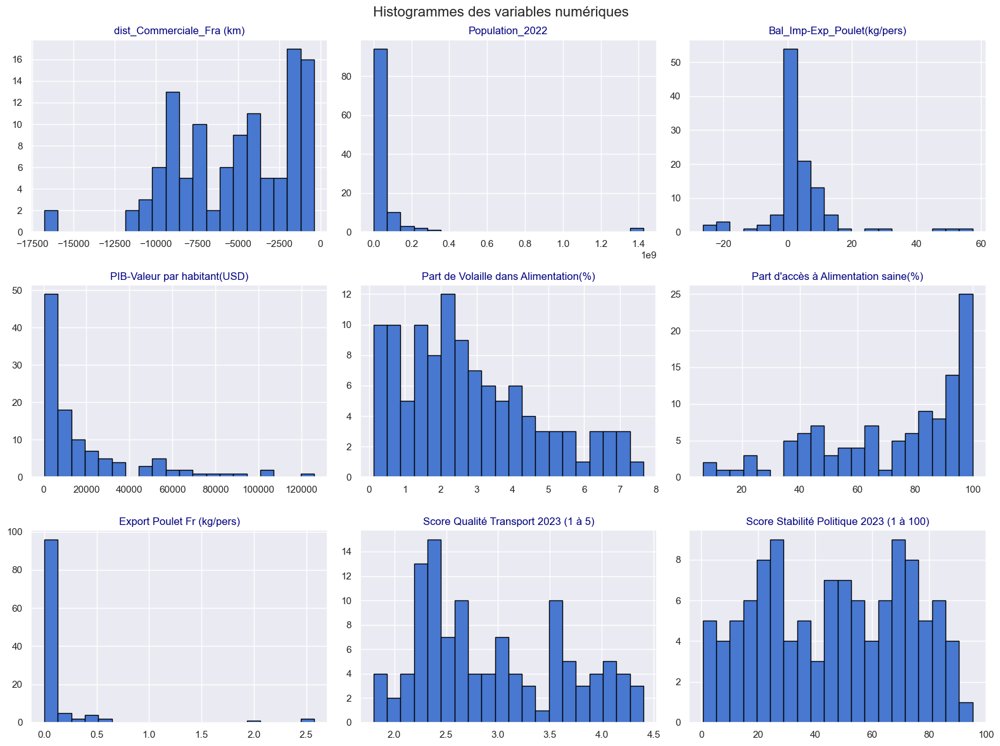

In [471]:
# Histogrammes des variables quantitatives
df_Etude_Marche_V_1_1[quant_vars].hist(
    bins=20, figsize=(16, 12), edgecolor='black')
plt.suptitle(" Histogrammes des variables numériques", fontsize=16)
plt.tight_layout()
plt.show()

On a Clairement des Outliers :  
- sur la distance commerciale mais c'est un état de fait. (vérifier l'absence d'erreur de données seulement)
- sur la Population,  
- et sur l'Export de poulet Francais.

In [472]:
# Matrice de corrélation
#df_Etude_Marche_V_1_1[quant_vars].corr(method='pearson')

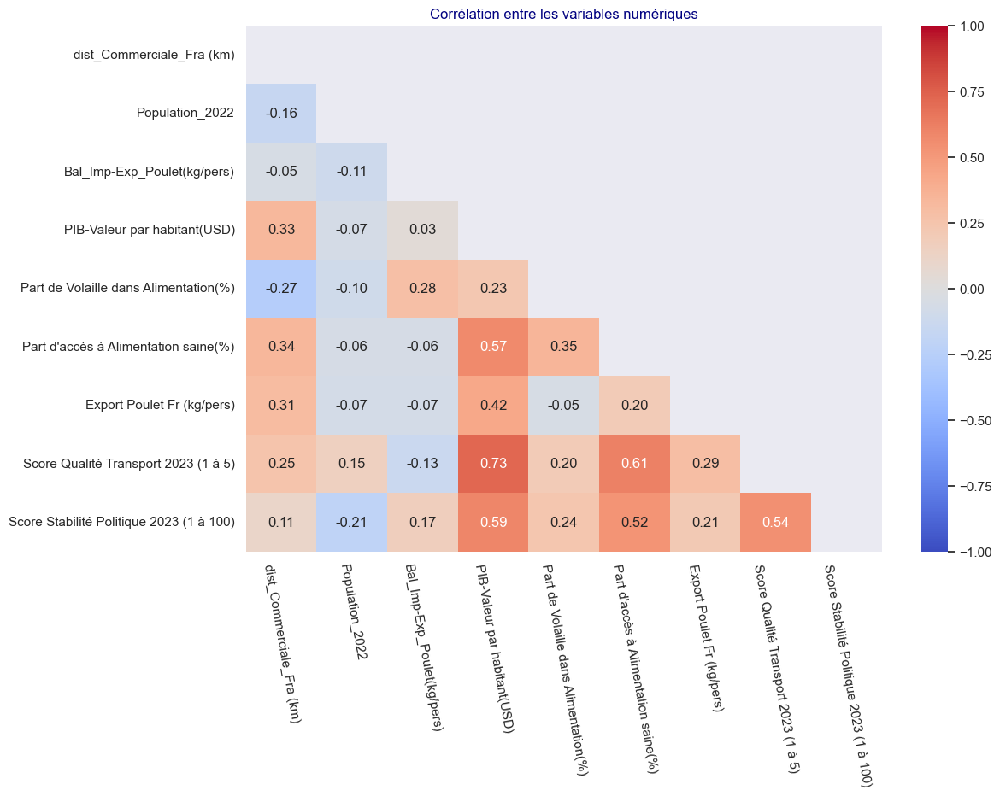

In [479]:
# Visualisation de la Matrice de corrélation

#mask_triangulaire
mask_semi_heatmap = np.triu(np.ones( (df_Etude_Marche_V_1_1[quant_vars].corr(method='pearson')).shape  ))

# Visualisation de la Matrice de corrélation
plt.figure(figsize=(12, 8))
sns.heatmap(df_Etude_Marche_V_1_1[quant_vars].corr(), 
            annot=True, 
            cmap='coolwarm',
            vmin=-1,
            vmax=1,
            center=0.0,
            fmt=".2f",
            mask = mask_semi_heatmap
           )
plt.title("Corrélation entre les variables numériques")
plt.xticks(rotation=-80)
plt.grid(visible=False)
plt.show()

Ici, on note que les Variables sont assez décorrélées (linéairement), sauf le Score des Transport et le PIB par habitant.  
Ce qui n'est pas étonnant, un pays riche ayant plutôt des transports développés.  
Cependant Je ne vais pas éliminer une des variables car elles témoignent de **2 aspects différents** important dans l'analyse:  
- la richesse du pays et donc sa propension à consommer
- sa qualité de transport et donc sa facilité à diffuser les produits.
Elles ne sont pas redondantes dans les aspects étudiés.
Et 2 pays riches peuvent avoir des qualités de transports différents selon les efforts consacrés à cet aspect.

On peut Noter par ailleurs que la Population ne fait pas doublon avec d'autres variables.

In [480]:
Ordre_continent_1

['Africa', 'America', 'Asia', 'Europe', 'Pacific']

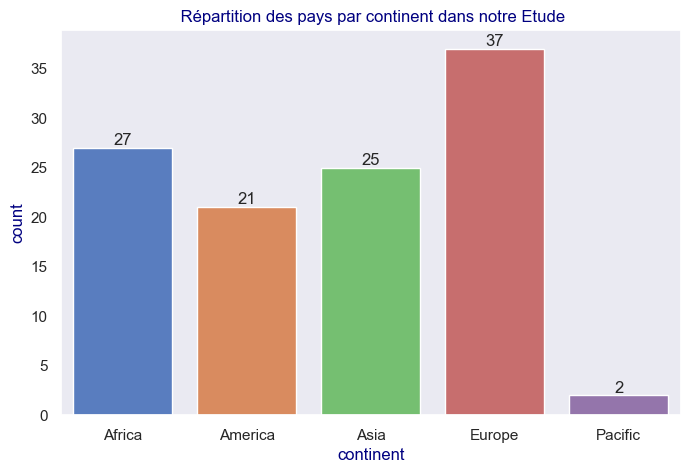

In [481]:
# Répartition des pays par continent
plt.figure(figsize=(8, 5))
ax = sns.countplot(x="continent", 
              hue="continent",
              data=df_Etude_Marche_V_1_1, 
              palette=palette_fixe_continent_1,
              hue_order=Ordre_continent_1,   # <-- ordre des couleurs
              order=Ordre_continent_1,       # <-- ordre des barres (axe X)
             legend=False)

for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title(" Répartition des pays par continent dans notre Etude")
plt.show()

Les pays sont assez bien répartis sur les différents en dehors du Pacifique.  
On peut se poser la question de savoir si il y a moins de pays distincts dans le Pacifique.  
Ou si ce sont tout simplement des pays dans lesquels nosu avions moins de données.

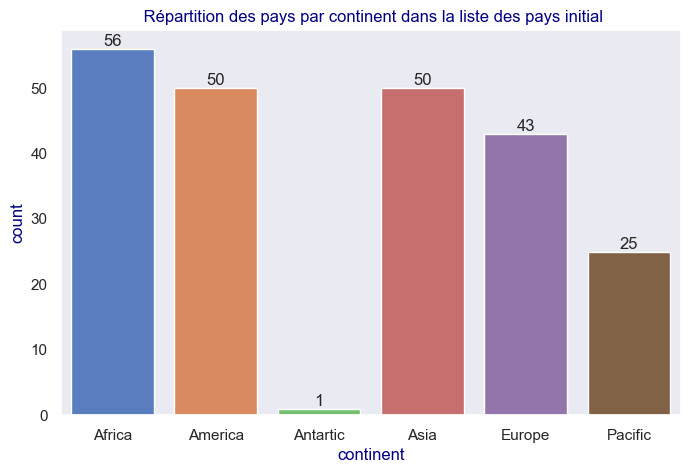

In [482]:
# Répartition des pays par continent
plt.figure(figsize=(8, 5))
ax = sns.countplot(x="continent", 
              hue="continent",
              data=df_prejointure_geo_cepii, 
              palette=palette_fixe_continent_bis,
              hue_order=Ordre_continent_bis,   # <-- ordre des couleurs
              order=Ordre_continent_bis,       # <-- ordre des barres (axe X)
             legend=False)

for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title(" Répartition des pays par continent dans la liste des pays initial")
plt.show()

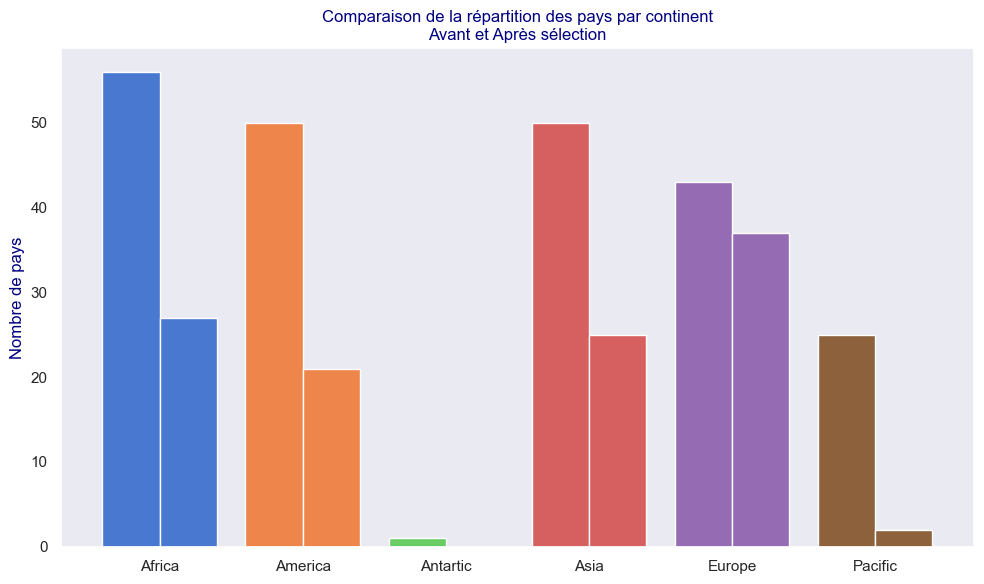

In [483]:
# 3. Comptage des pays par continent dans chaque DataFrame
df_avant = df_prejointure_geo_cepii['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_avant')
df_apres = df_Etude_Marche_V_1_1['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_apres')

# 4. Fusion des deux tableaux sur le continent
df_comparatif = pd.merge(df_avant, df_apres, on='continent', how='outer').fillna(0)

# Tri pour garder un ordre constant
df_comparatif['continent'] = pd.Categorical(df_comparatif['continent'], categories=Ordre_continent_bis, ordered=True)
df_comparatif = df_comparatif.sort_values("continent")

# 5. Création du graphique en barres côte à côte
bar_width = 0.4
x = range(len(df_comparatif))

fig, ax = plt.subplots(figsize=(10, 6))

# Barres "Avant sélection"
ax.bar(
    [i - bar_width/2 for i in x],
    df_comparatif['nombre_pays_avant'],
    width=bar_width,
    label='Avant sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']]
)

# Barres "Après sélection"
ax.bar(
    [i + bar_width/2 for i in x],
    df_comparatif['nombre_pays_apres'],
    width=bar_width,
    label='Après sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']]
)

# Axes et légende
ax.set_xticks(x)
ax.set_xticklabels(df_comparatif['continent'])
ax.set_ylabel("Nombre de pays")
ax.set_title("Comparaison de la répartition des pays par continent\nAvant et Après sélection")
#ax.legend()
plt.tight_layout()
plt.show()


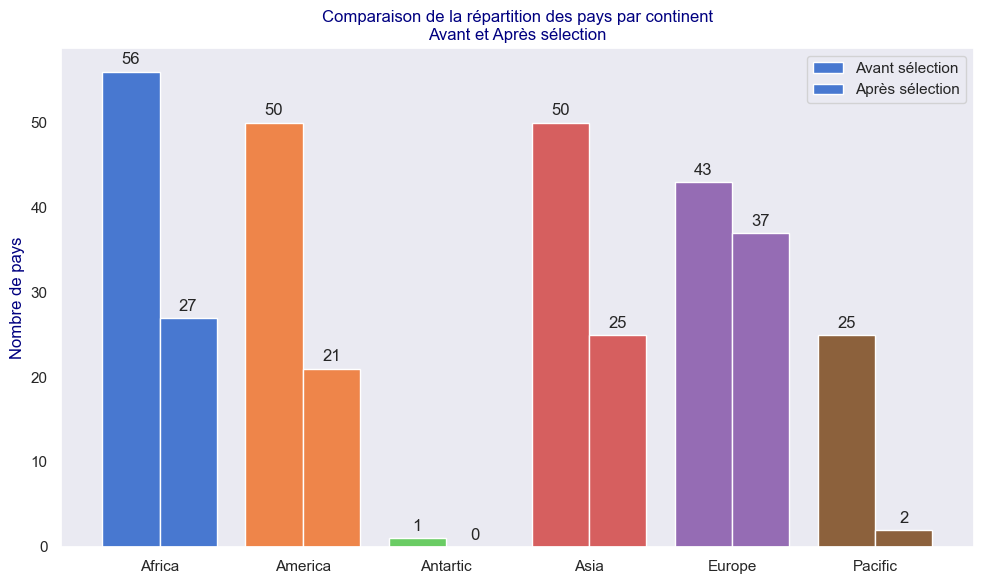

In [484]:
# 3. Comptage des pays par continent dans chaque DataFrame
df_avant = df_prejointure_geo_cepii['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_avant')
df_apres = df_Etude_Marche_V_1_1['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_apres')

# 4. Fusion des deux tableaux sur le continent
df_comparatif = pd.merge(df_avant, df_apres, on='continent', how='outer').fillna(0)

# Tri pour garder un ordre constant
df_comparatif['continent'] = pd.Categorical(df_comparatif['continent'], categories=Ordre_continent_bis, ordered=True)
df_comparatif = df_comparatif.sort_values("continent")

# 5. Création du graphique en barres côte à côte
bar_width = 0.4
x = range(len(df_comparatif))

fig, ax = plt.subplots(figsize=(10, 6))

# Barres "Avant sélection"
bars_avant = ax.bar(
    [i - bar_width/2 for i in x],
    df_comparatif['nombre_pays_avant'],
    width=bar_width,
    label='Avant sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']]
)

# Barres "Après sélection"
bars_apres = ax.bar(
    [i + bar_width/2 for i in x],
    df_comparatif['nombre_pays_apres'],
    width=bar_width,
    label='Après sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']]
)

# ✅ Affichage des valeurs au-dessus des barres
ax.bar_label(bars_avant, fmt='%.0f', padding=3)
ax.bar_label(bars_apres, fmt='%.0f', padding=3)

# Axes et légende
ax.set_xticks(range(len(df_comparatif)))
ax.set_xticklabels(df_comparatif['continent'])
ax.set_ylabel("Nombre de pays")
ax.set_title("Comparaison de la répartition des pays par continent\nAvant et Après sélection")
ax.legend()
plt.tight_layout()
plt.show()


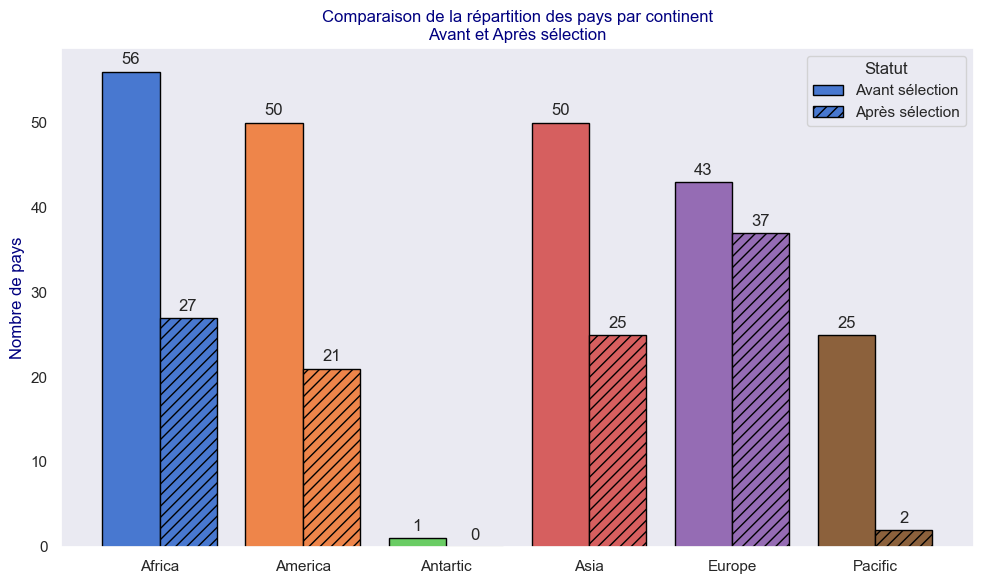

In [485]:
#  Comptage des pays par continent dans chaque DataFrame
df_avant = df_prejointure_geo_cepii['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_avant')
df_apres = df_Etude_Marche_V_1_1['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_apres')

#  Fusion des deux tableaux
df_comparatif = pd.merge(df_avant, df_apres, on='continent', how='outer').fillna(0)
df_comparatif['continent'] = pd.Categorical(df_comparatif['continent'], categories=Ordre_continent_bis, ordered=True)
df_comparatif = df_comparatif.sort_values("continent")

#  Création du graphique
bar_width = 0.4
x = range(len(df_comparatif))

fig, ax = plt.subplots(figsize=(10, 6))

# Barres "Avant sélection" (couleur pleine)
bars_avant = ax.bar(
    [i - bar_width/2 for i in x],
    df_comparatif['nombre_pays_avant'],
    width=bar_width,
    label='Avant sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']],
    edgecolor='black'
)

# Barres "Après sélection" (hachurées)
bars_apres = ax.bar(
    [i + bar_width/2 for i in x],
    df_comparatif['nombre_pays_apres'],
    width=bar_width,
    label='Après sélection',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']],
    hatch='///',
    edgecolor='black'
)

# Ajout des labels de valeur au-dessus des barres
ax.bar_label(bars_avant, fmt='%.0f', padding=3)
ax.bar_label(bars_apres, fmt='%.0f', padding=3)

# Axes et légendes
ax.set_xticks(range(len(df_comparatif)))
ax.set_xticklabels(df_comparatif['continent'])
ax.set_ylabel("Nombre de pays")
ax.set_title("Comparaison de la répartition des pays par continent\nAvant et Après sélection")
ax.legend(title="Statut", loc='best')

plt.tight_layout()
plt.show()


<u>**OBSERVATIONS :**</u>  
Pour manque de données,  
- globalement on perd 1 pays sur 2  
- Sauf pour L'Europe => slmt 1 pays sur 10 manquent de données  
- Sauf pour le Pacifique => 9 pays sur 10 manquent de données

Au vu du problème d'éloignement du Pacifique, et de la proximité de l'Europe,  
cette sélection n'est pas forcément un sujet, même si le Pacifique est de fait sous représenter, et l'Europe surreprésenter.

<bound method Axes.set of <Axes: xlabel='Score Qualité Transport 2023 (1 à 5)', ylabel='Export Poulet Fr (kg/pers)'>>

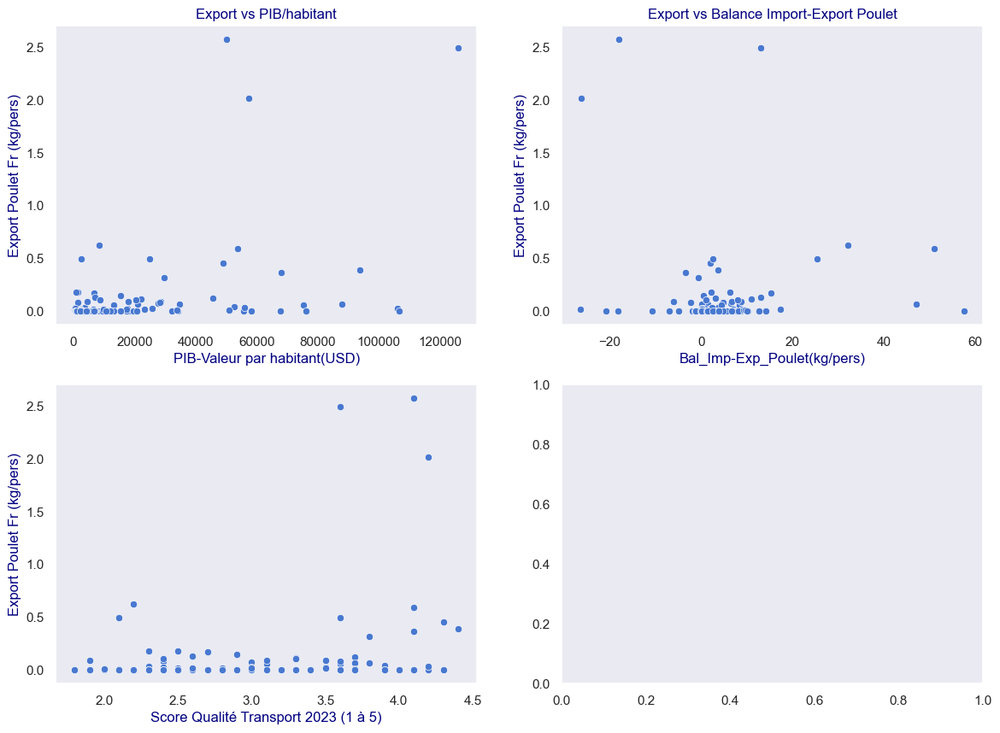

In [486]:
#  Analyse bivariée entre Export France et variables clés
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

sns.scatterplot(
    x='PIB-Valeur par habitant(USD)',
    y='Export Poulet Fr (kg/pers)',
    data=df_Etude_Marche_V_1_1, ax=axes[0, 0]
)
axes[0, 0].set_title("Export vs PIB/habitant")

sns.scatterplot(
    x='Bal_Imp-Exp_Poulet(kg/pers)',
    y='Export Poulet Fr (kg/pers)',
    data=df_Etude_Marche_V_1_1, ax=axes[0, 1]
)
axes[0, 1].set_title("Export vs Balance Import-Export Poulet")

sns.scatterplot(
    x='Score Qualité Transport 2023 (1 à 5)',
    y='Export Poulet Fr (kg/pers)',
    data=df_Etude_Marche_V_1_1, ax=axes[1, 0]
)
axes[1, 0].set

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.1.2 - Analyse Univariée Globale</h4>
</div>


 Analyse de la variable : dist_Commerciale_Fra (km)
--------------------------------------------------
count          112.0
mean    -5199.345708
std      3615.619949
min        -16780.16
25%      -8201.53475
50%       -4628.2945
75%      -1760.76325
max        -378.6808
Name: dist_Commerciale_Fra (km), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


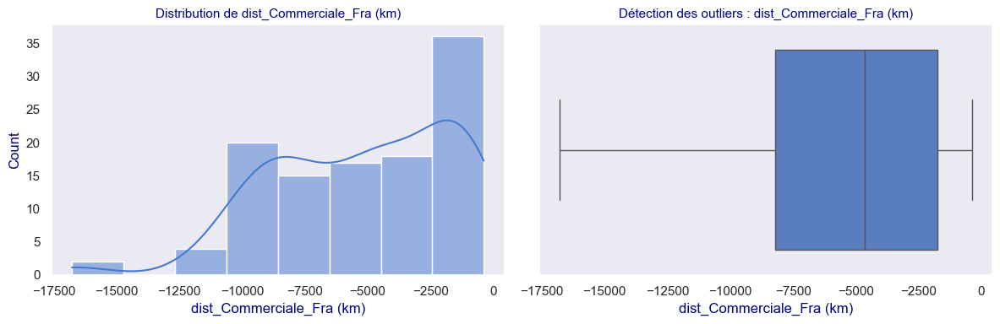


 Analyse de la variable : Population_2022
--------------------------------------------------
count               112.0
mean      58811047.705357
std      193681701.815743
min              116913.0
25%             3389688.5
50%            10414776.5
75%            38494619.0
max          1425423212.0
Name: Population_2022, dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


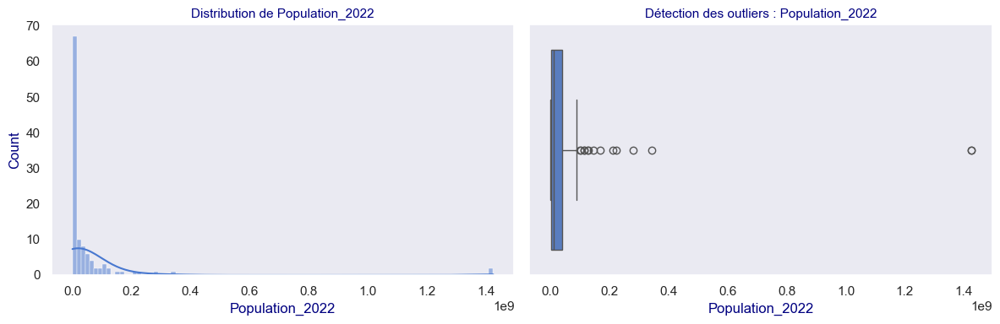


 Analyse de la variable : Bal_Imp-Exp_Poulet(kg/pers)
--------------------------------------------------
count        112.0
mean      3.675429
std      11.188264
min     -26.357484
25%       0.032974
50%       1.718604
75%       6.499356
max      57.456143
Name: Bal_Imp-Exp_Poulet(kg/pers), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


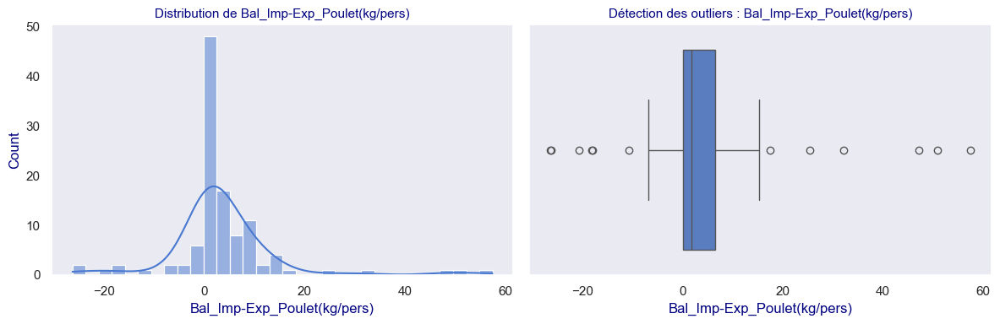


 Analyse de la variable : PIB-Valeur par habitant(USD)
--------------------------------------------------
count            112.0
mean      19961.664406
std        26129.49937
min         429.395861
25%        3413.182233
50%        8082.376833
75%       25053.010392
max      125897.199853
Name: PIB-Valeur par habitant(USD), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


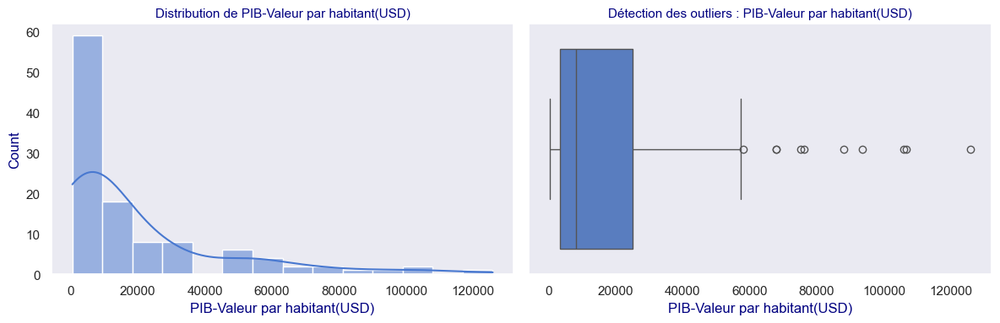


 Analyse de la variable : Part de Volaille dans Alimentation(%)
--------------------------------------------------
count       112.0
mean      2.81557
std       1.91653
min      0.121814
25%       1.39766
50%      2.425665
75%      4.005687
max      7.655395
Name: Part de Volaille dans Alimentation(%), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


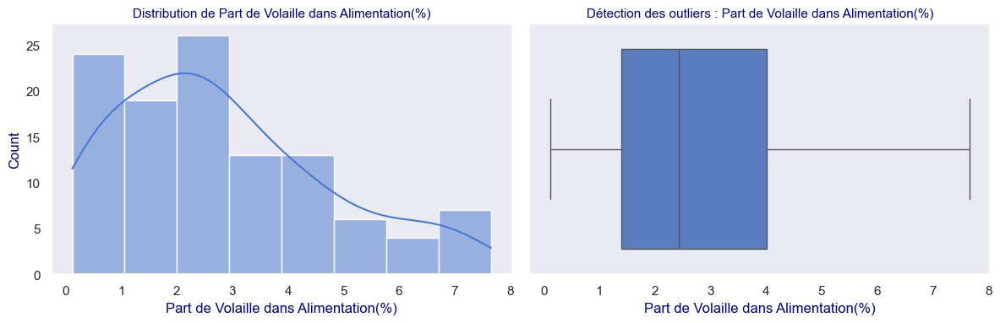


 Analyse de la variable : Part d'accès à Alimentation saine(%)
--------------------------------------------------
count        112.0
mean      72.29375
std      25.377607
min            6.4
25%         52.275
50%          81.15
75%         94.475
max          100.0
Name: Part d'accès à Alimentation saine(%), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 105


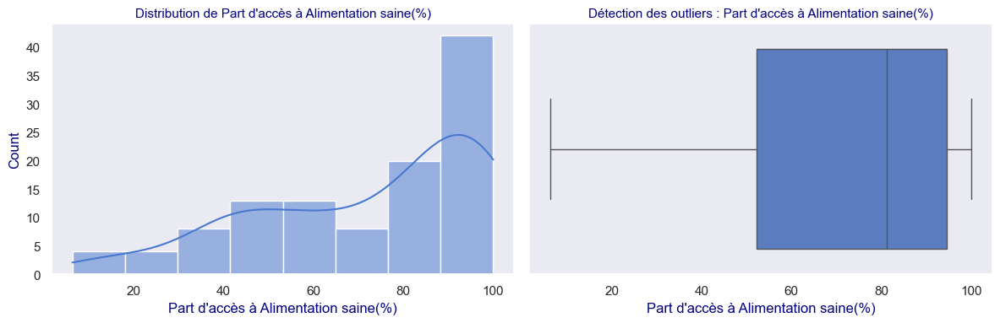


 Analyse de la variable : Export Poulet Fr (kg/pers)
--------------------------------------------------
count       112.0
mean     0.118939
std      0.396219
min           0.0
25%           0.0
50%      0.000408
75%      0.066655
max      2.576017
Name: Export Poulet Fr (kg/pers), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 65


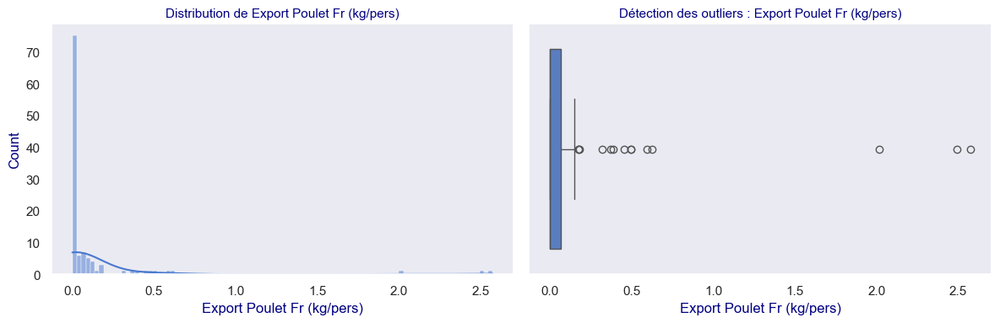


 Analyse de la variable : Score Qualité Transport 2023 (1 à 5)
--------------------------------------------------
count       112.0
mean     2.957143
std      0.700671
min           1.8
25%           2.4
50%           2.8
75%           3.6
max           4.4
Name: Score Qualité Transport 2023 (1 à 5), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 27


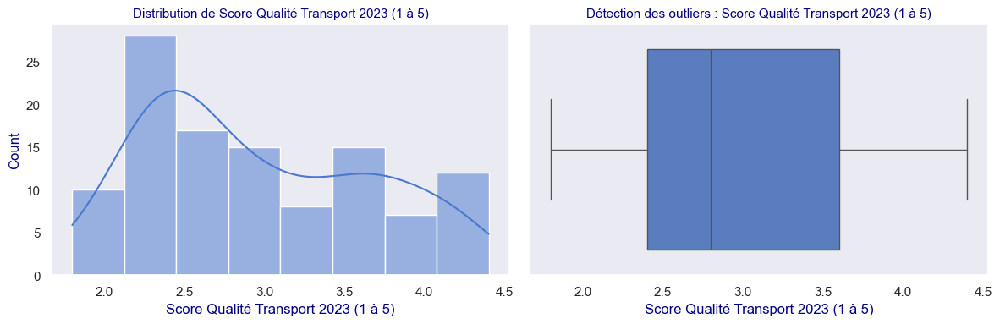


 Analyse de la variable : Score Stabilité Politique 2023 (1 à 100)
--------------------------------------------------
count        112.0
mean     46.830569
std      25.577827
min       0.473934
25%      24.526067
50%      48.341232
75%       69.43128
max      95.260666
Name: Score Stabilité Politique 2023 (1 à 100), dtype: Float64
 Valeurs manquantes : 0
 Valeurs distinctes : 112


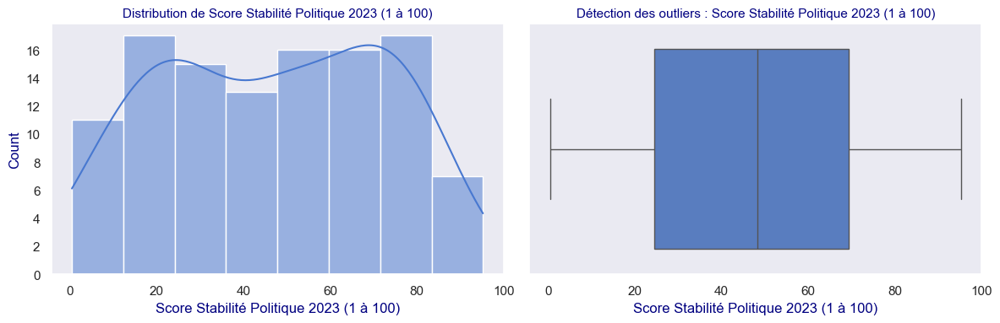

In [487]:
#import pandas as pd
#import matplotlib.pyplot as plt
#import seaborn as sns

# liste de mes 9 Variables numériques à analyser déjà créée précédemment
quant_vars 

# Paramètres d'affichage
#sns.set(style="whitegrid")
#plt.style.use('ggplot')

# Boucle sur chaque variable
for var in quant_vars:
    print(f"\n Analyse de la variable : {var}")
    print("--------------------------------------------------")
    
    # Statistiques descriptives
    print(df_Etude_Marche_V_1_1[var].describe())
    
    # Valeurs manquantes
    nb_na = df_Etude_Marche_V_1_1[var].isna().sum()
    print(f" Valeurs manquantes : {nb_na}")
    
    # Valeurs uniques
    nb_unique = df_Etude_Marche_V_1_1[var].nunique()
    print(f" Valeurs distinctes : {nb_unique}")
    
    # Création des visualisations
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Histogramme
    sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, ax=axes[0]#, color='skyblue'
                )
    axes[0].set_title(f'Distribution de {var}', fontsize=11)
    
    # Boxplot
    sns.boxplot(data=df_Etude_Marche_V_1_1, x=var, ax=axes[1]#, color='lightgreen'
               )
    axes[1].set_title(f'Détection des outliers : {var}', fontsize=11)
    
    plt.tight_layout()
    plt.show()


**BOXPLOT REGROUPES :**

PB ce ne sont pas du tout les mêmes proportions !

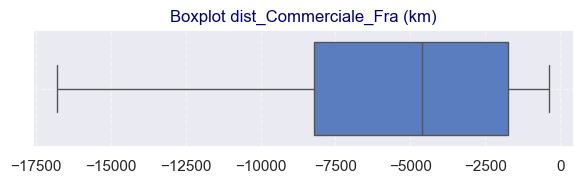

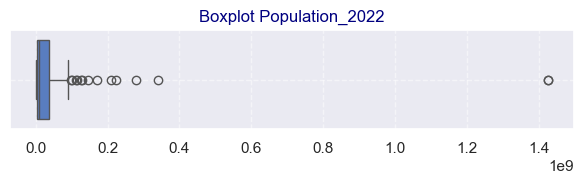

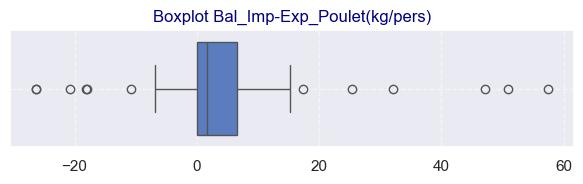

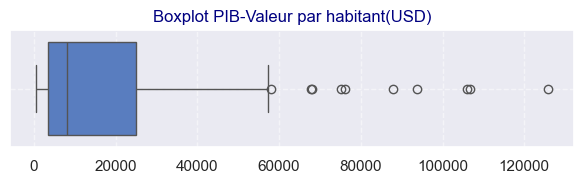

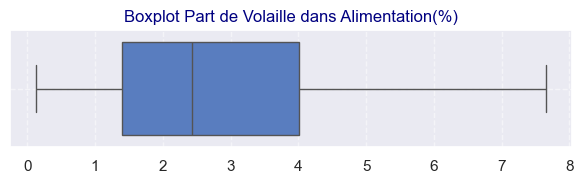

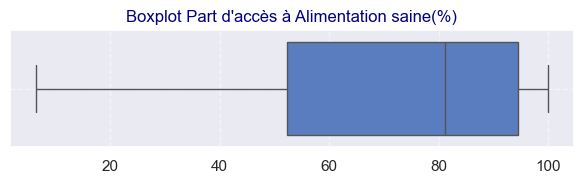

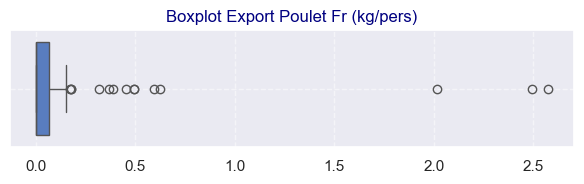

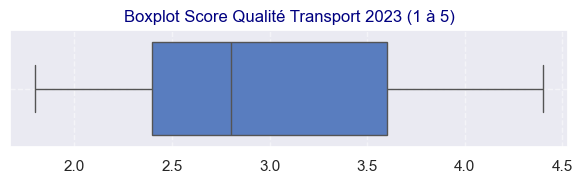

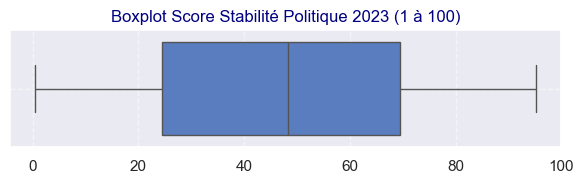

In [488]:
for var in quant_vars :
    plt.figure(figsize=(6, 2))
    sns.boxplot(x=df_Etude_Marche_V_1_1[var])
    plt.xlabel('')
    plt.title("Boxplot "+ var)
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.tight_layout()
    plt.show()


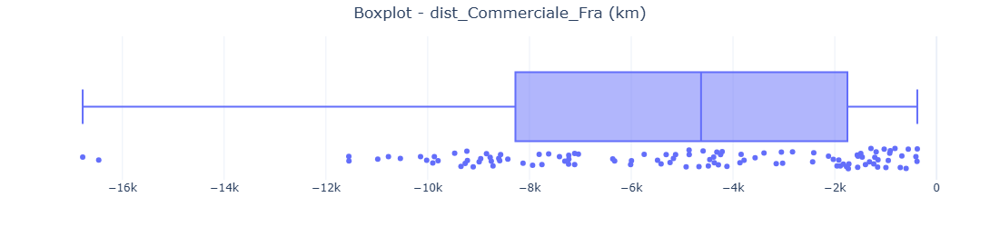

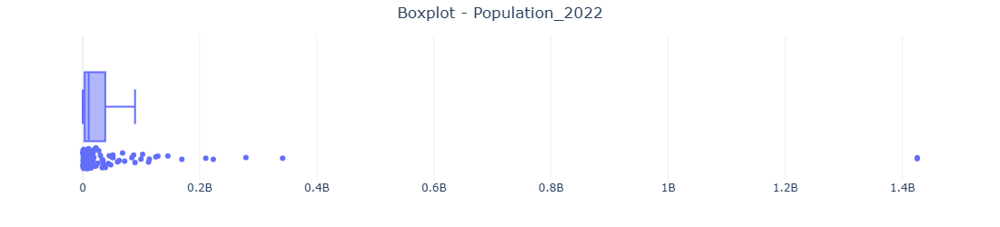

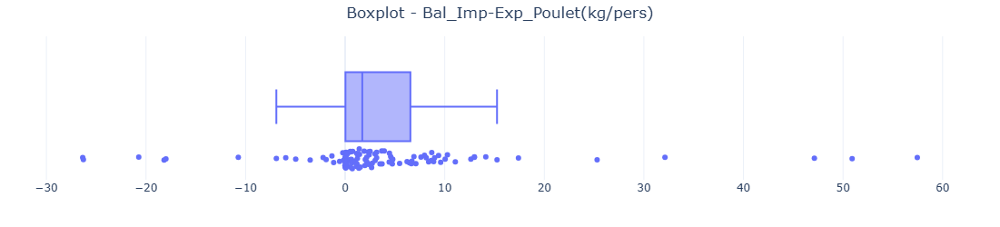

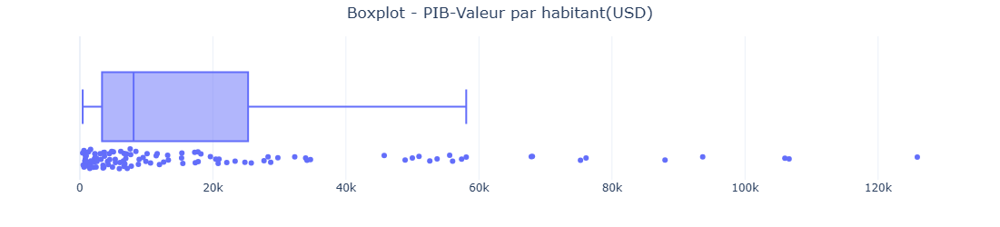

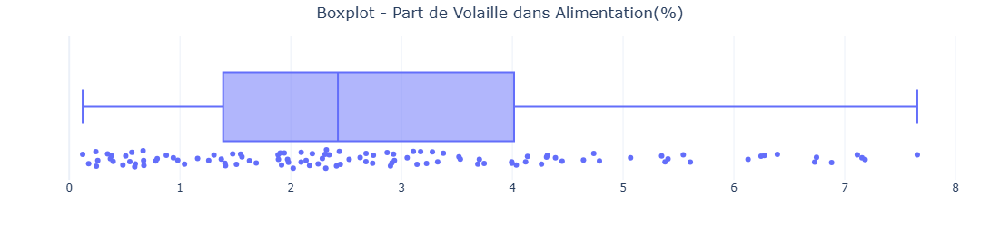

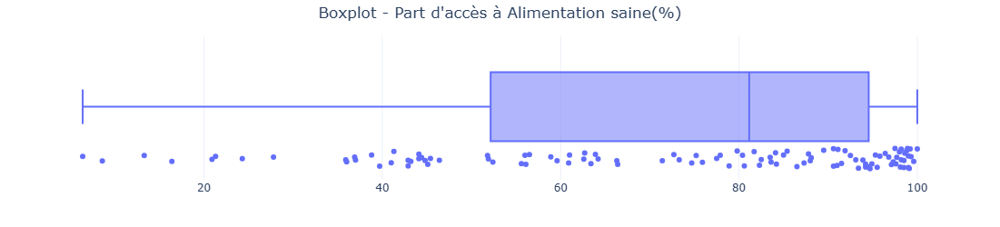

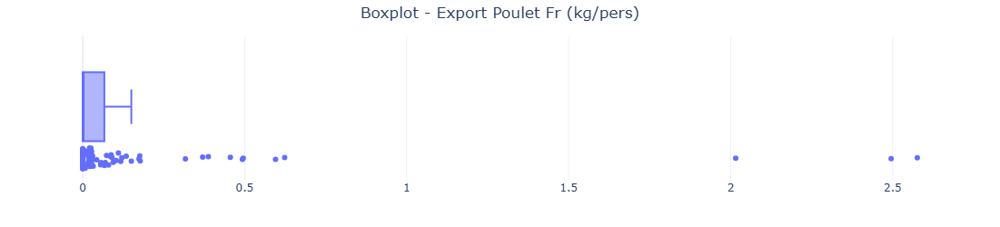

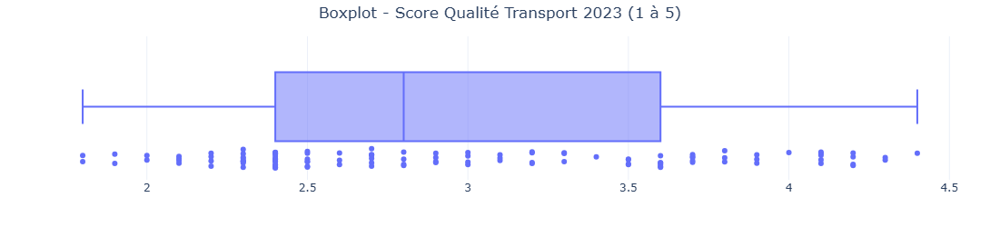

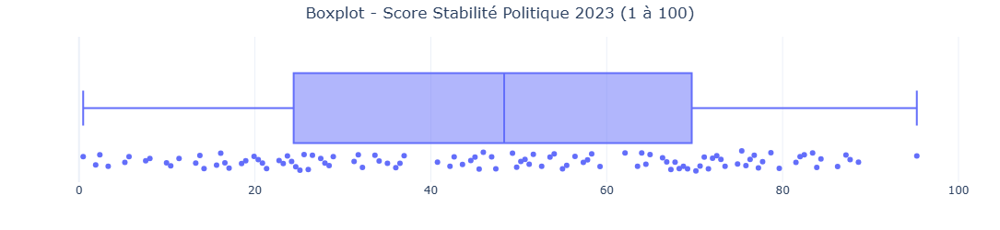

In [489]:
#Version Plotly express
#import plotly.express as px

for var in quant_vars:
    fig = px.box(df_Etude_Marche_V_1_1, 
                 x=var,
                 points="all",  # ajoute les points individuels
                 title=f"Boxplot - {var}")
    fig.update_layout(
        xaxis_title='', 
        template='plotly_white',
        height=250,
        margin=dict(l=40, r=40, t=40, b=40),
        title_x=0.5  # Centrer le titre
    )
    fig.show()


**TOUS LES SCATTERPLOTS :**

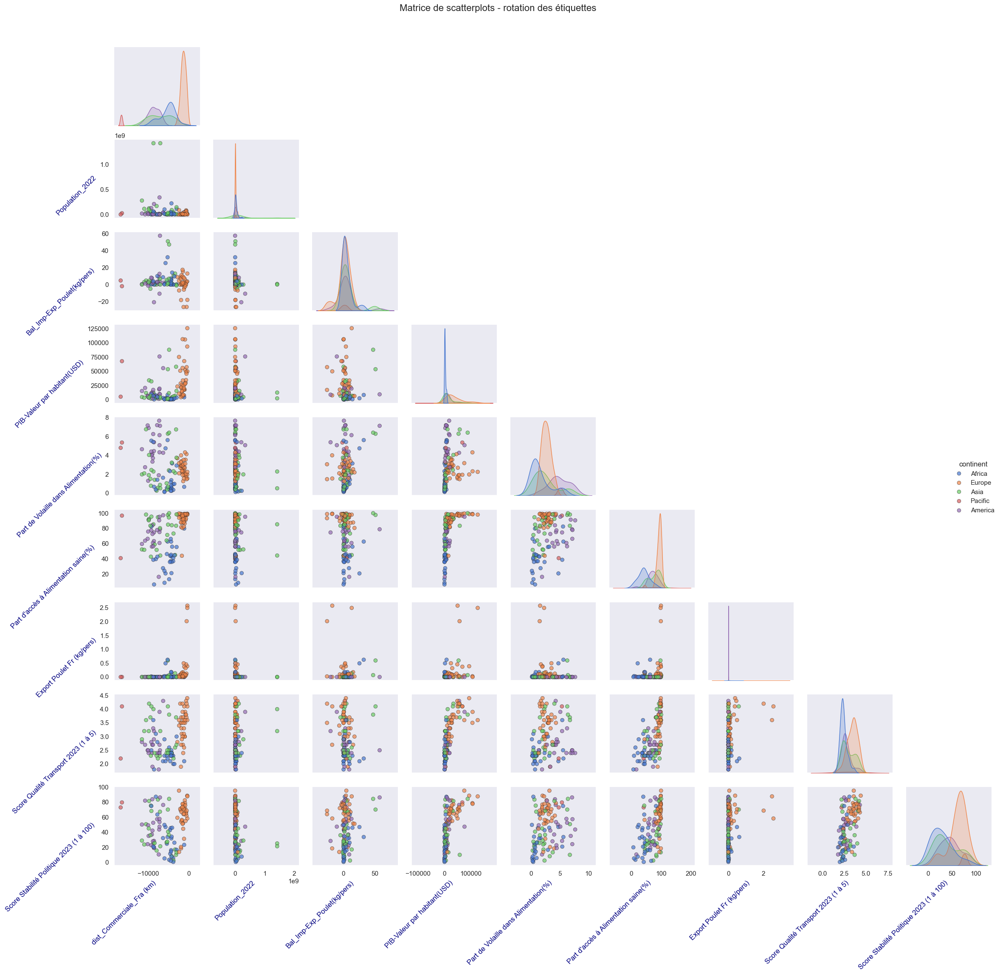

In [490]:
#Avec Rotation des Variables
#import seaborn as sns
#import matplotlib.pyplot as plt

# Création du pairplot et récupération du PairGrid
g = sns.pairplot(df_Etude_Marche_V_1_1[quant_vars+['continent']], 
                 hue='continent', 
                 corner=True,
                 diag_kind='kde',
                 plot_kws={'alpha': 0.7, 's': 40, 'edgecolor': 'k'})

# Rotation des titres des axes x (colonne en bas)
for i, label in enumerate(quant_vars):
    g.axes[-1, i].set_xlabel(label, rotation=45, ha='right')

# Rotation des titres des axes y (ligne à gauche)
for i, label in enumerate(quant_vars):  # [1:] car corner=True
    g.axes[i, 0].set_ylabel(label, rotation=45, ha='right')

plt.suptitle("Matrice de scatterplots - rotation des étiquettes", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">4.2 - Anlayse Univariée -Var par Var </h3>
</div>

In [491]:
#PARAMETRAGE GENERAL de SEABORN

sns.set_theme(style='dark', palette='muted')
plt.rcParams.update({'font.size' : 12,'figure.titlesize':14,'axes.labelcolor':'navy','axes.titlecolor':'navy'})

In [492]:
df_Etude_Marche_V_1_1.columns

Index(['iso3', 'pays', 'continent', 'dist_Commerciale_Fra (km)',
       'Population_2022', 'Bal_Imp-Exp_Poulet(kg/pers)',
       'PIB-Valeur par habitant(USD)', 'Part de Volaille dans Alimentation(%)',
       'Part d'accès à Alimentation saine(%)', 'Export Poulet Fr (kg/pers)',
       'Score Qualité Transport 2023 (1 à 5)',
       'Score Stabilité Politique 2023 (1 à 100)'],
      dtype='object')

Les 9 variables numériques à étudier :

In [493]:
quant_vars

['dist_Commerciale_Fra (km)',
 'Population_2022',
 'Bal_Imp-Exp_Poulet(kg/pers)',
 'PIB-Valeur par habitant(USD)',
 'Part de Volaille dans Alimentation(%)',
 "Part d'accès à Alimentation saine(%)",
 'Export Poulet Fr (kg/pers)',
 'Score Qualité Transport 2023 (1 à 5)',
 'Score Stabilité Politique 2023 (1 à 100)']

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.1 - 'dist_Commerciale_Fra (km)'</h4>
</div>

In [494]:
var = 'dist_Commerciale_Fra (km)'

In [495]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: dist_Commerciale_Fra (km)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count          112.0
mean    -5199.345708
std      3615.619949
min        -16780.16
25%      -8201.53475
50%       -4628.2945
75%      -1760.76325
max        -378.6808
Name: dist_Commerciale_Fra (km), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
dist_Commerciale_Fra (km),Float64,112,112,0,112,NaN


##### <font color='blue'><u>**REPARTITION**</u></font>

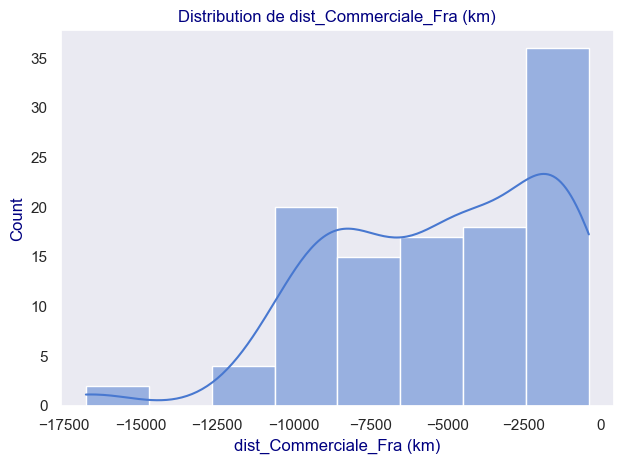

In [496]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True #, color='blue'
            )
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

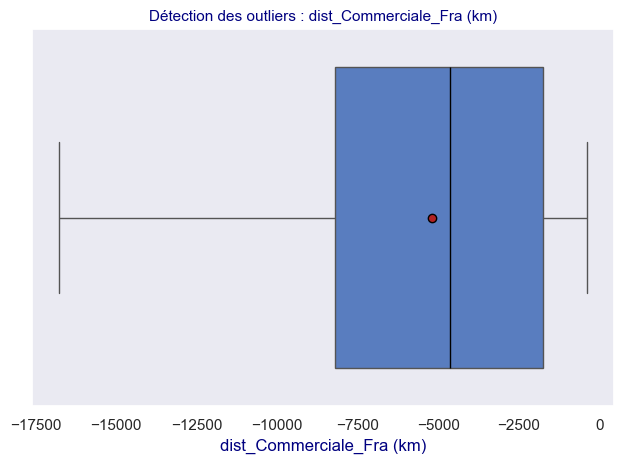

In [497]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)

plt.tight_layout()
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [498]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  6440.771499999999 
le seuil bas  en deça duquel on est outliers est :  -17862.69 
le seuil haut au dessus duquel on est outliers est :  7900.39


In [499]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays."
     )
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,dist_Commerciale_Fra (km)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [500]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,6,BEL,Belgique,Europe,-378.6808,11641820,-17.998686,49986.832591,1.547455,99.3,2.576017,4.1,58.293839
1,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727
2,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
3,85,NLD,Pays-Bas,Europe,-556.2308,17904421,-26.287624,57391.6356,1.475962,98.9,2.015567,4.2,68.720383
4,40,GBR,Royaume-Uni,Europe,-598.5457,68179315,3.160165,45757.982653,4.119821,97.5,0.120872,3.7,62.085308
5,29,DEU,Allemagne,Europe,-682.0841,84086227,2.023427,48901.658828,1.688402,98.0,0.455737,4.3,66.350708
6,60,ITA,Italie,Europe,-712.8497,59619115,0.053556,34672.091141,2.021874,93.1,0.066459,3.8,64.928909
7,35,ESP,Espagne,Europe,-817.1057,47828382,-0.55374,29771.135983,3.530667,91.1,0.317022,3.8,54.976303
8,100,SVN,Slovénie,Europe,-908.9259,2115228,-2.213024,28295.422508,3.106658,98.6,0.079949,3.6,75.829384
9,5,AUT,Autriche,Europe,-920.6031,9064677,0.559679,52608.760637,1.885624,97.1,0.0432,3.9,71.56398


In [501]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,13,BOL,Bolivie,America,-9900.388,12077154,0.247957,3600.121635,6.882025,91.5,0.0,2.4,35.071091
103,92,PRY,Paraguay,America,-10020.26,6760464,-1.330323,6153.055677,1.306937,75.9,0.0,2.5,49.289101
104,88,PER,Pérou,America,-10140.63,33475438,2.409456,7125.829235,7.155793,66.4,0.0,2.5,24.170616
105,81,MYS,Malaisie,Asia,-10537.39,34695493,4.715732,11971.924961,6.745588,98.2,0.000721,3.6,50.710899
106,107,URY,Uruguay,America,-10771.85,3390913,1.253373,20793.282962,2.739038,63.9,0.0,2.7,81.990524
107,89,PHL,Philippines,Asia,-10981.64,113964339,3.008438,3498.509816,2.093366,51.9,0.000126,3.2,23.696682
108,53,IDN,Indonésie,Asia,-11547.48,278830529,-0.001792,4787.999308,1.979152,52.4,0.0,2.9,28.909952
109,20,CHL,Chili,America,-11550.63,19553036,0.512937,15338.201466,4.641983,59.6,0.0,2.8,50.236965
110,4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085
111,38,FJI,Fidji,Pacific,-16780.16,919422,4.778219,5356.164428,4.786368,41.0,0.0,2.2,72.985779


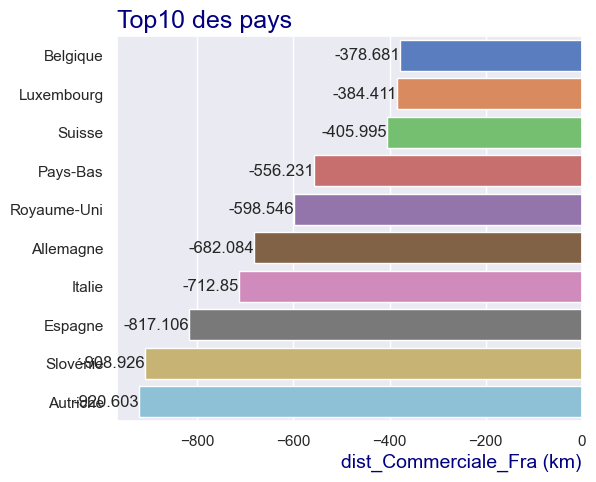

In [502]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

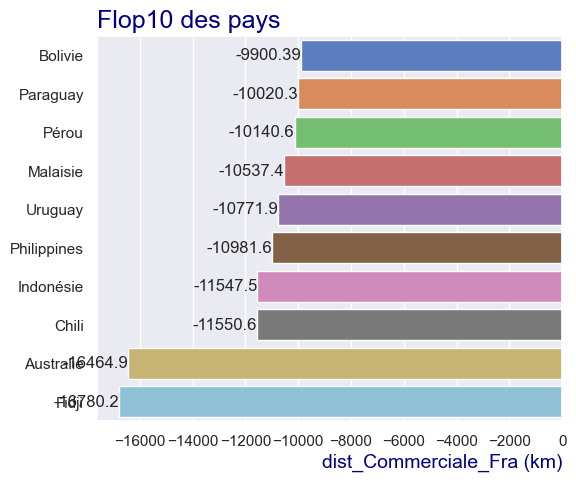

In [503]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.2 - 'Population_2022'</h4>
</div>

In [504]:
var = 'Population_2022'

In [505]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Population_2022
Non-Null Count  Dtype
--------------  -----
112 non-null    Int64
dtypes: Int64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count               112.0
mean      58811047.705357
std      193681701.815743
min              116913.0
25%             3389688.5
50%            10414776.5
75%            38494619.0
max          1425423212.0
Name: Population_2022, dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Population_2022,Int64,112,112,0,112,NaN


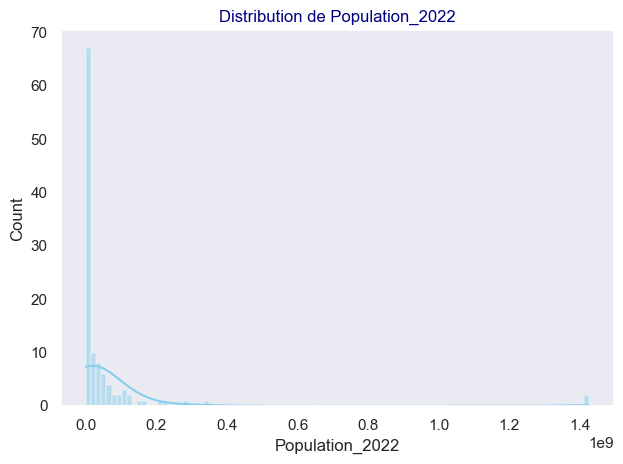

In [506]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

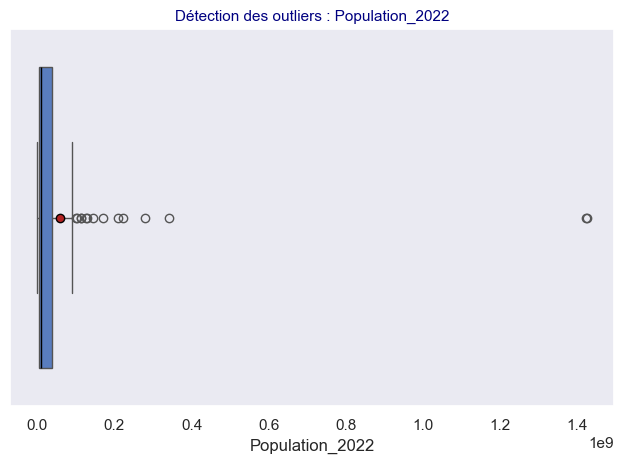

In [507]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)

plt.tight_layout()
plt.show()

In [508]:
#les outliers
mask_temp = df_Etude_Marche_V_1_1['Population_2022']>1_000_000_000

df_Etude_Marche_V_1_1.loc[mask_temp,:]

,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
21,CHN,Chine,Asia,-8716.882,1425179569,0.75184,12597.889086,2.285342,85.4,0.000018,4.0,25.118483
54,IND,Inde,Asia,-7038.913,1425423212,-0.003314,2445.390241,0.510236,44.4,0.0,3.2,21.327015


##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [509]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  35104930.5 
le seuil bas  en deça duquel on est outliers est :  -49267707.25 
le seuil haut au dessus duquel on est outliers est :  91152014.75


In [510]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  14  'outliers'. 
Ce qui représente  12.5  % des pays.

les outliers sont : 


,iso3,pays,continent,Population_2022
54,IND,Inde,Asia,1425423212
21,CHN,Chine,Asia,1425179569
108,USA,USA,America,341534045
53,IDN,Indonésie,Asia,278830529
83,NGA,Nigéria,Africa,223150896
14,BRA,Brésil,America,210306415
9,BGD,Bangladesh,Asia,169384897
95,RUS,Russie,Asia,145579899
74,MEX,Mexique,America,128613117
62,JPN,Japon,Asia,124997578


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [511]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,54,IND,Inde,Asia,-7038.913,1425423212,-0.003314,2445.390241,0.510236,44.4,0.0,3.2,21.327015
1,21,CHN,Chine,Asia,-8716.882,1425179569,0.75184,12597.889086,2.285342,85.4,0.000018,4.0,25.118483
2,108,USA,USA,America,-7227.043,341534045,-10.731474,76100.715015,5.067229,95.3,0.000004,3.9,47.393364
3,53,IDN,Indonésie,Asia,-11547.48,278830529,-0.001792,4787.999308,1.979152,52.4,0.0,2.9,28.909952
4,83,NGA,Nigéria,Africa,-4287.72,223150896,0.000726,2173.77085,0.245306,21.3,0.000005,2.4,7.582938
5,14,BRA,Brésil,America,-8584.978,210306415,-20.728003,8917.673509,5.378517,74.7,0.0,3.2,28.43602
6,9,BGD,Bangladesh,Asia,-7938.608,169384897,0.000044,2527.52127,0.25804,51.8,0.0,2.3,15.639811
7,95,RUS,Russie,Asia,-3049.666,145579899,-1.153333,15481.798989,3.745802,98.5,0.0,2.7,13.270143
8,74,MEX,Mexique,America,-9264.167,128613117,8.142089,11476.678806,4.389056,77.5,0.0,2.8,22.748816
9,62,JPN,Japon,Asia,-9796.54,124997578,4.569616,34143.736546,4.035648,92.5,0.00057,4.2,81.516586


In [512]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,27,CYP,Chypre,Europe,-2830.626,1331370,8.885254,23340.852122,3.688508,98.2,0.017674,2.8,59.241707
103,80,MUS,Maurice,Africa,-9230.556,1276130,0.086386,9925.829003,5.543234,82.5,0.02039,2.5,74.881516
104,30,DJI,Djibouti,Africa,-5413.913,1137096,3.67385,3571.817567,0.547722,46.4,0.03129,2.3,24.64455
105,38,FJI,Fidji,Pacific,-16780.16,919422,4.778219,5356.164428,4.786368,41.0,0.0,2.2,72.985779
106,48,GUY,Guyana,America,-7305.741,821637,0.544413,18199.47484,7.655395,90.6,0.0,2.4,43.601894
107,15,BTN,Bhoutan,Asia,-7622.959,780914,3.498964,3704.344581,0.565474,94.7,0.0,2.2,83.412323
108,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727
109,77,MLT,Malte,Europe,-1488.968,528192,9.379279,33942.343846,2.927835,97.6,0.00674,3.7,77.251183
110,58,ISL,Islande,Europe,-2435.512,380356,4.424618,75260.405234,3.172151,99.6,0.055185,3.6,95.260666
111,46,GRD,Grenade,America,-7112.1,116913,57.456143,9509.250006,7.114045,78.9,0.0,2.5,86.25592


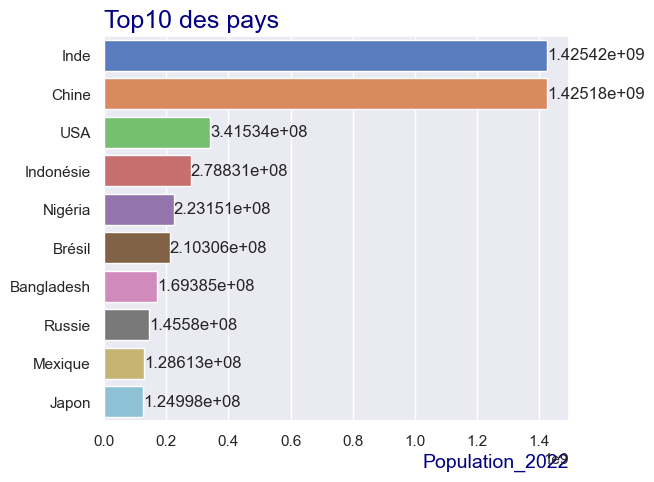

In [513]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

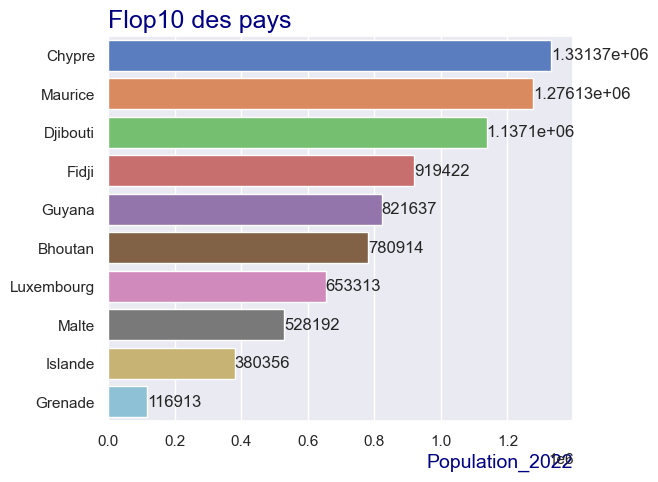

In [514]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.3 - ''Bal_Imp-Exp_Poulet(kg/pers)''</h4>
</div>

In [515]:
var = 'Bal_Imp-Exp_Poulet(kg/pers)'

In [516]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Bal_Imp-Exp_Poulet(kg/pers)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count        112.0
mean      3.675429
std      11.188264
min     -26.357484
25%       0.032974
50%       1.718604
75%       6.499356
max      57.456143
Name: Bal_Imp-Exp_Poulet(kg/pers), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Bal_Imp-Exp_Poulet(kg/pers),Float64,112,112,0,112,NaN


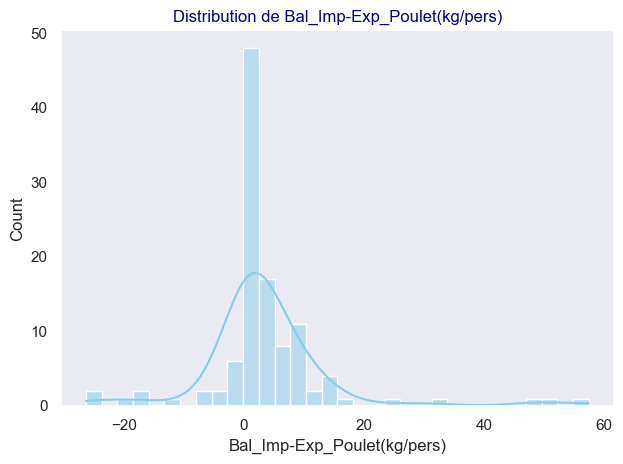

In [517]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

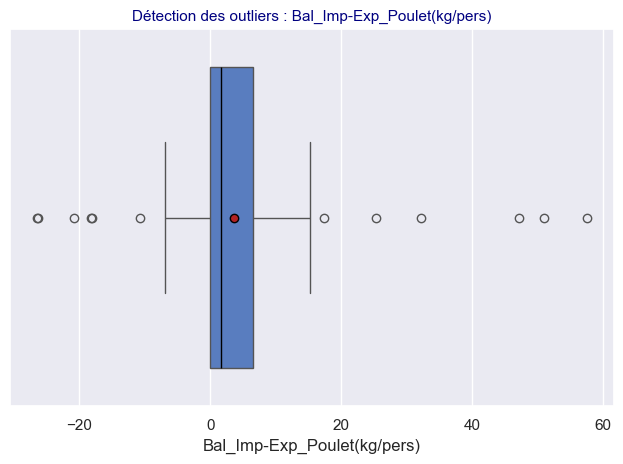

In [518]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [519]:
#les outliers négatifs EXP>>IMP
mask_temp = df_Etude_Marche_V_1_1[var]<-8

df_Etude_Marche_V_1_1.loc[mask_temp,['iso3','pays',var]]

,iso3,pays,Bal_Imp-Exp_Poulet(kg/pers)
6,BEL,Belgique,-17.998686
12,BLR,Biélorussie,-18.184166
14,BRA,Brésil,-20.728003
85,NLD,Pays-Bas,-26.287624
90,POL,Pologne,-26.357484
108,USA,USA,-10.731474


In [520]:
#les outliers positifs IMP>>EXP
mask_temp = df_Etude_Marche_V_1_1[var]>16

df_Etude_Marche_V_1_1.loc[mask_temp,['iso3','pays',var]]

,iso3,pays,Bal_Imp-Exp_Poulet(kg/pers)
2,ARE,UAE,50.911554
24,COG,Congo,25.301304
39,GAB,Gabon,32.117308
46,GRD,Grenade,57.456143
75,MKD,Macédoine,17.401715
93,QAT,Qatar,47.121445


##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [521]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  6.466381975540011 
le seuil bas  en deça duquel on est outliers est :  -9.67 
le seuil haut au dessus duquel on est outliers est :  16.2


In [522]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  12  'outliers'. 
Ce qui représente  10.71  % des pays.

les outliers sont : 


,iso3,pays,continent,Bal_Imp-Exp_Poulet(kg/pers)
46,GRD,Grenade,America,57.456143
2,ARE,UAE,Asia,50.911554
93,QAT,Qatar,Asia,47.121445
39,GAB,Gabon,Africa,32.117308
24,COG,Congo,Africa,25.301304
75,MKD,Macédoine,Europe,17.401715
108,USA,USA,America,-10.731474
6,BEL,Belgique,Europe,-17.998686
12,BLR,Biélorussie,Europe,-18.184166
14,BRA,Brésil,America,-20.728003


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [523]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,46,GRD,Grenade,America,-7112.1,116913,57.456143,9509.250006,7.114045,78.9,0.0,2.5,86.25592
1,2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
2,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
3,39,GAB,Gabon,Africa,-5237.393,2430747,32.117308,8427.098986,5.606583,62.7,0.623376,2.2,33.649288
4,24,COG,Congo,Africa,-5746.042,6035104,25.301304,2570.136581,4.734824,20.9,0.492906,2.1,46.91943
5,75,MKD,Macédoine,Europe,-1558.123,1840233,17.401715,6549.230346,2.194727,80.6,0.018911,3.0,51.184834
6,1,ALB,Albanie,Europe,-1461.321,2827608,15.251216,6655.258391,2.527139,87.8,0.173751,2.7,51.658768
7,43,GMB,Gambie,Africa,-4119.869,2636470,14.122292,824.66715,3.139478,56.0,0.00096,2.3,45.971565
8,3,ARM,Arménie,Asia,-3391.306,2880874,12.983015,7018.113045,2.138236,45.1,0.134449,2.6,17.061611
9,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727


In [524]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,31,DNK,Danemark,Europe,-1150.822,5902904,-3.515946,68029.486782,1.941537,99.1,0.370325,4.1,76.777252
103,103,THA,Thaïlande,Asia,-9470.205,71735329,-4.964945,6908.802119,1.509382,83.6,0.000125,3.7,36.018959
104,52,HUN,Hongrie,Europe,-1233.966,9684306,-5.967201,17791.908977,2.745773,89.5,0.094089,3.1,72.037918
105,106,TUR,Turquie,Europe,-2413.325,87058473,-6.910708,10629.308892,2.094276,93.9,0.0,3.4,13.744076
106,108,USA,USA,America,-7227.043,341534045,-10.731474,76100.715015,5.067229,95.3,0.000004,3.9,47.393364
107,6,BEL,Belgique,Europe,-378.6808,11641820,-17.998686,49986.832591,1.547455,99.3,2.576017,4.1,58.293839
108,12,BLR,Biélorussie,Europe,-1921.71,9173237,-18.184166,7642.810883,3.994294,99.0,0.0,2.7,18.483412
109,14,BRA,Brésil,America,-8584.978,210306415,-20.728003,8917.673509,5.378517,74.7,0.0,3.2,28.43602
110,85,NLD,Pays-Bas,Europe,-556.2308,17904421,-26.287624,57391.6356,1.475962,98.9,2.015567,4.2,68.720383
111,90,POL,Pologne,Europe,-1318.093,38385739,-26.357484,17264.784282,3.050885,93.4,0.0209,3.5,63.981041


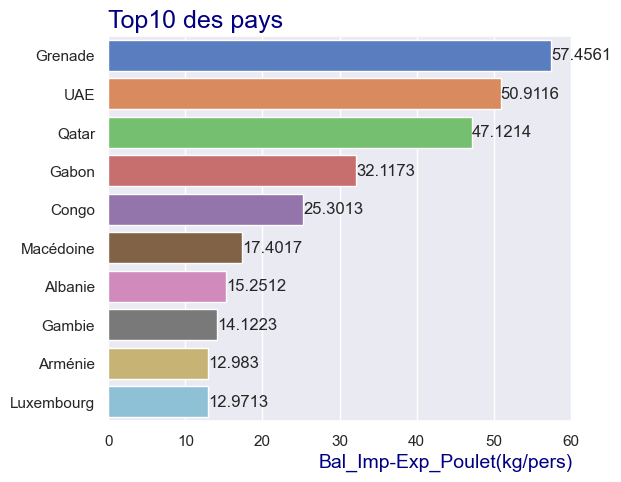

In [525]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

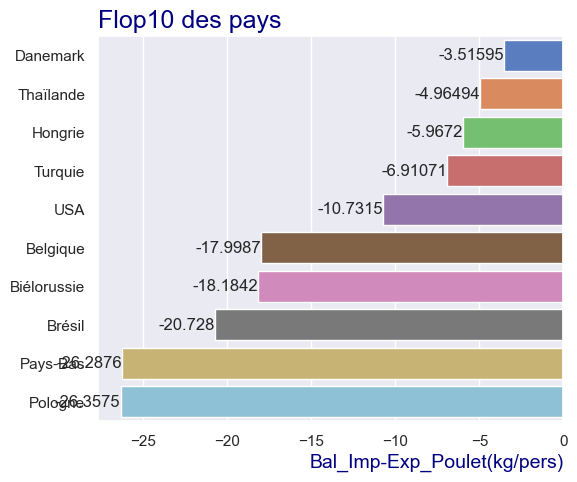

In [526]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.4 - 'PIB-Valeur par habitant(USD)'</h4>
</div>

In [527]:
var = 'PIB-Valeur par habitant(USD)'

In [528]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: PIB-Valeur par habitant(USD)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count            112.0
mean      19961.664406
std        26129.49937
min         429.395861
25%        3413.182233
50%        8082.376833
75%       25053.010392
max      125897.199853
Name: PIB-Valeur par habitant(USD), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
PIB-Valeur par habitant(USD),Float64,112,112,0,112,NaN


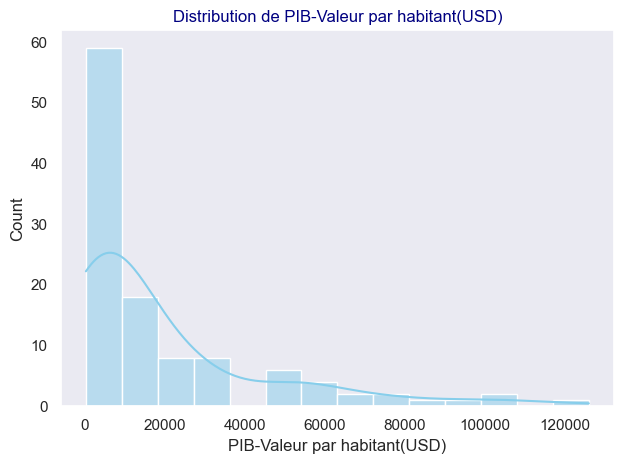

In [529]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

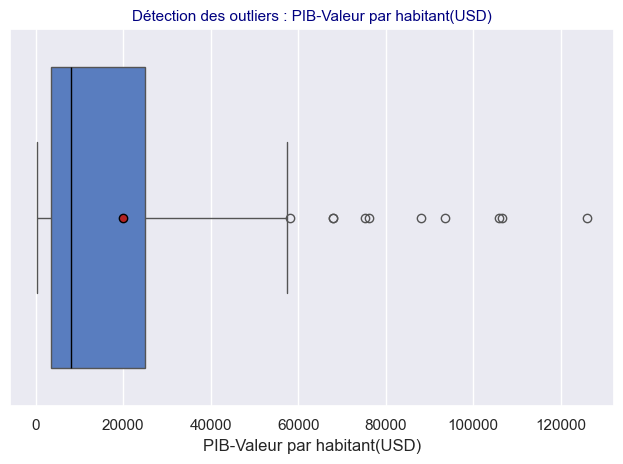

In [530]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [531]:
#les outliers positifs
mask_temp = df_Etude_Marche_V_1_1[var] > 60_000

df_Etude_Marche_V_1_1.loc[mask_temp,['iso3','pays',var]]

,iso3,pays,PIB-Valeur par habitant(USD)
4,AUS,Australie,67866.792484
19,CHE,Suisse,93636.424921
31,DNK,Danemark,68029.486782
55,IRL,Irlande,105993.272773
58,ISL,Islande,75260.405234
70,LUX,Luxembourg,125897.199853
86,NOR,Norvège,106622.826063
93,QAT,Qatar,87974.166043
108,USA,USA,76100.715015


##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [532]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  21639.8281585 
le seuil bas  en deça duquel on est outliers est :  -29046.56 
le seuil haut au dessus duquel on est outliers est :  57512.75


In [533]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  10  'outliers'. 
Ce qui représente  8.93  % des pays.

les outliers sont : 


,iso3,pays,continent,PIB-Valeur par habitant(USD)
70,LUX,Luxembourg,Europe,125897.199853
86,NOR,Norvège,Europe,106622.826063
55,IRL,Irlande,Europe,105993.272773
19,CHE,Suisse,Europe,93636.424921
93,QAT,Qatar,Asia,87974.166043
108,USA,USA,America,76100.715015
58,ISL,Islande,Europe,75260.405234
31,DNK,Danemark,Europe,68029.486782
4,AUS,Australie,Pacific,67866.792484
59,ISR,Israël,Asia,58086.357487


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [534]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727
1,86,NOR,Norvège,Europe,-1544.384,5456801,0.163508,106622.826063,2.309558,98.5,0.0,3.9,77.725121
2,55,IRL,Irlande,Europe,-948.9664,5110016,-0.132407,105993.272773,4.308361,99.0,0.027671,3.5,78.672989
3,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
4,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
5,108,USA,USA,America,-7227.043,341534045,-10.731474,76100.715015,5.067229,95.3,0.000004,3.9,47.393364
6,58,ISL,Islande,Europe,-2435.512,380356,4.424618,75260.405234,3.172151,99.6,0.055185,3.6,95.260666
7,31,DNK,Danemark,Europe,-1150.822,5902904,-3.515946,68029.486782,1.941537,99.1,0.370325,4.1,76.777252
8,4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085
9,59,ISR,Israël,Asia,-3151.131,9103151,-0.020705,58086.357487,6.729034,83.5,0.0,3.7,9.952606


In [535]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,102,TGO,Togo,Africa,-4380.54,9089738,2.160224,913.929411,0.794684,45.4,0.177443,2.3,14.21801
103,8,BFA,Burkina Faso,Africa,-3863.861,22509038,0.002209,845.760531,0.940187,36.9,0.000246,2.3,5.687204
104,76,MLI,Mali,Africa,-3841.125,23072640,0.016264,833.297255,0.346705,41.3,0.001164,2.0,0.473934
105,43,GMB,Gambie,Africa,-4119.869,2636470,14.122292,824.66715,3.139478,56.0,0.00096,2.3,45.971565
106,97,SDN,Soudan,Africa,-4456.919,49383346,0.018011,783.574675,0.240937,66.3,0.0,2.3,1.895735
107,44,GNB,Guinée-Bissau,Africa,-4244.364,2105529,1.375621,747.762697,0.484941,36.0,0.0,2.4,34.123222
108,23,COD,RDCongo,Africa,-5995.903,102396968,0.750833,631.770922,0.175814,8.6,0.030486,2.3,5.21327
109,67,LBR,Libéria,Africa,-4668.801,5373294,0.639209,615.764237,2.321921,35.9,0.024752,2.4,42.65403
110,73,MDG,Madagascar,Africa,-8567.521,30437260,0.000662,505.035528,0.672057,6.4,0.000007,1.8,19.905212
111,17,CAF,Centrafrique,Africa,-4860.918,5098039,1.184259,429.395861,0.396833,13.3,0.020194,2.6,3.317536


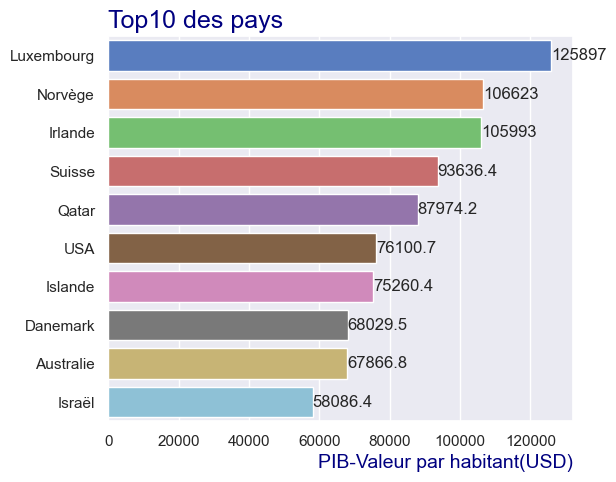

In [536]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

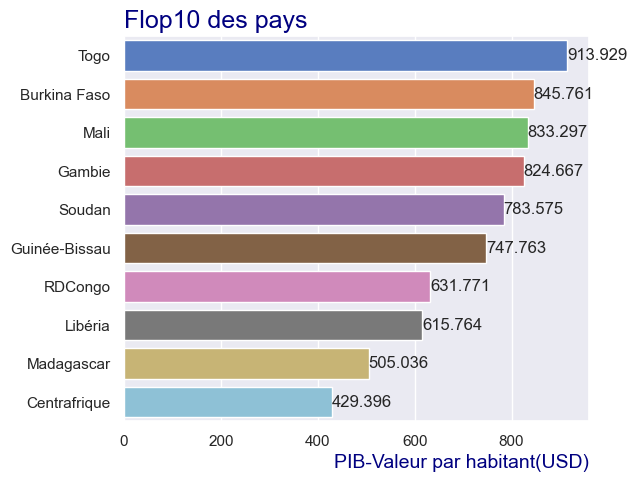

In [537]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.5 - "Part de Volaille dans Alimentation(%)"</h4>
</div>

In [538]:
var = "Part de Volaille dans Alimentation(%)"

In [539]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Part de Volaille dans Alimentation(%)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count       112.0
mean      2.81557
std       1.91653
min      0.121814
25%       1.39766
50%      2.425665
75%      4.005687
max      7.655395
Name: Part de Volaille dans Alimentation(%), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Part de Volaille dans Alimentation(%),Float64,112,112,0,112,NaN


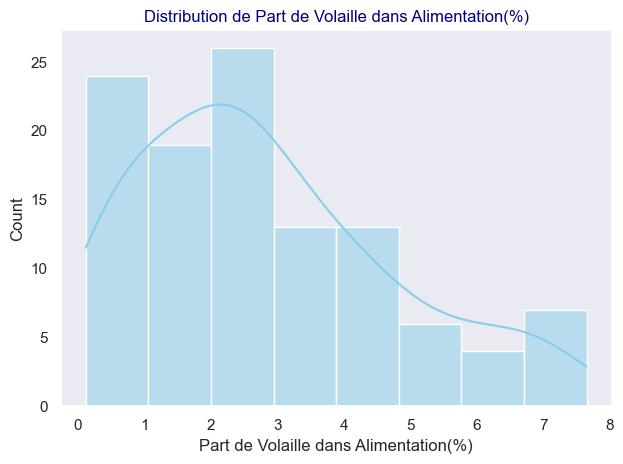

In [540]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

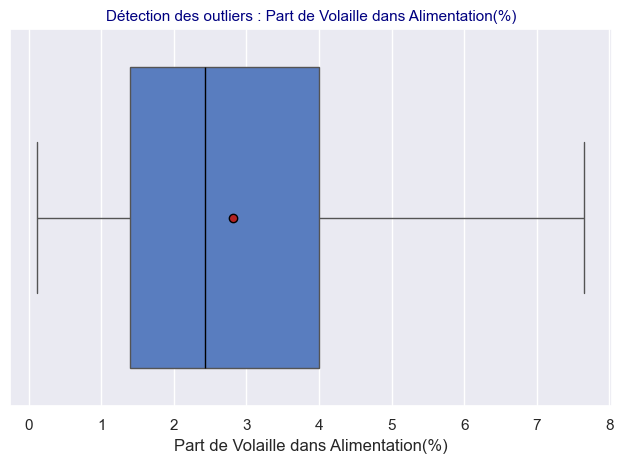

In [541]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [542]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  2.6080273932935247 
le seuil bas  en deça duquel on est outliers est :  -2.51 
le seuil haut au dessus duquel on est outliers est :  7.92


In [543]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,Part de Volaille dans Alimentation(%)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [544]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,48,GUY,Guyana,America,-7305.741,821637,0.544413,18199.47484,7.655395,90.6,0.0,2.4,43.601894
1,61,JAM,Jamaïque,America,-7810.141,2839144,3.158512,6047.216553,7.184085,77.9,0.0,2.4,57.34597
2,88,PER,Pérou,America,-10140.63,33475438,2.409456,7125.829235,7.155793,66.4,0.0,2.5,24.170616
3,46,GRD,Grenade,America,-7112.1,116913,57.456143,9509.250006,7.114045,78.9,0.0,2.5,86.25592
4,13,BOL,Bolivie,America,-9900.388,12077154,0.247957,3600.121635,6.882025,91.5,0.0,2.4,35.071091
5,81,MYS,Malaisie,Asia,-10537.39,34695493,4.715732,11971.924961,6.745588,98.2,0.000721,3.6,50.710899
6,59,ISR,Israël,Asia,-3151.131,9103151,-0.020705,58086.357487,6.729034,83.5,0.0,3.7,9.952606
7,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
8,2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
9,87,PAN,Panama,America,-8773.133,4400773,2.72259,17357.628629,6.245018,56.5,0.0,3.3,52.606636


In [545]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,44,GNB,Guinée-Bissau,Africa,-4244.364,2105529,1.375621,747.762697,0.484941,36.0,0.0,2.4,34.123222
103,17,CAF,Centrafrique,Africa,-4860.918,5098039,1.184259,429.395861,0.396833,13.3,0.020194,2.6,3.317536
104,104,TJK,Tadjikistan,Asia,-5313.692,10182222,0.085347,1054.189128,0.381142,71.4,0.0,2.5,27.488152
105,16,BWA,Botswana,Africa,-8126.788,2439892,1.986686,7737.65468,0.371854,39.7,0.0,3.1,87.203789
106,76,MLI,Mali,Africa,-3841.125,23072640,0.016264,833.297255,0.346705,41.3,0.001164,2.0,0.473934
107,9,BGD,Bangladesh,Asia,-7938.608,169384897,0.000044,2527.52127,0.25804,51.8,0.0,2.3,15.639811
108,83,NGA,Nigéria,Africa,-4287.72,223150896,0.000726,2173.77085,0.245306,21.3,0.000005,2.4,7.582938
109,97,SDN,Soudan,Africa,-4456.919,49383346,0.018011,783.574675,0.240937,66.3,0.0,2.3,1.895735
110,23,COD,RDCongo,Africa,-5995.903,102396968,0.750833,631.770922,0.175814,8.6,0.030486,2.3,5.21327
111,96,RWA,Rwanda,Africa,-6012.233,13651030,0.106151,966.307032,0.121814,24.3,0.0,2.9,49.763035


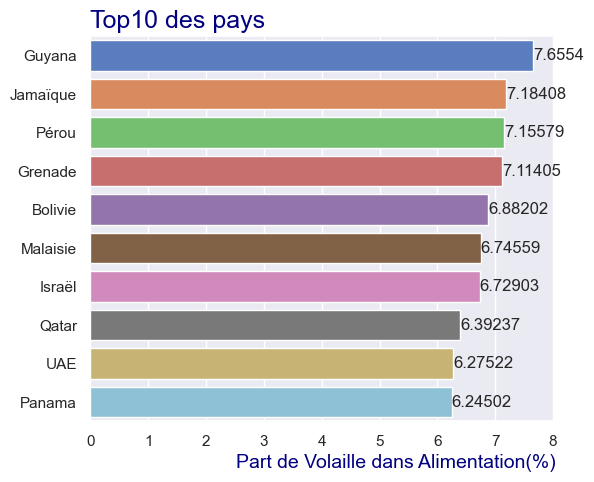

In [546]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

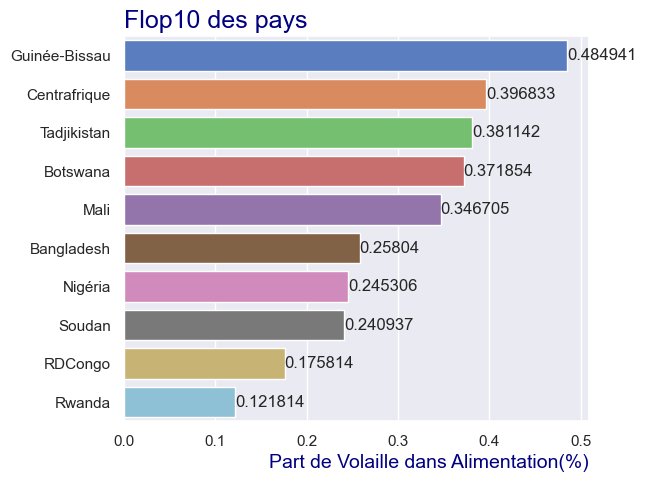

In [547]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [548]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  2.6080273932935247 
le seuil bas  en deça duquel on est outliers est :  -2.51 
le seuil haut au dessus duquel on est outliers est :  7.92


In [549]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,Part de Volaille dans Alimentation(%)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [550]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,48,GUY,Guyana,America,-7305.741,821637,0.544413,18199.47484,7.655395,90.6,0.0,2.4,43.601894
1,61,JAM,Jamaïque,America,-7810.141,2839144,3.158512,6047.216553,7.184085,77.9,0.0,2.4,57.34597
2,88,PER,Pérou,America,-10140.63,33475438,2.409456,7125.829235,7.155793,66.4,0.0,2.5,24.170616
3,46,GRD,Grenade,America,-7112.1,116913,57.456143,9509.250006,7.114045,78.9,0.0,2.5,86.25592
4,13,BOL,Bolivie,America,-9900.388,12077154,0.247957,3600.121635,6.882025,91.5,0.0,2.4,35.071091
5,81,MYS,Malaisie,Asia,-10537.39,34695493,4.715732,11971.924961,6.745588,98.2,0.000721,3.6,50.710899
6,59,ISR,Israël,Asia,-3151.131,9103151,-0.020705,58086.357487,6.729034,83.5,0.0,3.7,9.952606
7,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
8,2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
9,87,PAN,Panama,America,-8773.133,4400773,2.72259,17357.628629,6.245018,56.5,0.0,3.3,52.606636


In [551]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,44,GNB,Guinée-Bissau,Africa,-4244.364,2105529,1.375621,747.762697,0.484941,36.0,0.0,2.4,34.123222
103,17,CAF,Centrafrique,Africa,-4860.918,5098039,1.184259,429.395861,0.396833,13.3,0.020194,2.6,3.317536
104,104,TJK,Tadjikistan,Asia,-5313.692,10182222,0.085347,1054.189128,0.381142,71.4,0.0,2.5,27.488152
105,16,BWA,Botswana,Africa,-8126.788,2439892,1.986686,7737.65468,0.371854,39.7,0.0,3.1,87.203789
106,76,MLI,Mali,Africa,-3841.125,23072640,0.016264,833.297255,0.346705,41.3,0.001164,2.0,0.473934
107,9,BGD,Bangladesh,Asia,-7938.608,169384897,0.000044,2527.52127,0.25804,51.8,0.0,2.3,15.639811
108,83,NGA,Nigéria,Africa,-4287.72,223150896,0.000726,2173.77085,0.245306,21.3,0.000005,2.4,7.582938
109,97,SDN,Soudan,Africa,-4456.919,49383346,0.018011,783.574675,0.240937,66.3,0.0,2.3,1.895735
110,23,COD,RDCongo,Africa,-5995.903,102396968,0.750833,631.770922,0.175814,8.6,0.030486,2.3,5.21327
111,96,RWA,Rwanda,Africa,-6012.233,13651030,0.106151,966.307032,0.121814,24.3,0.0,2.9,49.763035


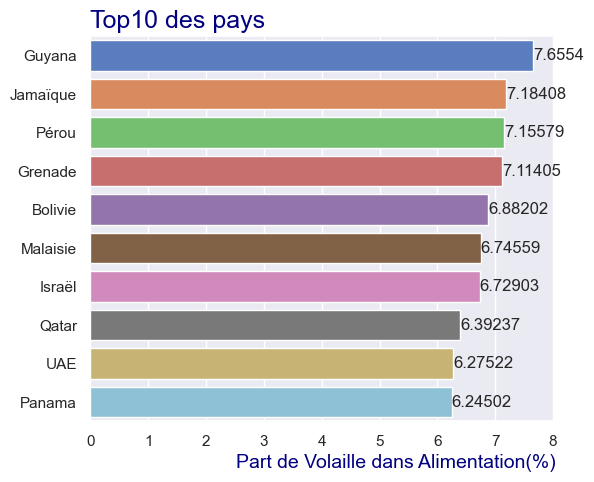

In [552]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

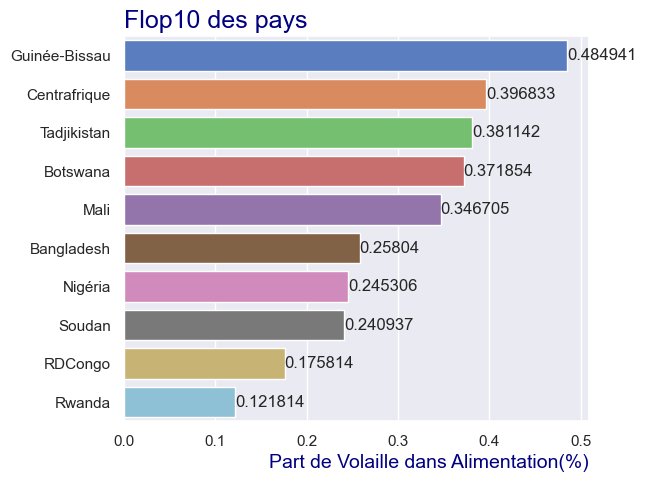

In [553]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.6 - 'Part d'accès à Alimentation saine(%)'</h4>
</div>

In [554]:
var = "Part d'accès à Alimentation saine(%)"

In [555]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Part d'accès à Alimentation saine(%)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count        112.0
mean      72.29375
std      25.377607
min            6.4
25%         52.275
50%          81.15
75%         94.475
max          100.0
Name: Part d'accès à Alimentation saine(%), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Part d'accès à Alimentation saine(%),Float64,112,112,0,105,NaN


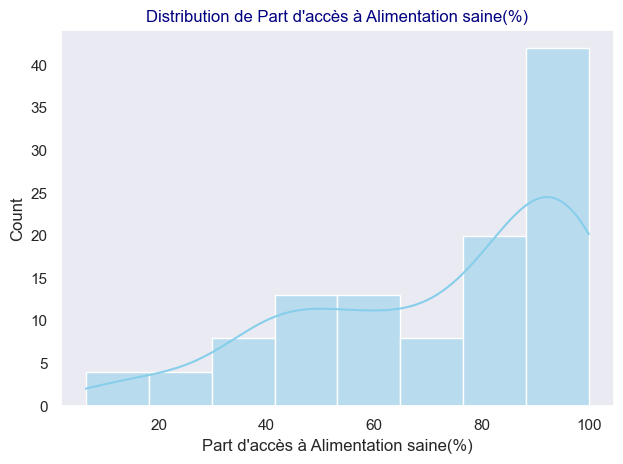

In [556]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

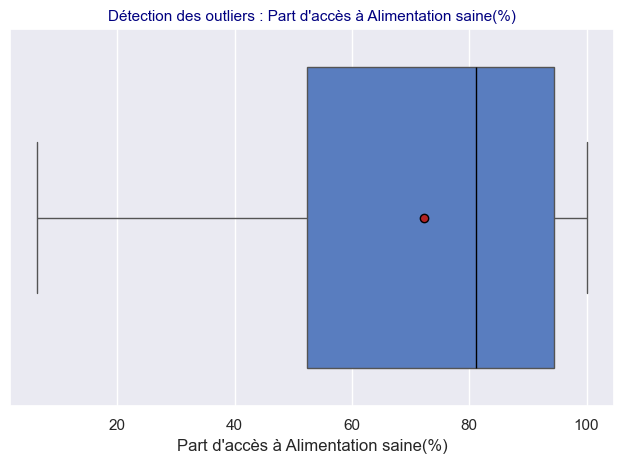

In [557]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [558]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  42.20000000000001 
le seuil bas  en deça duquel on est outliers est :  -11.03 
le seuil haut au dessus duquel on est outliers est :  157.78


In [559]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,Part d'accès à Alimentation saine(%)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [560]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
1,58,ISL,Islande,Europe,-2435.512,380356,4.424618,75260.405234,3.172151,99.6,0.055185,3.6,95.260666
2,6,BEL,Belgique,Europe,-378.6808,11641820,-17.998686,49986.832591,1.547455,99.3,2.576017,4.1,58.293839
3,37,FIN,Finlande,Europe,-2123.761,5569299,-0.234755,50988.079784,2.679692,99.2,0.00799,4.2,71.09005
4,31,DNK,Danemark,Europe,-1150.822,5902904,-3.515946,68029.486782,1.941537,99.1,0.370325,4.1,76.777252
5,55,IRL,Irlande,Europe,-948.9664,5110016,-0.132407,105993.272773,4.308361,99.0,0.027671,3.5,78.672989
6,12,BLR,Biélorussie,Europe,-1921.71,9173237,-18.184166,7642.810883,3.994294,99.0,0.0,2.7,18.483412
7,85,NLD,Pays-Bas,Europe,-556.2308,17904421,-26.287624,57391.6356,1.475962,98.9,2.015567,4.2,68.720383
8,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
9,100,SVN,Slovénie,Europe,-908.9259,2115228,-2.213024,28295.422508,3.106658,98.6,0.079949,3.6,75.829384


In [561]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,44,GNB,Guinée-Bissau,Africa,-4244.364,2105529,1.375621,747.762697,0.484941,36.0,0.0,2.4,34.123222
103,67,LBR,Libéria,Africa,-4668.801,5373294,0.639209,615.764237,2.321921,35.9,0.024752,2.4,42.65403
104,0,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
105,96,RWA,Rwanda,Africa,-6012.233,13651030,0.106151,966.307032,0.121814,24.3,0.0,2.9,49.763035
106,83,NGA,Nigéria,Africa,-4287.72,223150896,0.000726,2173.77085,0.245306,21.3,0.000005,2.4,7.582938
107,24,COG,Congo,Africa,-5746.042,6035104,25.301304,2570.136581,4.734824,20.9,0.492906,2.1,46.91943
108,51,HTI,Haïti,America,-7410.694,11503606,8.983686,1618.582427,1.888777,16.4,0.0,1.8,10.42654
109,17,CAF,Centrafrique,Africa,-4860.918,5098039,1.184259,429.395861,0.396833,13.3,0.020194,2.6,3.317536
110,23,COD,RDCongo,Africa,-5995.903,102396968,0.750833,631.770922,0.175814,8.6,0.030486,2.3,5.21327
111,73,MDG,Madagascar,Africa,-8567.521,30437260,0.000662,505.035528,0.672057,6.4,0.000007,1.8,19.905212


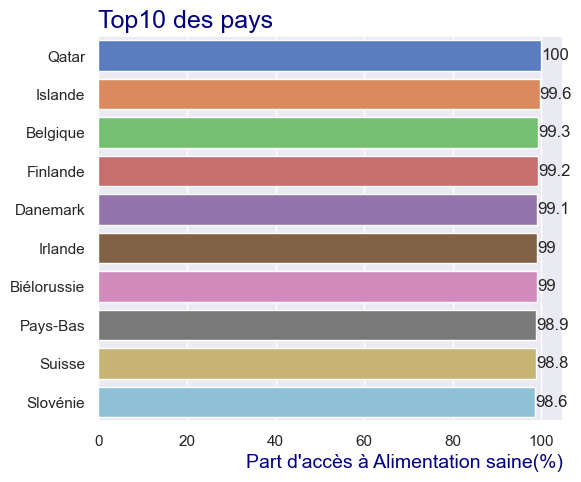

In [562]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

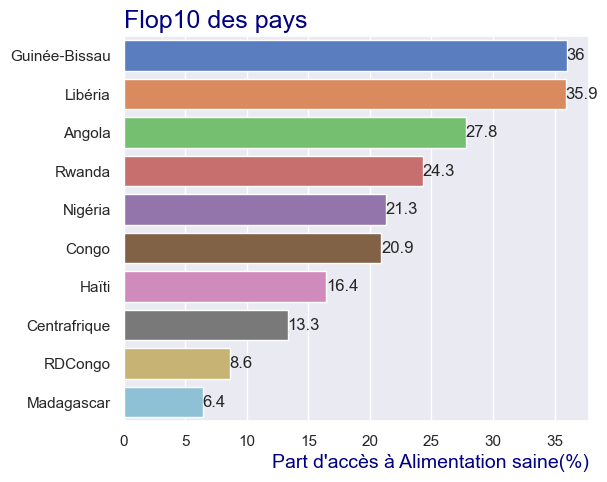

In [563]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.7 - 'Export Poulet Fr (kg/pers)'</h4>
</div>

In [564]:
quant_vars

['dist_Commerciale_Fra (km)',
 'Population_2022',
 'Bal_Imp-Exp_Poulet(kg/pers)',
 'PIB-Valeur par habitant(USD)',
 'Part de Volaille dans Alimentation(%)',
 "Part d'accès à Alimentation saine(%)",
 'Export Poulet Fr (kg/pers)',
 'Score Qualité Transport 2023 (1 à 5)',
 'Score Stabilité Politique 2023 (1 à 100)']

In [565]:
var = 'Export Poulet Fr (kg/pers)'

In [566]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Export Poulet Fr (kg/pers)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count       112.0
mean     0.118939
std      0.396219
min           0.0
25%           0.0
50%      0.000408
75%      0.066655
max      2.576017
Name: Export Poulet Fr (kg/pers), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Export Poulet Fr (kg/pers),Float64,112,112,0,65,NaN


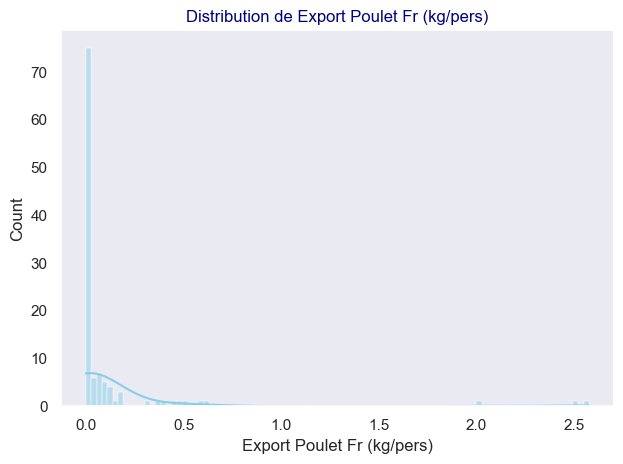

In [567]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

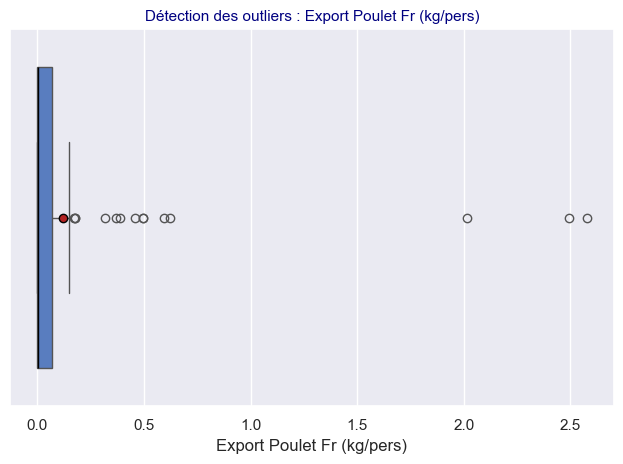

In [568]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

Sur 113 pays seul certains font du commerce de Poulet avec la France.

In [569]:
#Nb de pays Important des Poulet d'origine française :

mask_temp = df_Etude_Marche_V_1_1['Export Poulet Fr (kg/pers)']>0

#liste de pays vers lesquels la France Exporte du Poulet
liste_pays_Exp_poul_fr = df_Etude_Marche_V_1_1.loc[mask_temp,'pays'].unique()

print(f"Nb de pays vers lesquels la France Exporte des poulets :{len(liste_pays_Exp_poul_fr)}")
print("liste des pays vers lesquels la France exporte des poulets :")
print(liste_pays_Exp_poul_fr)
print("\n")
#liste des continents vers lesquels la France Exporte du Poulet
liste_conti_Exp_poul_fr = df_Etude_Marche_V_1_1.loc[mask_temp,'continent'].unique()

print(f"Nb de continents vers lesquels la France Exporte des poulets :{len(liste_conti_Exp_poul_fr)}")
print("liste des continents vers lesquels la France exporte des poulets :")
print(liste_conti_Exp_poul_fr)

Nb de pays vers lesquels la France Exporte des poulets :64
liste des pays vers lesquels la France exporte des poulets :
<StringArray>
[                     'Angola',                     'Albanie',
                         'UAE',                     'Arménie',
                    'Autriche',                    'Belgique',
                       'Bénin',                'Burkina Faso',
                    'Bulgarie',                'Centrafrique',
                      'Canada',                      'Suisse',
                       'Chine',                    'Cameroun',
                     'RDCongo',                       'Congo',
                      'Chypre',                    'RTchèque',
                   'Allemagne',                    'Djibouti',
                    'Danemark', 'Dominicaine (la République)',
                     'Espagne',                     'Estonie',
                    'Finlande',                       'Gabon',
                 'Royaume-Uni',                

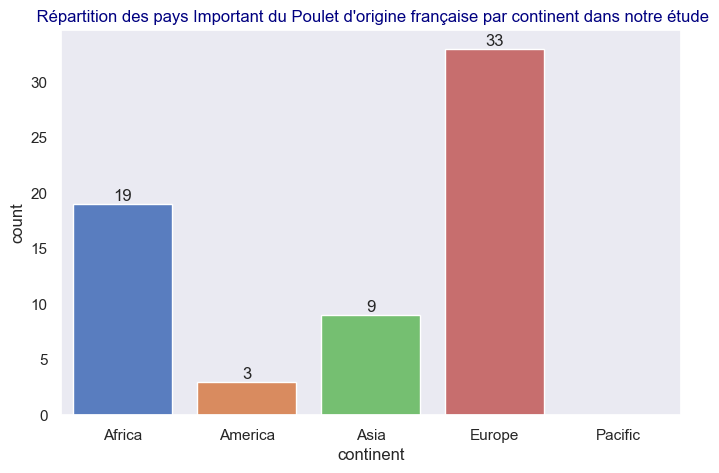

In [570]:
# Répartition des pays Important des Poulet d'origine française par continent
mask_temp = df_Etude_Marche_V_1_1['Export Poulet Fr (kg/pers)']>0

#liste de pays vers lesquels la France Exporte du Poulet
df_temp = df_Etude_Marche_V_1_1.loc[mask_temp,['pays','continent']]

plt.figure(figsize=(8, 5))
ax = sns.countplot(x="continent", 
              hue="continent",
              data=df_temp, 
              palette=palette_fixe_continent_1,
              hue_order=Ordre_continent_1,   # <-- ordre des couleurs
              order=Ordre_continent_1,       # <-- ordre des barres (axe X)
             legend=False)

for x in range(0,len(ax.containers)) :
    ax.bar_label(ax.containers[x], fmt='%.0f')

plt.title(" Répartition des pays Important du Poulet d'origine française par continent dans notre étude")
plt.show()

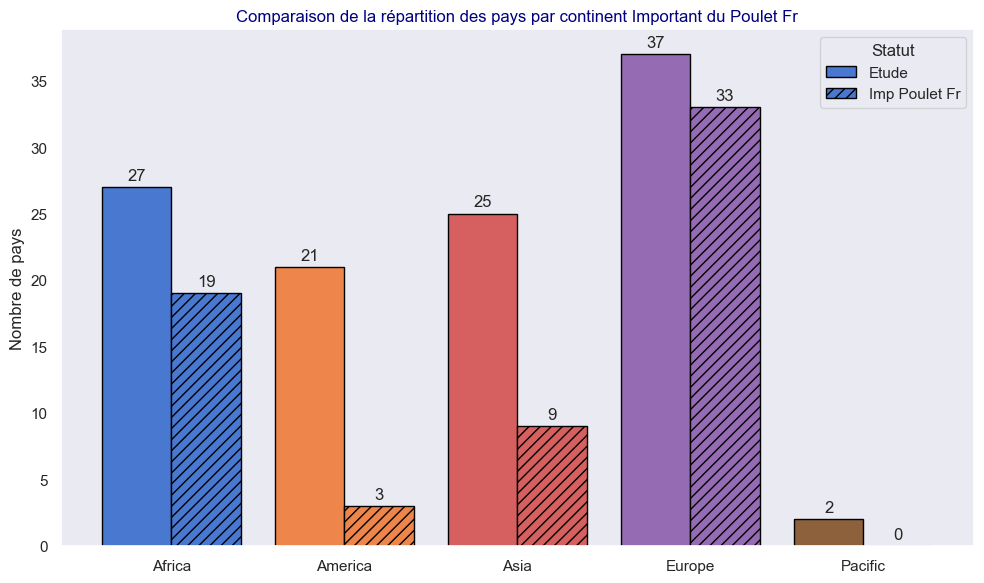

In [571]:
#  Comptage des pays par continent dans chaque DataFrame
df_etude = df_Etude_Marche_V_1_1['continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_etude')

mask_temp = df_Etude_Marche_V_1_1['Export Poulet Fr (kg/pers)']>0
df_poulet_fr = df_Etude_Marche_V_1_1.loc[mask_temp,'continent'].value_counts().rename_axis('continent').reset_index(name='nombre_pays_Imp_Poul_Fr')

#  Fusion des deux tableaux
df_comparatif = pd.merge(df_etude , df_poulet_fr, on='continent', how='outer').fillna(0)
df_comparatif['continent'] = pd.Categorical(df_comparatif['continent'], categories=Ordre_continent_bis, ordered=True)
df_comparatif = df_comparatif.sort_values("continent")

#  Création du graphique
bar_width = 0.4
x = range(len(df_comparatif))

fig, ax = plt.subplots(figsize=(10, 6))

# Barres "Avant sélection" (couleur pleine)
bars_avant = ax.bar(
    [i - bar_width/2 for i in x],
    df_comparatif['nombre_pays_etude'],
    width=bar_width,
    label='Etude',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']],
    edgecolor='black'
)

# Barres "Après sélection" (hachurées)
bars_apres = ax.bar(
    [i + bar_width/2 for i in x],
    df_comparatif['nombre_pays_Imp_Poul_Fr'],
    width=bar_width,
    label='Imp Poulet Fr',
    color=[palette_fixe_continent_bis[c] for c in df_comparatif['continent']],
    hatch='///',
    edgecolor='black'
)

# Ajout des labels de valeur au-dessus des barres
ax.bar_label(bars_avant, fmt='%.0f', padding=3)
ax.bar_label(bars_apres, fmt='%.0f', padding=3)

# Axes et légendes
ax.set_xticks(range(len(df_comparatif)))
ax.set_xticklabels(df_comparatif['continent'])
ax.set_ylabel("Nombre de pays")
ax.set_title("Comparaison de la répartition des pays par continent Important du Poulet Fr")
ax.legend(title="Statut", loc='best')

plt.tight_layout()
plt.show()

In [572]:
#Nb de pays Important des Poulet d'origine française :

mask_poulet_fr = df_Etude_Marche_V_1_1['Export Poulet Fr (kg/pers)']>0

for conti in df_Etude_Marche_V_1_1['continent'].unique() :
    print(conti," :\n")
    mask_conti = df_Etude_Marche_V_1_1['continent']==conti
    df_temp_conti = df_Etude_Marche_V_1_1.loc[mask_conti & mask_poulet_fr,'pays']
    txt_pays = " , ".join(df_temp_conti.unique())
    print(txt_pays)
    print("\n")
        

Africa  :

Angola , Bénin , Burkina Faso , Centrafrique , Cameroun , RDCongo , Congo , Djibouti , Gabon , Ghana , Guinée , Gambie , Libéria , Madagascar , Mali , Mauritanie , Maurice , Nigéria , Togo


Europe  :

Albanie , Autriche , Belgique , Bulgarie , Suisse , Chypre , RTchèque , Allemagne , Danemark , Espagne , Estonie , Finlande , Royaume-Uni , Grèce , Croatie , Hongrie , Irlande , Islande , Italie , Lituanie , Luxembourg , Lettonie , Moldavie , Macédoine , Malte , Pays-Bas , Pologne , Portugal , Roumanie , Serbie , Slovaquie , Slovénie , Suède


Asia  :

UAE , Arménie , Chine , Japon , Malaisie , Philippines , Qatar , Thaïlande , Viet Nam


Pacific  :




America  :

Canada , Dominicaine (la République) , USA




In [573]:
#les outliers positifs
mask_temp = df_Etude_Marche_V_1_1[var] > 2

df_Etude_Marche_V_1_1.loc[mask_temp,['iso3','pays',var]]

,iso3,pays,Export Poulet Fr (kg/pers)
6,BEL,Belgique,2.576017
70,LUX,Luxembourg,2.495129
85,NLD,Pays-Bas,2.015567


##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [574]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  0.06665514382146517 
le seuil bas  en deça duquel on est outliers est :  -0.1 
le seuil haut au dessus duquel on est outliers est :  0.17


In [575]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  14  'outliers'. 
Ce qui représente  12.5  % des pays.

les outliers sont : 


,iso3,pays,continent,Export Poulet Fr (kg/pers)
6,BEL,Belgique,Europe,2.576017
70,LUX,Luxembourg,Europe,2.495129
85,NLD,Pays-Bas,Europe,2.015567
39,GAB,Gabon,Africa,0.623376
2,ARE,UAE,Asia,0.595289
91,PRT,Portugal,Europe,0.495589
24,COG,Congo,Africa,0.492906
29,DEU,Allemagne,Europe,0.455737
19,CHE,Suisse,Europe,0.387845
31,DNK,Danemark,Europe,0.370325


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [576]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,6,BEL,Belgique,Europe,-378.6808,11641820,-17.998686,49986.832591,1.547455,99.3,2.576017,4.1,58.293839
1,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727
2,85,NLD,Pays-Bas,Europe,-556.2308,17904421,-26.287624,57391.6356,1.475962,98.9,2.015567,4.2,68.720383
3,39,GAB,Gabon,Africa,-5237.393,2430747,32.117308,8427.098986,5.606583,62.7,0.623376,2.2,33.649288
4,2,ARE,UAE,Asia,-5171.043,10242086,50.911554,53707.980081,6.275218,97.7,0.595289,4.1,70.142181
5,91,PRT,Portugal,Europe,-1289.051,10417073,2.503946,24812.903928,3.517949,88.0,0.495589,3.6,70.616112
6,24,COG,Congo,Africa,-5746.042,6035104,25.301304,2570.136581,4.734824,20.9,0.492906,2.1,46.91943
7,29,DEU,Allemagne,Europe,-682.0841,84086227,2.023427,48901.658828,1.688402,98.0,0.455737,4.3,66.350708
8,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
9,31,DNK,Danemark,Europe,-1150.822,5902904,-3.515946,68029.486782,1.941537,99.1,0.370325,4.1,76.777252


In [577]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,54,IND,Inde,Asia,-7038.913,1425423212,-0.003314,2445.390241,0.510236,44.4,0.0,3.2,21.327015
103,57,IRQ,Iraq,Asia,-3783.21,44070551,10.269715,5937.195471,2.316201,73.3,0.0,2.2,2.369668
104,59,ISR,Israël,Asia,-3151.131,9103151,-0.020705,58086.357487,6.729034,83.5,0.0,3.7,9.952606
105,61,JAM,Jamaïque,America,-7810.141,2839144,3.158512,6047.216553,7.184085,77.9,0.0,2.4,57.34597
106,63,KAZ,Kazakstan,Asia,-4921.805,20034609,6.904956,11624.721733,2.412791,94.4,0.0,2.5,36.492889
107,64,KGZ,Kirghizistan,Asia,-5483.951,6955788,5.469382,1648.509557,1.040927,64.2,0.0,2.4,26.540285
108,65,KOR,Corée du Sud,Asia,-9220.22,51782512,2.329766,32305.130659,2.447414,95.5,0.0,4.1,68.246445
109,66,LAO,"Lao, Rép. dém. Pop.",Asia,-9346.193,7559007,0.624549,2040.341675,0.781319,42.9,0.0,2.3,75.355453
110,68,LKA,Sri Lanka,Asia,-8425.775,22834965,-0.016493,3489.676379,1.405782,58.9,0.0,2.4,25.592417
111,111,ZAF,Afrique du Sud,Africa,-8750.608,62378410,3.92638,6766.481054,5.405288,38.8,0.0,3.6,20.853081


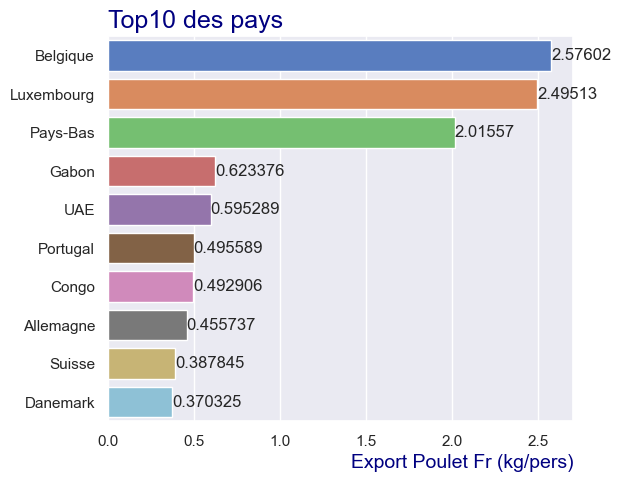

In [578]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

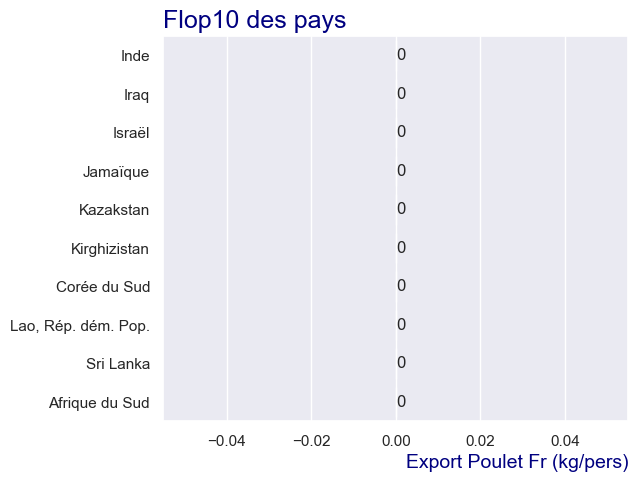

In [579]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.8 - 'Score Qualité Transport 2023 (1 à 5)'</h4>
</div>

In [580]:
quant_vars

['dist_Commerciale_Fra (km)',
 'Population_2022',
 'Bal_Imp-Exp_Poulet(kg/pers)',
 'PIB-Valeur par habitant(USD)',
 'Part de Volaille dans Alimentation(%)',
 "Part d'accès à Alimentation saine(%)",
 'Export Poulet Fr (kg/pers)',
 'Score Qualité Transport 2023 (1 à 5)',
 'Score Stabilité Politique 2023 (1 à 100)']

In [581]:
var = 'Score Qualité Transport 2023 (1 à 5)'

In [582]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Score Qualité Transport 2023 (1 à 5)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count       112.0
mean     2.957143
std      0.700671
min           1.8
25%           2.4
50%           2.8
75%           3.6
max           4.4
Name: Score Qualité Transport 2023 (1 à 5), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Score Qualité Transport 2023 (1 à 5),Float64,112,112,0,27,NaN


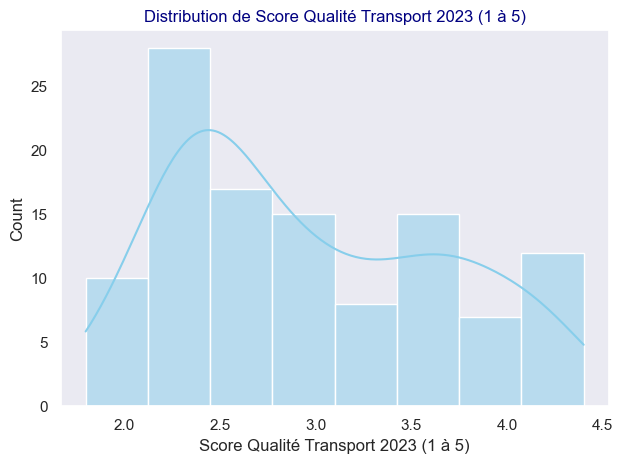

In [583]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

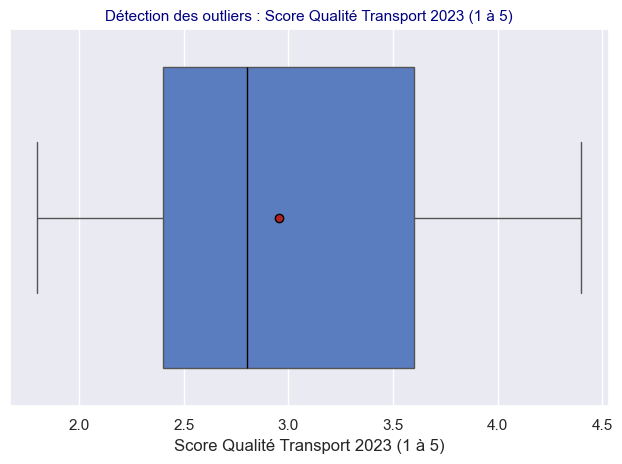

In [584]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [585]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  1.2000000000000002 
le seuil bas  en deça duquel on est outliers est :  0.6 
le seuil haut au dessus duquel on est outliers est :  5.4


In [586]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,Score Qualité Transport 2023 (1 à 5)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [587]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
1,18,CAN,Canada,America,-6326.645,38821259,2.187936,55596.844019,4.262895,97.3,0.000683,4.3,76.303314
2,29,DEU,Allemagne,Europe,-682.0841,84086227,2.023427,48901.658828,1.688402,98.0,0.455737,4.3,66.350708
3,101,SWE,Suède,Europe,-1550.527,10487338,2.350694,56040.302284,1.917067,96.4,0.032261,4.2,73.459717
4,37,FIN,Finlande,Europe,-2123.761,5569299,-0.234755,50988.079784,2.679692,99.2,0.00799,4.2,71.09005
5,62,JPN,Japon,Asia,-9796.54,124997578,4.569616,34143.736546,4.035648,92.5,0.00057,4.2,81.516586
6,85,NLD,Pays-Bas,Europe,-556.2308,17904421,-26.287624,57391.6356,1.475962,98.9,2.015567,4.2,68.720383
7,65,KOR,Corée du Sud,Asia,-9220.22,51782512,2.329766,32305.130659,2.447414,95.5,0.0,4.1,68.246445
8,6,BEL,Belgique,Europe,-378.6808,11641820,-17.998686,49986.832591,1.547455,99.3,2.576017,4.1,58.293839
9,4,AUS,Australie,Pacific,-16464.9,26200984,-1.910985,67866.792484,5.347738,96.8,0.0,4.1,79.62085


In [588]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,24,COG,Congo,Africa,-5746.042,6035104,25.301304,2570.136581,4.734824,20.9,0.492906,2.1,46.91943
103,22,CMR,Cameroun,Africa,-4587.788,27632771,0.037961,1588.478723,0.591549,44.1,0.005983,2.1,11.374408
104,0,AGO,Angola,Africa,-6363.6,35635029,8.646319,3183.699796,1.627105,27.8,0.00697,2.1,32.227489
105,33,DZA,Algérie,Africa,-1158.292,45477389,-0.000638,4273.922183,0.667243,79.8,0.0,2.1,23.22275
106,76,MLI,Mali,Africa,-3841.125,23072640,0.016264,833.297255,0.346705,41.3,0.001164,2.0,0.473934
107,79,MRT,Mauritanie,Africa,-3566.495,4875637,9.591481,2321.969142,0.98,44.8,0.011207,2.0,26.066351
108,84,NIC,Nicaragua,America,-8958.55,6730654,1.416602,2255.423693,3.325909,72.7,0.0,1.9,42.180096
109,72,MDA,Moldavie,Europe,-1956.539,3039985,6.705359,4433.397099,3.277951,88.1,0.087665,1.9,20.379147
110,51,HTI,Haïti,America,-7410.694,11503606,8.983686,1618.582427,1.888777,16.4,0.0,1.8,10.42654
111,73,MDG,Madagascar,Africa,-8567.521,30437260,0.000662,505.035528,0.672057,6.4,0.000007,1.8,19.905212


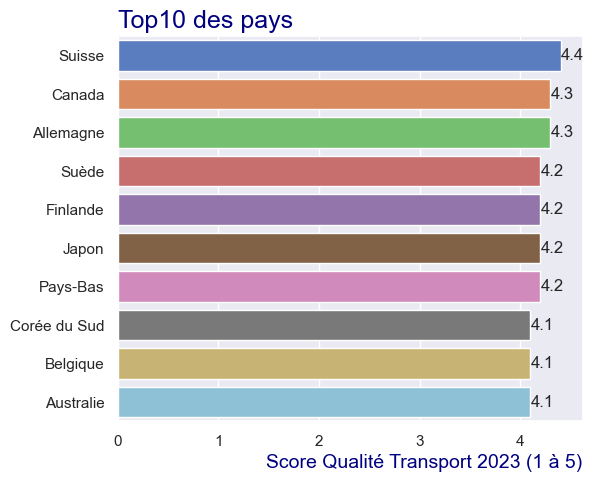

In [589]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

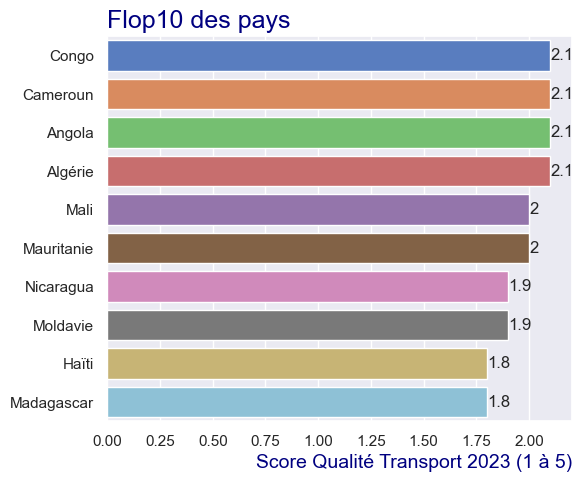

In [590]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> 4.2.9 - 'Score Stabilité Politique 2023 (1 à 100)'</h4>
</div>

In [591]:
quant_vars

['dist_Commerciale_Fra (km)',
 'Population_2022',
 'Bal_Imp-Exp_Poulet(kg/pers)',
 'PIB-Valeur par habitant(USD)',
 'Part de Volaille dans Alimentation(%)',
 "Part d'accès à Alimentation saine(%)",
 'Export Poulet Fr (kg/pers)',
 'Score Qualité Transport 2023 (1 à 5)',
 'Score Stabilité Politique 2023 (1 à 100)']

In [592]:
var = 'Score Stabilité Politique 2023 (1 à 100)'

In [593]:
Premieres_Analyses(df_Etude_Marche_V_1_1[var])


---- SHAPE ----


(112,)


---- INFO ----
<class 'pandas.core.series.Series'>
RangeIndex: 112 entries, 0 to 111
Series name: Score Stabilité Politique 2023 (1 à 100)
Non-Null Count  Dtype  
--------------  -----  
112 non-null    Float64
dtypes: Float64(1)
memory usage: 1.1 KB

---- DESCRIBE ----


count        112.0
mean     46.830569
std      25.577827
min       0.473934
25%      24.526067
50%      48.341232
75%       69.43128
max      95.260666
Name: Score Stabilité Politique 2023 (1 à 100), dtype: Float64


---- DESCRIPTION ----


,Type,Nb lignes,Valeurs non-vides,Valeurs vides,Valeurs distinctes,Valeurs blanches
Score Stabilité Politique 2023 (1 à 100),Float64,112,112,0,112,NaN


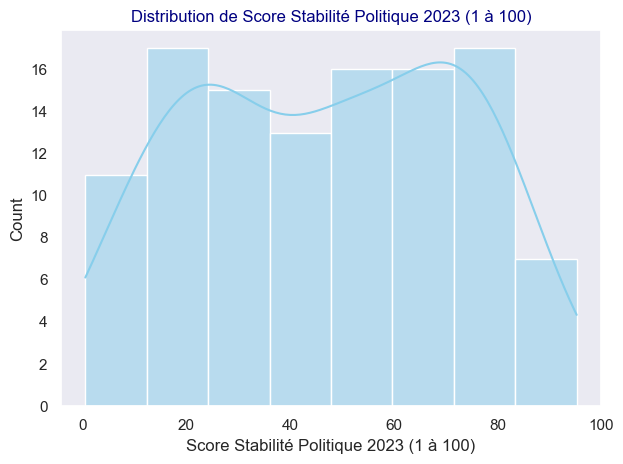

In [594]:
# Histogramme
sns.histplot(data=df_Etude_Marche_V_1_1, x=var, kde=True, color='skyblue')
plt.title(f'Distribution de {var}')
plt.tight_layout()
plt.show()

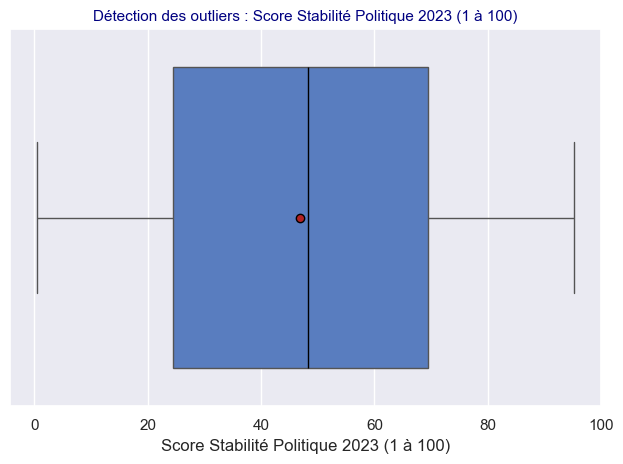

In [595]:
# Boxplot
sns.boxplot(data=df_Etude_Marche_V_1_1, 
            x=var,
            medianprops = {'color':"black"},#caract de l'indice de la médiane
            meanprops = {'marker':'o', 'markeredgecolor':'black','markerfacecolor':'firebrick'},#caract de l'indice de la moyenne
            showmeans =True, #c'est ce qui permet de faire apparaitre la moyenne,
            #, color='lightgreen'
           )
plt.title(f'Détection des outliers : {var}', fontsize=11)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

##### <font color='blue'><u>**OUTLIERS :**</u></font>

In [596]:
Q1 = (df_Etude_Marche_V_1_1[var].describe() )['25%']
Q2 = (df_Etude_Marche_V_1_1[var].describe() )['50%']
Q3 = (df_Etude_Marche_V_1_1[var].describe() )['75%']
IQ = Q3-Q1
seuil_bas_outlier = Q1-(1.5*IQ)
seuil_haut_outlier = Q3+(1.5*IQ)

print("l'intervalle interquatile IQ vaut : ",IQ,
      "\nle seuil bas  en deça duquel on est outliers est : ", round(seuil_bas_outlier,2) ,
      "\nle seuil haut au dessus duquel on est outliers est : ", round(seuil_haut_outlier,2)
     )

l'intervalle interquatile IQ vaut :  44.905213356018095 
le seuil bas  en deça duquel on est outliers est :  -42.83 
le seuil haut au dessus duquel on est outliers est :  136.79


In [597]:
#les outliers :
mask_outlier = (df_Etude_Marche_V_1_1[var]<seuil_bas_outlier)|(seuil_haut_outlier<df_Etude_Marche_V_1_1[var])
df_outlier = df_Etude_Marche_V_1_1.loc[mask_outlier,:]
nb_outlier = len(df_outlier)
prop_outlier = (nb_outlier/len(df_Etude_Marche_V_1_1))*100

print("Il y a ", nb_outlier , " 'outliers'.",
      "\nCe qui représente ", round(prop_outlier,2) ," % des pays.")
print("\nles outliers sont : ")
display(df_outlier[['iso3','pays','continent',var]].sort_values(by=var,ascending=False))

Il y a  0  'outliers'. 
Ce qui représente  0.0  % des pays.

les outliers sont : 


,iso3,pays,continent,Score Stabilité Politique 2023 (1 à 100)


##### <font color='blue'><u>**TOP et FLOP :**</u></font>

In [598]:
df_top10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .head(10)
                           )
df_top10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
0,58,ISL,Islande,Europe,-2435.512,380356,4.424618,75260.405234,3.172151,99.6,0.055185,3.6,95.260666
1,19,CHE,Suisse,Europe,-405.9947,8792182,3.703104,93636.424921,1.97104,98.8,0.387845,4.4,88.625595
2,70,LUX,Luxembourg,Europe,-384.4114,653313,12.971271,125897.199853,2.247201,98.1,2.495129,3.6,87.677727
3,16,BWA,Botswana,Africa,-8126.788,2439892,1.986686,7737.65468,0.371854,39.7,0.0,3.1,87.203789
4,46,GRD,Grenade,America,-7112.1,116913,57.456143,9509.250006,7.114045,78.9,0.0,2.5,86.25592
5,93,QAT,Qatar,Asia,-4863.478,2892455,47.121445,87974.166043,6.392373,100.0,0.067244,3.8,84.360191
6,26,CRI,Costa Rica,America,-8989.256,5081765,3.00999,13198.821717,4.136982,84.1,0.0,2.7,83.886253
7,15,BTN,Bhoutan,Asia,-7622.959,780914,3.498964,3704.344581,0.565474,94.7,0.0,2.2,83.412323
8,28,CZE,RTchèque,Europe,-995.508,10673213,6.448689,27685.147534,2.678634,95.8,0.073791,3.0,82.464455
9,107,URY,Uruguay,America,-10771.85,3390913,1.253373,20793.282962,2.739038,63.9,0.0,2.7,81.990524


In [599]:
df_flop10_pays = (df_Etude_Marche_V_1_1.sort_values(by=var,ascending=False)
                           .reset_index()
                           .tail(10)
                           )
df_flop10_pays

,index,iso3,pays,continent,dist_Commerciale_Fra (km),Population_2022,Bal_Imp-Exp_Poulet(kg/pers),PIB-Valeur par habitant(USD),Part de Volaille dans Alimentation(%),Part d'accès à Alimentation saine(%),Export Poulet Fr (kg/pers),Score Qualité Transport 2023 (1 à 5),Score Stabilité Politique 2023 (1 à 100)
102,51,HTI,Haïti,America,-7410.694,11503606,8.983686,1618.582427,1.888777,16.4,0.0,1.8,10.42654
103,59,ISR,Israël,Asia,-3151.131,9103151,-0.020705,58086.357487,6.729034,83.5,0.0,3.7,9.952606
104,56,IRN,Iran,Asia,-4213.445,89524246,1.168577,4495.146987,3.225425,84.2,0.0,2.4,8.056872
105,83,NGA,Nigéria,Africa,-4287.72,223150896,0.000726,2173.77085,0.245306,21.3,0.000005,2.4,7.582938
106,8,BFA,Burkina Faso,Africa,-3863.861,22509038,0.002209,845.760531,0.940187,36.9,0.000246,2.3,5.687204
107,23,COD,RDCongo,Africa,-5995.903,102396968,0.750833,631.770922,0.175814,8.6,0.030486,2.3,5.21327
108,17,CAF,Centrafrique,Africa,-4860.918,5098039,1.184259,429.395861,0.396833,13.3,0.020194,2.6,3.317536
109,57,IRQ,Iraq,Asia,-3783.21,44070551,10.269715,5937.195471,2.316201,73.3,0.0,2.2,2.369668
110,97,SDN,Soudan,Africa,-4456.919,49383346,0.018011,783.574675,0.240937,66.3,0.0,2.3,1.895735
111,76,MLI,Mali,Africa,-3841.125,23072640,0.016264,833.297255,0.346705,41.3,0.001164,2.0,0.473934


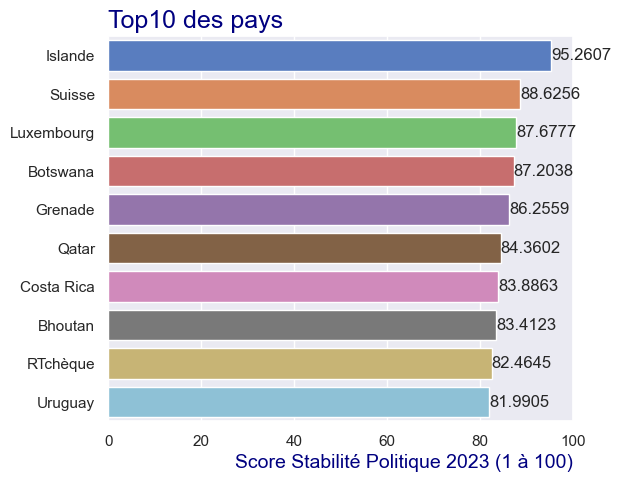

In [600]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_top10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_top10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Top10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

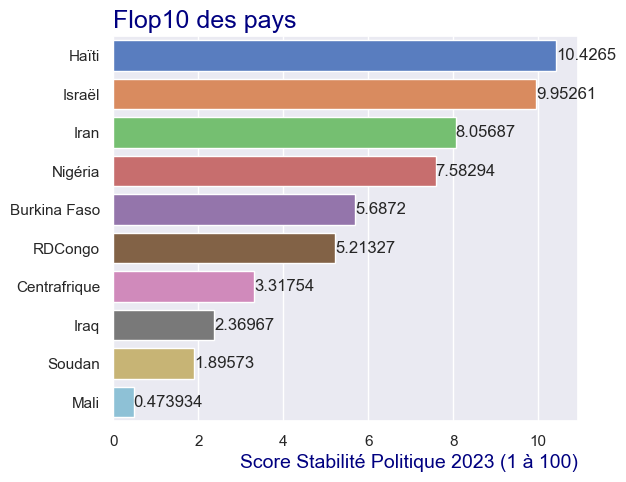

In [601]:
#ESSAI : VERSION TITRE VERTICALE

plt.figure(figsize=(6,5))
#plt.rcParams.update({'axes.labelcolor':'black'})

sns.set_theme(style='dark',palette='muted')

ax = sns.barplot(data = df_flop10_pays , 
                 y='pays',
                 x = var, errorbar=None,
                 hue='pays',legend=False,
                 palette='muted',
                 order=df_flop10_pays['pays']
                )

for x in range(0,10) :
    ax.bar_label(ax.containers[x])

plt.xlabel('')
plt.xlabel(var, loc='right',fontdict = {'fontsize' : 14,'color':'navy'})
plt.ylabel('', fontdict = {'fontsize' : 14,'color':'navy'})
plt.grid(axis='x')
#plt.xlim(1000,2500)
#plt.ylim(3300,4000)
#plt.yticks(range(3300,4000,100))
#plt.legend()
plt.title("Flop10 des pays", loc='left',
          fontdict = {'fontsize' : 18, 'color':'navy', 'verticalalignment': 'baseline'})
plt.show()

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; "> Etape Y - COMPLEMENTS </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Y.1 EXPORTS UTILES:</h3>
</div>

In [602]:
#EXPORT UTILE :
#EXPORT de ---df_A_extraire---

#df_A_extraire = 
#df_A_extraire.to_csv("Nom_Fichier_Sortie.csv",index=False)
#df_A_extraire.to_excel("Nom_Fichier_Sortie.xlsx",index=False)

In [603]:
#A ACTIVER A LA FIN
#DF des pays de df_merge_final_V_1 sortis de l'étude pour données incomplètes :

#df_pays_incomplets_hors_etude.to_csv(r"D:\BDD\OCR\P11\Selection_Sources\Sorties\pays_incomplets_hors_etude.csv",index=False)
#df_pays_incomplets_hors_etude.to_excel(r"D:\BDD\OCR\P11\Selection_Sources\Sorties\pays_incomplets_hors_etude.xlsx",index=False)

In [604]:
#A ACTIVER A LA FIN
#DF ETUDE DE MARCHE JUSTE APRES MERGE AVANT RETRAVAIL


df_Etude_Marche_V_1_1.to_csv(r"D:\BDD\OCR\P11\Selection_Sources\Sorties\Etude_Marche_Brut.csv",index=False)
#df_Etude_Marche_V_1_1.to_excel("Etude_Marche_Brut.xlsx",index=False)

In [605]:
#A ACTIVER A LA FIN
#DF ETUDE DE MARCHE JUSTE APRES MERGE AVANT EDA:


df_merge_final_V_final.to_csv(r"D:\BDD\OCR\P11\Selection_Sources\Sorties\Donnees_Etude_Marche_final_pr_Etude.csv",index=False)
#df_merge_final_V_final.to_excel("Donnees_Etude_Marche_final_pr_Etude.xlsx",index=False)

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Y.2 -BILAN DU FEATURE ENGINEERING :</h3>
</div>

In [606]:
#PRESENTATION DES VARIABLES CHOISISES ET SOURCES:

#cols_needed = ['Col1', 'Col2']
df_Feature_Engineering = pd.read_excel(r"D:\BDD\OCR\P11\Choix_Variables_3.1_et FE.xlsx", 
                                  sheet_name='Feature_Engineering'#, usecols=cols_needed
                                 )
display(df_Feature_Engineering)

,FEATURE ENGINEERING (Colonnes Calculées),Etape du FE,Conservée final,Utilisée indirectement,Non utilisée
0,'Balance_IMP-EXP_Poulet_kg',1 - préjointure,NaN,x,NaN
1,'Balance_IMP-EXP_Poulet_USD',1 - préjointure,NaN,NaN,x
2,'Part de Volaille dans Alimentation(%)',1 - préjointure,x,NaN,NaN
3,"""Part d'accès à Alimentation saine(%)""",1 - préjointure,x,NaN,NaN
4,"""Personnes accédant à Alimentation saine(Nbr)""",1 - préjointure,NaN,NaN,x
5,'Exportations Poulet Fr Prix (USD/kg)',1 - préjointure,NaN,NaN,x
6,dist_Commerciale_Fra (km)',2 - postjointure,x,NaN,NaN
7,'Bal_Imp-Exp_Poulet(kg/pers)',2 - postjointure,x,NaN,NaN
8,'Export Poulet Fr (kg/pers)',2 - postjointure,x,NaN,NaN


<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Y.3 - NETTOYAGE PYTHON:</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Y.3.1 - REMETTRE EN PLACE LES WARNINGS, SI WARNINGS DESACTIVE:</h4>
</div>

In [607]:
#Restore the warning behaviour to default : Show all warnings (even those ignored by default)
#warnings.filterwarnings('ignore')

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Y.3.2 - RAMASSE MIETTE PYTHON :</h4>
</div>

In [608]:
#NETTOYAGE DE MEMOIRE

gc.collect()  # force le nettoyage de la mémoire

62006

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Y.4 -SOURCES DES DONNEES :</h3>
</div>

##### <u>**SOURCES**</u>  

<u>**FAO :**</u>  
https://www.fao.org/faostat/fr/#data  

<u>**Banque Mondiale :**</u>  
https://donnees.banquemondiale.org/  

<u>**Données mondiales :**</u>  
https://www.donneesmondiales.com/  

<u>**CEPII :**</u>  
https://www.cepii.fr/CEPII/fr/bdd_modele/bdd_modele.asp  

<u>**ISO  :**</u>  
(pour les données manquantes ou à mettre à jour)  
https://www.iso.org/obp/ui/#home  

<div style="background-color: RGB(51,165,182);" >
<h2 style="margin: auto; padding: 20px; color:#fff; "> Etape Z - COMPLEMENTS PERSOS </h2>
</div>

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Z.1 - RECHERCHES PYTHON </h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.1 - COPY </h4>
</div>

**ATTENTION AUX SHALLOW COPY et DEEP COPY :  
Une shallow copy crée un nouvel objet mais qui poionte vers les même données que le premier=> une modification sur l'une modifie l'autre.
Il faut faire un DEEP COPY si on veut que les données soient indépendantes également**  

source : https://medium.com/@mathieuvdp/attention-au-deep-copy-de-pandas-8ebbdd5b0b92  

Bien_2 = Bien_1.copy(deep=False) =>shallow copy  
Bien_2 = Bien_1.copy(deep=True) => deep_copy

**Faire attention aux copy(deep=True)**  
**NE PAS EN ABUSER**, surtout sur des fichiers lourds.  
Au pire daire des copy(deep=True) dans le travail d'exploration.  
Puis les remplacer par des cop(deep=False), une fois que le travail est validé.  
Ou travailler sur le fichier en cours de modif quitte à relancer le Kernel si erreur.

<u>Remarque : Source utile pours la réalisation des tests statistique :</u>  
 le tableau récapitulatif d’XLSTA :  
https://help.xlstat.com/fr/6443-which-statistical-test-should-you-use 


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.2 SUPPRESSION DE LIGNES VIDES / source Nettoyage CNAM : </h4>
</div>

<u>**SUPPRESSION DE LIGNES VIDES / source Nettoyage CNAM :**</u>  

https://jhub.cnam.fr/doc/notebooks/Nettoyage_de_donnees_Python_Pandas.html  

Dans un premier temps, il peut être souhaitable de filtrer/retirer les valeurs manquantes dans le dataframe.  

Pour cela on utilise la fonction dropna().  
Cette fonction possède plusieurs arguments, permettant de moduler le niveau de filtrage des valeurs manquantes :  

axis= (0 ou 1) : filtrage des valeurs manquantes selon les lignes (axis = 0) ou les colonnes (axis=1). Valeur par défaut : axis=0.
how=all : argument permettant de ne retirer que les lignes (pour axis=0) ou toutes les colonnes (pour axis=1) du dataframe pour lequelles toutes les valeurs sont manquantes.  

Attention : si cet argument n'est pas spécifié, chaque ligne (resp. chaque colonne) contenant au moins une donnée manquante sera supprimée !  

inplace=True : applique directement la modification dans le dataframe (sans créer un autre dataframe).  
thresh= (nombre entier n) : permet de ne conserver que les lignes (resp. les colonnes) contenant au moins n valeurs non manquantes.


<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.3 Reordonner des colonnes : </h4>
</div>

**CNAM (même source que pour les lignes vides) :**  


pour REORDONNER DES COLONNES, on peut utiliser df.reindex :  

ordre_colonnes = ["country", "year", "sex", "age", "cases"]  
tub = tub.reindex(columns=ordre_colonnes    


Après Lecture de la documentation, et essais,  
Cela n'a pas l'air d'être mieux que mon classique :
tub = tub[['D','B','C','A']]  
(ou A, B C D sont les colonnes d'origines).  

En effet il semble que reindex fait également un nouvel objet.)

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.4 Travail sur les séries temporelles : </h4>
</div>

<u>Source intéressante :</u>    
https://moncoachdata.com/blog/methodes-de-series-temporelles-avec-pandas/

<u>Comprendre l'utilité des séries temporelles :</u>  
- Facilité d'usage des données de type datetime et timestamp.
- Prioriser l'utilisation de la Série en Index, donne un type Datetimeindex (qui donne plsu de fonctiosn sur le traitement temporel)
- Maitriser les fonctionnalités :
. resample : un équivalent de groupby spécifique qui ne s'applique qu'aux datetime
  pd.Grouper : permet de donner des instructions particulières d'aggrégation pour une série temporelle incluse dans un groupby classique, avec d'autres colonnes.

<u>Remarque :</u>  
Le .resample qu'à un datetime ; mais on ne peut pas faire un resample sur date+col_non_date (p ex ici date+categ)  
Pour faire un groupby sur date+categ, en gardant les caractéristiques de la date (comme sur un resample), on utilise :  
groupby(pd.grouper(conditions de resample sur date),categ).  

Exemples :  

df_Complet_daily_par_categ_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='D'), 'categ'])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_daily_par_categ_Grouper.set_index(keys='day',inplace=True)
df_Complet_daily_par_categ_Grouper

df_Complet_monthly_Grouper = (df_analyse_O1_O2_transactions_1_1.groupby([pd.Grouper(key='day',freq='ME')])
    .agg(nb_transactions=pd.NamedAgg(column='transaction_id',aggfunc='count'),
         nb_produits_distincts=pd.NamedAgg(column='id_prod',aggfunc='nunique'),
         nb_clients_distincts=pd.NamedAgg(column='client_id',aggfunc='nunique'))
    .reset_index()
)

df_Complet_monthly_Grouper.set_index(keys='day',inplace=True)
df_Complet_monthly_Grouper

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.5 Travail sur la saisonnalité :</h4>
</div>

Source STATOSCOP :  
https://blog.statoscop.fr/timeseries-4.html 

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.2.6 Division par zéro :</h4>
</div>

**Lors d'une division avec pandas (/),**  
aucun bug ne sera levé automatiquement si le dénominateur contient des zéros.  
Pandas renverra :  
. `NaN` si l’un des deux opérandes est `NaN`  
. `inf` ou `-inf` si le numérateur est non nul et le dénominateur est zéro  
. `NaN` si le numérateur et le dénominateur sont tous les deux zéro  
  
**Il n'y aura pas d’erreur Python levée,  
mais il pourrait y avoir des valeurs inf ou -inf,  
ce qui peut poser problème plus tard (dans des calculs ou exports).**

##### Option 1 : Remplacer les zéros par NaN avant la division

##### Option 2 : Utiliser np.where pour contrôler explicitement le résultat

##### Vérification après calcul :

##### **Résumé :**
- Pas de crash avec / dans pandas, mais attention aux inf
- Préférer replace(0, np.nan) ou np.where(...)
- Nettoyer ensuite les valeurs infinies si besoin

<div style="border: 1px solid RGB(51,165,182);" >
<h3 style="margin: auto; padding: 20px; color: RGB(51,165,182); ">Z.3 - DOCUMENTATIONS DU THEME</h3>
</div>

<div style="border: 1px solid RGB(88, 132, 241);" >
<h4 style="margin: auto; padding: 20px; color: RGB(88, 132, 241); "> Z.3.1 - ANALYSE PESTEL</h4>
</div>

**SOURCE :**  
https://www.lecoindesentrepreneurs.fr/analyse-pestel-definition-outil-et-composants/  
https://fr.wikipedia.org/wiki/Analyse_PESTEL

Comme nous l’avons évoqué précédemment, une analyse PESTEL prend en compte six composant (Politique, Économique, Sociologique, Technologique, Environnemental et Légal), qui sont eux même composés d’une multitude de facteurs.